# Punto 3. Deep Learning

## Parte 1. Precios

In [431]:
# Importaciones de bibliotecas estándar
import os
import re
import sys
import math
import datetime
import warnings

# Importaciones de terceros
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from joblib import dump, load
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import jarque_bera
import statsmodels.api as sm
from statsmodels.graphics.gofplots import qqplot

# Importaciones de TensorFlow y Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout, Input, LSTM, SimpleRNN
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras import backend as K


# Importaciones de sklearn
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from keras.models import Model

from statsmodels.tsa.stattools import q_stat
from statsmodels.tsa.api import acf

from tensorflow.keras.callbacks import ModelCheckpoint
import os
from joblib import dump, load

from tensorflow.keras.models import load_model


import os
from tensorflow.keras.callbacks import Callback

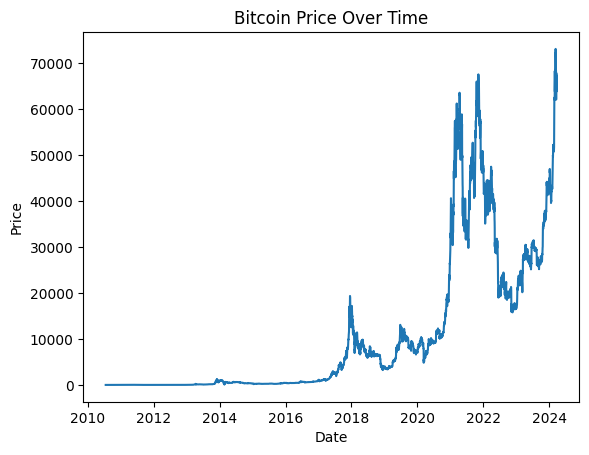

      Price_Scaled
0         0.000000
1         0.000000
2         0.000000
3         0.000000
4         0.000000
...            ...
4994      0.928663
4995      0.896498
4996      0.872981
4997      0.876434
4998      0.919875

[4999 rows x 1 columns]


In [432]:
# Leer el archivo y procesar los datos
df = pd.read_csv('bitcoin.txt', delimiter=',')#.sort_values('Date')

# Convertir 'Price' a numérico eliminando comas
df['Price'] = df['Price'].str.replace(',', '')
df['Price'] = pd.to_numeric(df['Price'])

# Convertir 'Date' a formato datetime y establecer como índice
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Ordenar el DataFrame por fecha
df = df.sort_values(by='Date', ascending=True)

# Graficar los precios
plt.plot(df.index, df['Price'])
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Bitcoin Price Over Time')
plt.show()

# Copiar la columna 'Price' a una nueva variable
df_price = df['Price'].copy()

# Crear el escalador
scaler = MinMaxScaler(feature_range=(0, 1))

# Escalar los datos
df_price_scaled = scaler.fit_transform(df_price.values.reshape(-1, 1)).flatten()

# Convertir a DataFrame si es necesario
df_price_scaled = pd.DataFrame(df_price_scaled, columns=['Price_Scaled'])

print(df_price_scaled)



### Item 1
Se construyen las funciones `create_sliding_windows(data, window_sizes, step_size, taus)` para contruir diferentes ventanas, con un avance de `step_size` y para predecir un valor de &tau; periodos adelante. 

La función: `segment_data_by_window(df, train_size, val_size, test_size)` nos permite tomar un dataset, y definir un tamaño para entrenamiento `train_size`, validación `val_size` y test `test_size` y nos devolverá segmentado el dataset en los intervalos definidos.

In [433]:
def create_sliding_windows(data, window_sizes, step_size, taus): # Función para crear las ventanas de tiempo
    result_dict = {}  # Diccionario para almacenar los DataFrames por `window_size`
    
    for w in window_sizes:    
        all_combined_dfs = []  # Para almacenar resultados combinados para el tamaño de ventana actual

        for t in taus:
            X, y = [], []
            for i in range(0, len(data) - (w + t), step_size):
                # Ventana de entrada
                X.append(data[i:i + w])
                
                # Extraer el valor específico de `tau` pasos adelante
                future_value = data[i + w + t - 1]  # -1 para índice cero
                y.append([future_value])  # Guarda solo el valor correspondiente a `tau`
            
            # Convertir X e y en DataFrames
            df_X = pd.DataFrame(np.array(X).squeeze())  # Asegura que sea un array 2D (n, w)
            df_y = pd.DataFrame(y, columns=[f'Tau_{t}'])  # Solo la columna para el tau actual
            
            # Combinar los DataFrames de X e y
            df_combined = pd.concat([df_X, df_y], axis=1)
            all_combined_dfs.append(df_combined)
        
        # Combina todos los resultados para el tamaño de ventana actual
        final_df = pd.concat(all_combined_dfs, axis=0).reset_index(drop=True)
        
        # Guarda en el diccionario
        result_dict[f'Window_{w}'] = final_df
    
    return result_dict

In [434]:
def segment_data_by_window(df, train_size, val_size, test_size): # Función para segmentar los datos en train, validation y test
    train_data, val_data, test_data = [], [], []
    i = 0
    while i + train_size + val_size + test_size <= len(df):
        # Segmento de entrenamiento
        train_data.append(df.iloc[i:i + train_size])
        # Segmento de validación
        val_data.append(df.iloc[i + train_size:i + train_size + val_size])
        # Segmento de prueba
        test_data.append(df.iloc[i + train_size + val_size:i + train_size + val_size + test_size])
        
        # Mover el índice al siguiente bloque
        i += train_size + val_size + test_size
    
    # Concatenar los segmentos de datos
    train_data = pd.concat(train_data).reset_index(drop=True)
    val_data = pd.concat(val_data).reset_index(drop=True)
    test_data = pd.concat(test_data).reset_index(drop=True)

    return train_data, val_data, test_data,df


### Item 2. 
Para validar si nuestra segmentación de hizo de manera correcta se define la función `plot_segmented_data(train_data, train_labels, val_data, val_labels, test_data, test_labels, s_date, e_date) `que requiere que se le ingrese los valores resultantes de la función de segmentar  `segment_data_by_window(df, train_size, val_size, test_size)`, ejecutada sobre los index y sobre los valores de nuestro dataframe original.


In [435]:
def plot_segmented_data(train_data, train_labels, val_data, val_labels, test_data, test_labels, s_date, e_date): # Graficar datos segmentados
    # Convertir fechas de inicio y fin a objetos datetime
    start_date = pd.to_datetime(s_date)
    end_date = pd.to_datetime(e_date)

    # Crear la figura
    plt.figure(figsize=(12, 8))

    # Función para graficar segmentos
    def plot_segment(data, labels, color, label_type):
        for index in range(len(data)):
            original_index = index + 1  # Usar el número de fila para el eje y
            row_values = data.iloc[index].values  # Obtener los valores correspondientes
            row_dates = labels.iloc[index].values  # Obtener las fechas correspondientes
            
            for i, (value, date) in enumerate(zip(row_values, row_dates)):
                # Asegurarse de que la fecha sea un Timestamp
                date = pd.to_datetime(date)

                # Verificar si la fecha está dentro del rango
                if start_date <= date <= end_date:
                    # Colorear siempre la columna Tau en rojo
                    point_color = 'red' if i == (data.shape[1] - 1) else color
                    plt.plot(date, original_index, 'o', color=point_color)  # Usar el número de fila como el eje y
                    plt.text(date, original_index + 0.1, f'{value:.2f}', fontsize=6, ha='center')

    # Graficar cada segmento con sus respectivos colores
    plot_segment(train_data, train_labels, 'blue', "Train")  # Datos de entrenamiento en azul
    plot_segment(val_data, val_labels, 'orange', "Validation")  # Datos de validación en naranja
    plot_segment(test_data, test_labels, 'green', "Test")  # Datos de prueba en verde

    plt.xlabel("Fechas")
    plt.ylabel("Número de Fila")
    plt.title("Gráfico de Números de Fila vs Fechas con Segmentación Real (Train, Validation, Test)")

    # Limitar el rango del eje X
    plt.xlim(start_date, end_date)

    # Rotar las fechas para mejor visibilidad
    plt.gcf().autofmt_xdate()
    plt.show()

A continuación mostramos la ejecución para un tamaño de ventana `www = 7` y &tau;= 3 periodos adelante, en el rango de fecha `s_date, e_date`

Train Labels:               0          1          2          3          4          5  \
0    2010-07-18 2010-07-19 2010-07-20 2010-07-21 2010-07-22 2010-07-23   
1    2010-07-19 2010-07-20 2010-07-21 2010-07-22 2010-07-23 2010-07-24   
2    2010-07-20 2010-07-21 2010-07-22 2010-07-23 2010-07-24 2010-07-25   
3    2010-07-21 2010-07-22 2010-07-23 2010-07-24 2010-07-25 2010-07-26   
4    2010-07-22 2010-07-23 2010-07-24 2010-07-25 2010-07-26 2010-07-27   
...         ...        ...        ...        ...        ...        ...   
2487 2024-02-20 2024-02-21 2024-02-22 2024-02-23 2024-02-24 2024-02-25   
2488 2024-02-21 2024-02-22 2024-02-23 2024-02-24 2024-02-25 2024-02-26   
2489 2024-02-22 2024-02-23 2024-02-24 2024-02-25 2024-02-26 2024-02-27   
2490 2024-02-23 2024-02-24 2024-02-25 2024-02-26 2024-02-27 2024-02-28   
2491 2024-02-24 2024-02-25 2024-02-26 2024-02-27 2024-02-28 2024-02-29   

              6      Tau_3  
0    2010-07-24 2010-07-27  
1    2010-07-25 2010-07-28  
2    2010-

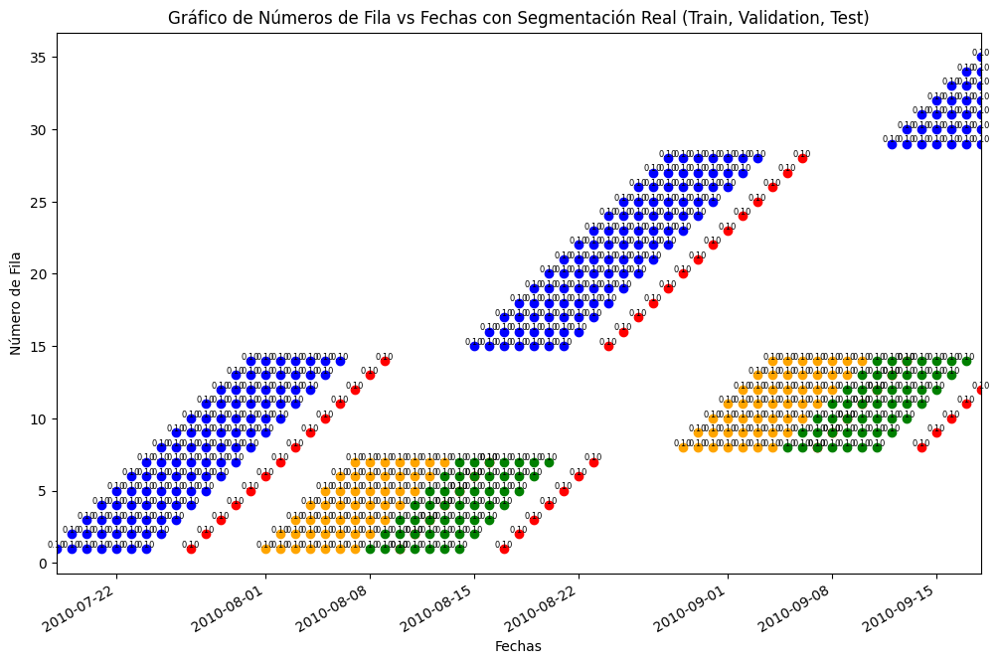

In [436]:
# Definir parámetros
www = 7  # Tamaño de la ventana
step_size = 1
taus = [3]  # Horizonte de predicción

# Crear ventanas de datos
result_dict = create_sliding_windows(data=df_price.values, window_sizes=[www], step_size=step_size, taus=taus)
train_data, val_data, test_data,df = segment_data_by_window(result_dict[f'Window_{www}'], train_size=2*www, val_size=www, test_size=www)

# Crear ventanas de etiquetas (fechas) usando el índice como las fechas
result_dict_labels = create_sliding_windows(data=df_price.index, window_sizes=[www], step_size=step_size, taus=taus)
train_labels, val_labels, test_labels,df_labels = segment_data_by_window(result_dict_labels[f'Window_{www}'], train_size=2*www, val_size=www, test_size=www)

# Verificar los datos de etiquetas
print("Train Labels:", train_labels)
print("Validation Labels:", val_labels)
print("Test Labels:", test_labels)

# Definir fechas de inicio y fin para graficar
s_date, e_date = ('2010-07-18', '2010-09-18')

# Llamar a la función para graficar
plot_segmented_data(train_data, train_labels, val_data, val_labels, test_data, test_labels, s_date, e_date)

En la gráfica se puede observar como los datos quedan en bloques azules, naranjas y verdes, representando entrenamiento, validación y test. El rojo nos indica el valor que estaremos prediciendo. 

Mostrando de esta forma los plieges de tamaños `[2*www, www+&tau;]` para entrenamientos, `[www, www+&tau;]` para validación y `[www, www+&tau;]` para pruebas, intercalados hasta `T = len(Data)-w` periodos. 

### Item 3.


Con la función `create_RNN(neurons, input_shape, activation,dropout_rate)`, se crea una red neuronal recurrente, con `hidden_unit` número de neuronas, con una forma de `input_shape`de arreglo `(x,y)`, donde `x`es la ventana de tiempo en la que estemos reorganizando nuestra serie y `y` el numero de variables diferentes que se contemplen.

#### RNN

In [437]:
def root_mean_squared_error(y_true, y_pred):# Definir RMSE como métrica personalizada
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# Definir R^2 como métrica personalizada
def r_squared(y_true, y_pred):
    residual = K.sum(K.square(y_true - y_pred))
    total = K.sum(K.square(y_true - K.mean(y_true)))
    r2 = 1 - residual / (total + K.epsilon())
    return r2

In [438]:
def create_RNN(neurons, input_shape, activation, dropout_rate):  # crear RNN, y compilar errores MAE, MAPE, MSE, RMSE y R2
    model_RNN = Sequential()
    model_RNN.add(SimpleRNN(neurons, input_shape=input_shape, 
                            activation=activation, return_sequences=False))  # Asegúrate de return_sequences=False
    model_RNN.add(Dropout(dropout_rate))
    model_RNN.add(Dense(1))  # Capa de salida para un solo valor de predicción, porque estamos haciendo predicciones de una en una. 
    model_RNN.compile(loss='mean_squared_error', optimizer='adam', metrics=[
        'mean_absolute_error',           # MAE
        'mean_absolute_percentage_error', # MAPE
        'mean_squared_error',             # MSE
        root_mean_squared_error,          # RMSE
        r_squared                        # R²
    ])
    return model_RNN

In [439]:
def errors(y_pred, y_real): #funcion para el calculo de los errores
    
    mae = mean_absolute_error(y_real, y_pred)
    mape = 100*(sum(abs(((y_real - y_pred)/y_real)))/len(y_real))
    mse = mean_squared_error(y_real , y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_real, y_pred)
    
    return mae, mape, mse, rmse, r2      


#### MLP (Multilayer Perceptrón)

Con la función `create_mlp(neurons, dropout_rate, www)`, se crea una red neuronal MLP, con `neurons` número de neuronas, con una forma de `www`de arreglo `(www,y)`, donde `x`es la ventana de tiempo en la que estemos reorganizando nuestra serie y `y` el numero de variables diferentes que se contemplen.

In [440]:
def create_mlp(neurons, dropout_rate,www): #crear el modelo MLP, compilando los errores MAE, MAPE, MSE, RMSE y R2
    
    input_layer = Input(shape=(www,), dtype='float32')
    dense_layer = Dense(neurons, activation='tanh')(input_layer)
    dropout_layer = Dropout(dropout_rate)(dense_layer)
    output_layer = Dense(1, activation='linear')(dropout_layer)
    
    model_MLP = Model(inputs=input_layer, outputs=output_layer)
    model_MLP.compile(loss='mean_squared_error', optimizer='adam', metrics=[
        'mean_absolute_error',           # MAE
        'mean_absolute_percentage_error', # MAPE
        'mean_squared_error',             # MSE
        root_mean_squared_error,          # RMSE (definido arriba)
        r_squared                        # R² (definido arriba)
    ])
    
    return model_MLP

In [441]:
def assumptions(residuals): #evaluacion de supuestos

    warning = ""
    a = 0
    l = 10
    
    if len(residuals) < 10:
        l = 4
    #Independency
    #H0: The residuals are independent.
    #H1: The residuals aren't independent.    
    ljung_box_test = acorr_ljungbox(residuals, lags=l, return_df=True)
    ljung_box_pvalue = ljung_box_test['lb_pvalue'].values[0]
    
    if ljung_box_pvalue < 0.05:
        warning= warning + " The residuals aren't independent"
        a=a+1

    #Normality test
    #H0: The residuals have a normal distribution.
    #H1: The residuals don't have a normal distribution.
    jb_stat, jb_pvalue, skewness, kurtosis = jarque_bera(residuals)

    if jb_pvalue < 0.05:
        a = a+1
        warning = warning + " The residuals do not follow a normal distribution"

    return jb_pvalue, ljung_box_pvalue

In [442]:
def plot_residuals(residuals): #graficos supuestos
    plt.figure(figsize=(12, 12))

    #Serie de residuos
    plt.subplot(3, 1, 1)
    plt.plot(residuals, label='Residuos', color='blue')
    plt.axhline(0, color='red', linestyle='--')
    plt.title('Serie de Residuos')
    plt.xlabel('Índice')
    plt.ylabel('Residuo')
    plt.legend()

    #QQ Plot
    plt.subplot(3, 1, 2)
    sm.qqplot(residuals, line='s', ax=plt.gca())
    plt.title('QQ Plot de Residuos')

    #ACF de residuos
    plt.subplot(3, 1, 3)
    plot_acf(residuals, ax=plt.gca())
    plt.title('ACF de Residuos')

    plt.subplots_adjust(hspace=0.4)
    plt.tight_layout()
    plt.show()

###LSTM

Con la función `create_lstm(neurons, dropout_rate, www)`, se crea una red neuronal LSTM, con `neurons` número de neuronas, con una forma de `input_shape`de arreglo `(x,y)`, donde `x`es la ventana de tiempo en la que estemos reorganizando nuestra serie y `y` el numero de variables diferentes que se contemplen.

In [443]:
def create_lstm(neurons, dropout_rate, www): # Crear red LSTM y compilar errores MAE, MAPE, MSE, RMSE y R2 
    input_layer = Input(shape=(www, 1), dtype='float32')
    
    lstm_layer1 = LSTM(neurons, input_shape=(www, 1), return_sequences=False)(input_layer)
    
    dropout_layer = Dropout(dropout_rate)(lstm_layer1)
    output_layer = Dense(1, activation='linear')(dropout_layer) # Se define una única salida porque necesitamos pronósticar 1 a 1 los periodos.
    
    model_LSTM = Model(inputs=input_layer, outputs=output_layer)
    model_LSTM.compile(loss='mean_squared_error', optimizer='adam', metrics=[
        'mean_absolute_error',           # MAE
        'mean_absolute_percentage_error', # MAPE
        'mean_squared_error',             # MSE
        root_mean_squared_error,          # RMSE
        r_squared                        # R²
    ])
    
    return model_LSTM


In [444]:
class ManualR2Callback(Callback): #Calculo del r2 como métrica personalizada e incluirse en el History. 
    def __init__(self, X_val, y_val):
        super(ManualR2Callback, self).__init__()
        self.X_val = X_val
        self.y_val = y_val

    def on_epoch_end(self, epoch, logs=None):
        val_predictions = self.model.predict(self.X_val).flatten()
        val_r2 = r2_score(self.y_val, val_predictions)
        print(f"Epoch {epoch + 1}: Validation R2 Score = {val_r2:.4f}")


In [445]:
def select_best_model(model, model_type, neurons, dropout, batch_size, epochs, X_train, y_train, X_val, y_val, X_test, y_test, return_history, window_size, tau,serie):
    # Crear subdirectorio para el tamaño de ventana específico
    model_dir = f'modelos_{serie}/models_window_{window_size}_tau_{tau}'
    os.makedirs(model_dir, exist_ok=True)

    # Nombre lógico del archivo basado en los parámetros del modelo
    base_filename = f'{model_type}_{neurons}neurons_{dropout}dropout_batch{batch_size}_window{window_size}_tau{tau}'
    model_filename = os.path.join(model_dir, f'{base_filename}_best_model.keras')
    history_filename = os.path.join(model_dir, f'{base_filename}_history.joblib')
    
    # Callback para guardar el mejor modelo
    save_best = ModelCheckpoint(model_filename, monitor='val_mean_squared_error', verbose=1,
                                save_best_only=True, mode='min', save_weights_only=False)
    
    # Callback para calcular R2 manual al final de cada época
    manual_r2_callback = ManualR2Callback(X_val, y_val)
    
    # Variable para decidir si entrenar un nuevo modelo
    load_new_model = True
    best_val_mse = float('inf')
    existing_epochs = 0

    # Cargar historial previo si existe y verificar el val_mean_squared_error y las épocas
    if os.path.exists(history_filename):
        history_data = load(history_filename)
        existing_epochs = len(history_data['loss'])
        if 'val_mean_squared_error' in history_data:
            best_val_mse = min(history_data['val_mean_squared_error'])

        # Comprobar si el modelo existente tiene mejor val_mean_squared_error y mayor o igual épocas
        if best_val_mse <= history_data['val_mean_squared_error'][-1] and existing_epochs >= epochs:
            print(f"Modelo previo con mejor val_mean_squared_error ({best_val_mse}) y más épocas ({existing_epochs}). No se reemplazará.")
            load_new_model = False
        else:
            print(f"Se entrenará con {epochs} y actualizará si mejora el rendimiento.")

    # Entrenar y guardar el modelo si se requiere uno nuevo
    if load_new_model:
        # Entrenar el modelo y guardar el historial
        history = model.fit(x=X_train, y=y_train, batch_size=batch_size, epochs=epochs,
                            verbose=2, callbacks=[save_best, manual_r2_callback], validation_data=(X_val, y_val),
                            shuffle=True)
        
        # Guardar el historial en el archivo .joblib
        history_data = history.history
        
        # Evaluar el mejor modelo en el conjunto de prueba
        test_results = model.evaluate(X_test, y_test, verbose=0)
        test_metrics = {f'test_{metric}': value for metric, value in zip(model.metrics_names, test_results)}
        
        # Agregar métricas de prueba al historial
        for metric, value in test_metrics.items():
            history_data[metric] = [value]
        
        # Guardar el historial con las métricas de prueba
        dump(history_data, history_filename)
        print(f"El entrenamiento se ha completado y el historial se guardó en '{history_filename}'")

    # Verificar y cargar el mejor modelo guardado
    if os.path.exists(model_filename):
        print(f"El mejor modelo guardado está en '{model_filename}'")
        best_model = load_model(model_filename, custom_objects={
            'root_mean_squared_error': root_mean_squared_error,
            'r_squared': r_squared
        })
    else:
        print("No se encontró un modelo previo con mejor val_mean_squared_error.")
        best_model = model

    # Retornar el mejor modelo y el historial, si es necesario
    if return_history:
        return best_model, history_data
    else:
        return best_model

La función  `select_best_model(model, model_type, neurons, dropout, batch_size, epochs, X_train, y_train, X_val, y_val, X_test, y_test, return_history, window_size, tau):` está definida con el propósito de optimizar el entrenamiento de modelos de redes neuronales. Para el conjunto de datos con el que se entrene, crea un conjunto de carpetas en el directorio activo, en la que guarda para cada ventana `window_size` y `tau`, un identificador único del modelo con la estructura de `model_#neurons_#.#dropout_batch##`, lo cual permite realizar pronósticos de manera precisa para cada combicación de estos parámetros, en la ventana y tau necesarios. 

Adicionalmente, entrena los modelos en los conjuntos `X_train` y `y_train` y compila todos las métricas de error las cuales valida en cada epoca de entrenamiento y son validadas en los conjuntos de datos `x_val`y `y_val`. 

Al final, calcula el MSE, totalizado que resulte de utilizar el modelo en `X_test`  y predecir `y_test`

In [446]:
def cargar_modelo_correcto(model_name, neurons, dropout, batch_size, window_size, tau):
    
    model_dir = f'models_window_{window_size}_tau_{tau}'
    base_filename = f"{model_name}_{neurons}neurons_{dropout}dropout_batch{batch_size}_window{window_size}_tau{tau}_best_model.keras"
    model_path = os.path.join(model_dir, base_filename)
    
    # Cargar el modelo si existe
    if os.path.exists(model_path):
        print(f"Cargando modelo desde: {model_path}")
        modelo = load_model(model_path, custom_objects={
            'root_mean_squared_error': root_mean_squared_error,
            'r_squared': r_squared
        })
        return modelo
    else:
        print(f"Modelo no encontrado en la ruta: {model_path}")
        return None


### Item 3, 6 y 7 Ciclo de iteración de modelos

In [447]:
window_sizes = [7,14]#,21,28  # Se restringió intencionalmente el tamaño del número de ventanas, por restricciones computacionales
step_size = 1
predictions_dict = {}
error_dict = {}
history_MLP = {}
history_RNN = {}
history_LSTM = {}

# Diccionarios para almacenar matrices y predicciones multivariadas
trainX_matrices = {}
trainY_matrices = {}
valX_matrices = {}
valY_matrices = {}
testX_matrices = {}
testY_matrices = {}
predictions_multivariate = {'MLP': {}, 'RNN': {}, 'LSTM': {}}

# Inicialización de predictions_multivariate para todos los valores de tau de 1 a 28, 
# con el fin de garantizar todas las combinaciones de 
# dim(X(j)train) = (M(j)rows,N(j)cols) con M(j)rows,N(j)cols = 7, 14, 21, 28 #

for www in window_sizes:
    for model_name in ['MLP', 'RNN', 'LSTM']:
        predictions_multivariate[model_name][www] = {}  # Usar www directamente como el valor individual extraído de la lista
        for tau in range(1, 29):  # Inicializa para el rango completo de tau
            predictions_multivariate[model_name][www][f'Train_Pred_tau_{tau}'] = []
            predictions_multivariate[model_name][www][f'Val_Pred_tau_{tau}'] = []
            predictions_multivariate[model_name][www][f'Test_Pred_tau_{tau}'] = []

for www in window_sizes:
    trainX_matrices[www] = {}
    trainY_matrices[www] = {}
    valX_matrices[www] = {}
    valY_matrices[www] = {}
    testX_matrices[www] = {}
    testY_matrices[www] = {}
    history_MLP[www] = {}
    history_RNN[www] = {}
    history_LSTM[www] = {}

    # Variables para almacenar el mejor modelo seleccionado
    best_model_MLP = None
    best_model_RNN = None
    best_model_LSTM = None
    
    # Punto 3 Item 6. En esta parte del códidgo se van creando las ventanas de tamaño www
    # para tau periodos, con el fin de encontrar el mejor modelo, se predicen los tau de uno en uno
    # posteriormente guardan las predicciones en en arreglo predictions_multivariate[model][www][iii]
    # y subsecuentemente se guardan también en una arreglo matricial del estilo "_matrices[www][iii]", 
    # los valores con los que se preparó el modelo de la ventana www para predecir el peridodo iii
    
    for iii in range(1, 2):  
        # Crear ventanas deslizantes y dividir datos en segmentos para cada tau
        result_dict = create_sliding_windows(data=df_price_scaled.values.flatten(), window_sizes=window_sizes, step_size=step_size, taus=[iii])
        train_data, val_data, test_data, df = segment_data_by_window(result_dict[f'Window_{www}'], train_size=2*www, val_size=www, test_size=www)
        
        # Asignar y transformar datos
        trainX = np.asarray(train_data.iloc[:, 0:www].values, dtype=float).reshape((len(train_data), www, 1))
        trainY = np.asarray(train_data.iloc[:, www].values, dtype=float).ravel()
        valX = np.asarray(val_data.iloc[:, 0:www].values, dtype=float).reshape((len(val_data), www, 1))
        valY = np.asarray(val_data.iloc[:, www].values, dtype=float).ravel()
        testX = np.asarray(test_data.iloc[:, 0:www].values, dtype=float).reshape((len(test_data), www, 1))
        testY = np.asarray(test_data.iloc[:, www].values, dtype=float).ravel()
        
        # Punto 3, item 7. A partir de aquí consideramos todas las variaciones durante la construccion del modelo
        # Seleccionamos el mejor modelo con las función select_best_model() anteriormente definida
        # por limitaciones computacionales se restringió el número de combinaciones de los parámetros solicitados en el parcial
        
        
        dropout_rates = [0.2, 0.4, 0.6]#, 0.8]  
        neurons_list = [10, 100, 1000]#, 10000]    
        batch_sizes = [16, 32, 64]#, 128]   
            
        for dropout_rate in dropout_rates:
            for neurons in neurons_list:
                for batch_size in batch_sizes:
                    print(f"Evaluando: Neuronas: {neurons}, Dropout: {dropout_rate}, Batchsize: {batch_size}")

                    # Crear y compilar modelos
                    model_MLP = create_mlp(neurons, dropout_rate, www)
                    model_RNN = create_RNN(neurons, input_shape=(www, 1), activation='tanh', dropout_rate=dropout_rate)
                    model_LSTM = create_lstm(neurons, dropout_rate, www)

                    # Compilar los modelos con las métricas especificadas
                    for model in [model_MLP, model_RNN, model_LSTM]:
                        model.compile(optimizer='adam', loss='mse', metrics=[
                            'mean_absolute_error',            # MAE
                            'mean_absolute_percentage_error', # MAPE
                            'mean_squared_error',             # MSE
                            root_mean_squared_error,          # RMSE
                            r_squared                        # R²
                        ])

                    # Seleccionar el mejor modelo y guardarlo con un nombre que incluye los parámetros
                    best_model_MLP = select_best_model(model_MLP, 'MLP', neurons, dropout_rate,
                                                    batch_size, epochs=30, X_train=trainX, y_train=trainY,
                                                    X_val=valX, y_val=valY, X_test=testX,y_test=testY,return_history=False,window_size=www,tau=iii,serie='precios')
                    
                    best_model_RNN = select_best_model(model_RNN, 'RNN', neurons, dropout_rate,
                                                    batch_size, epochs=30, X_train=trainX, y_train=trainY,
                                                    X_val=valX, y_val=valY,X_test=testX,y_test=testY, return_history=False,window_size=www,tau=iii,serie='precios')
                    
                    best_model_LSTM = select_best_model(model_LSTM, 'LSTM', neurons, dropout_rate,
                                                        batch_size, epochs=30, X_train=trainX, y_train=trainY,
                                                        X_val=valX, y_val=valY, X_test=testX,y_test=testY,return_history=False,window_size=www,tau=iii,serie='precios')

        # Almacenar predicciones como listas en lugar de DataFrames
        for model_name, model in zip(['MLP', 'RNN', 'LSTM'], [best_model_MLP, best_model_RNN, best_model_LSTM]):
            predictions_multivariate[model_name][www][f'Train_Pred_tau_{iii}'] = model.predict(trainX).flatten().tolist()
            predictions_multivariate[model_name][www][f'Val_Pred_tau_{iii}'] = model.predict(valX).flatten().tolist()
            predictions_multivariate[model_name][www][f'Test_Pred_tau_{iii}'] = model.predict(testX).flatten().tolist()

        trainX_matrices[www][iii] = trainX
        trainY_matrices[www][iii] = trainY
        valX_matrices[www][iii] = valX
        valY_matrices[www][iii] = valY
        testX_matrices[www][iii] = testX
        testY_matrices[www][iii] = testY

Evaluando: Neuronas: 10, Dropout: 0.2, Batchsize: 16
Modelo previo con mejor val_mean_squared_error (0.00019602409156505018) y más épocas (30). No se reemplazará.
El mejor modelo guardado está en 'modelos_precios/models_window_7_tau_1\MLP_10neurons_0.2dropout_batch16_window7_tau1_best_model.keras'
Modelo previo con mejor val_mean_squared_error (0.00022180931409820914) y más épocas (30). No se reemplazará.
El mejor modelo guardado está en 'modelos_precios/models_window_7_tau_1\RNN_10neurons_0.2dropout_batch16_window7_tau1_best_model.keras'
Modelo previo con mejor val_mean_squared_error (0.000194845866644755) y más épocas (30). No se reemplazará.
El mejor modelo guardado está en 'modelos_precios/models_window_7_tau_1\LSTM_10neurons_0.2dropout_batch16_window7_tau1_best_model.keras'
Evaluando: Neuronas: 10, Dropout: 0.2, Batchsize: 32
Modelo previo con mejor val_mean_squared_error (0.00019593209435697645) y más épocas (30). No se reemplazará.
El mejor modelo guardado está en 'modelos_preci

Este ciclo de iteración de modelos es el núcleo que compila, todas las demás funciones creadas anteriormente. La lógica de funcionamiento es la siguientes:

Para cada ventana en `window_size`, itera sobre los `tau` periodos requeridos. Barajando el dataframe, en ventanas de tamaño www a través de `create_sliding_windows(...)` con tau periodos, y luego crea un pliego con `segment_data_by_window(...)` que segmenta el data frame en train, val y test, que se usan para la función `select_best_model(...)`. Esta última se encuentra incluida en un ciclo de entrenamiento que varía los parámetros de los modelos(`neurons`,`dropout_rate` y`batch_size`), con el fin de utilizar la mejor combinación de parámetros para predecir el tau periodo. 

Una vez se encuentra el mejor modelo, se utiliza para construir lista de `predicctions_multivariate[Model][www][...iii]` que alamacena la información de las predicciones, para posteriormente ser comparadas con los pliegos que quedan almacenados en matrices de forma `..._matrices[www][iii]`

Las épocas de entrenamiento se fijaron a discreción 30 periodos al ver que los modelos convergian a una minimo de error, como se visualizará mas adelante.

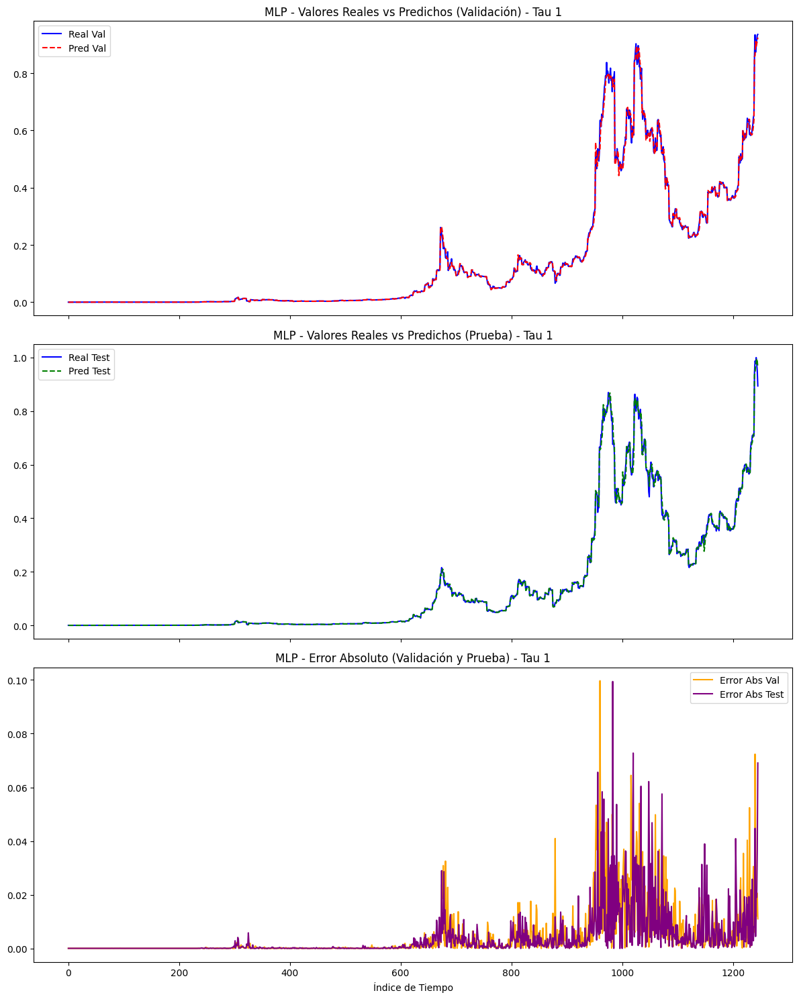

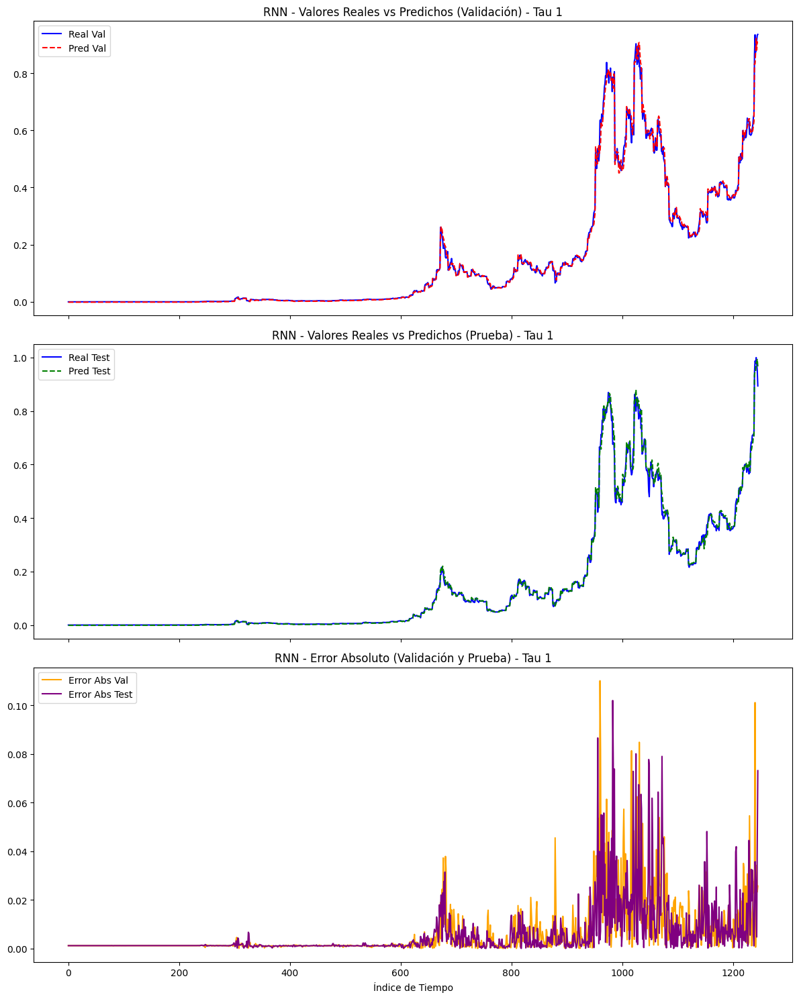

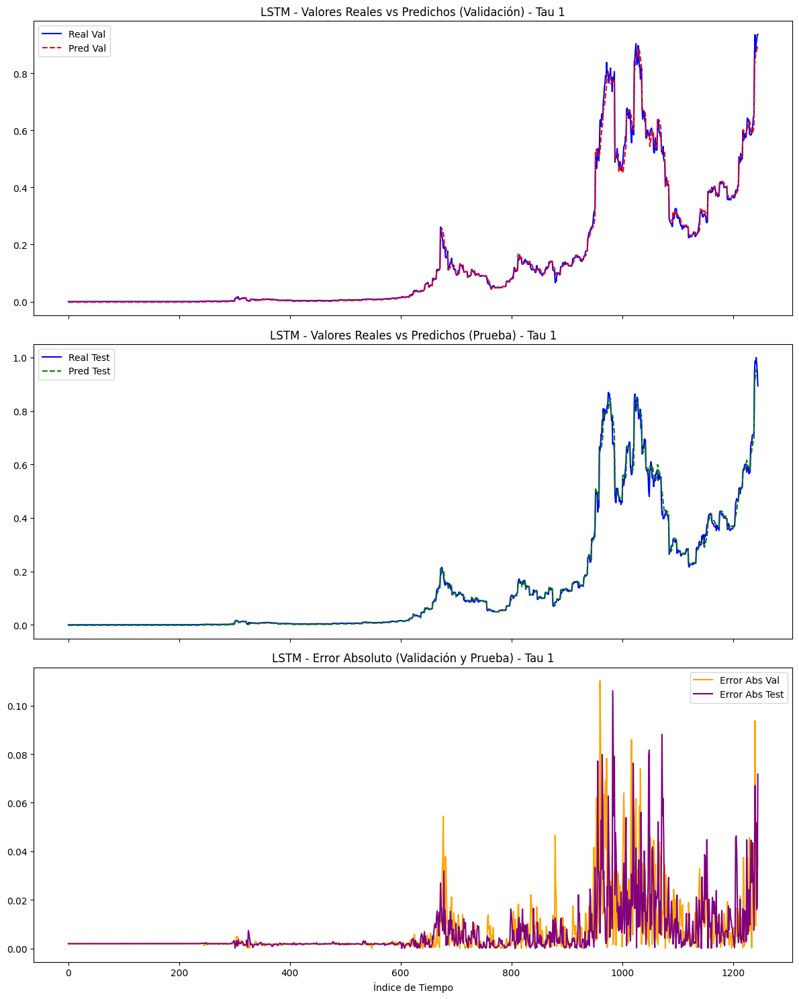

In [448]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def graficar_valores_y_errores(predictions_multivariate, trainY_matrices, valY_matrices, testY_matrices, window_size, modelo):
    """
    Genera gráficos para comparar los valores reales y predichos, junto con el error absoluto,
    para los conjuntos de validación y prueba.
    """
    for tau in range(1, 2):  # Cambia el rango de tau si tienes más ventanas
        # Obtener valores reales y predichos
        real_train = trainY_matrices[window_size][tau]
        real_val = valY_matrices[window_size][tau]
        real_test = testY_matrices[window_size][tau]
        
        pred_train = predictions_multivariate[modelo][window_size][f'Train_Pred_tau_{tau}']
        pred_val = predictions_multivariate[modelo][window_size][f'Val_Pred_tau_{tau}']
        pred_test = predictions_multivariate[modelo][window_size][f'Test_Pred_tau_{tau}']
        
        # Calcular el error absoluto
        error_abs_val = np.abs(np.array(real_val) - np.array(pred_val))
        error_abs_test = np.abs(np.array(real_test) - np.array(pred_test))
        
        # Configurar la gráfica
        fig, axes = plt.subplots(3, 1, figsize=(12, 15), sharex=True)
        
        # Gráfica 1: Valores Reales vs Predichos - Validación
        axes[0].plot(real_val, label='Real Val', color='blue')
        axes[0].plot(pred_val, label='Pred Val', color='red', linestyle='--')
        axes[0].set_title(f'{modelo} - Valores Reales vs Predichos (Validación) - Tau {tau}')
        axes[0].legend()
        
        # Gráfica 2: Valores Reales vs Predichos - Prueba
        axes[1].plot(real_test, label='Real Test', color='blue')
        axes[1].plot(pred_test, label='Pred Test', color='green', linestyle='--')
        axes[1].set_title(f'{modelo} - Valores Reales vs Predichos (Prueba) - Tau {tau}')
        axes[1].legend()

        # Gráfica 3: Error Absoluto para Validación y Prueba
        axes[2].plot(error_abs_val, label='Error Abs Val', color='orange')
        axes[2].plot(error_abs_test, label='Error Abs Test', color='purple')
        axes[2].set_title(f'{modelo} - Error Absoluto (Validación y Prueba) - Tau {tau}')
        axes[2].legend()
        
        plt.xlabel("Índice de Tiempo")
        plt.tight_layout()
        plt.show()

# Ejemplo de uso
# Para visualizar las gráficas para cada modelo y ventana
for modelo in ['MLP', 'RNN', 'LSTM']:
    graficar_valores_y_errores(predictions_multivariate, trainY_matrices, valY_matrices, testY_matrices, window_size=7, modelo=modelo)


Se realiza comparación de los errores absolutos en los conjuntos de validación y prueba evidenciando un comportamiento significativamente parecido en los respectivos pliegos. En cada uno de los modelos probados. 

#### item 4

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\62211460.py:27: RuntimeWarning:

divide by zero encountered in divide

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\62211460.py:46: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



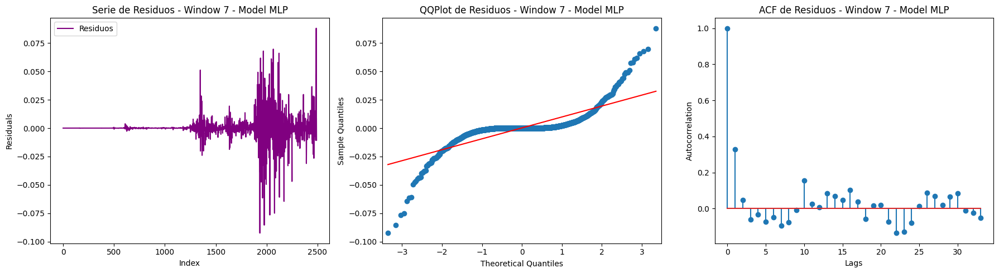

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\62211460.py:27: RuntimeWarning:

divide by zero encountered in divide



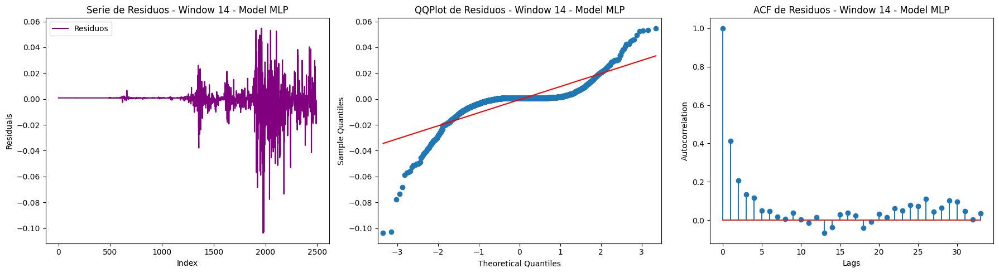

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\62211460.py:27: RuntimeWarning:

divide by zero encountered in divide



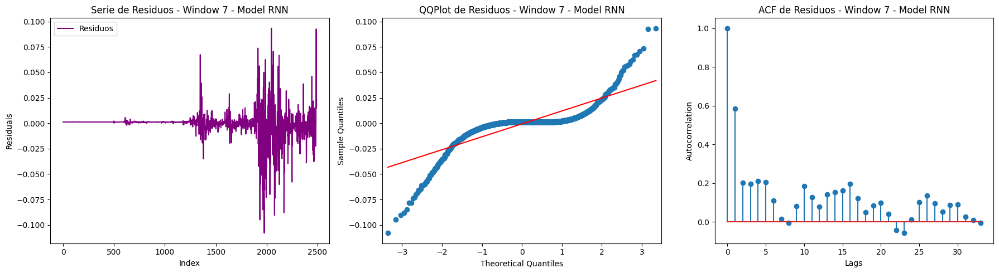

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\62211460.py:27: RuntimeWarning:

divide by zero encountered in divide



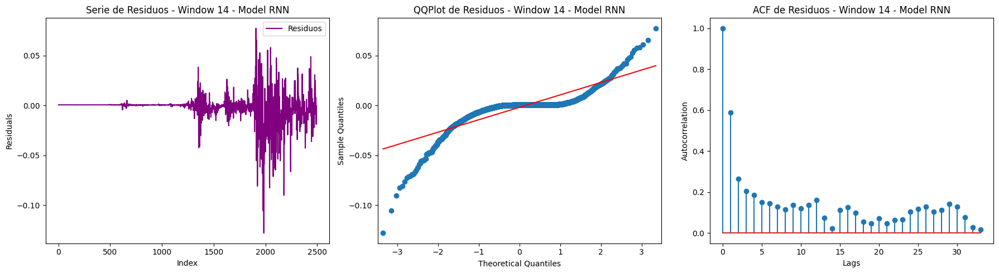

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\62211460.py:27: RuntimeWarning:

divide by zero encountered in divide



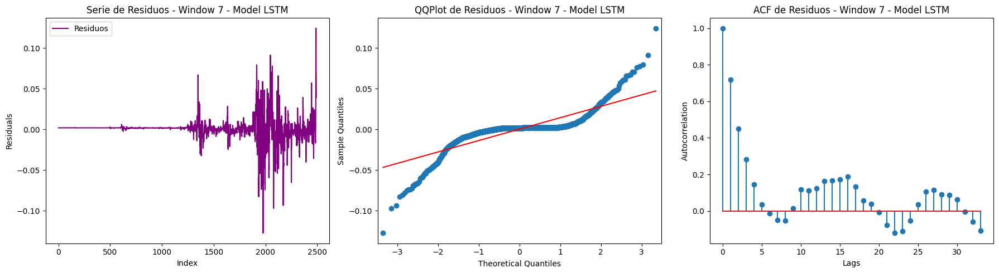

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\62211460.py:27: RuntimeWarning:

divide by zero encountered in divide



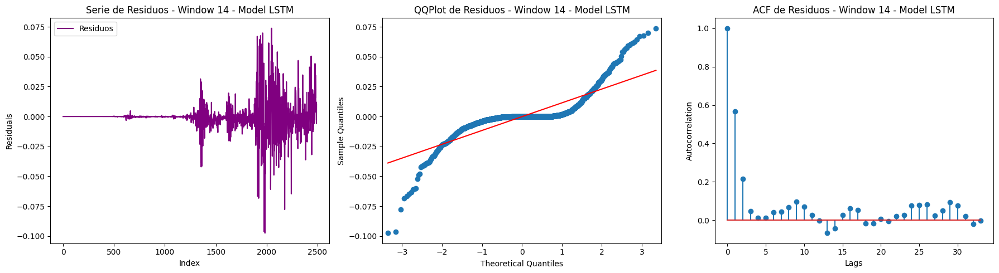

,Model,MAPE,MAE,RMSE,MSE,R2,LJung-Box (p-value),Jarque-Bera (p-value)
0,MLP,inf,0.003865,0.009645,0.000093,0.997914,7.824154e-80,0.0
1,MLP,inf,0.004621,0.010124,0.000102,0.997781,2.008302e-128,0.0
2,RNN,inf,0.005744,0.012731,0.000162,0.996366,2.828255e-294,0.0
3,RNN,inf,0.005767,0.012581,0.000158,0.996573,0.000000e+00,0.0
4,LSTM,inf,0.006674,0.014024,0.000197,0.995591,0.000000e+00,0.0
5,LSTM,inf,0.005083,0.011556,0.000134,0.997108,1.807320e-203,0.0


In [449]:
results_table = pd.DataFrame(columns=[ # Crear tabla para almacenar métricas y resultados de pruebas, incluyendo columna de modelo
    'Model', 'MAPE', 'MAE', 'RMSE', 'MSE', 'R2', 'LJung-Box (p-value)', 'Jarque-Bera (p-value)'
])

iii = 2
# Iterar a través de cada modelo, ventana y rango de tau
for model_name in ['MLP', 'RNN', 'LSTM']:
    for window in window_sizes:
        # Acumular valores reales y predichos de tau 1 a n en una sola lista
        combined_real_values = []
        combined_pred_values = []

        for tau in range(1, iii):  # Ajusta el rango de tau según tus necesidades
            # Acumular valores reales y predichos
            combined_real_values.extend(trainY_matrices[window][tau])
            combined_pred_values.extend(predictions_multivariate[model_name][window][f'Train_Pred_tau_{tau}'])

        # Convertir las listas acumuladas en arreglos numpy
        combined_real_values = np.array(combined_real_values)
        combined_pred_values = np.array(combined_pred_values)
        residuals = combined_real_values - combined_pred_values

        # Calcular métricas
        mae = mean_absolute_error(combined_real_values, combined_pred_values)
        mse = mean_squared_error(combined_real_values, combined_pred_values)
        rmse = np.sqrt(mse)
        mape = np.mean(np.abs(residuals / combined_real_values)) * 100
        r2 = r2_score(combined_real_values, combined_pred_values)

        # Pruebas de independencia (Ljung-Box) y normalidad (Jarque-Bera)
        lb_test = q_stat(acf(residuals, fft=True, nlags=10)[1:], len(residuals))[1][-1]
        jb_test = jarque_bera(residuals)[1]

        # Agregar los resultados a la tabla, incluyendo el nombre del modelo
        row = pd.DataFrame({
            'Model': [model_name],
            'MAPE': [mape],
            'MAE': [mae],
            'RMSE': [rmse],
            'MSE': [mse],
            'R2': [r2],
            'LJung-Box (p-value)': [lb_test],
            'Jarque-Bera (p-value)': [jb_test]
        })

        results_table = pd.concat([results_table, row], ignore_index=True)

        # Crear subplots para los gráficos en una misma figura
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        
        # Gráfico de la serie de residuos
        axes[0].plot(residuals, label='Residuos', color='purple')
        axes[0].set_title(f'Serie de Residuos - Window {window} - Model {model_name}')
        axes[0].set_xlabel('Index')
        axes[0].set_ylabel('Residuals')
        axes[0].legend()

        # QQ Plot de los residuos
        qqplot(residuals, line='s', ax=axes[1])
        axes[1].set_title(f'QQPlot de Residuos - Window {window} - Model {model_name}')

        # ACF de los residuos
        acf_values = acf(residuals, fft=True)
        axes[2].stem(acf_values)
        axes[2].set_title(f'ACF de Residuos - Window {window} - Model {model_name}')
        axes[2].set_xlabel('Lags')
        axes[2].set_ylabel('Autocorrelation')

        plt.tight_layout()
        plt.show()

# Mostrar la tabla completa con los resultados para cada modelo
display(results_table)


Se crea una tabla donde se resume para el residual en el conjunto de entrenamiento, los  scores obtenidos y agregue además las respectivas pruebas de hipóteis para independencia y normalidad. con una tabla de Pandas se construyen las columnas: MAPE, MAE, RMSE, MSE, R2, LJung-Box test (p-value), Jarque-Bera (p-value) y se agregan las figuras para Serie de residuos, QQPlot, ACF de residuos: 

Evidendiando lo siguiente: 

Todos los modelos en el conjunto de entrenamiento en este caso validado para una ventana de tamaño `www=7`, tienen un R2 muy cercano a 1, lo cual indica un posible sobre ajuste del modelo, que podría regularse si se usan dropout mayores en el proceso de entrenamiento. Las pruebas de independencia y normalidad de los residuos con un P_value=0.05, demuestran que los residuos no siguen una distribución normal y que existe una autocorrelación significativa entre los residuos de un periodo y otro. 

Esto ultimo también se evidencia en las gráficas de residuos QQ plot, que muestra que los datos no estár organizados con tendencia central, como se esperaría de la una distribución normal. y el ACF, muestra que hay Lags, de hasta 35 periodos en los que puede haber una correlación significativa. Adicionalmente, se podría sospechar que cada 7, 14,21,28 y 35, periodos de tiempo hay una estacionalidad marcada, esto podría deberse a la forma en la que está plegada la serie. 

Nota: el MAPE se descarta como métrica fiable de entrenamiento para series temporales que contienen valores reales de cero, dado que su forma de calaculo utiliza como denominador los valores reales. 

#### Item 5

In [450]:
def calculate_scores(test_values, predictions):
    # Calcular métricas de error
    mae = mean_absolute_error(test_values, predictions)
    mse = mean_squared_error(test_values, predictions)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((test_values - predictions) / test_values)) * 100
    r2 = r2_score(test_values, predictions)
    
    # Prueba de Ljung-Box para independencia
    residuals = test_values - predictions
    lb_test = q_stat(acf(residuals, fft=True, nlags=40), len(residuals))[1][-1]  # Valor p

    return {
        "MAPE": mape,
        "MAE": mae,
        "RMSE": rmse,
        "MSE": mse,
        "R2": r2,
        "LJung-Box (p-value)": lb_test
    }

# Crear una lista para almacenar los resultados de cada modelo
results = []

# Modelos a evaluar
modelos = ['MLP', 'RNN', 'LSTM']
www = 7  # Tamaño de ventana usado en los datos
iii=2 #Tau periodo a revisar

# Concatenar los valores reales del conjunto de test en una sola serie
test_values = np.concatenate([testY_matrices[www][tau] for tau in range(1, iii)])

# Calcular y almacenar resultados para cada modelo
for model_name in modelos:
    # Concatenar las predicciones del conjunto de test en una sola serie
    predictions = np.concatenate([predictions_multivariate[model_name][www][f'Test_Pred_tau_{tau}'] for tau in range(1, iii)])
    
    # Calcular los puntajes y la prueba de Ljung-Box
    scores = calculate_scores(test_values, predictions)
    scores["Model"] = model_name

    # Agregar los resultados a la lista
    results.append(scores)

# Convertir la lista de resultados a un DataFrame
results_df = pd.DataFrame(results)

# Mostrar la tabla de resultados
results_df


C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\3376893796.py:6: RuntimeWarning:

divide by zero encountered in divide

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\3376893796.py:6: RuntimeWarning:

divide by zero encountered in divide

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\3376893796.py:6: RuntimeWarning:

divide by zero encountered in divide



,MAPE,MAE,RMSE,MSE,R2,LJung-Box (p-value),Model
0,inf,0.003927,0.009745,0.000095,0.998047,1.782678e-279,MLP
1,inf,0.005738,0.012479,0.000156,0.996797,0.000000e+00,RNN
2,inf,0.006653,0.013302,0.000177,0.996361,0.000000e+00,LSTM


Nota: el MAPE se descarta como métrica fiable de entrenamiento para series temporales que contienen valores reales de cero, dado que su forma de calaculo utiliza como denominador los valores reales. Por eso encontramos valores infinitos. 

Se crea una tabla donde se resume para el residual en el conjunto de entrenamiento, los  scores obtenidos y agregue además las respectivas pruebas de hipóteis para independencia y normalidad. con una tabla de Pandas se construyen las columnas: MAPE, MAE, RMSE, MSE, R2, LJung-Box test (p-value). 

Evidendiando lo siguiente: 

Todos los modelos en el conjunto de test en este caso validado para una ventana de tamaño `www=7`, tienen un R2 muy cercano a 1, lo cual nos indica una excelente capacidad de predecir patrones, que tiene las redes neuronales y la ventaja de utilizar pliegos que sigan de cerca el comportamiento de la serie. El modelo con mejor ajuste en esta etapa fue el RNN, con un MSE ligeramente por debajo de los demás modelos. 



#### Item 8 

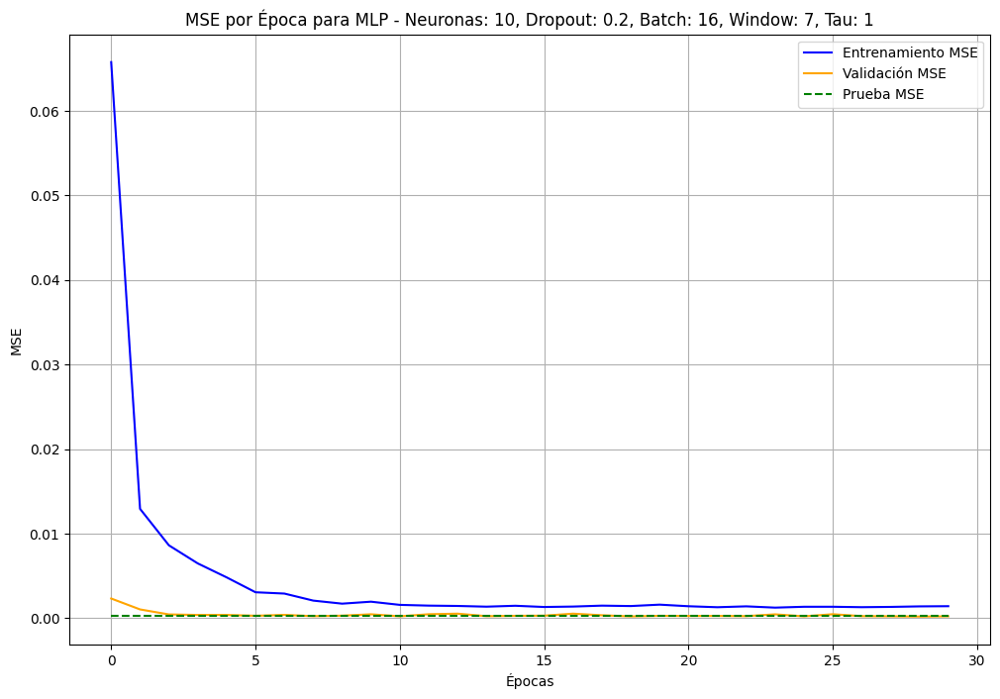

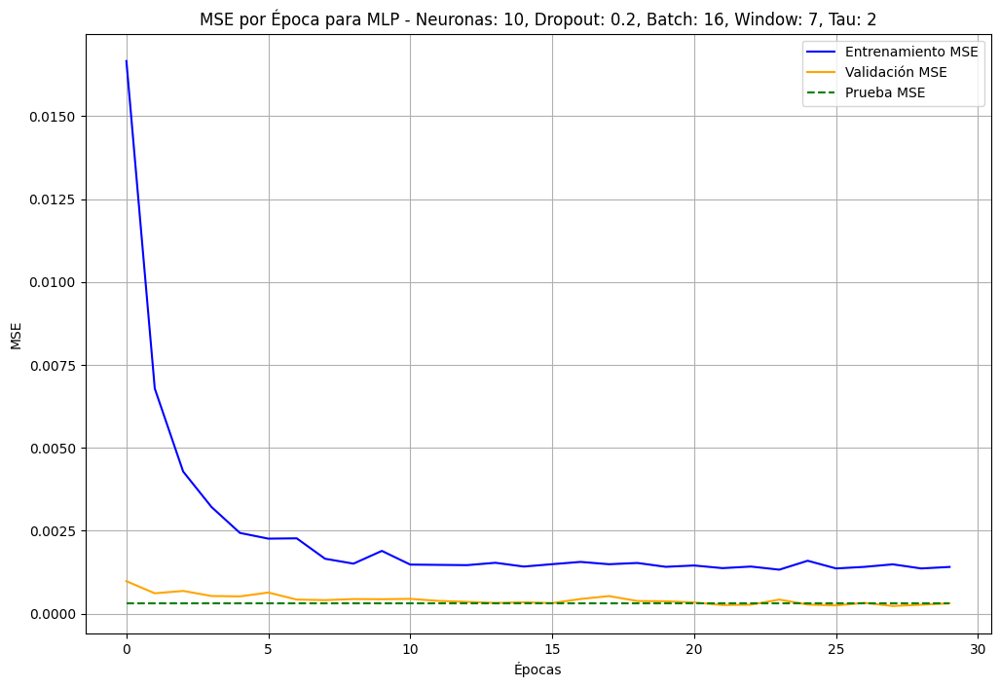

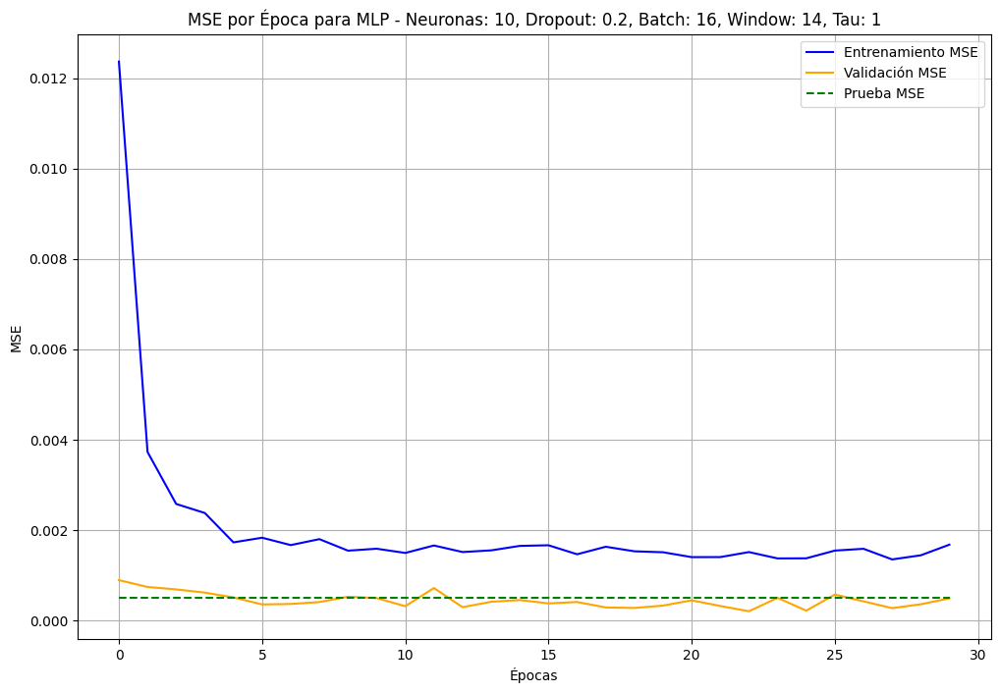

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\MLP_10neurons_0.2dropout_batch16_window14_tau2_history.joblib


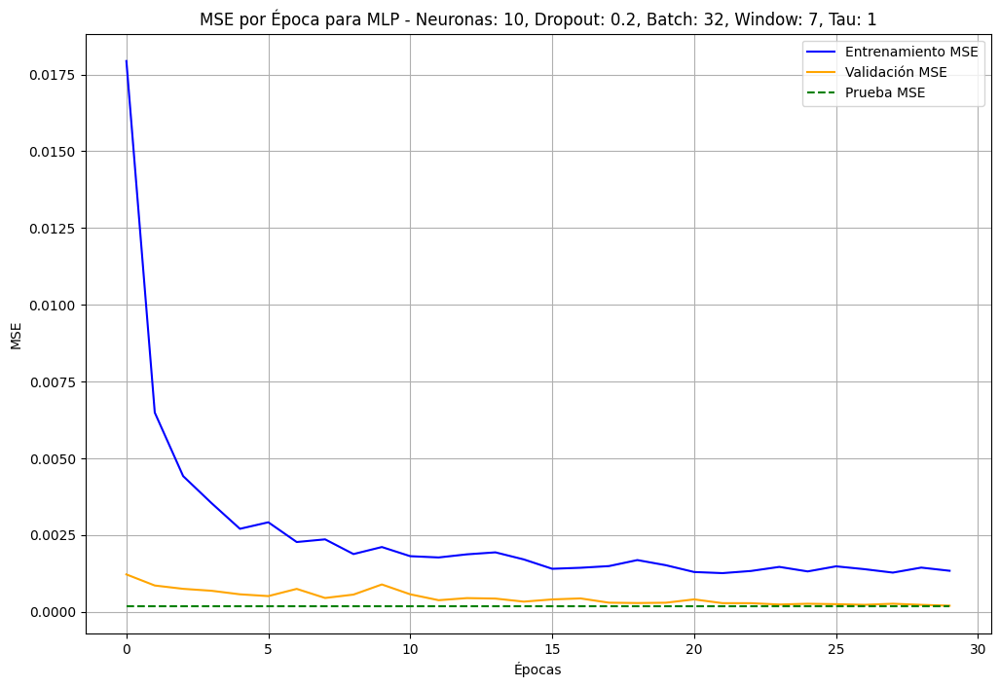

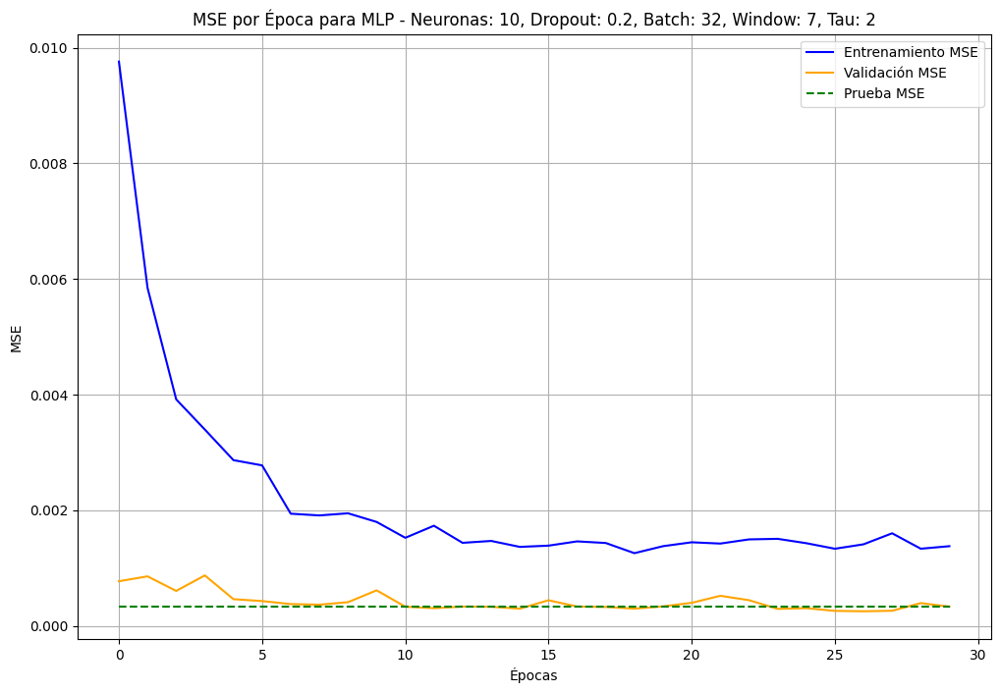

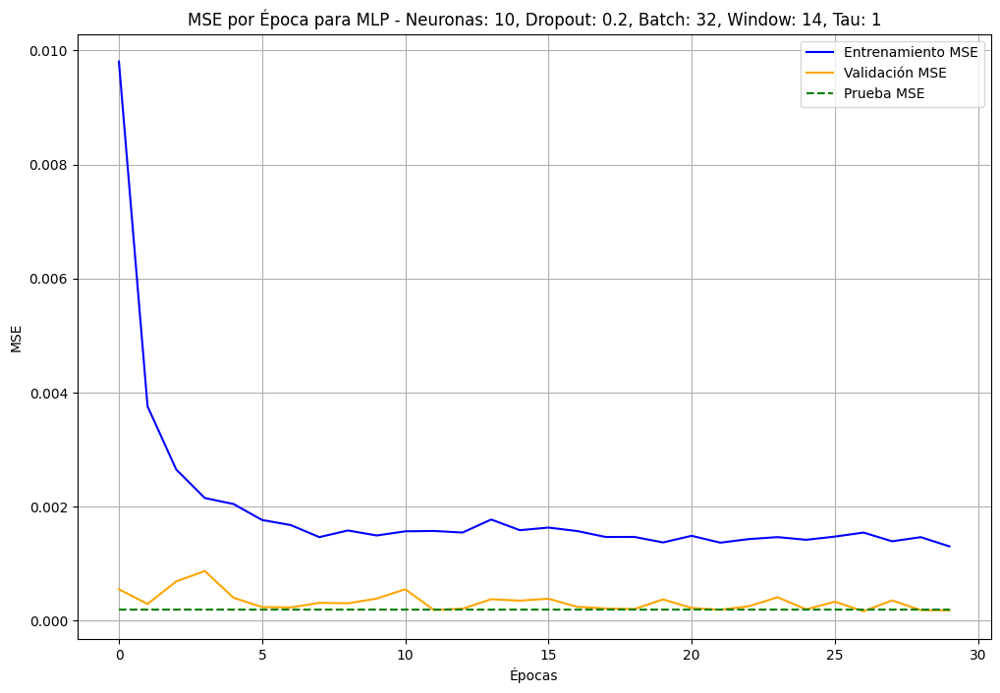

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\MLP_10neurons_0.2dropout_batch32_window14_tau2_history.joblib


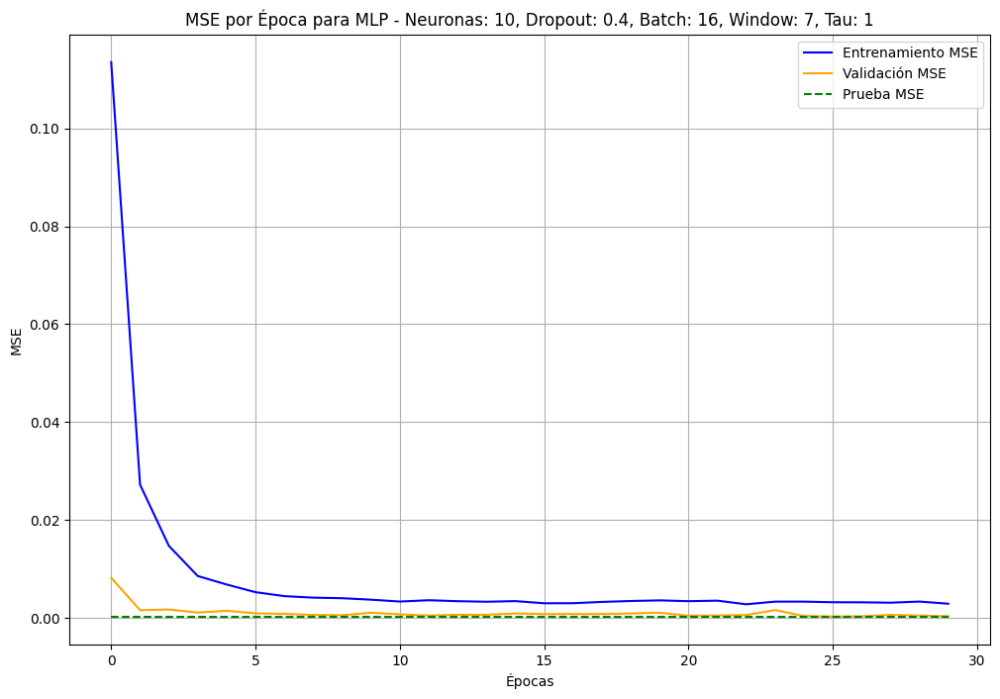

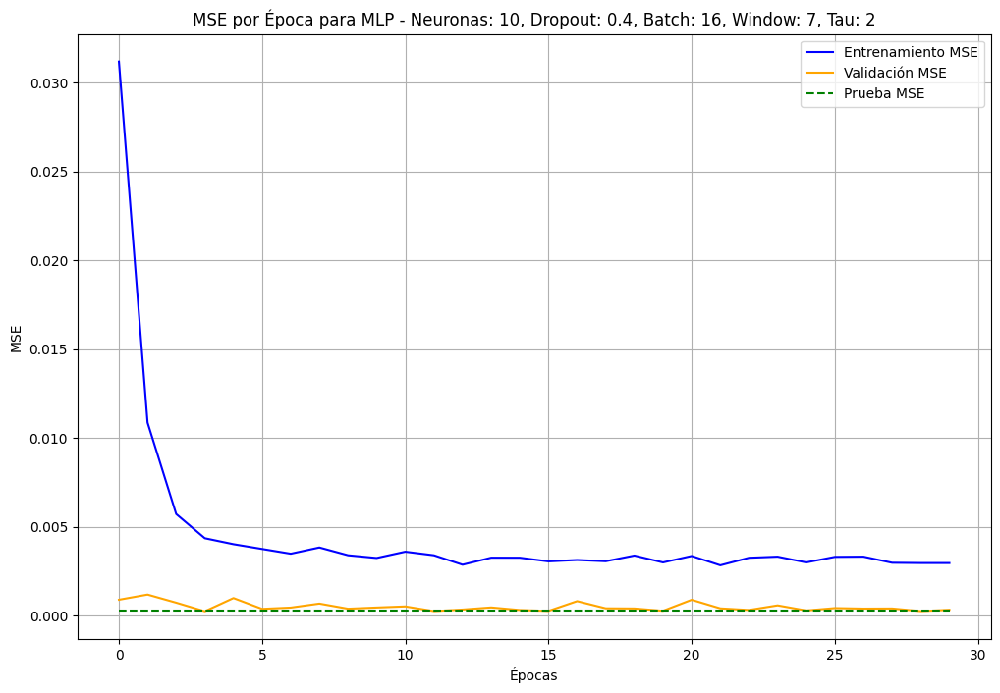

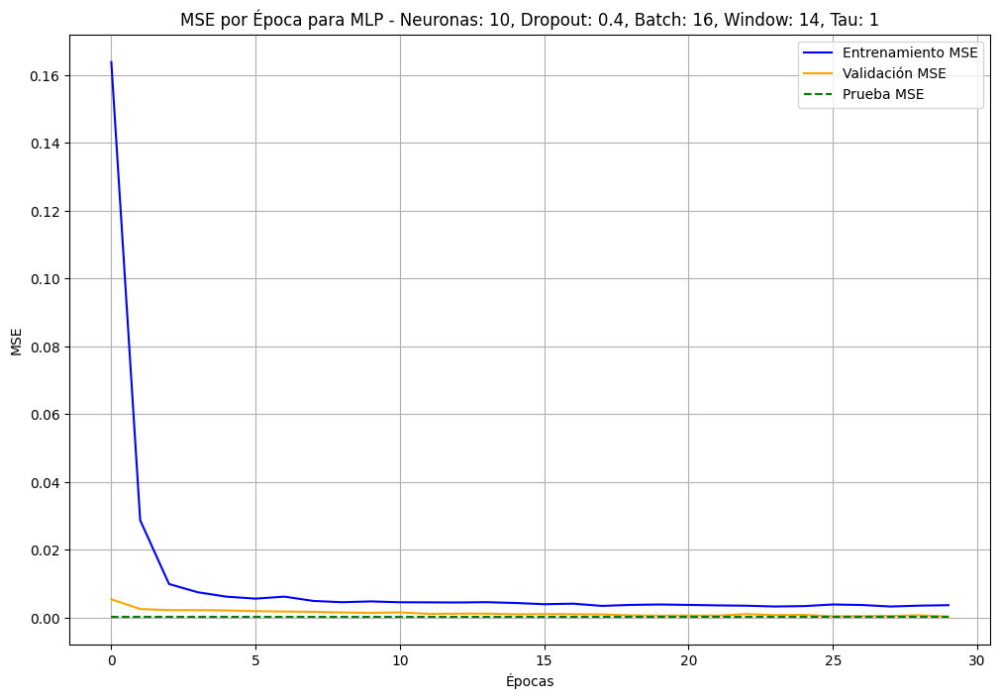

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\MLP_10neurons_0.4dropout_batch16_window14_tau2_history.joblib


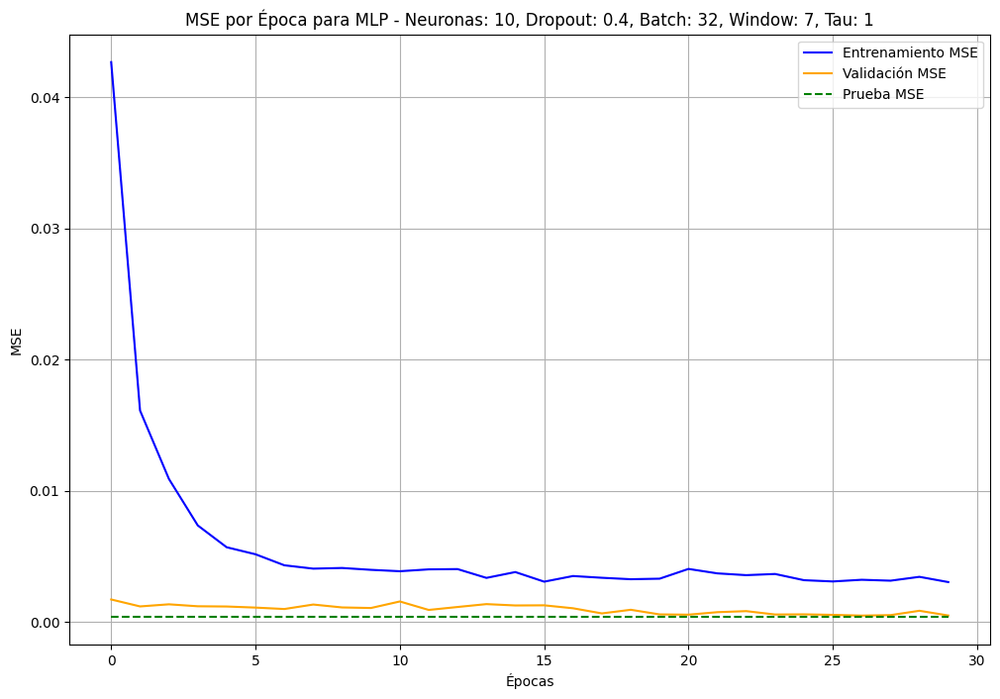

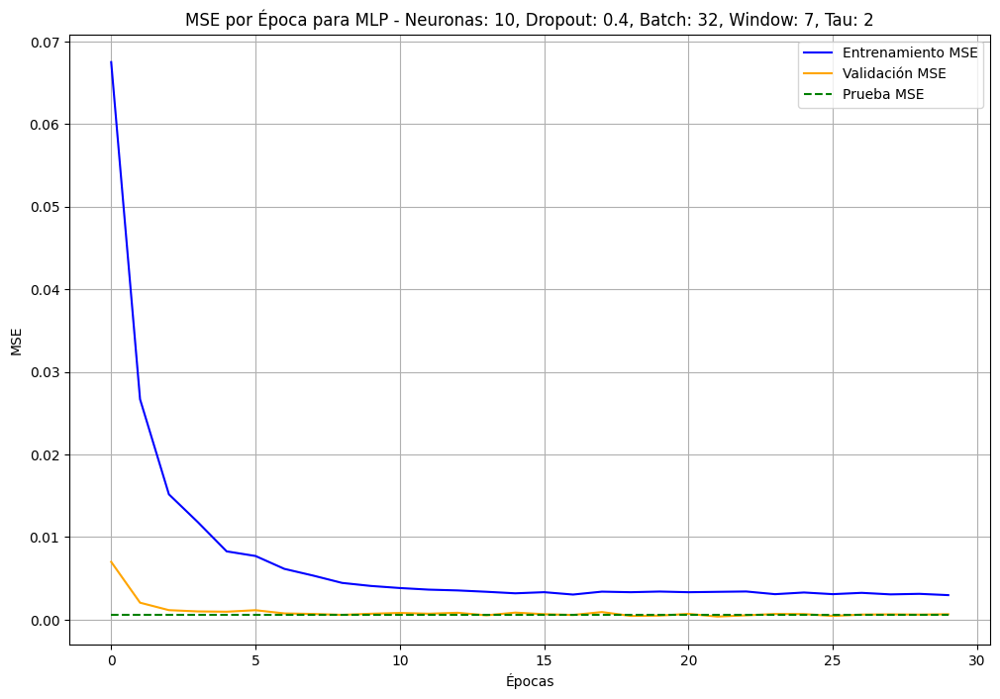

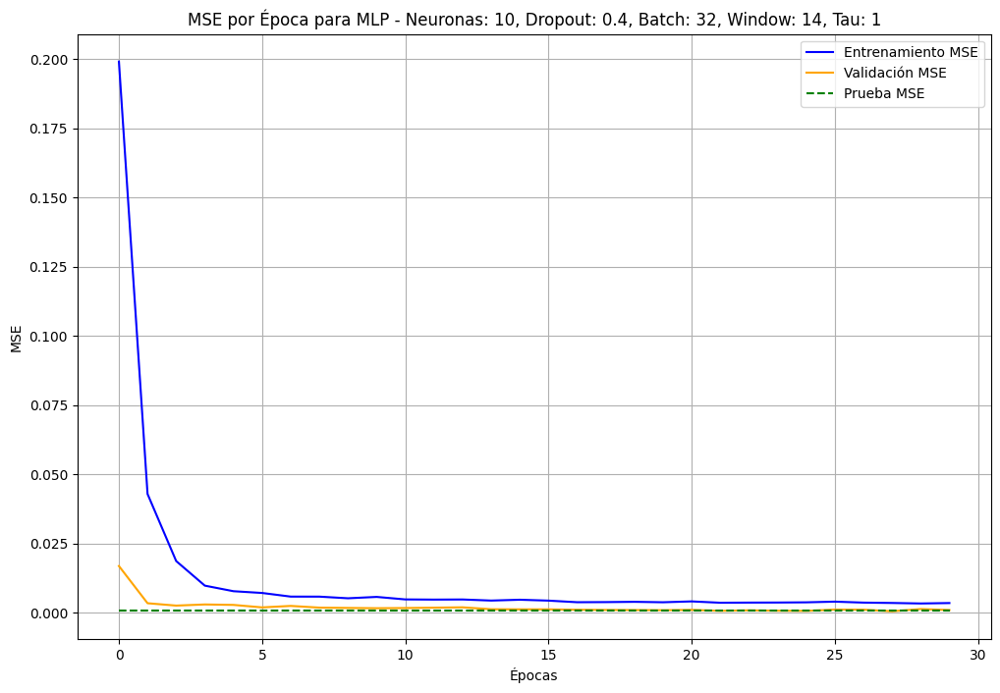

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\MLP_10neurons_0.4dropout_batch32_window14_tau2_history.joblib


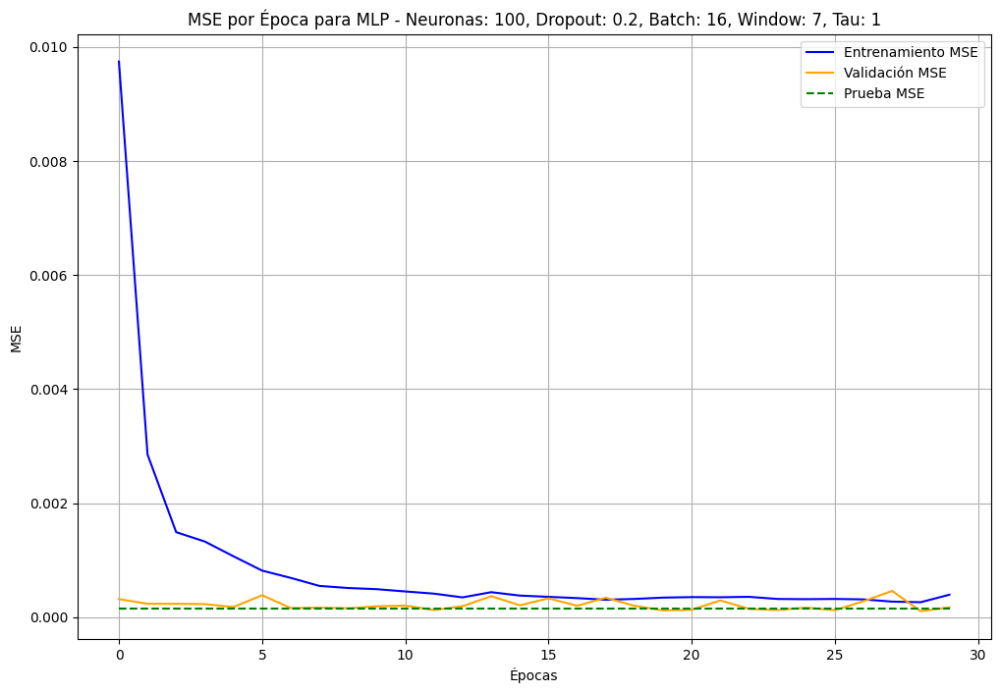

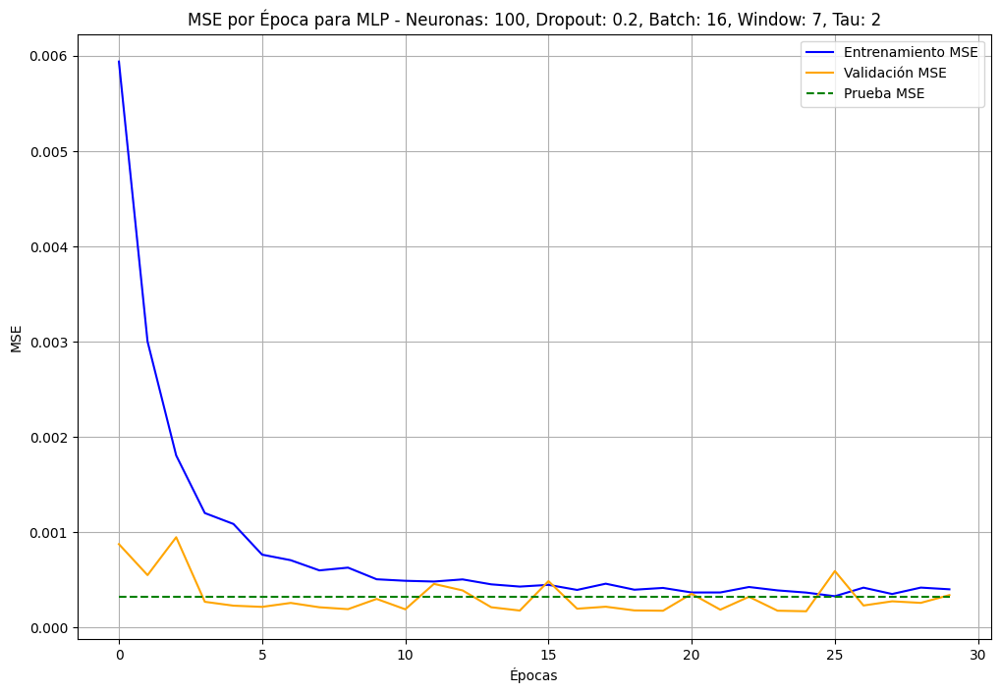

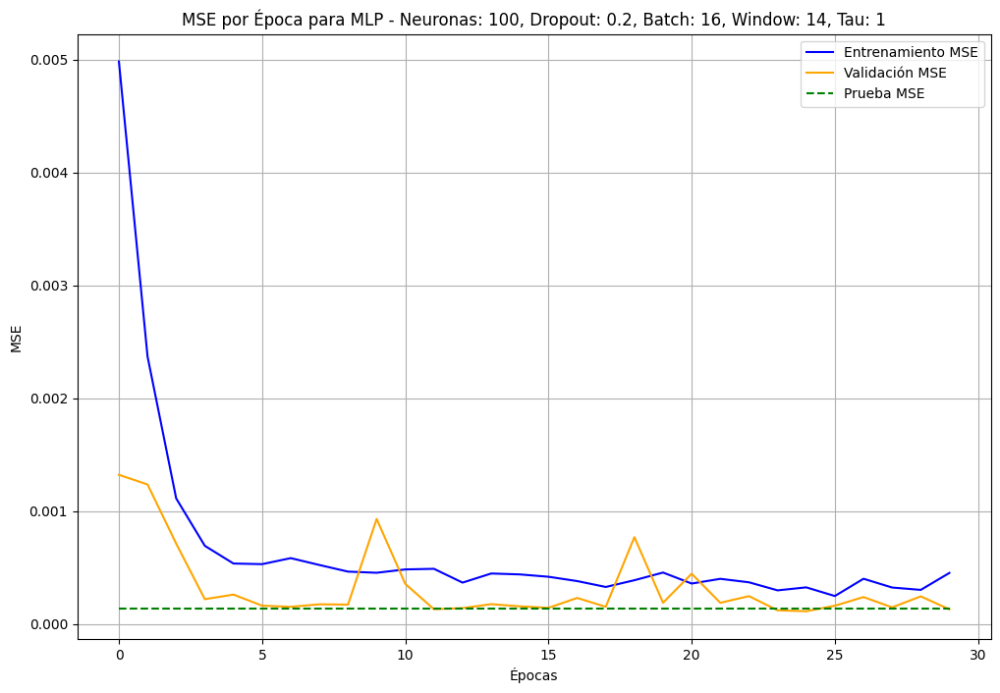

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\MLP_100neurons_0.2dropout_batch16_window14_tau2_history.joblib


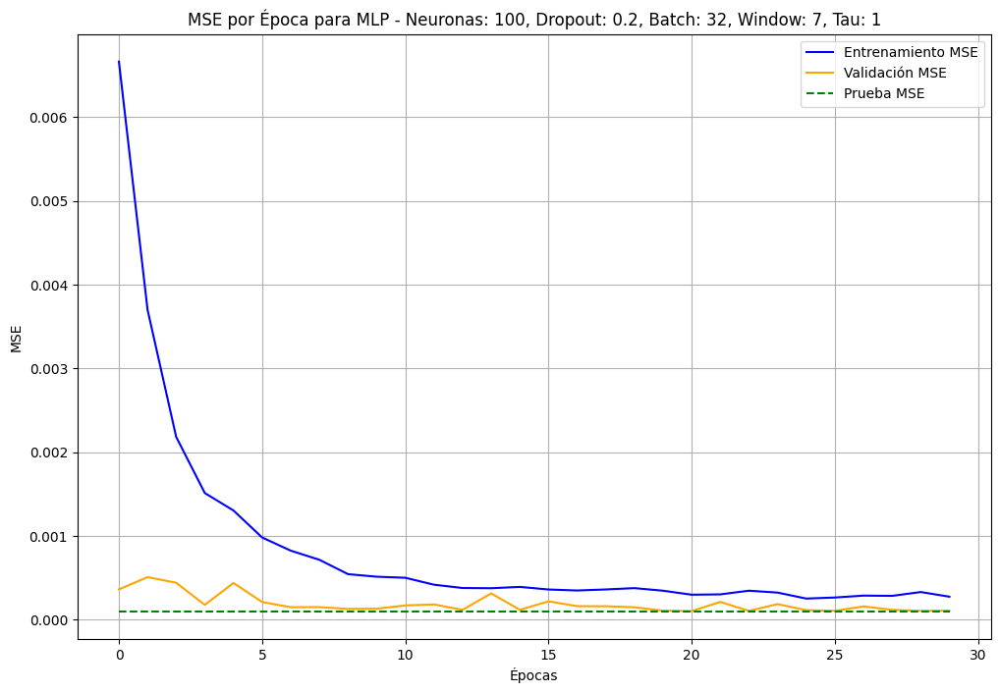

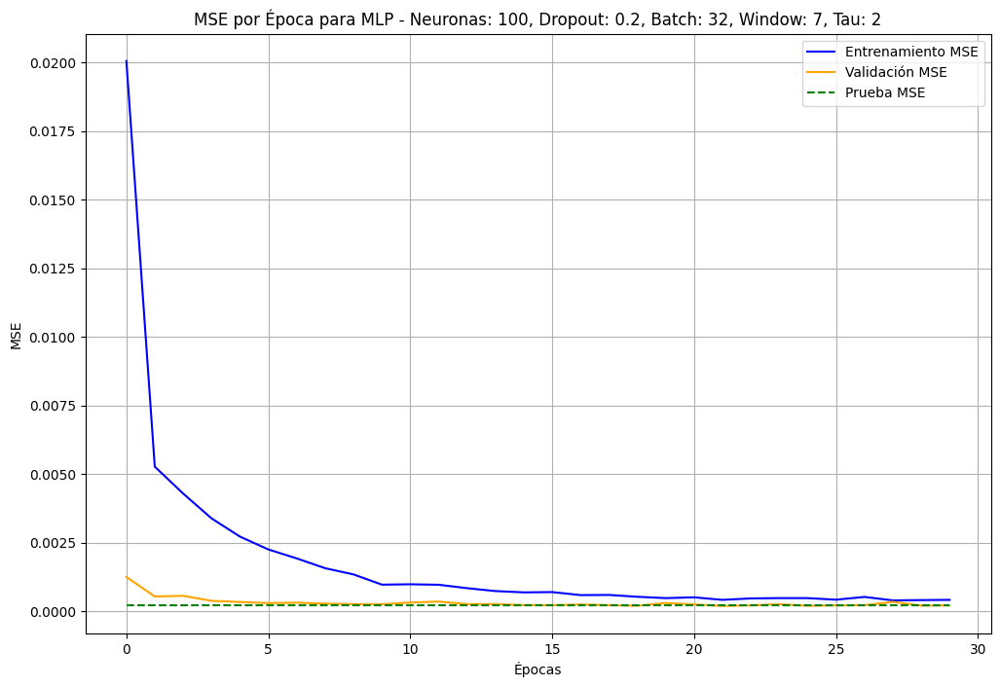

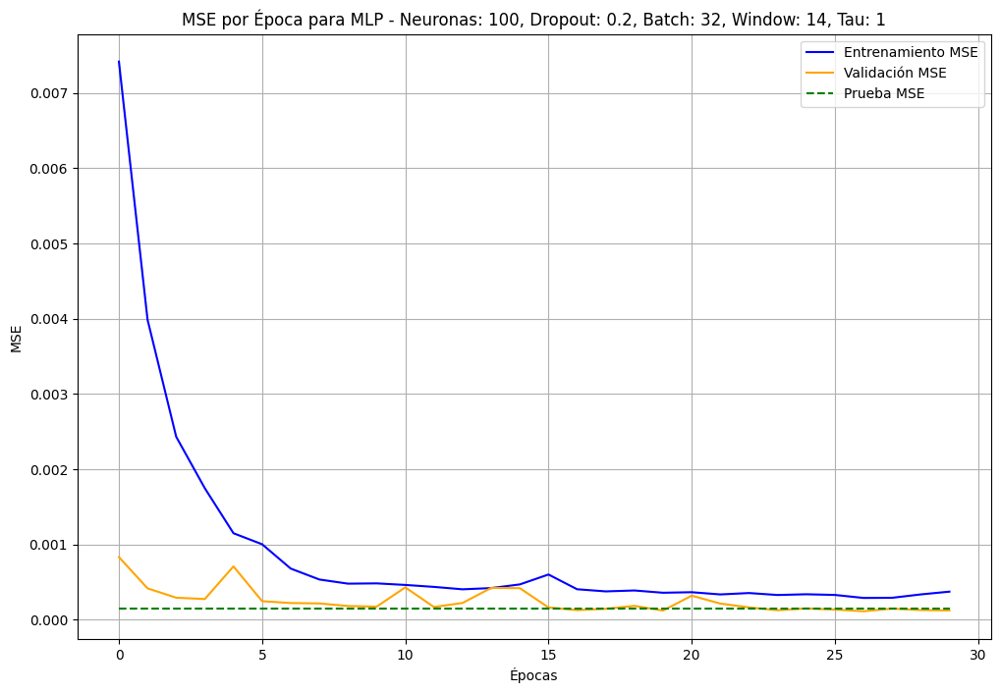

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\MLP_100neurons_0.2dropout_batch32_window14_tau2_history.joblib


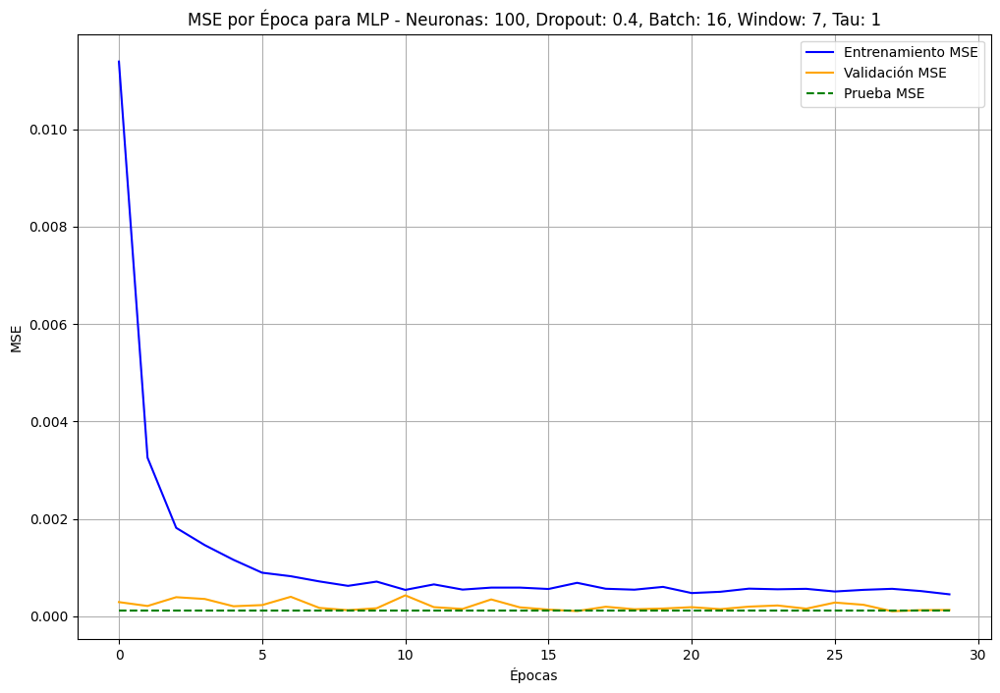

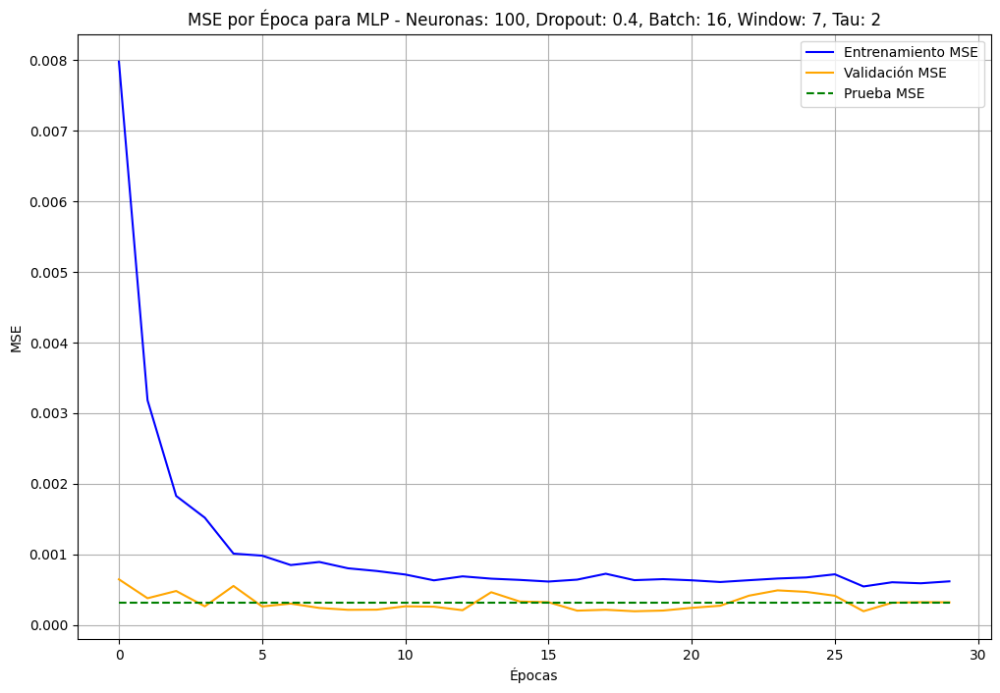

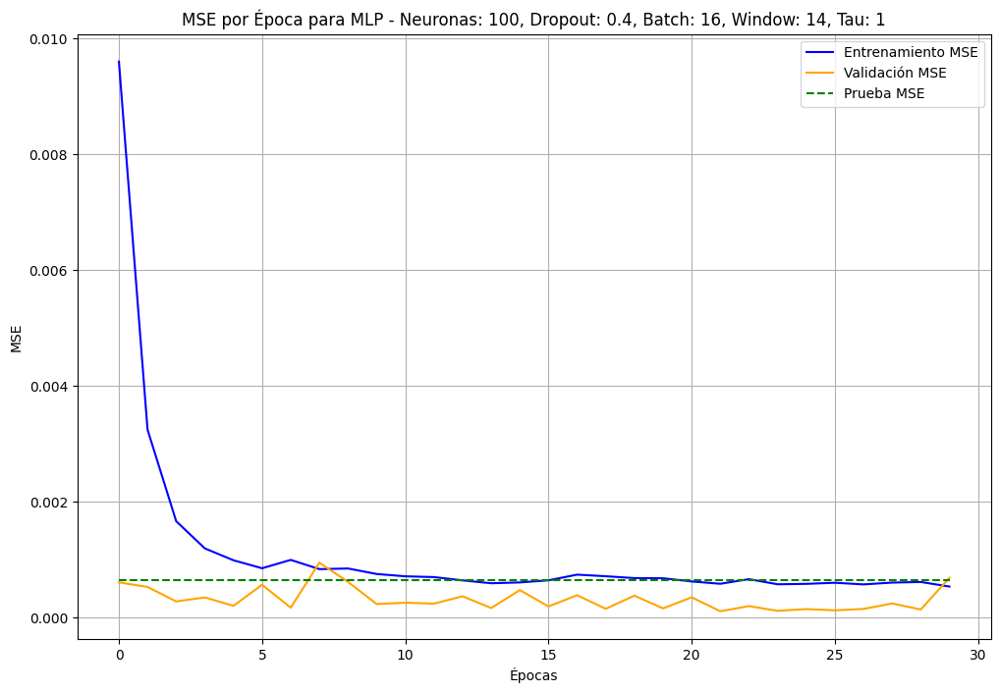

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\MLP_100neurons_0.4dropout_batch16_window14_tau2_history.joblib


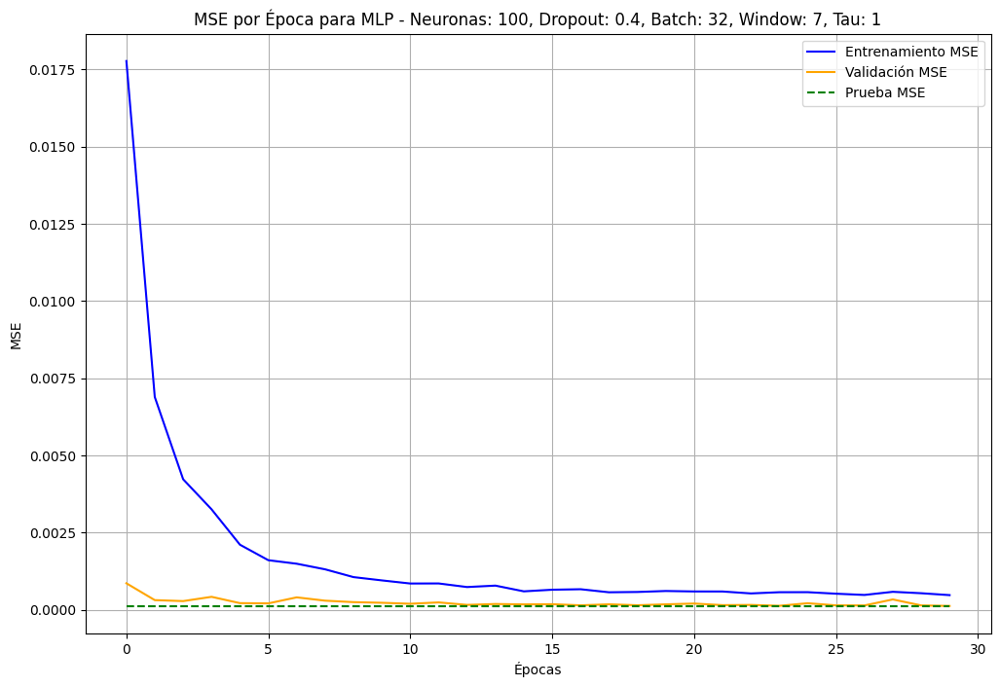

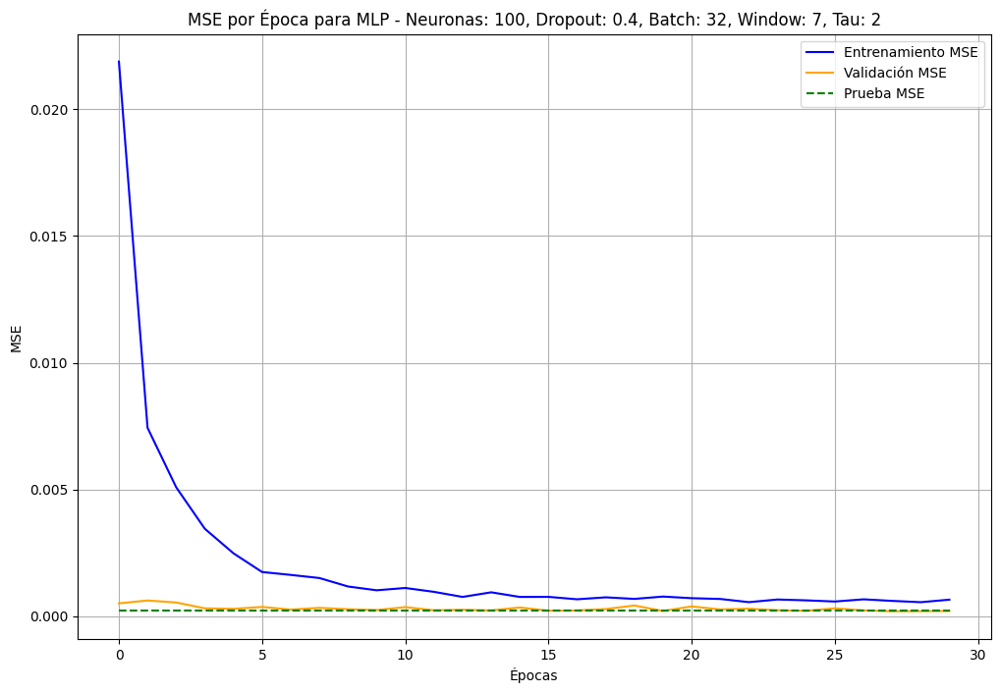

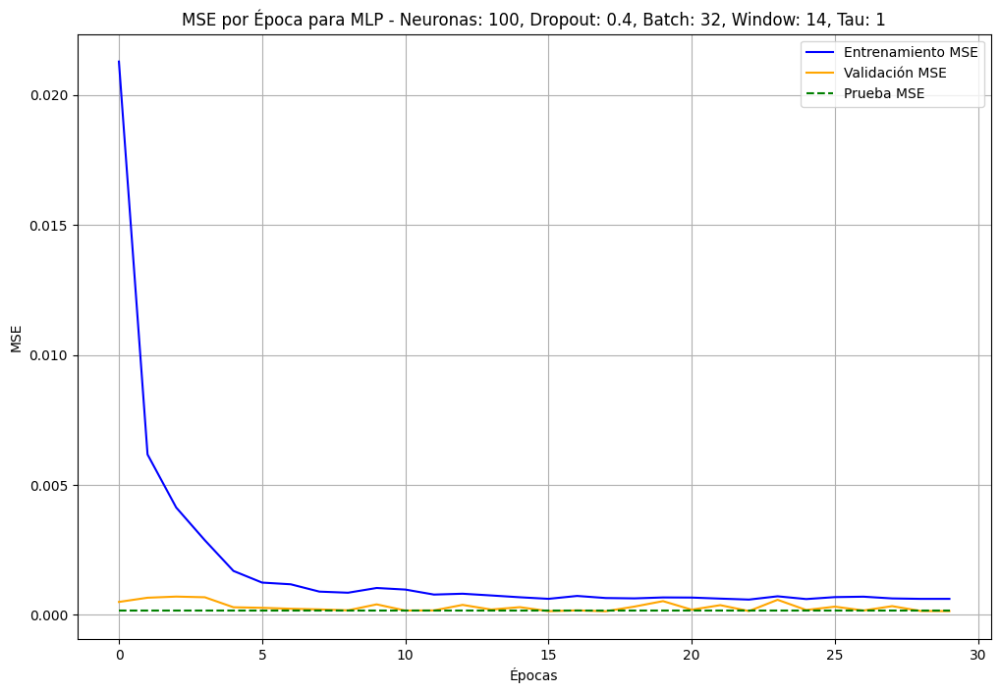

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\MLP_100neurons_0.4dropout_batch32_window14_tau2_history.joblib


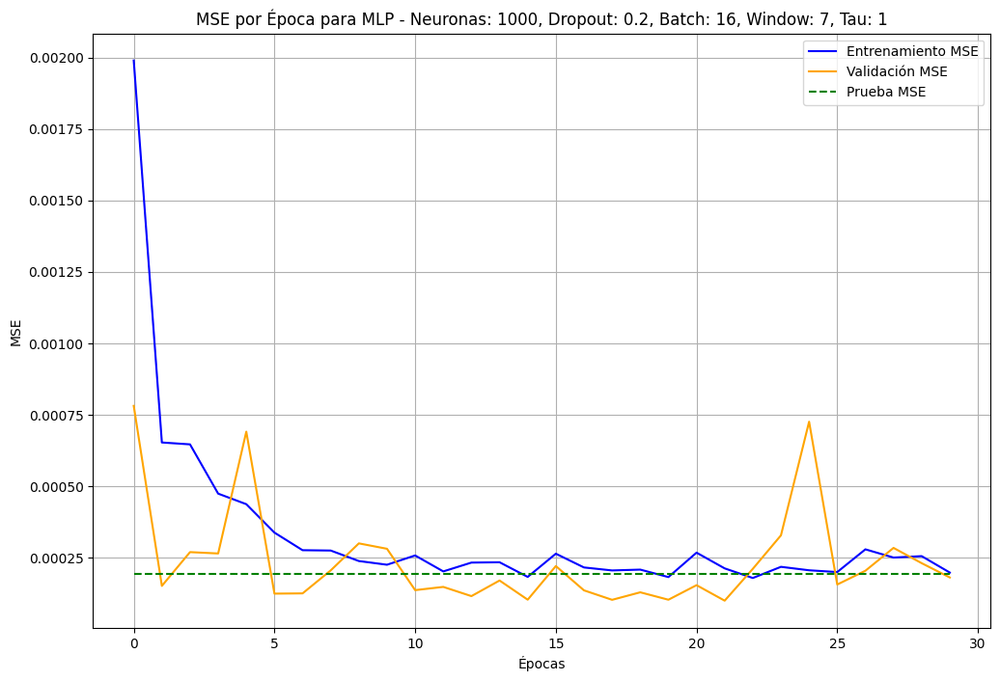

No se encontró el archivo de historial: modelos_precios/models_window_7_tau_2\MLP_1000neurons_0.2dropout_batch16_window7_tau2_history.joblib


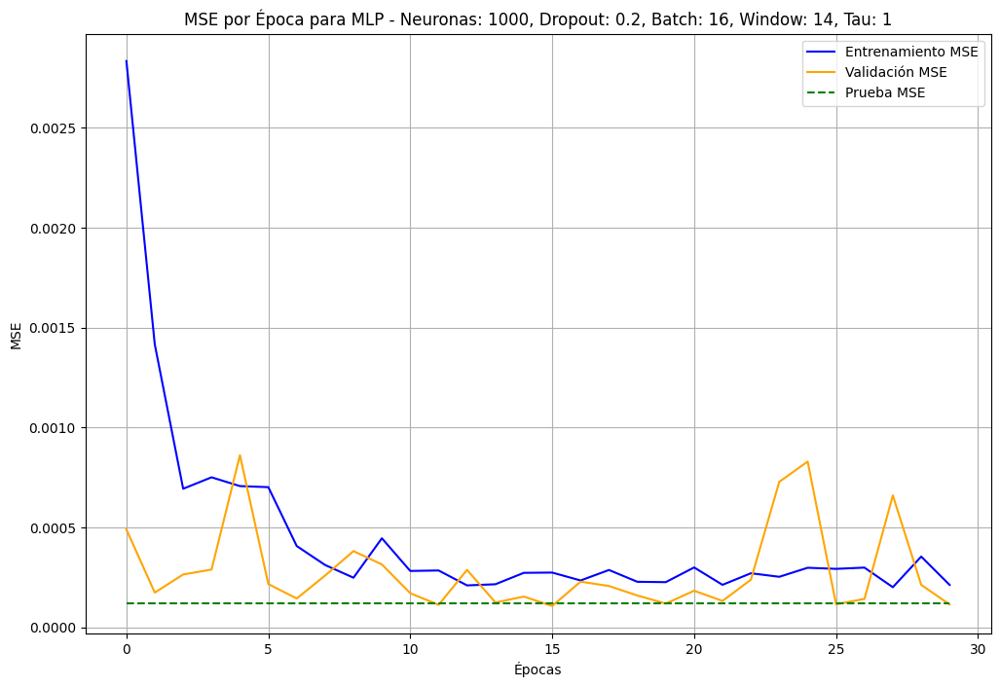

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\MLP_1000neurons_0.2dropout_batch16_window14_tau2_history.joblib


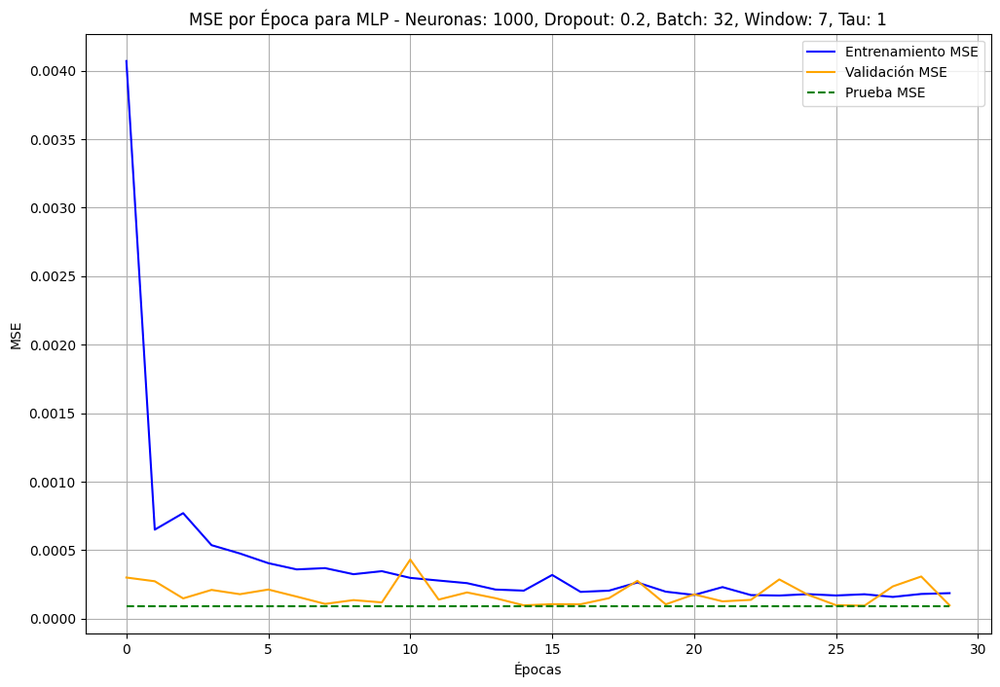

No se encontró el archivo de historial: modelos_precios/models_window_7_tau_2\MLP_1000neurons_0.2dropout_batch32_window7_tau2_history.joblib


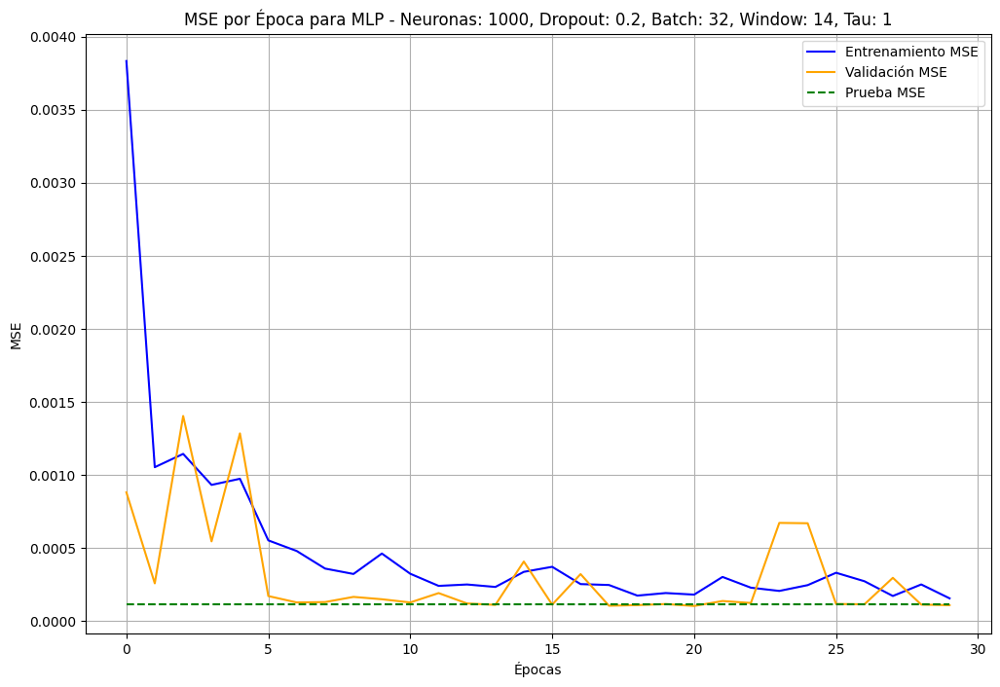

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\MLP_1000neurons_0.2dropout_batch32_window14_tau2_history.joblib


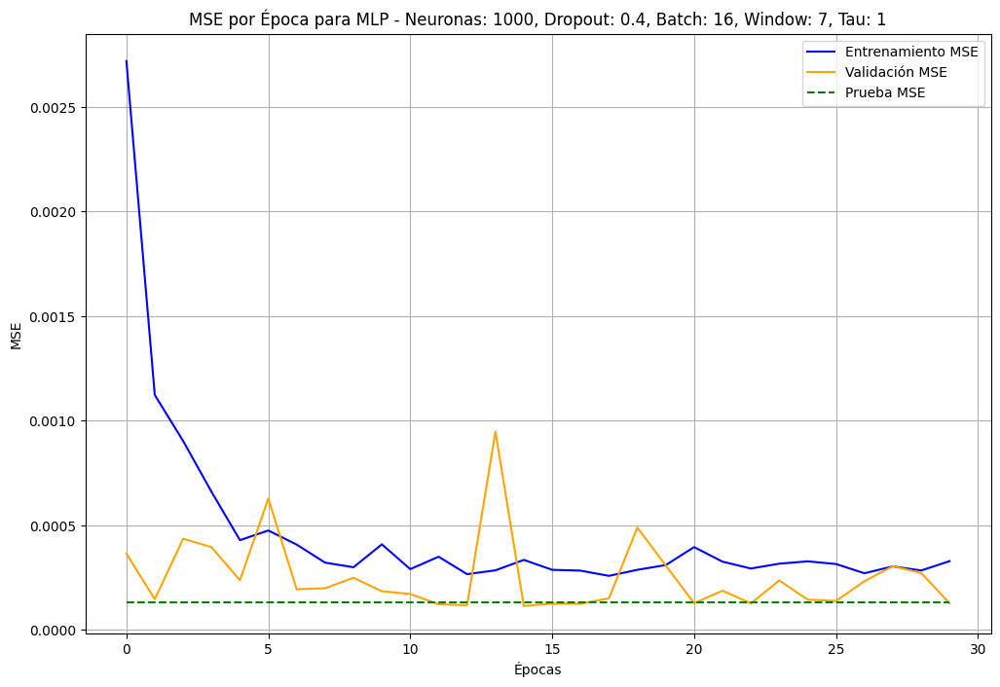

No se encontró el archivo de historial: modelos_precios/models_window_7_tau_2\MLP_1000neurons_0.4dropout_batch16_window7_tau2_history.joblib


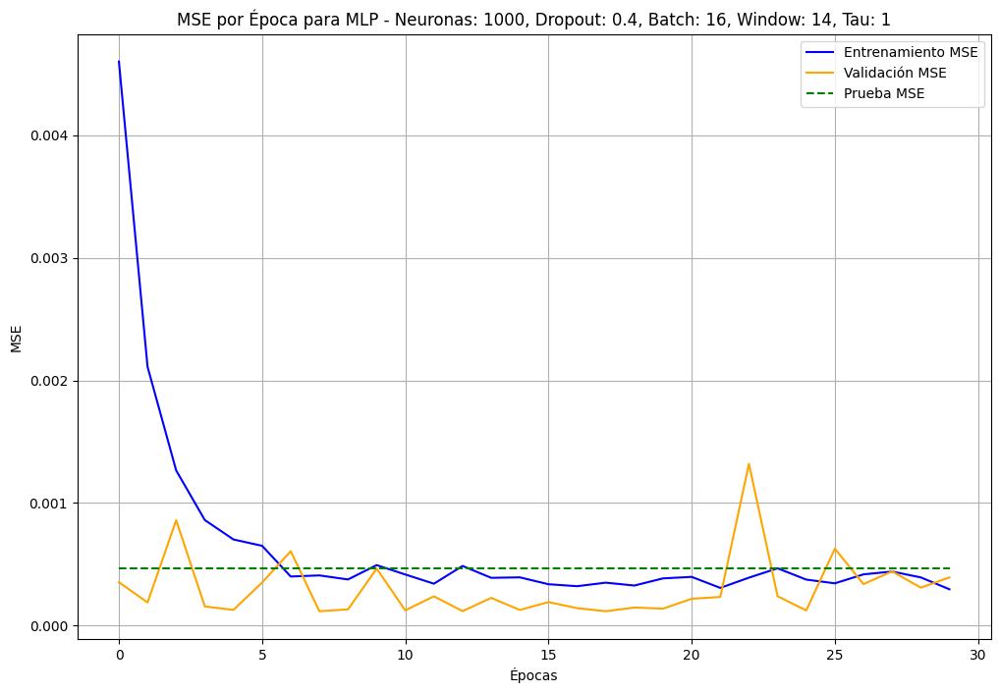

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\MLP_1000neurons_0.4dropout_batch16_window14_tau2_history.joblib


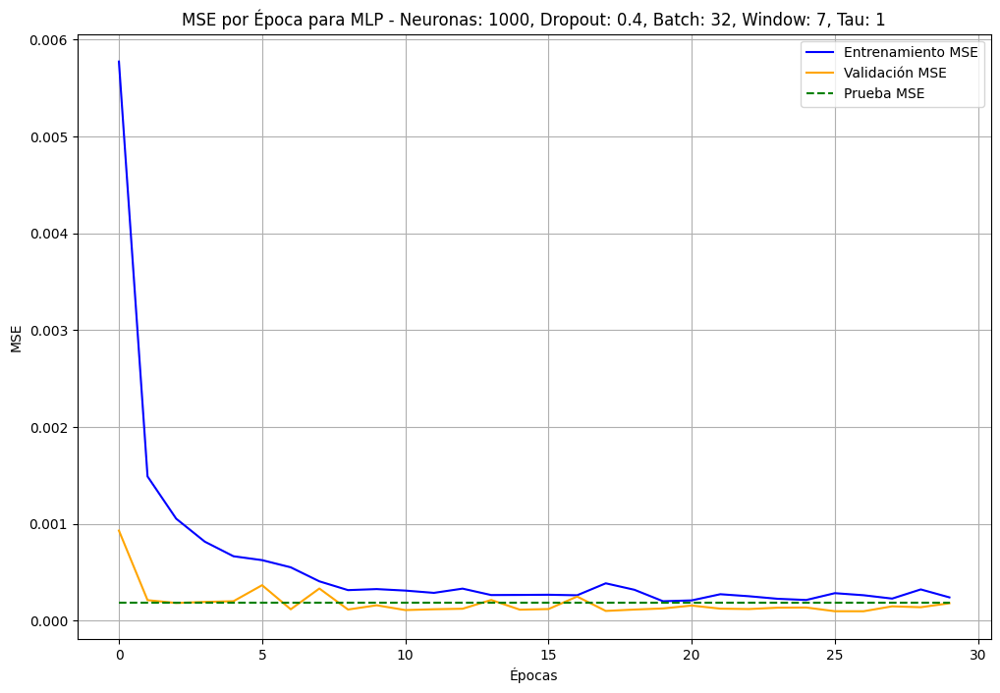

No se encontró el archivo de historial: modelos_precios/models_window_7_tau_2\MLP_1000neurons_0.4dropout_batch32_window7_tau2_history.joblib


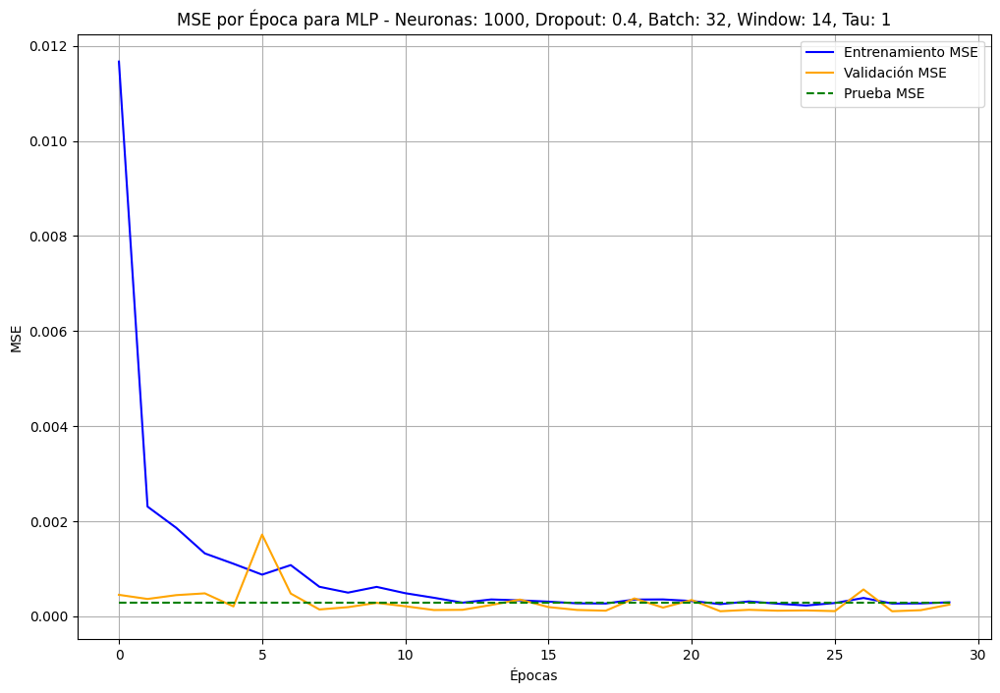

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\MLP_1000neurons_0.4dropout_batch32_window14_tau2_history.joblib


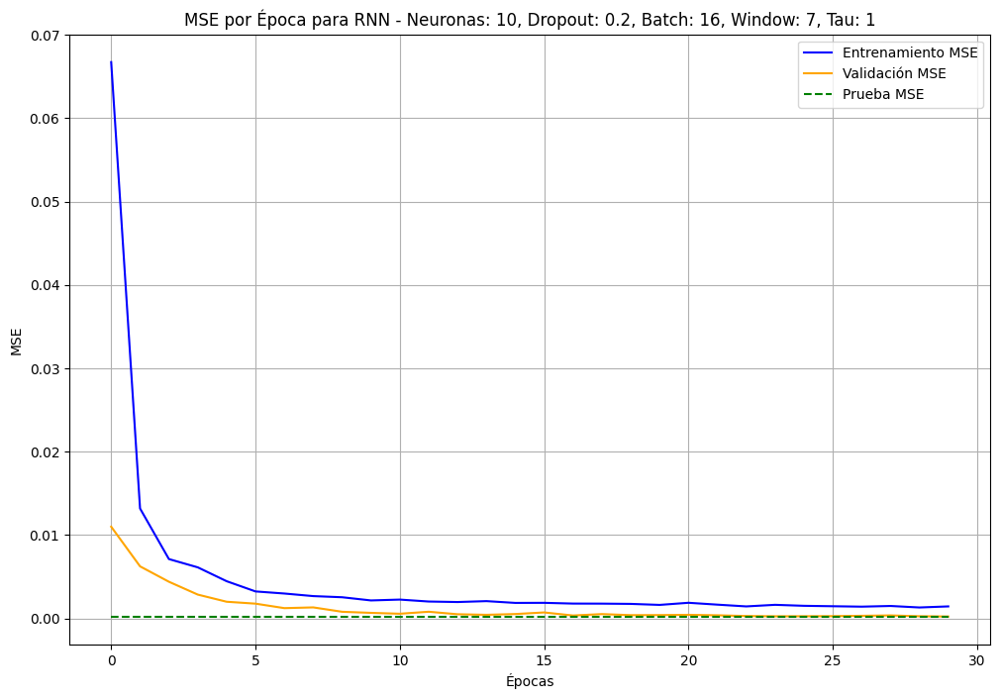

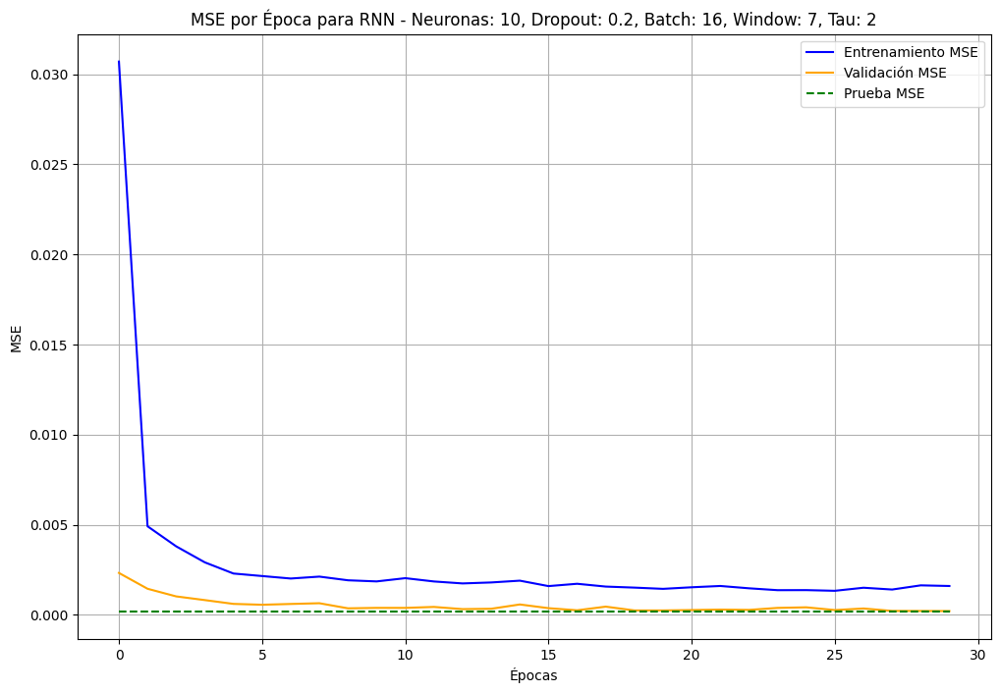

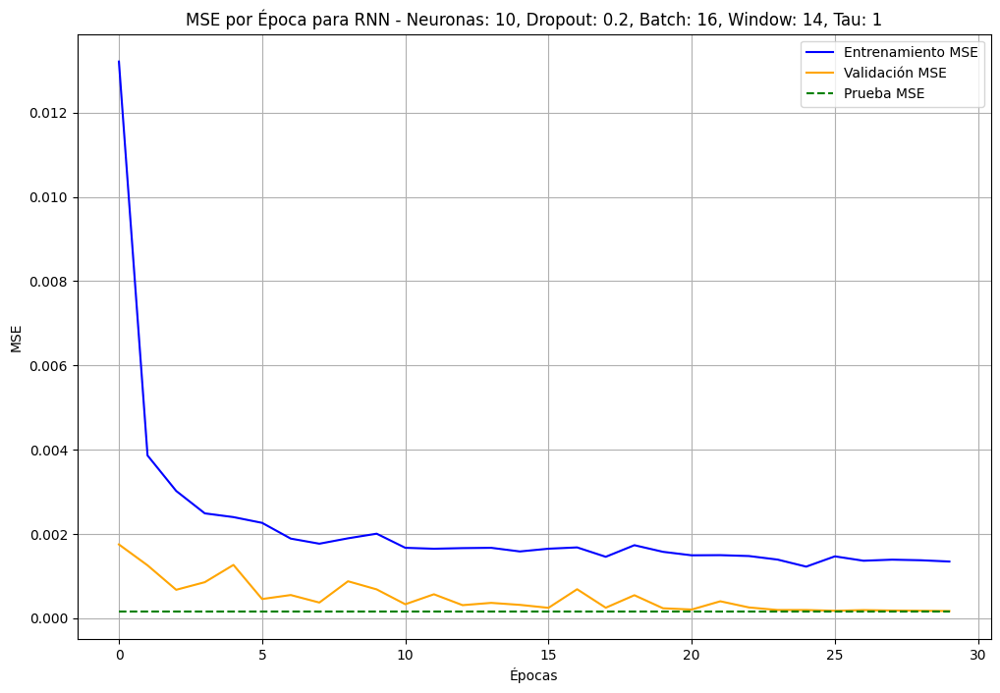

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\RNN_10neurons_0.2dropout_batch16_window14_tau2_history.joblib


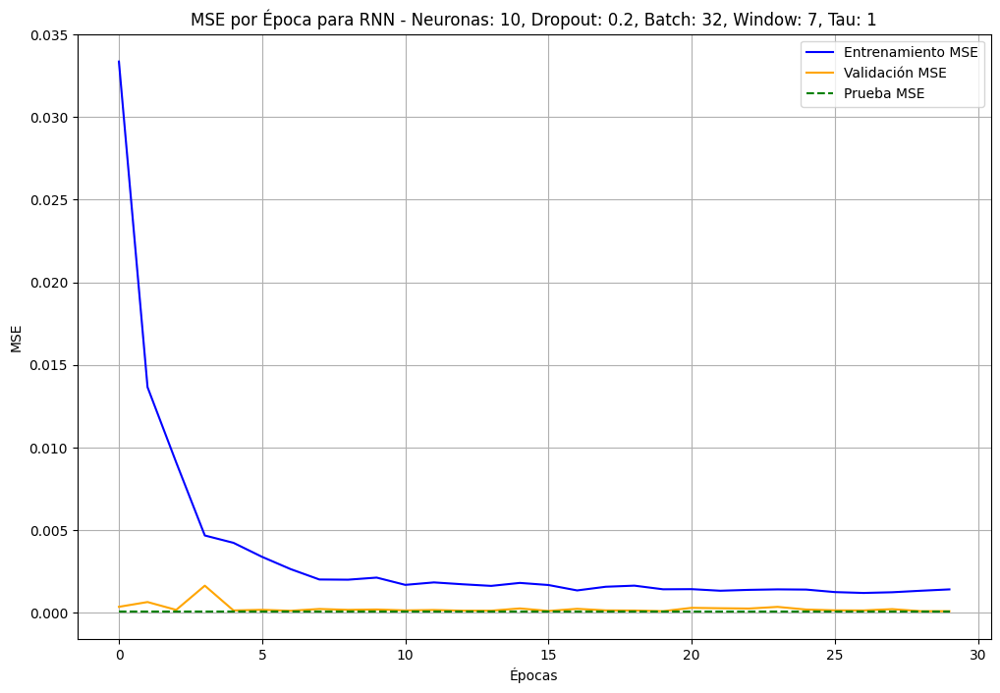

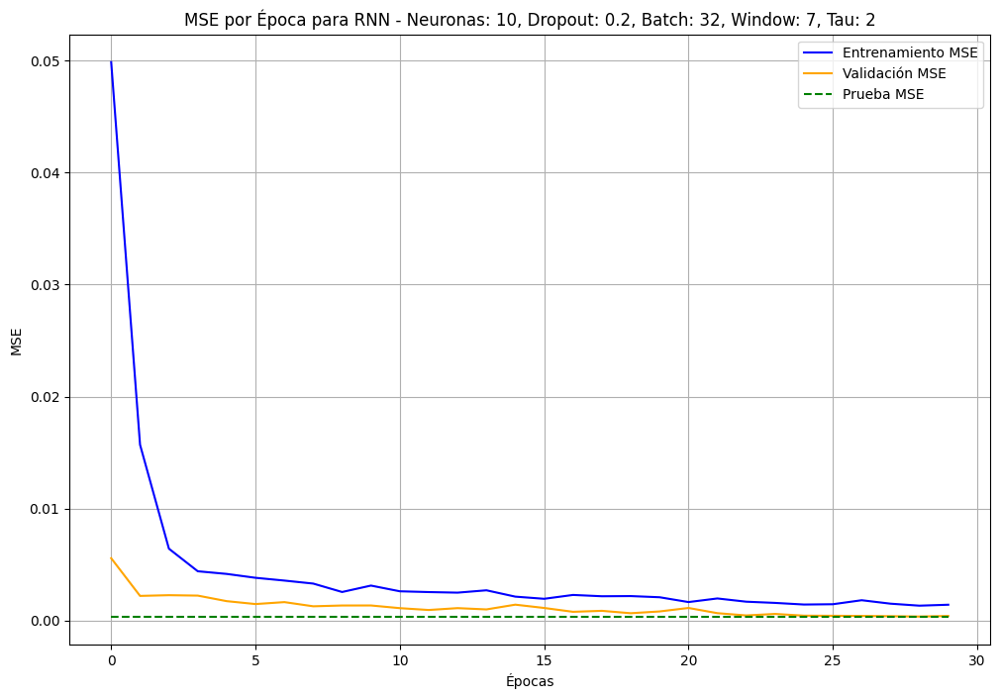

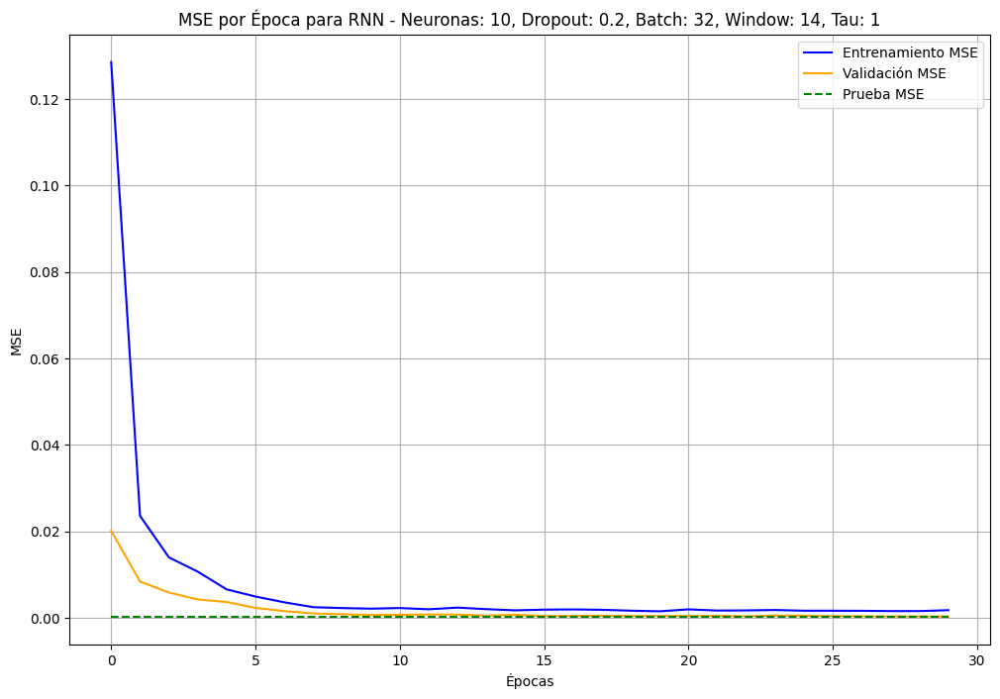

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\RNN_10neurons_0.2dropout_batch32_window14_tau2_history.joblib


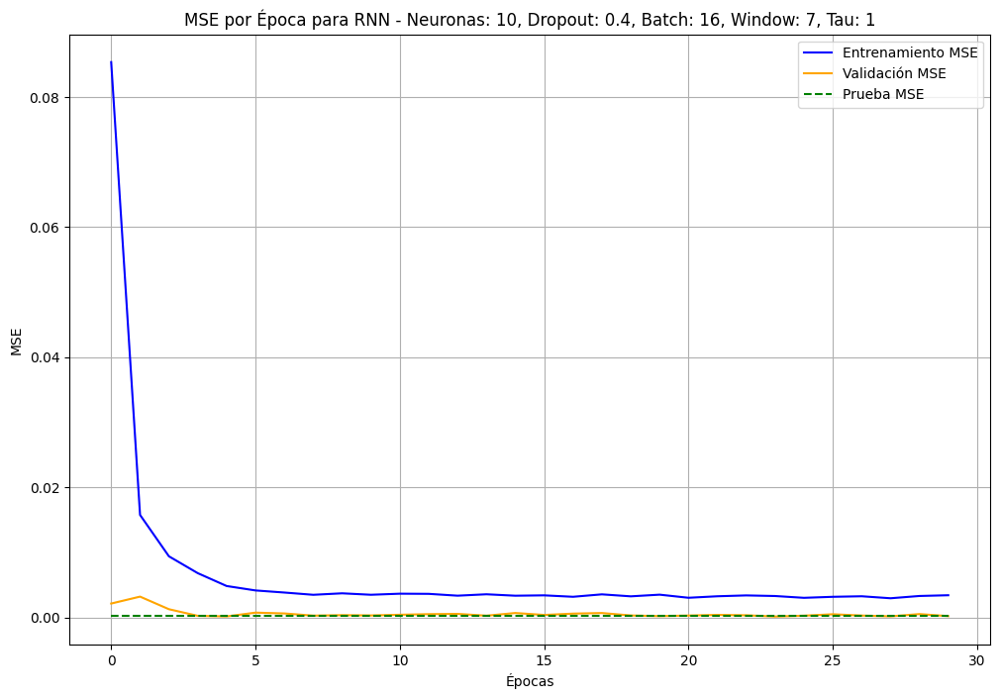

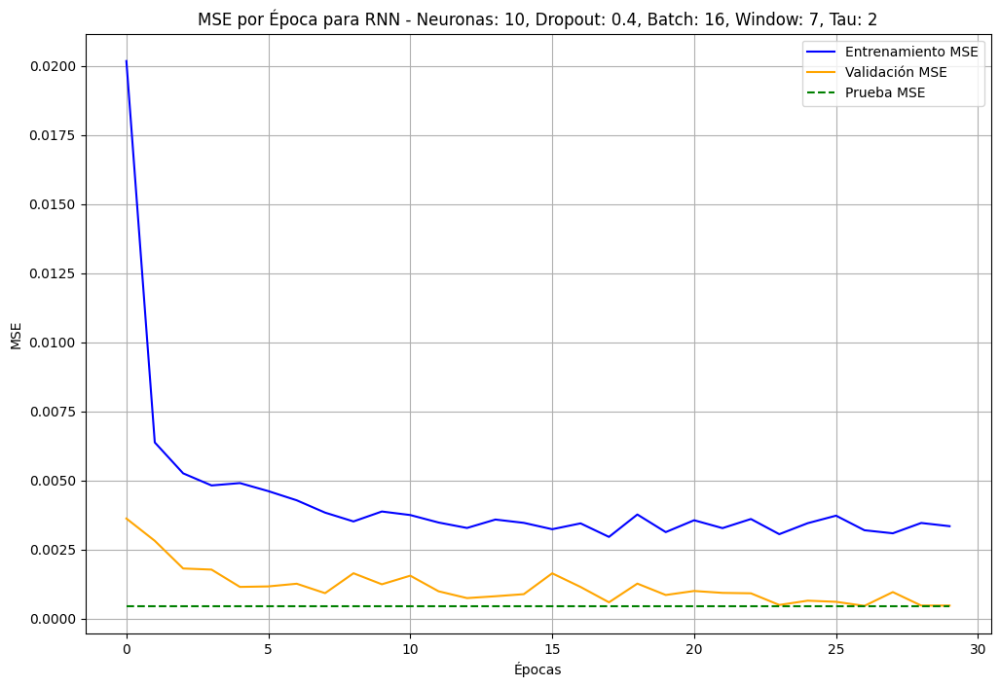

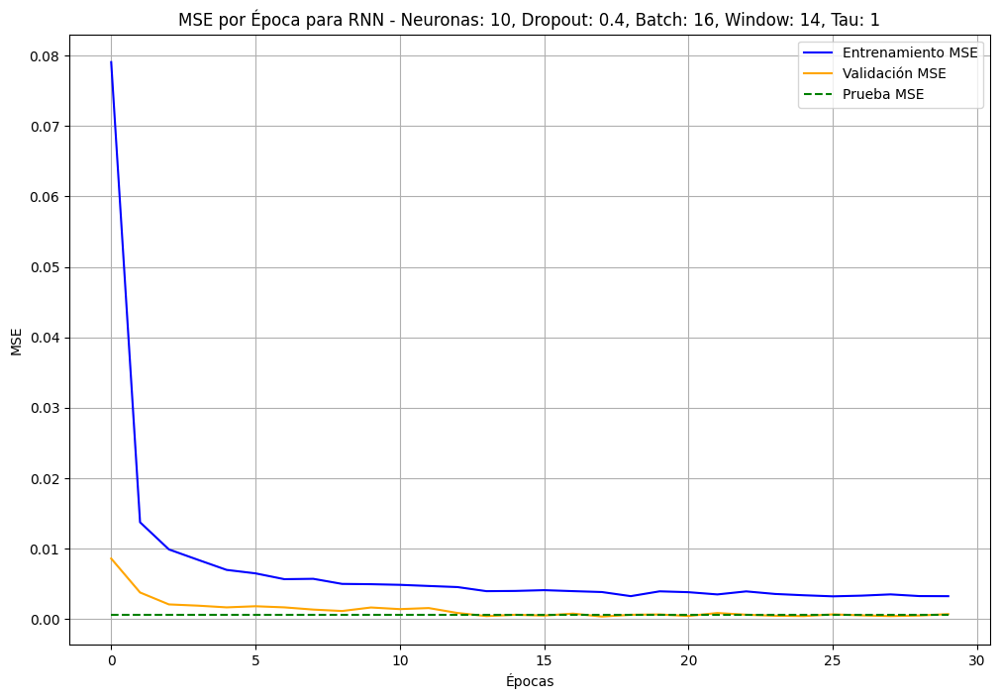

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\RNN_10neurons_0.4dropout_batch16_window14_tau2_history.joblib


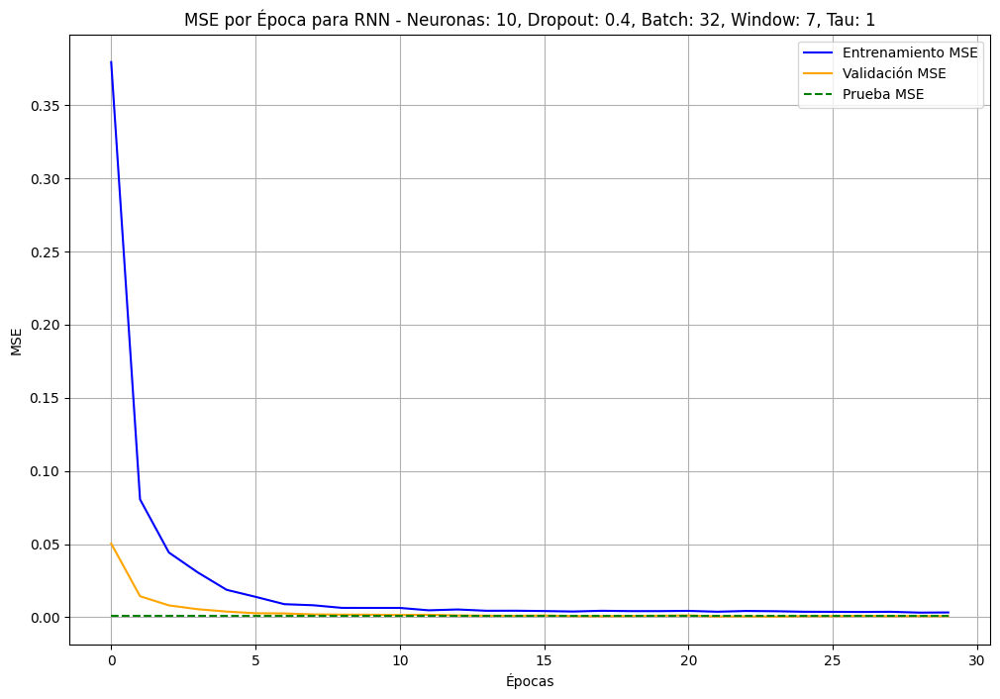

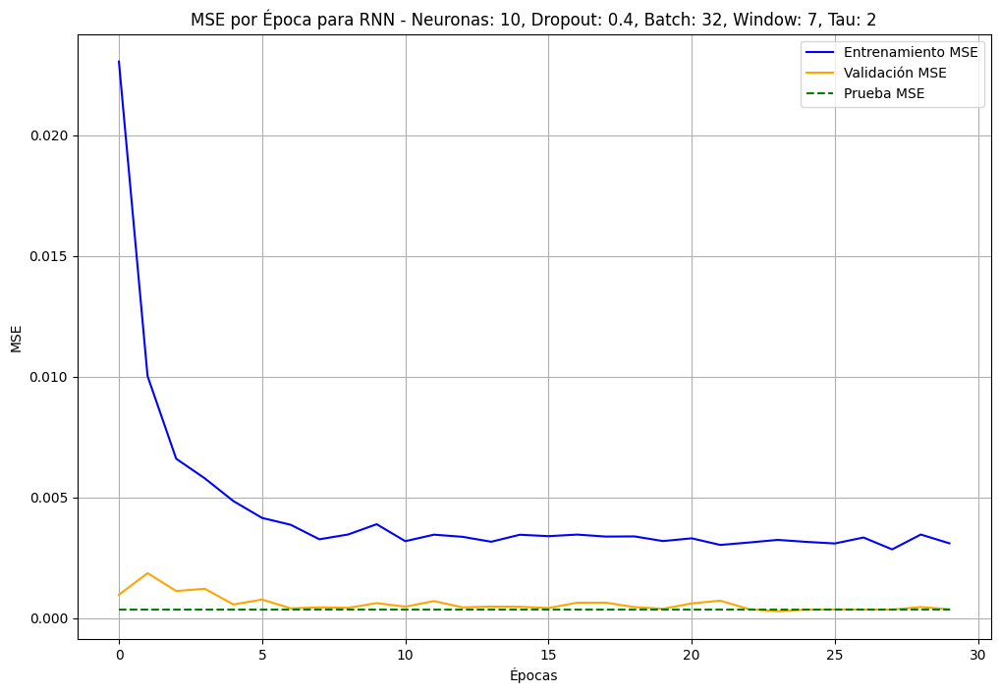

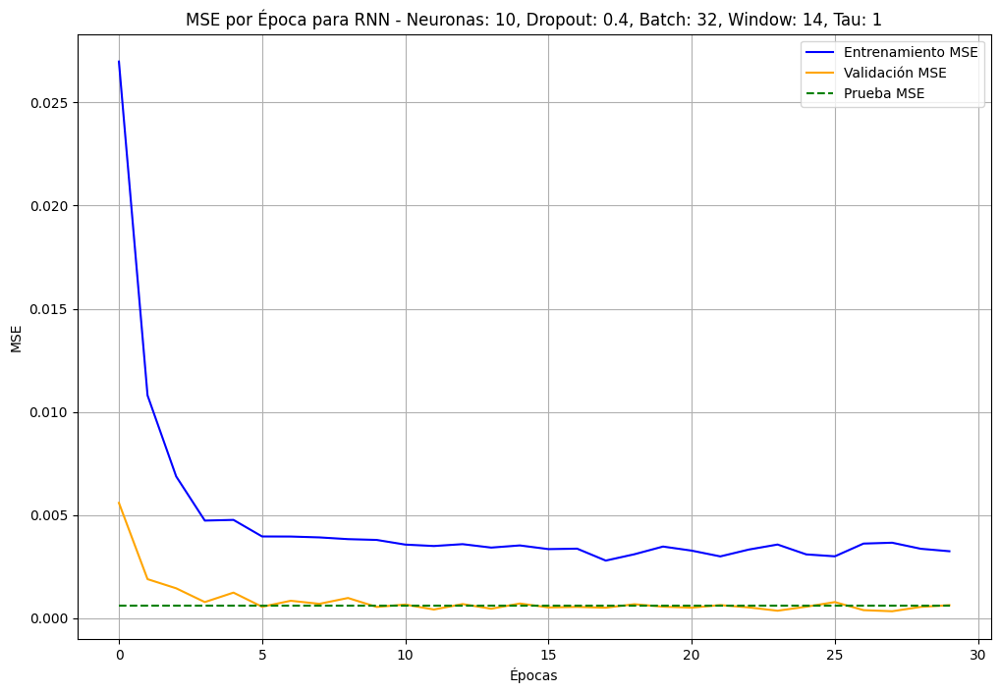

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\RNN_10neurons_0.4dropout_batch32_window14_tau2_history.joblib


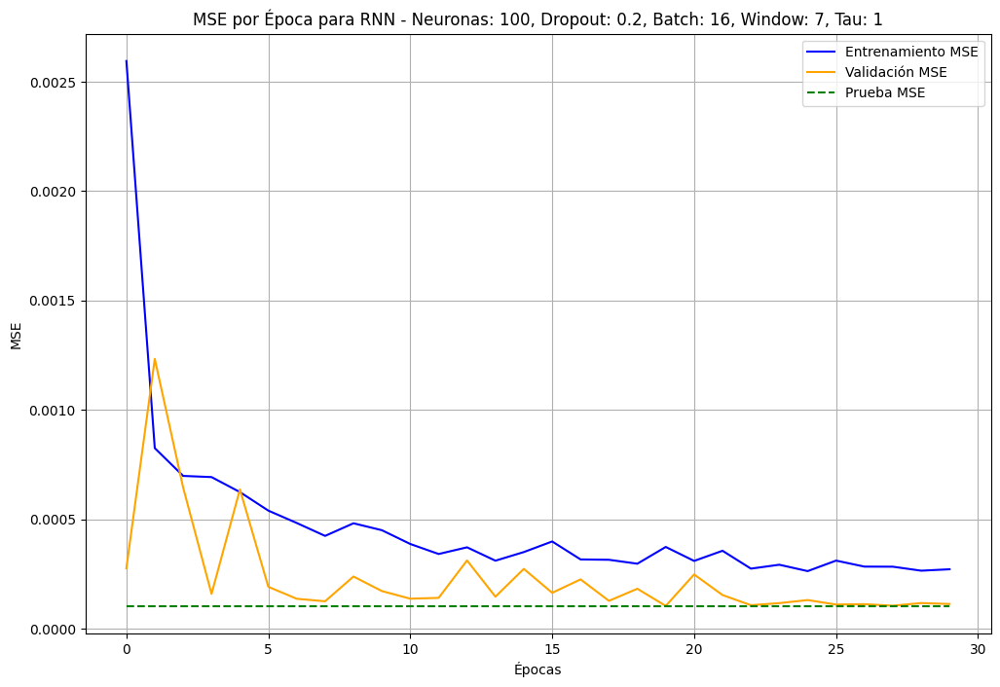

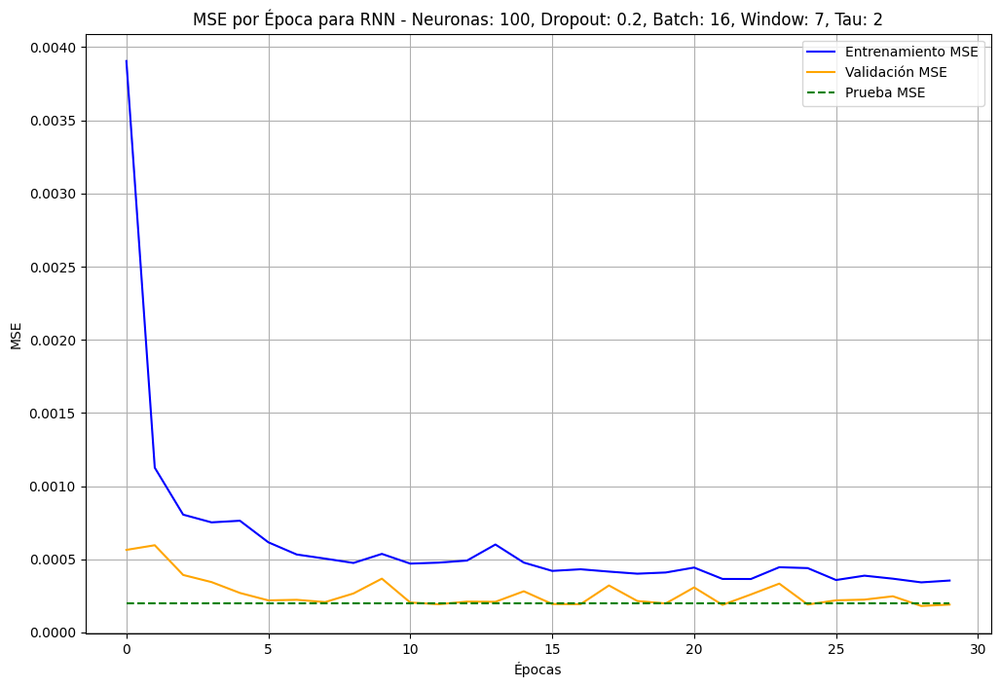

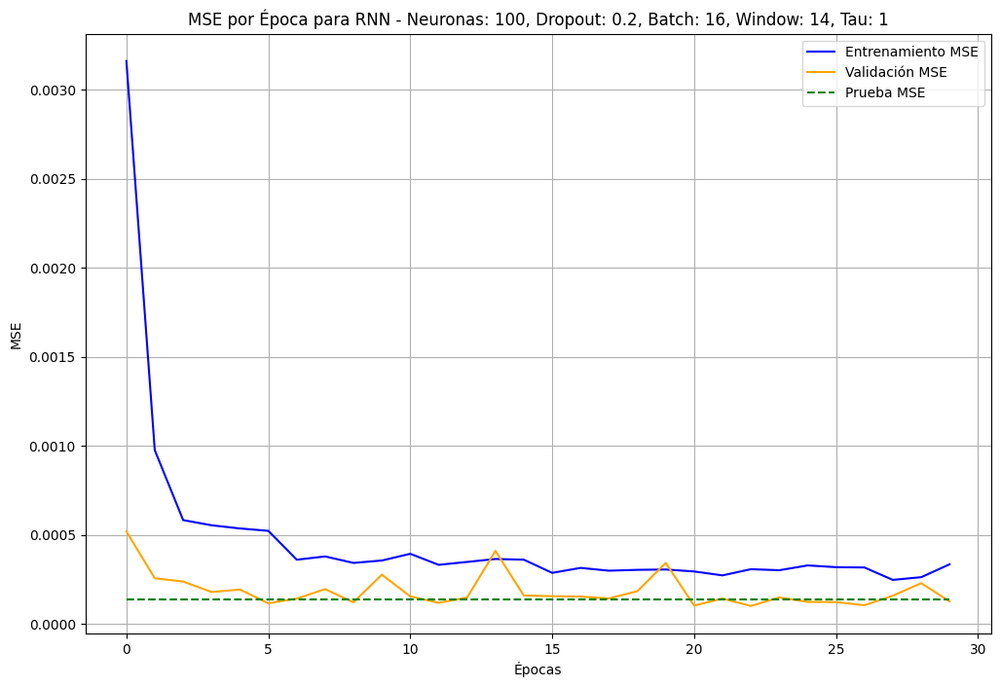

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\RNN_100neurons_0.2dropout_batch16_window14_tau2_history.joblib


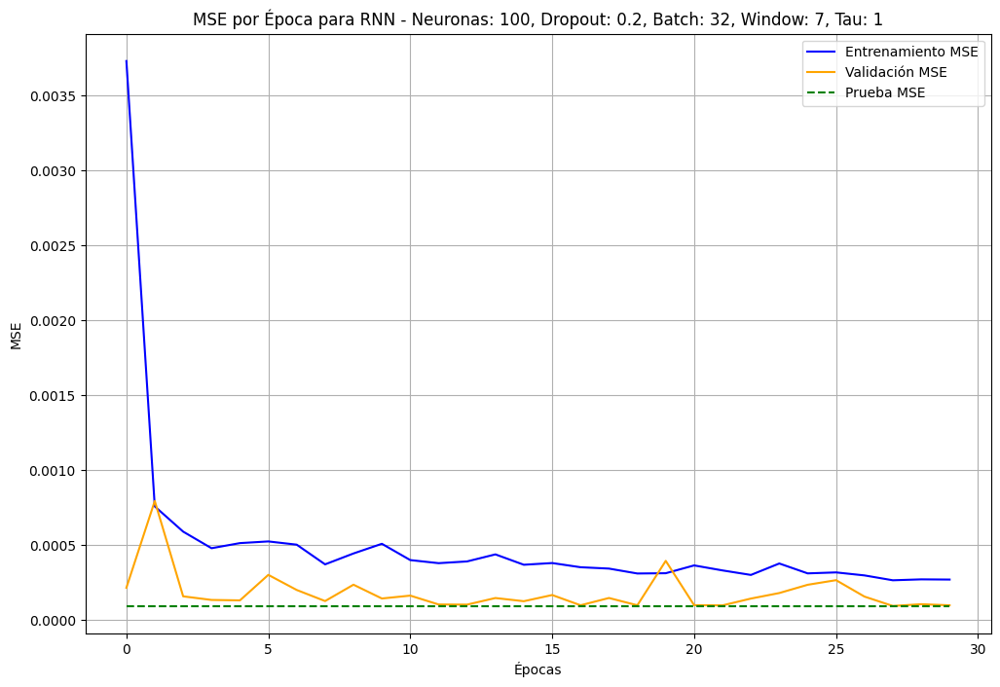

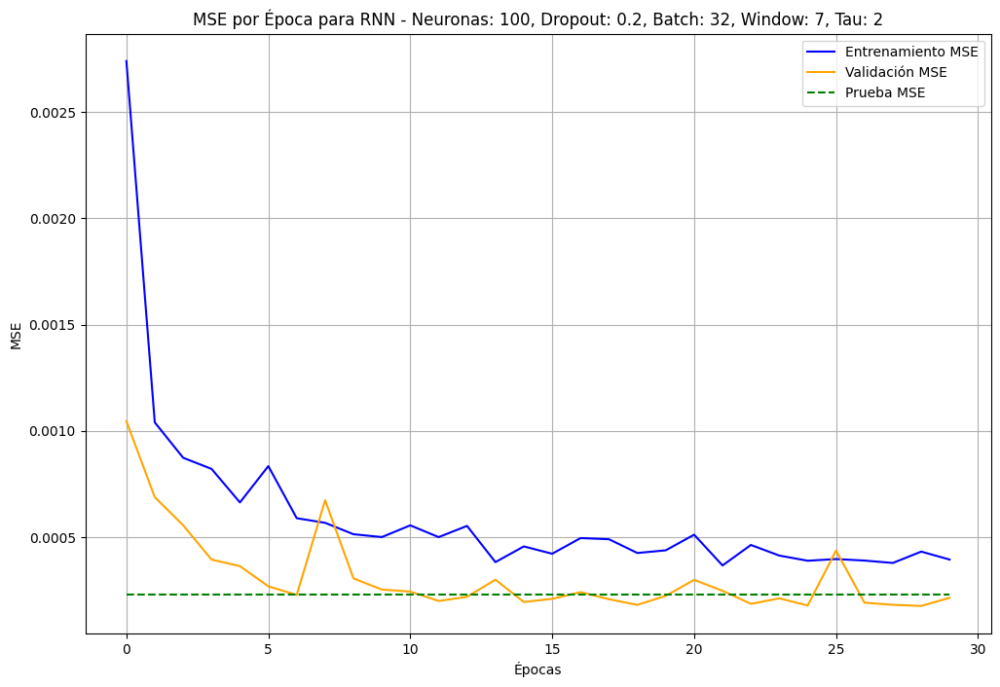

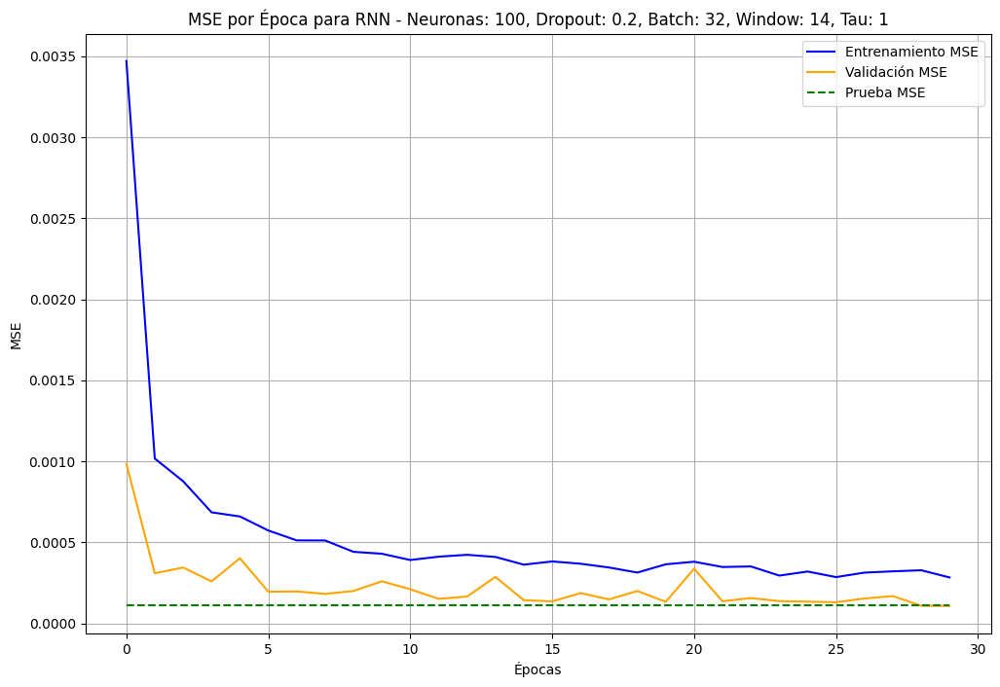

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\RNN_100neurons_0.2dropout_batch32_window14_tau2_history.joblib


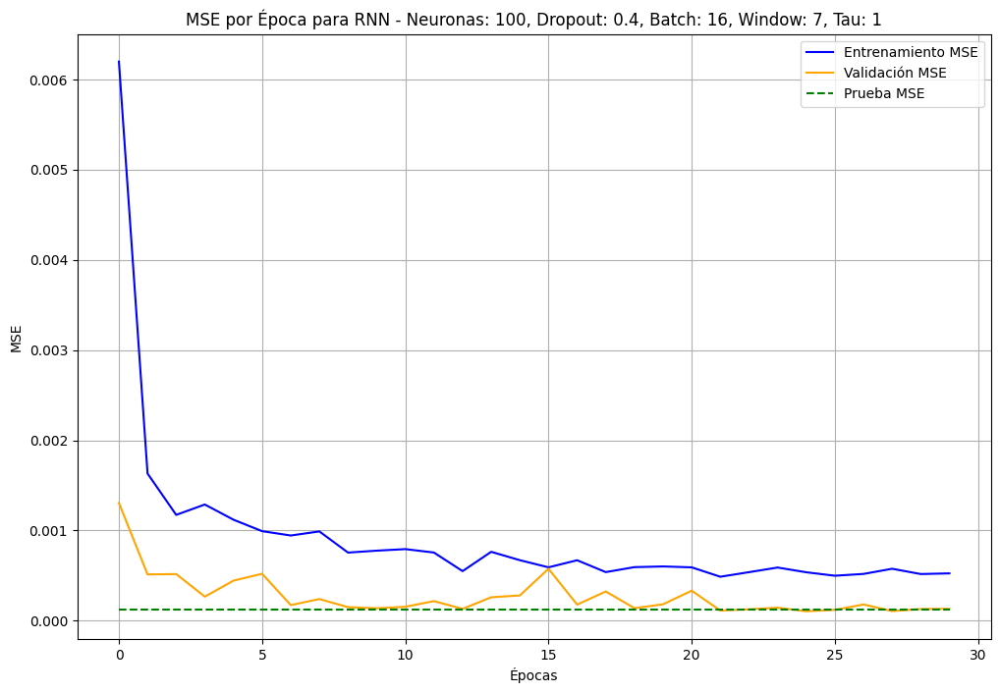

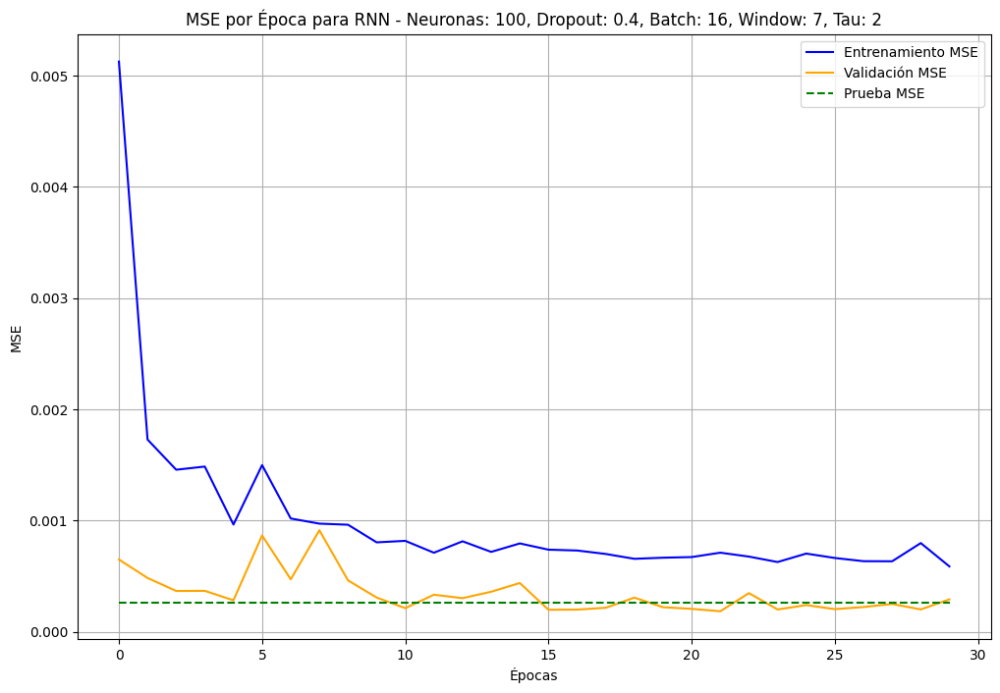

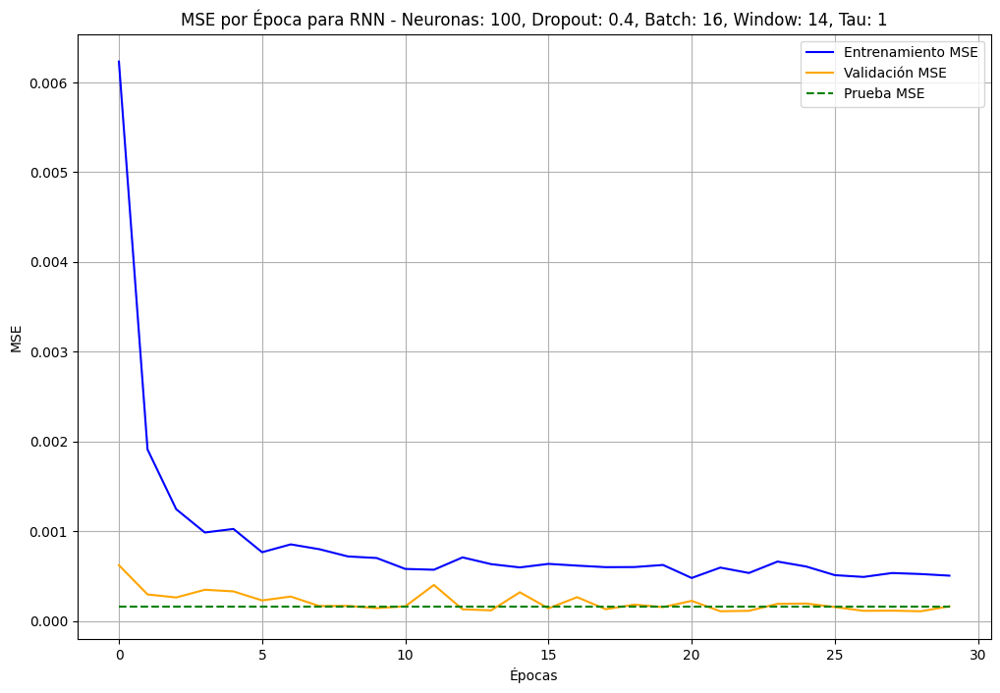

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\RNN_100neurons_0.4dropout_batch16_window14_tau2_history.joblib


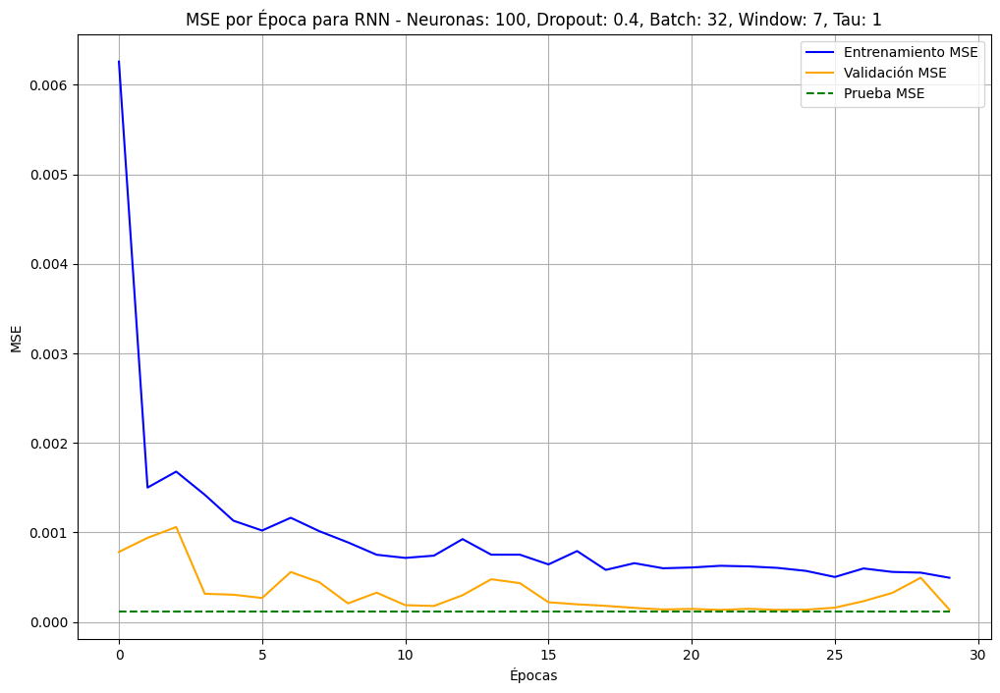

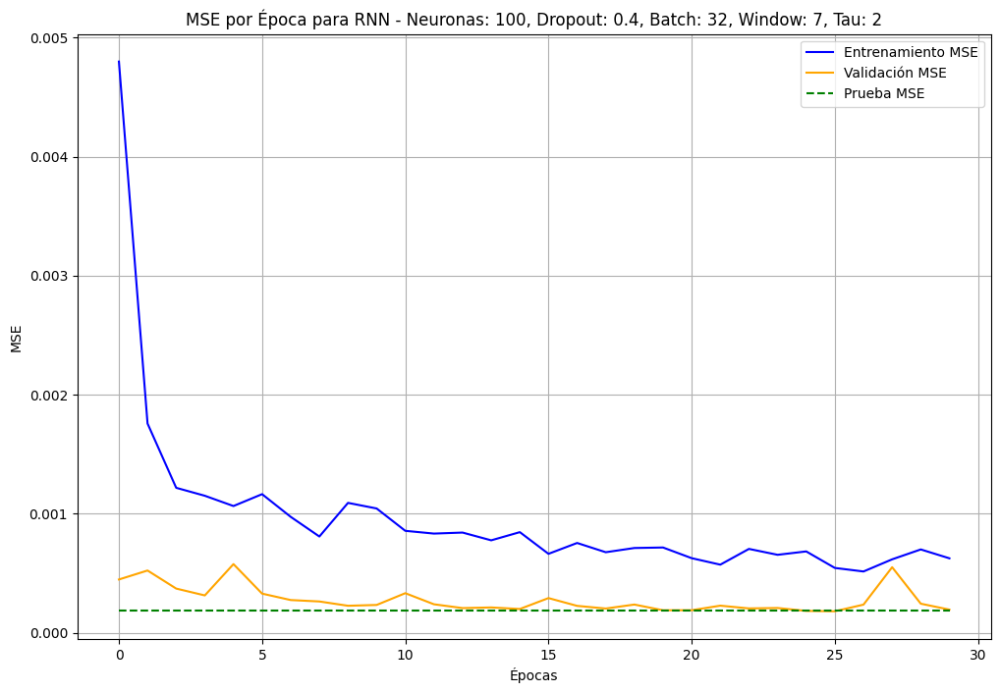

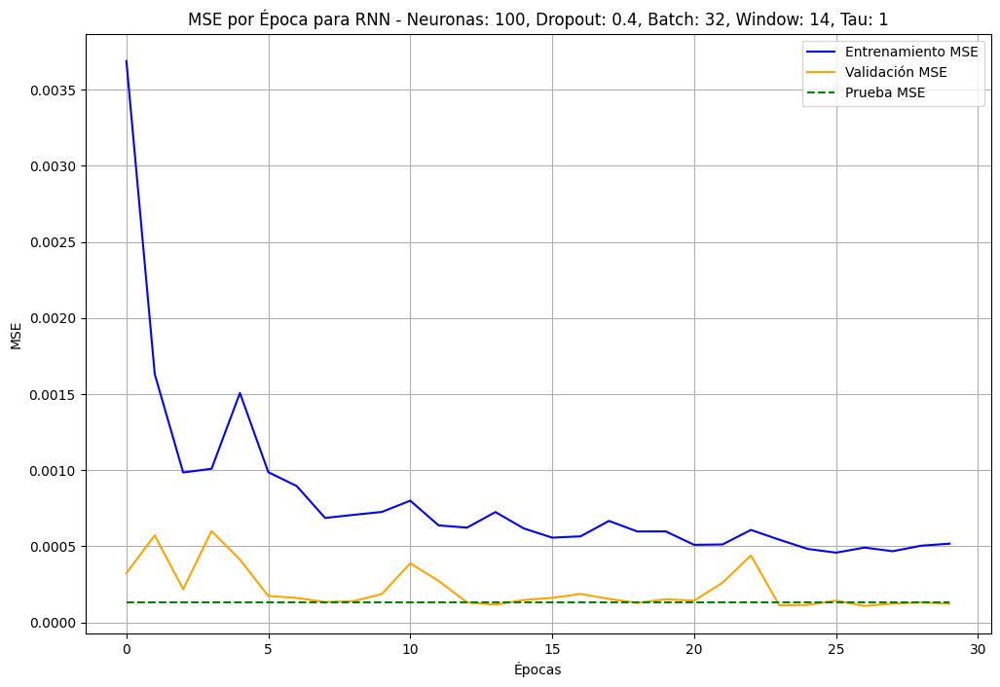

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\RNN_100neurons_0.4dropout_batch32_window14_tau2_history.joblib


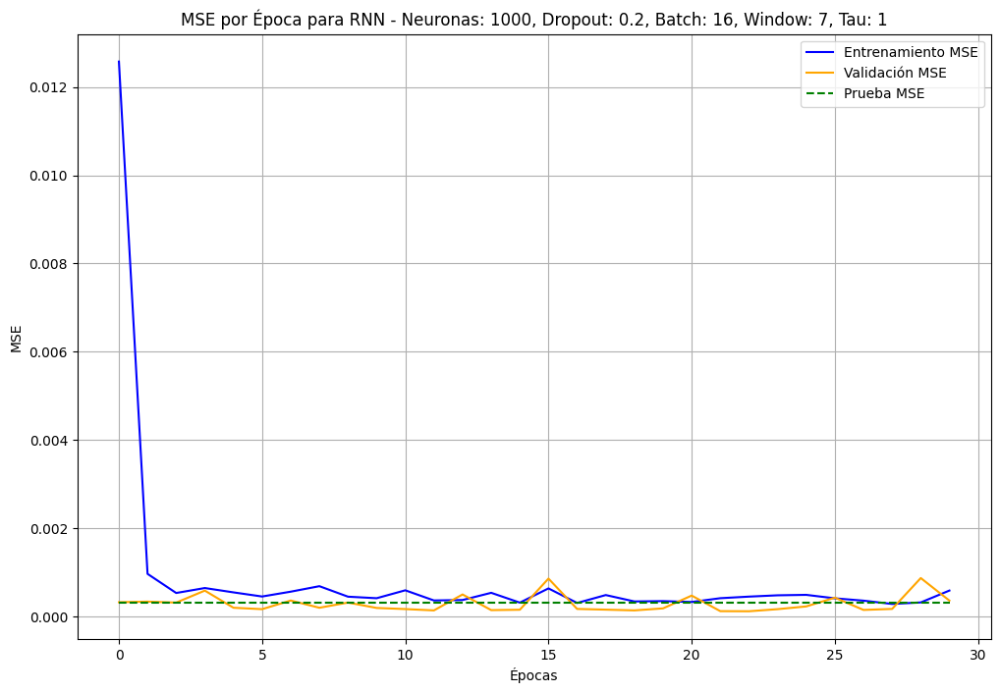

No se encontró el archivo de historial: modelos_precios/models_window_7_tau_2\RNN_1000neurons_0.2dropout_batch16_window7_tau2_history.joblib


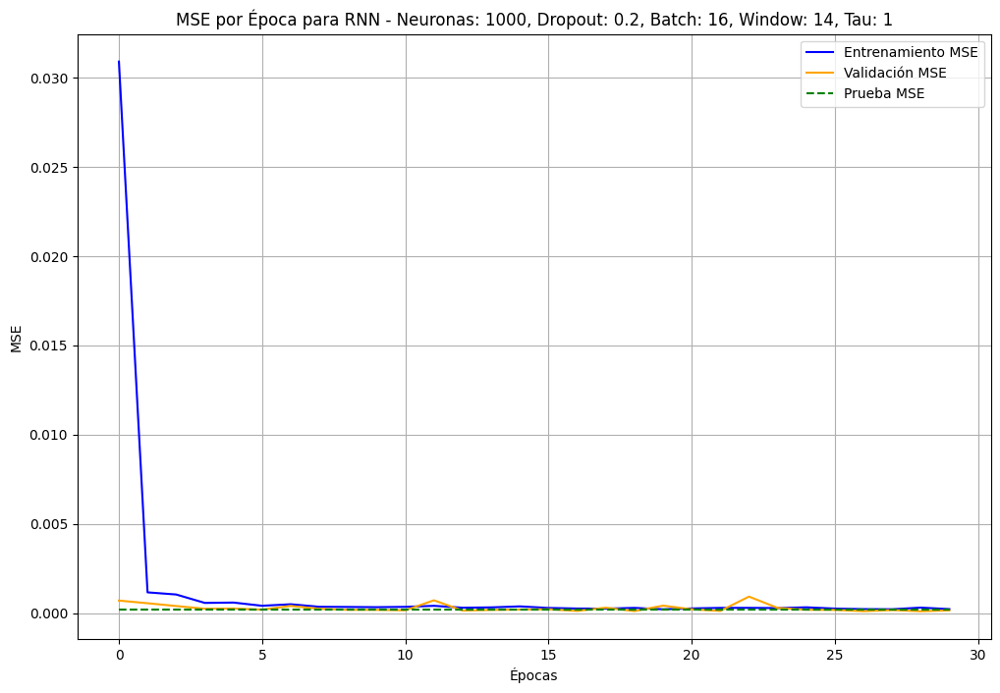

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\RNN_1000neurons_0.2dropout_batch16_window14_tau2_history.joblib


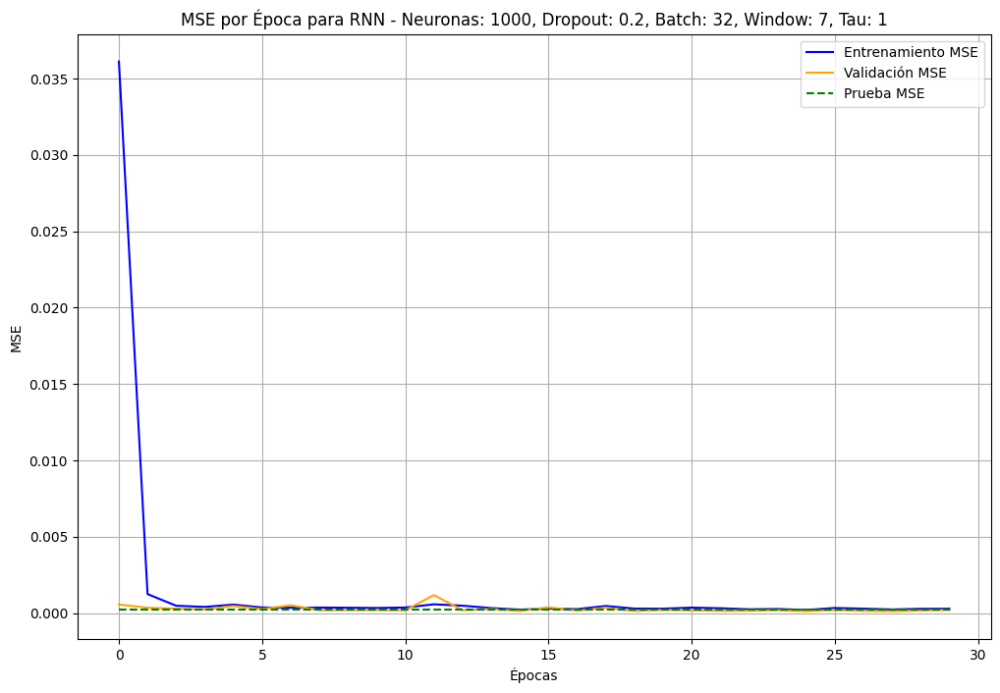

No se encontró el archivo de historial: modelos_precios/models_window_7_tau_2\RNN_1000neurons_0.2dropout_batch32_window7_tau2_history.joblib


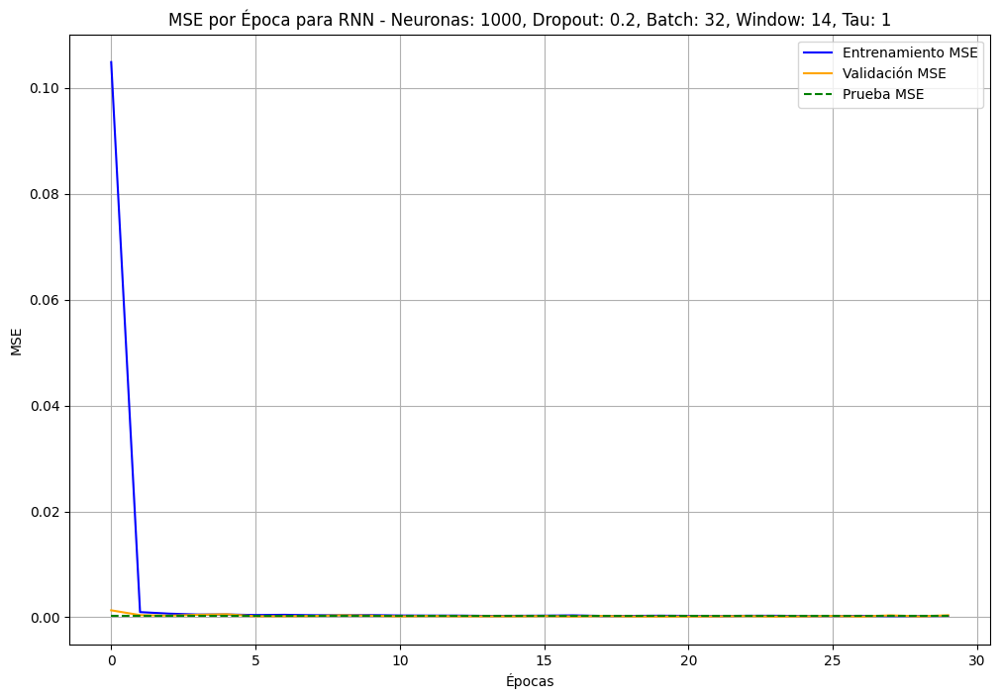

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\RNN_1000neurons_0.2dropout_batch32_window14_tau2_history.joblib


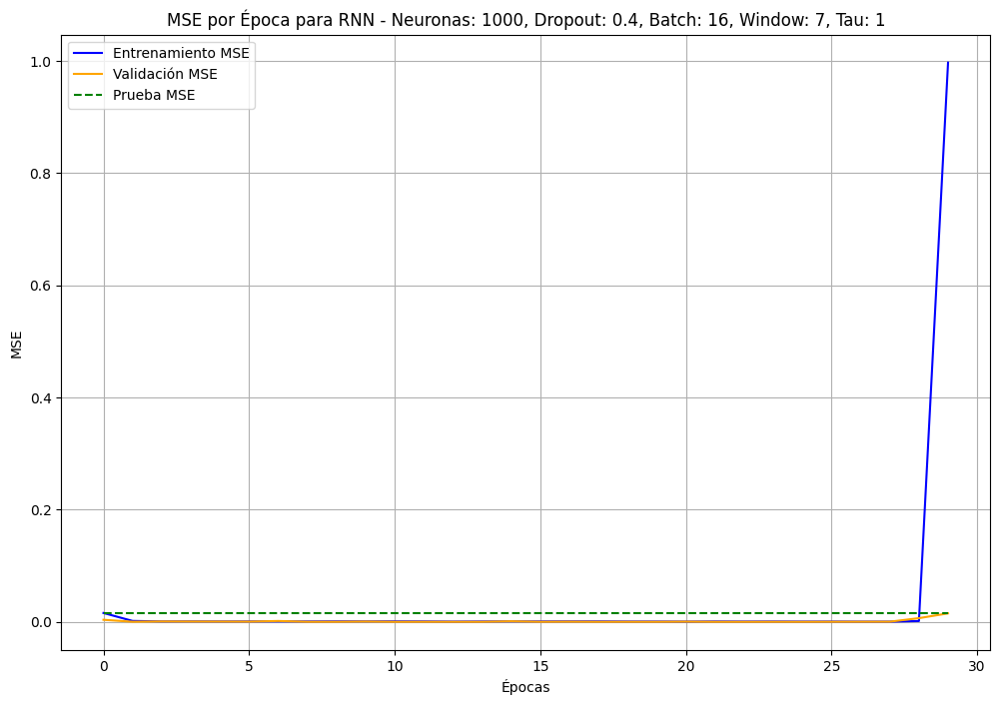

No se encontró el archivo de historial: modelos_precios/models_window_7_tau_2\RNN_1000neurons_0.4dropout_batch16_window7_tau2_history.joblib


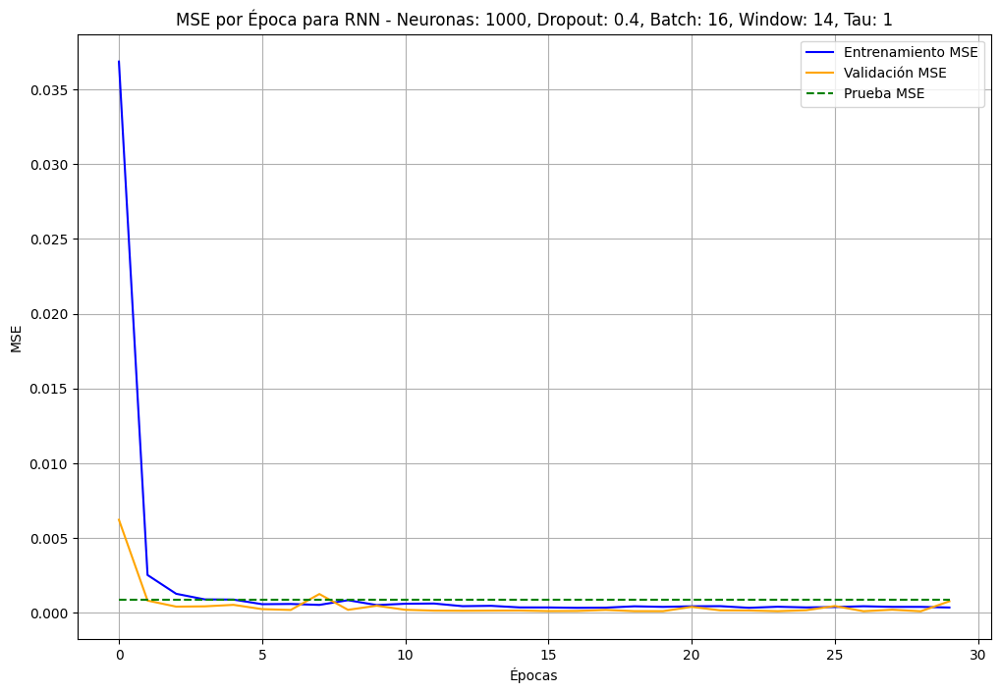

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\RNN_1000neurons_0.4dropout_batch16_window14_tau2_history.joblib


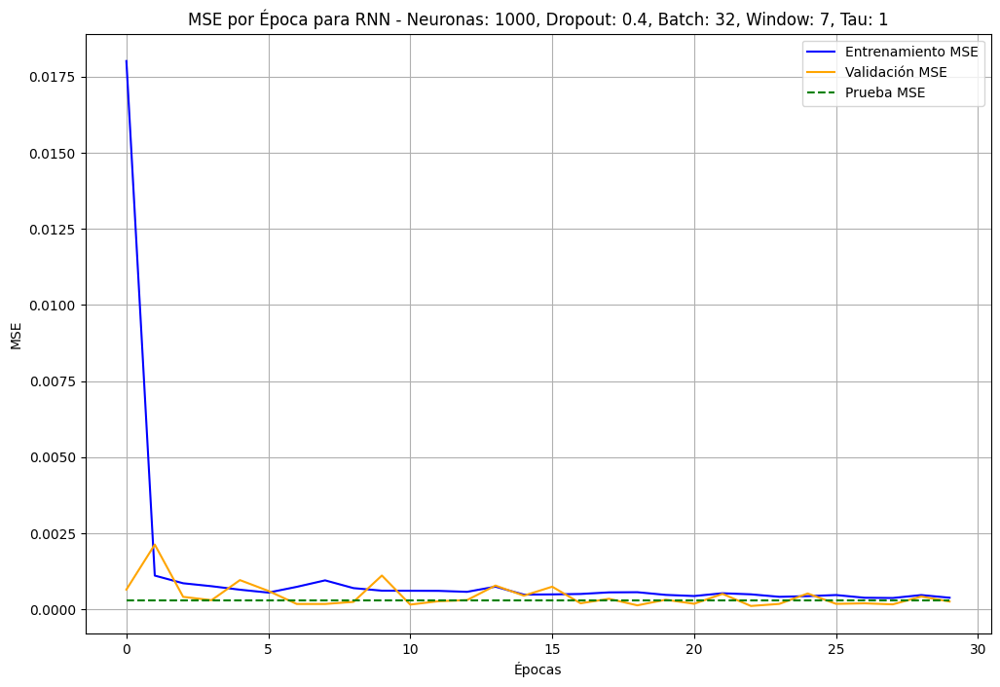

No se encontró el archivo de historial: modelos_precios/models_window_7_tau_2\RNN_1000neurons_0.4dropout_batch32_window7_tau2_history.joblib


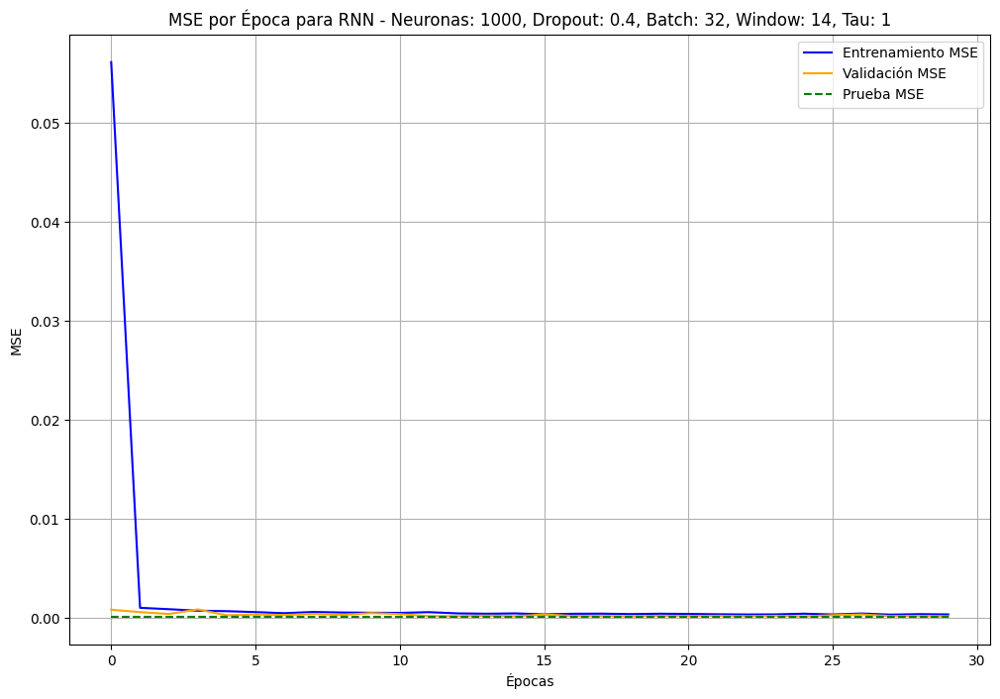

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\RNN_1000neurons_0.4dropout_batch32_window14_tau2_history.joblib


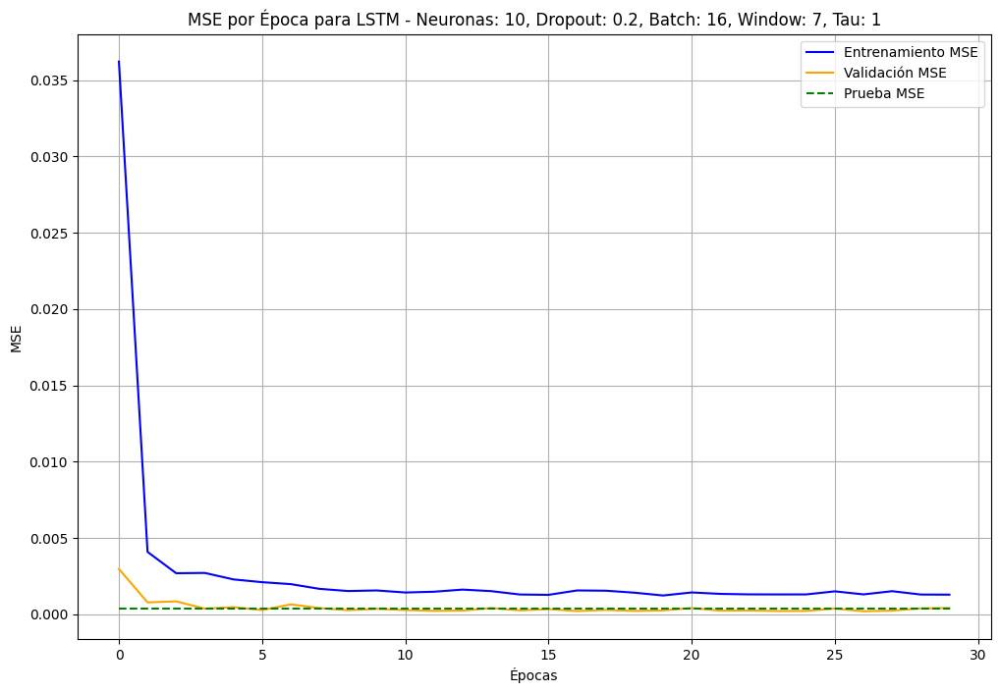

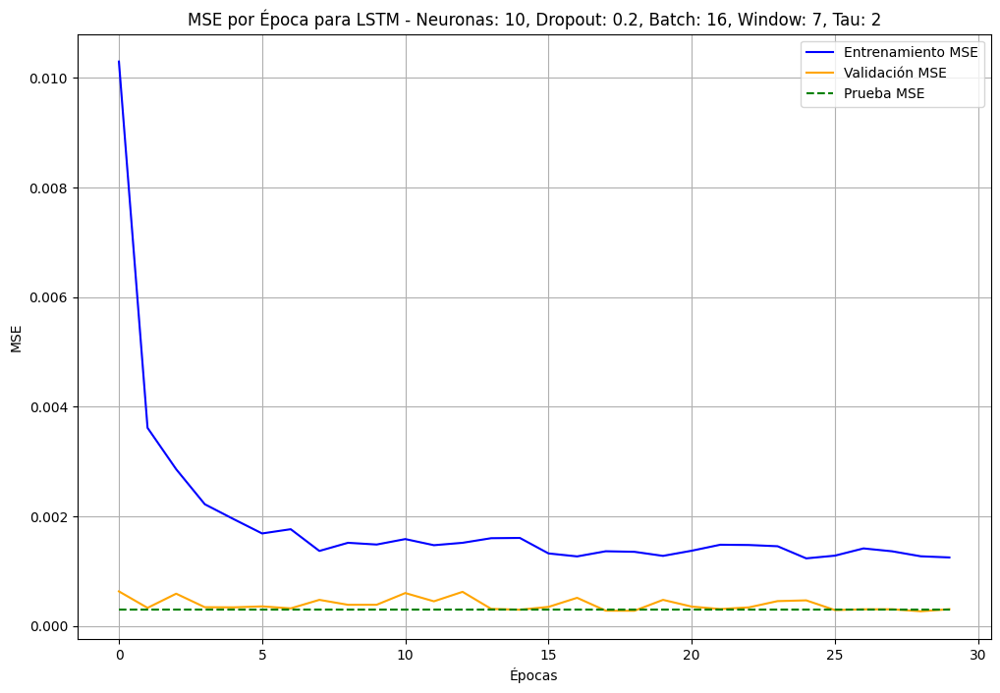

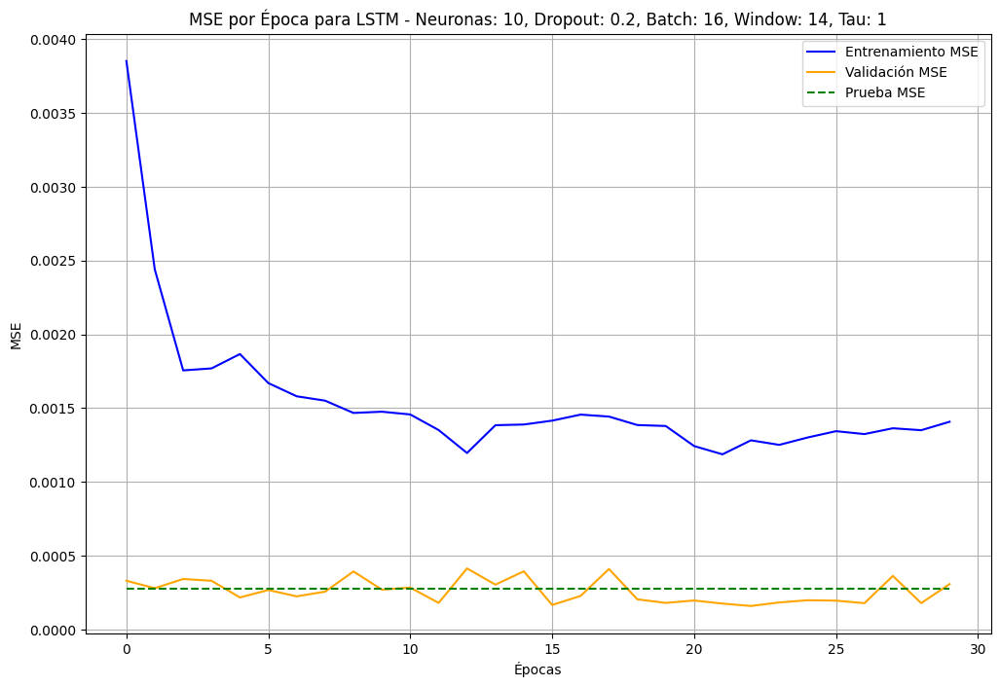

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\LSTM_10neurons_0.2dropout_batch16_window14_tau2_history.joblib


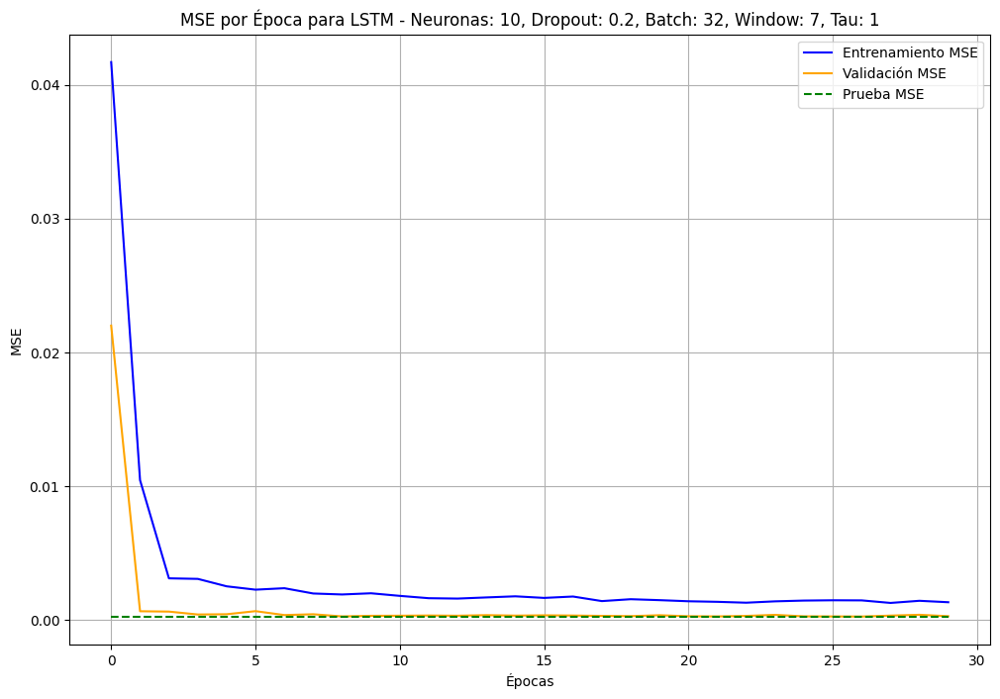

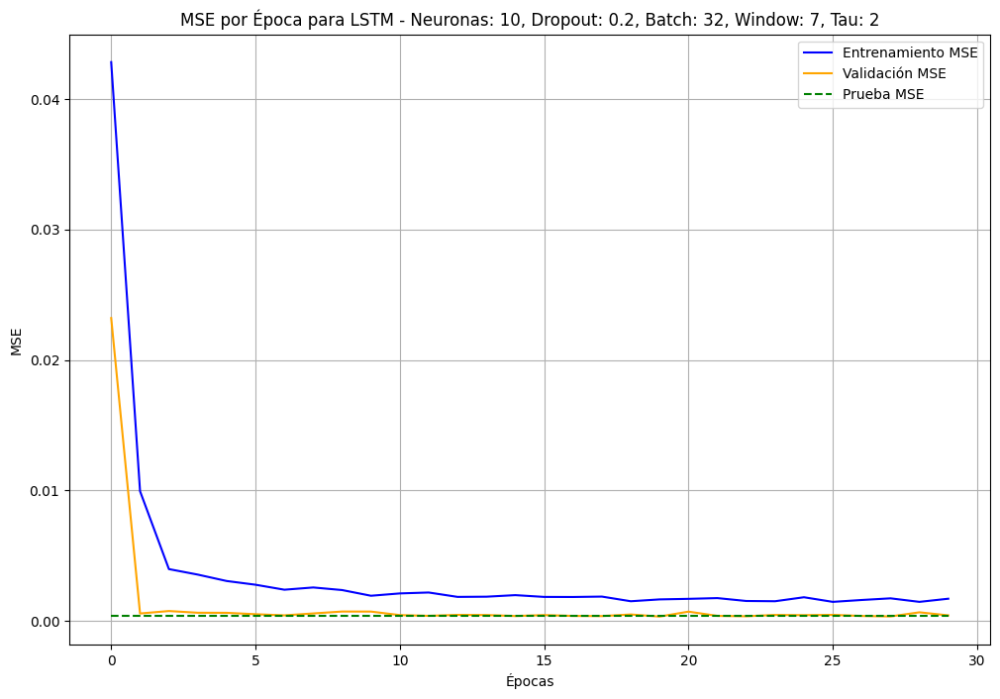

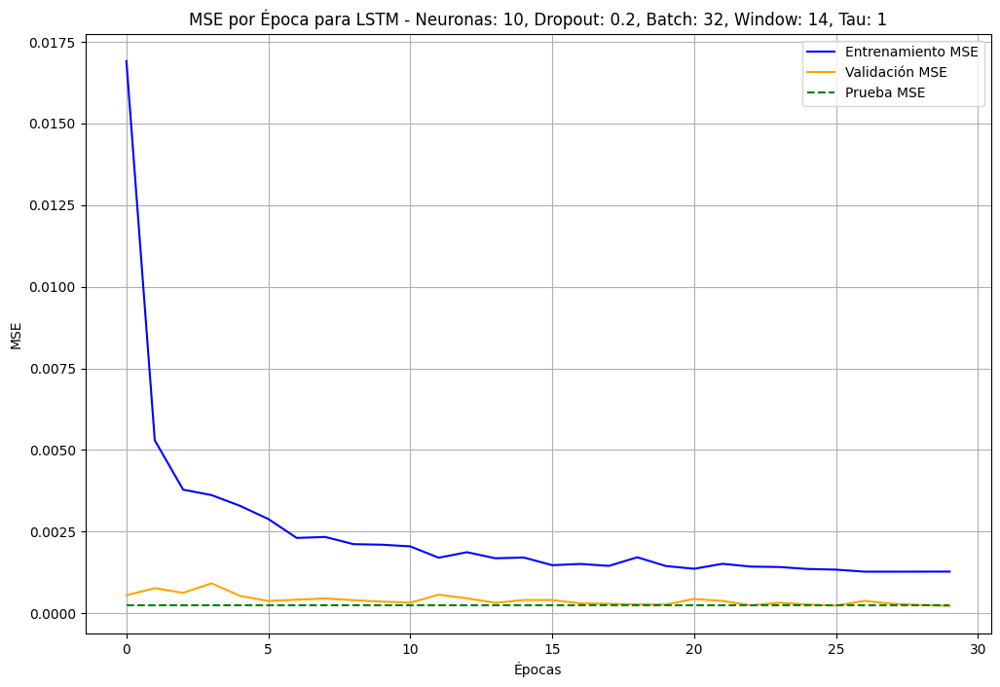

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\LSTM_10neurons_0.2dropout_batch32_window14_tau2_history.joblib


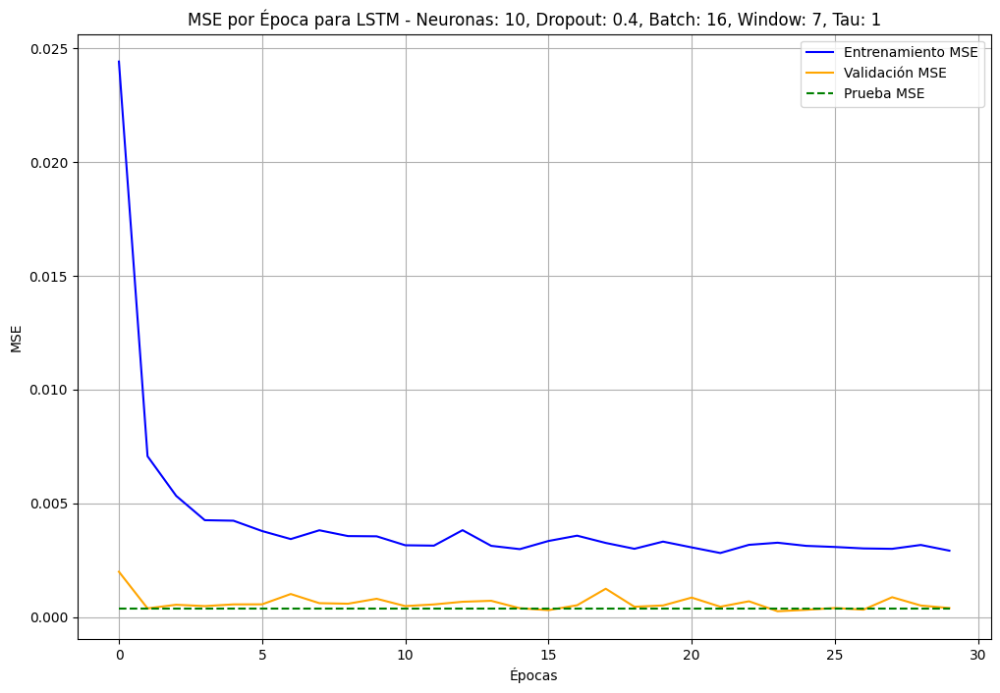

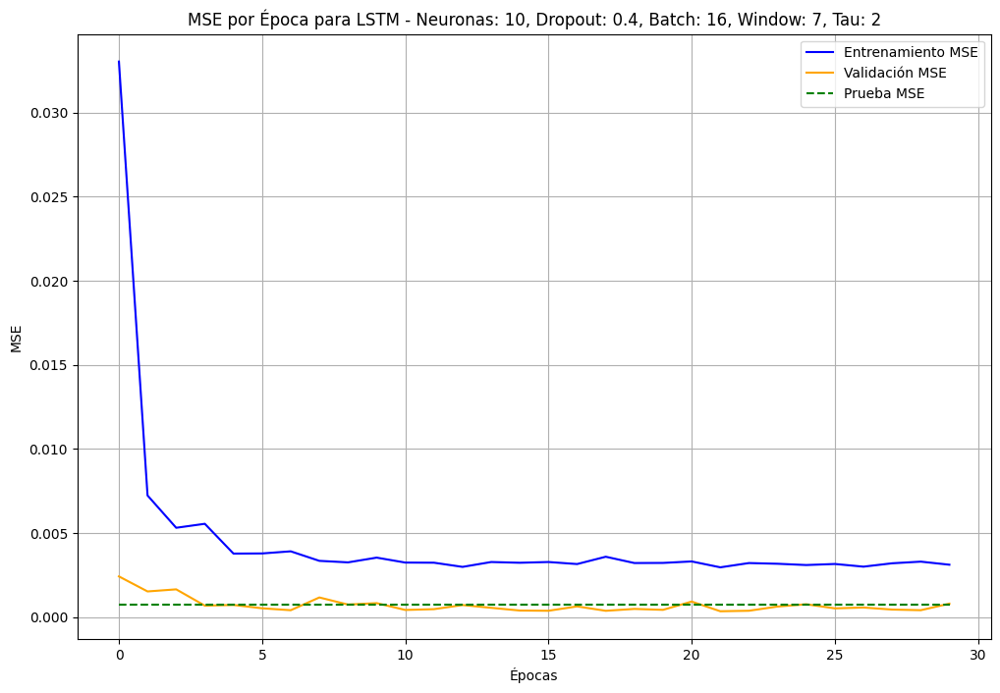

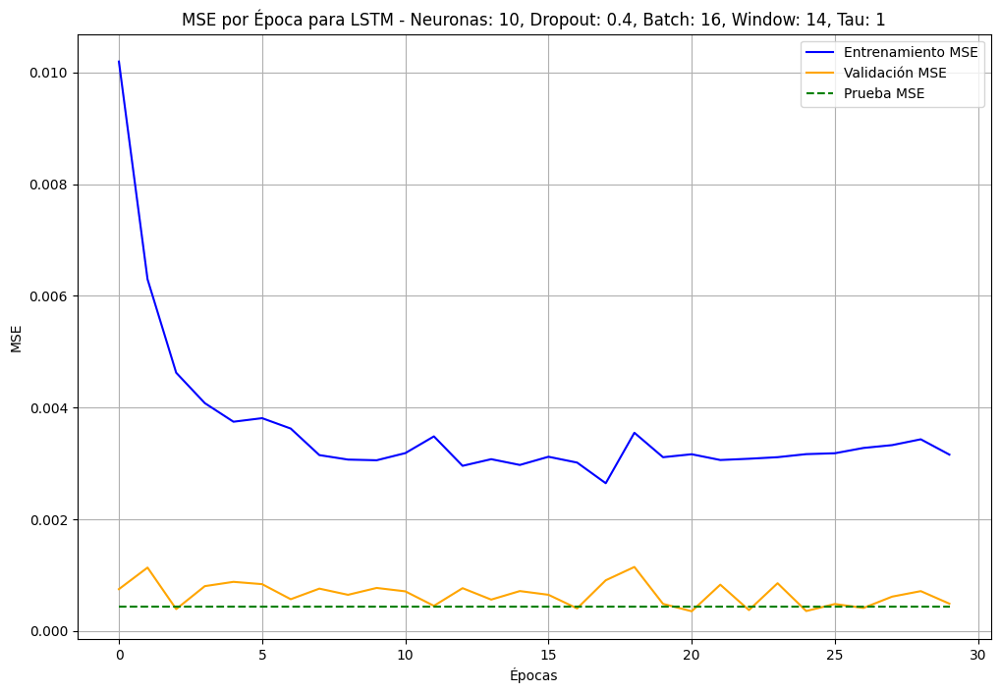

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\LSTM_10neurons_0.4dropout_batch16_window14_tau2_history.joblib


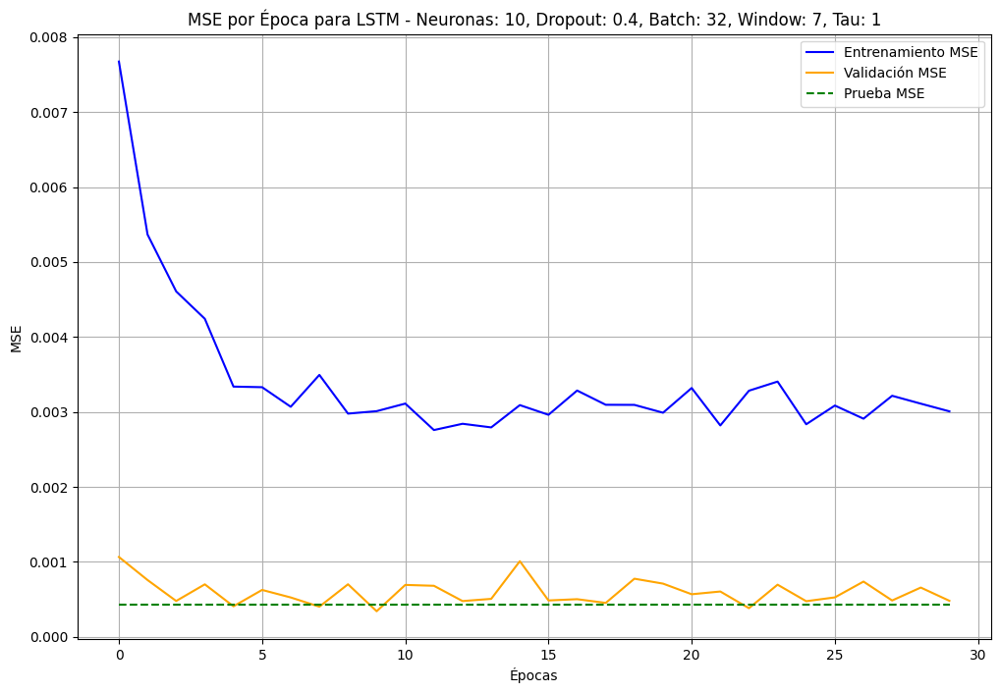

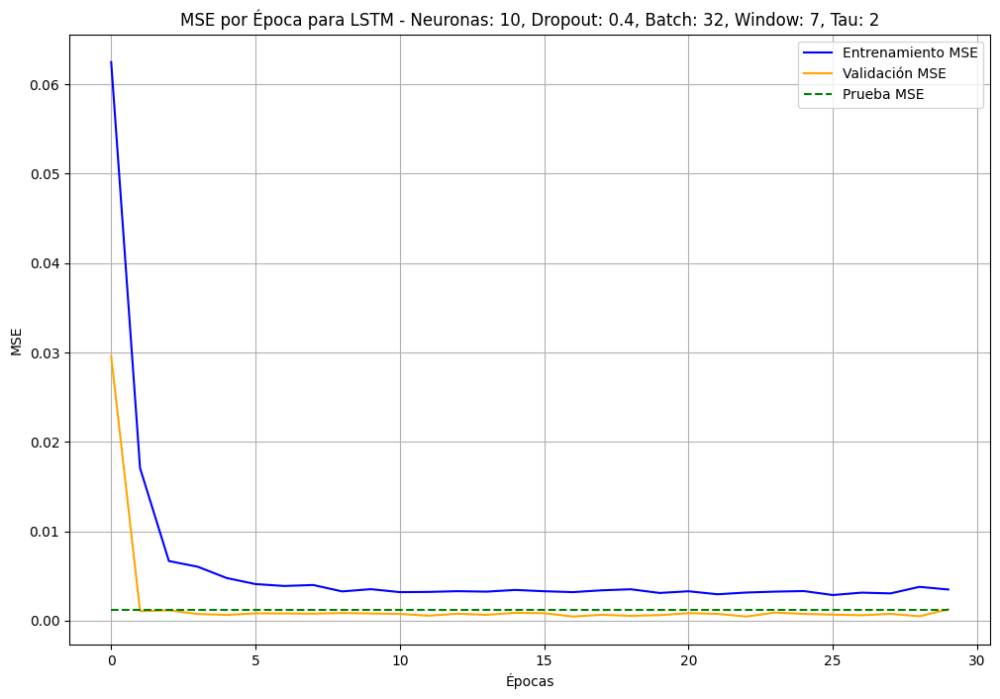

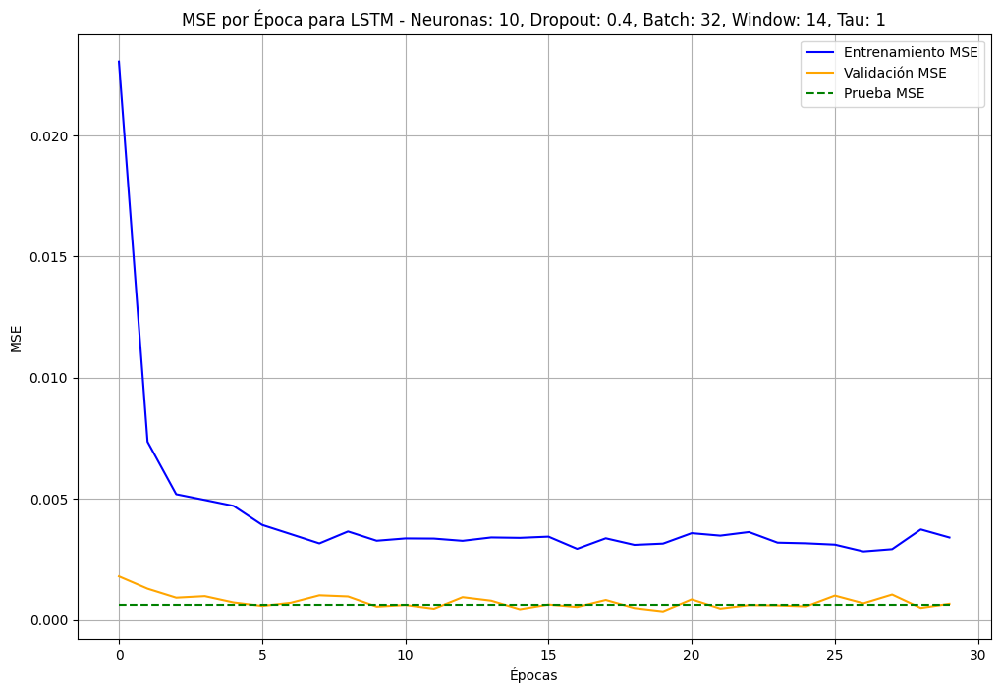

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\LSTM_10neurons_0.4dropout_batch32_window14_tau2_history.joblib


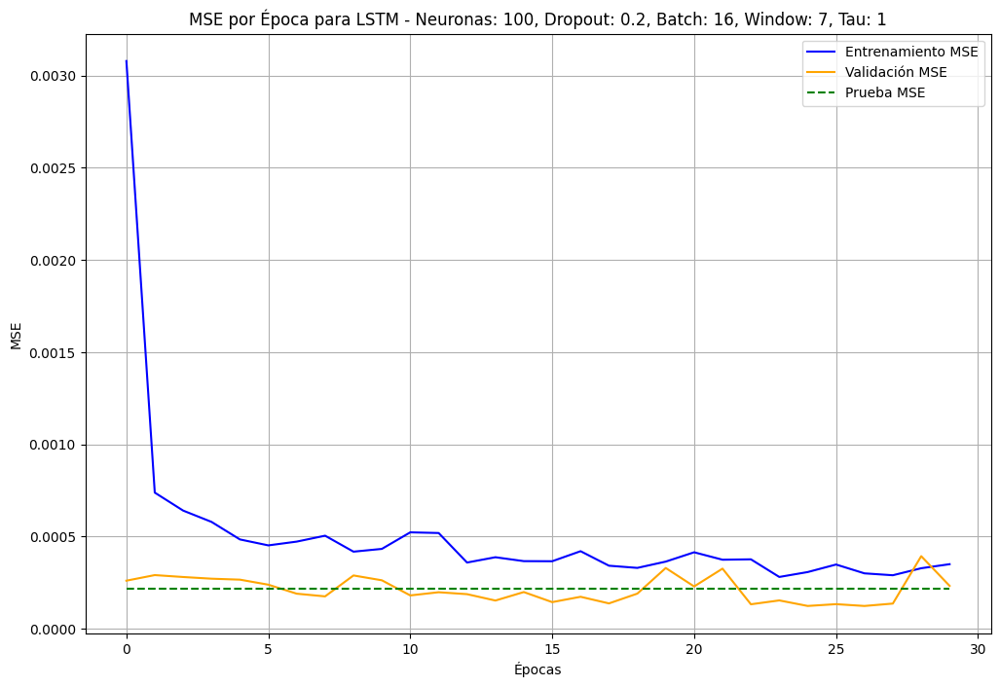

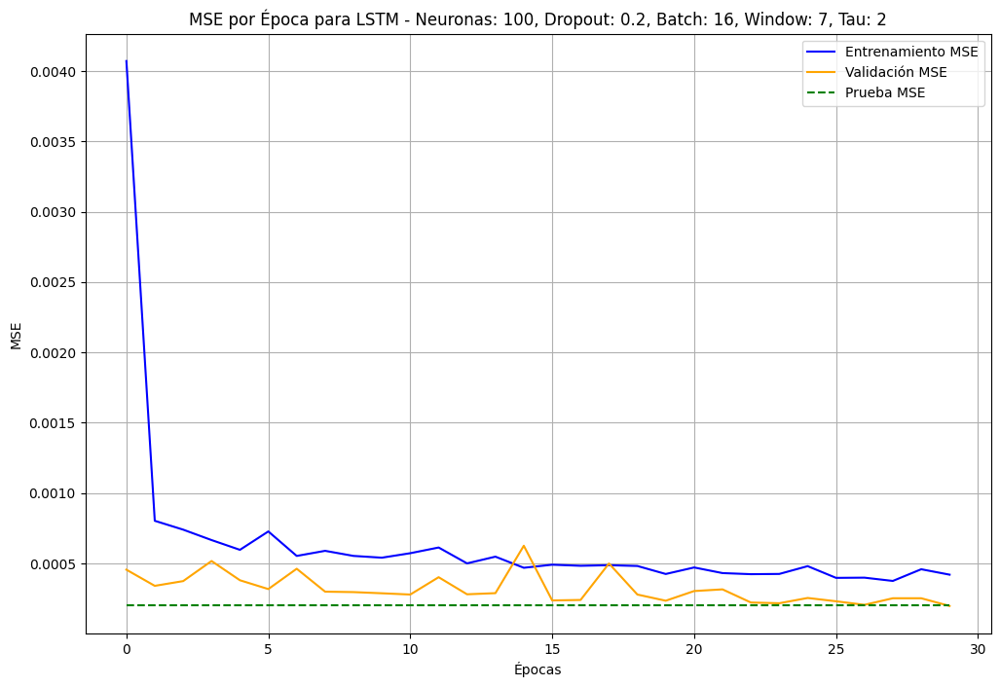

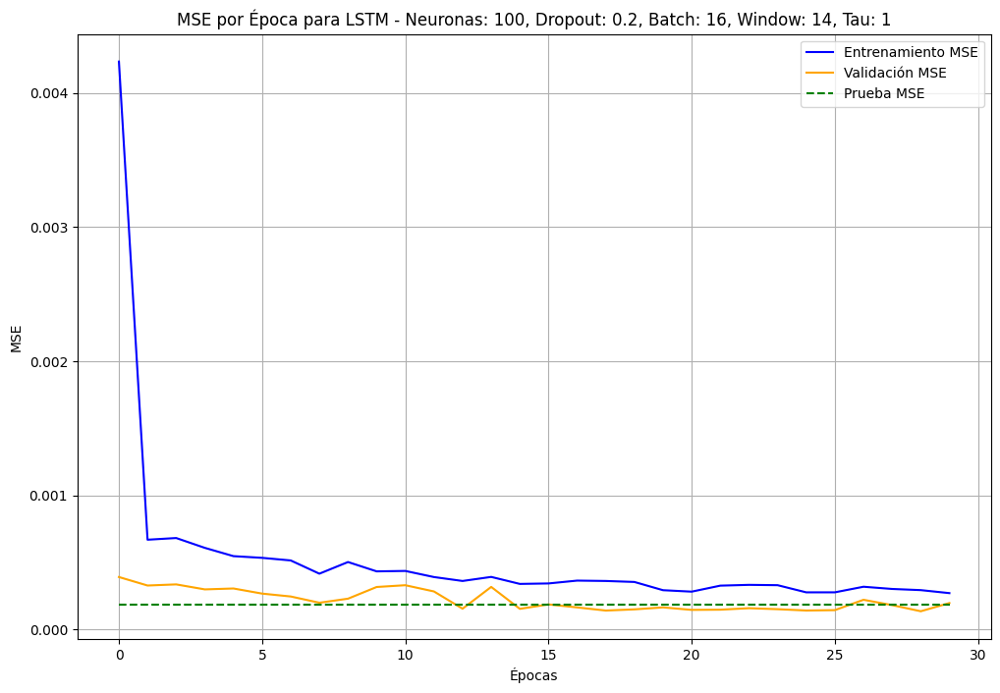

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\LSTM_100neurons_0.2dropout_batch16_window14_tau2_history.joblib


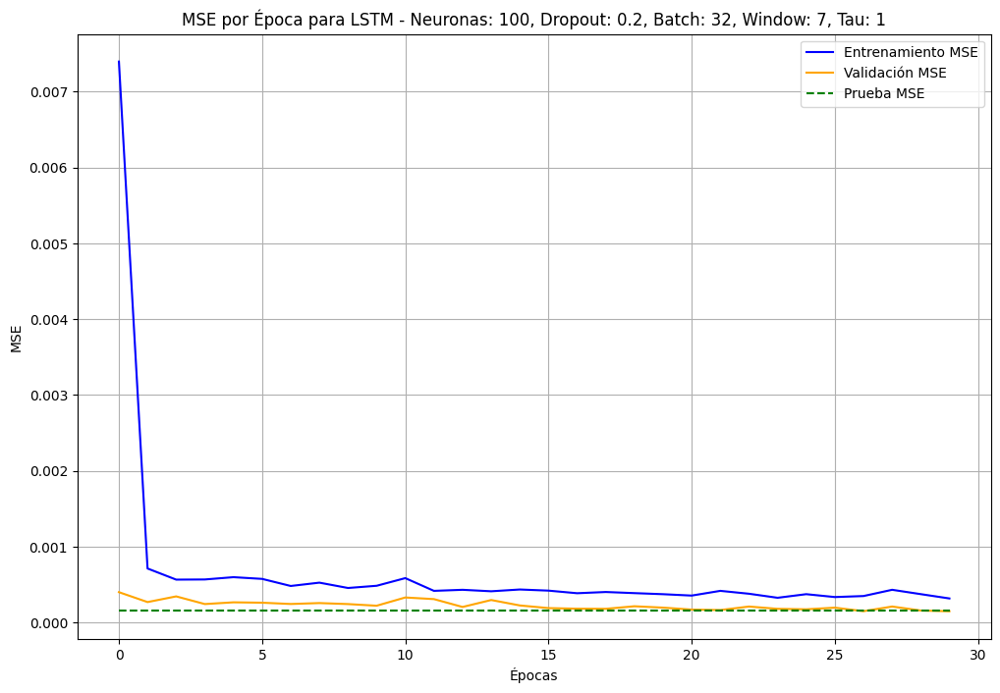

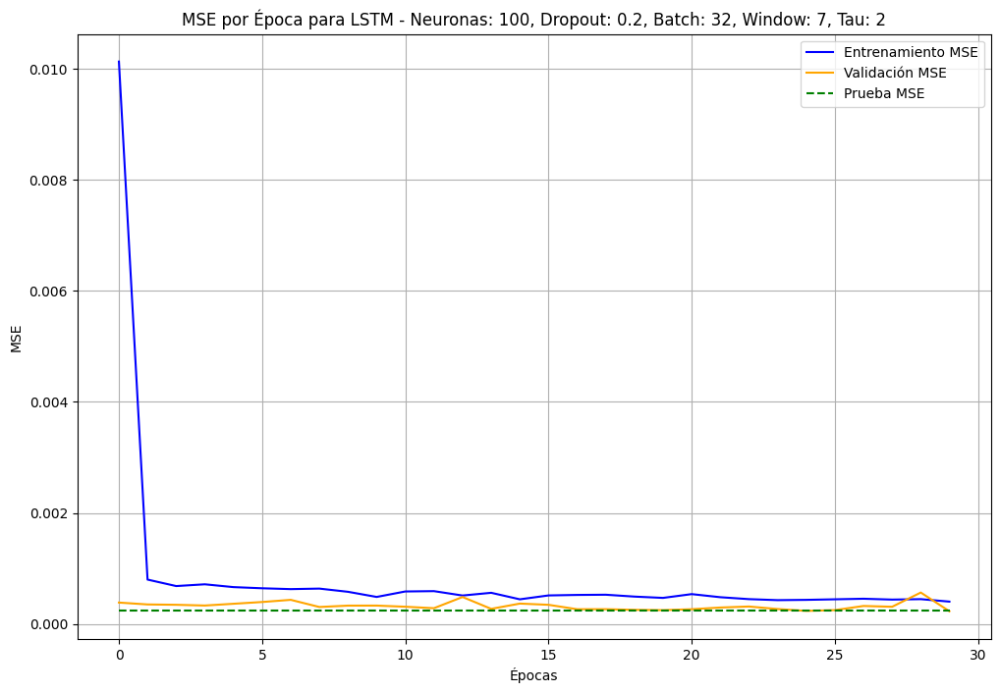

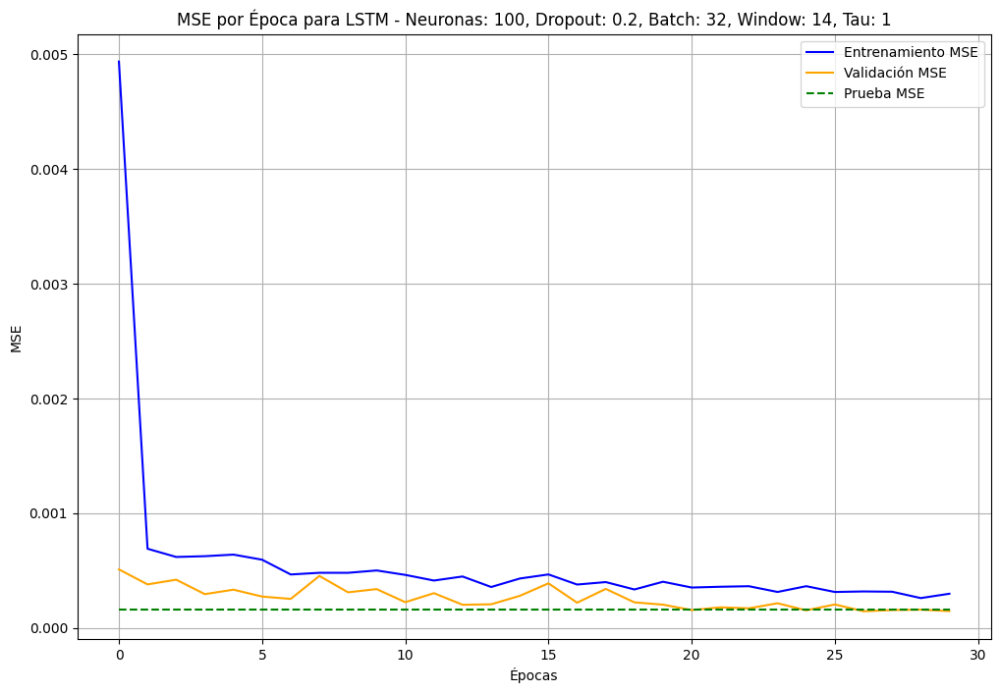

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\LSTM_100neurons_0.2dropout_batch32_window14_tau2_history.joblib


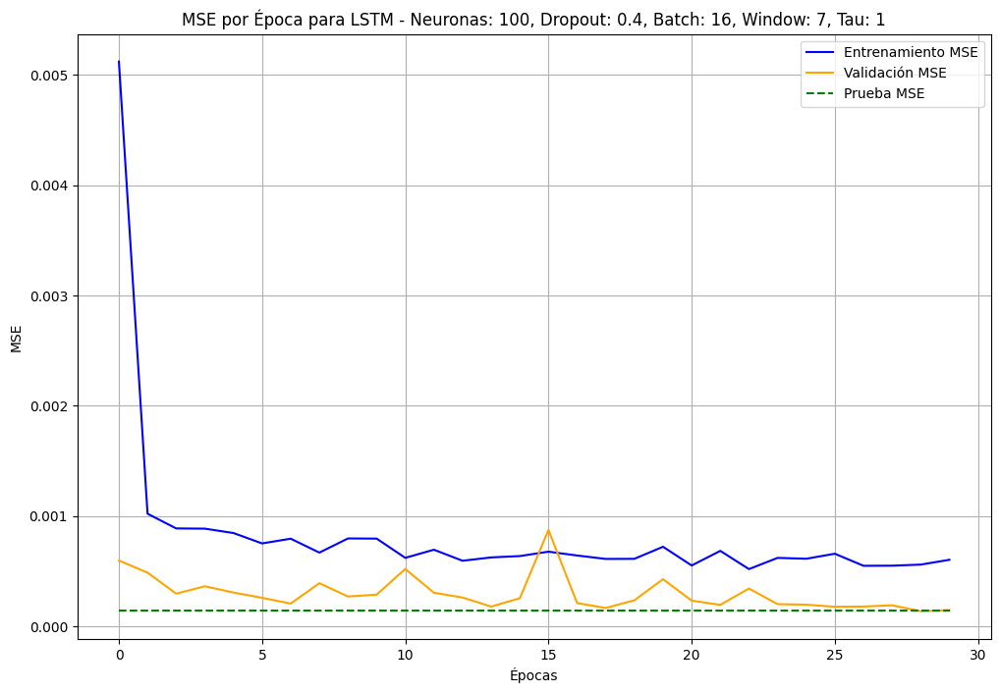

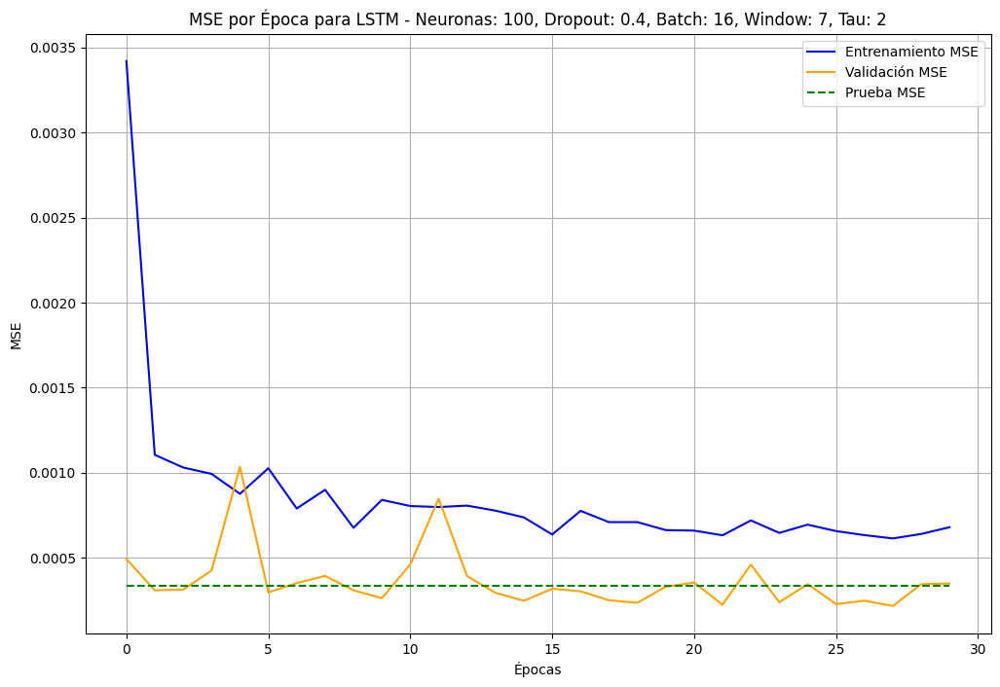

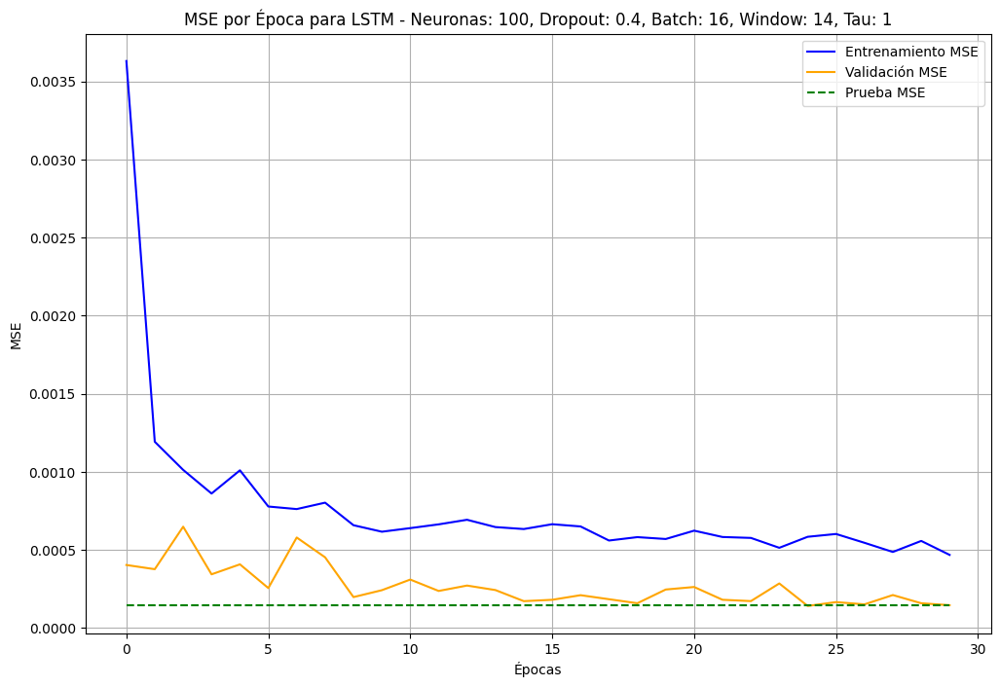

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\LSTM_100neurons_0.4dropout_batch16_window14_tau2_history.joblib


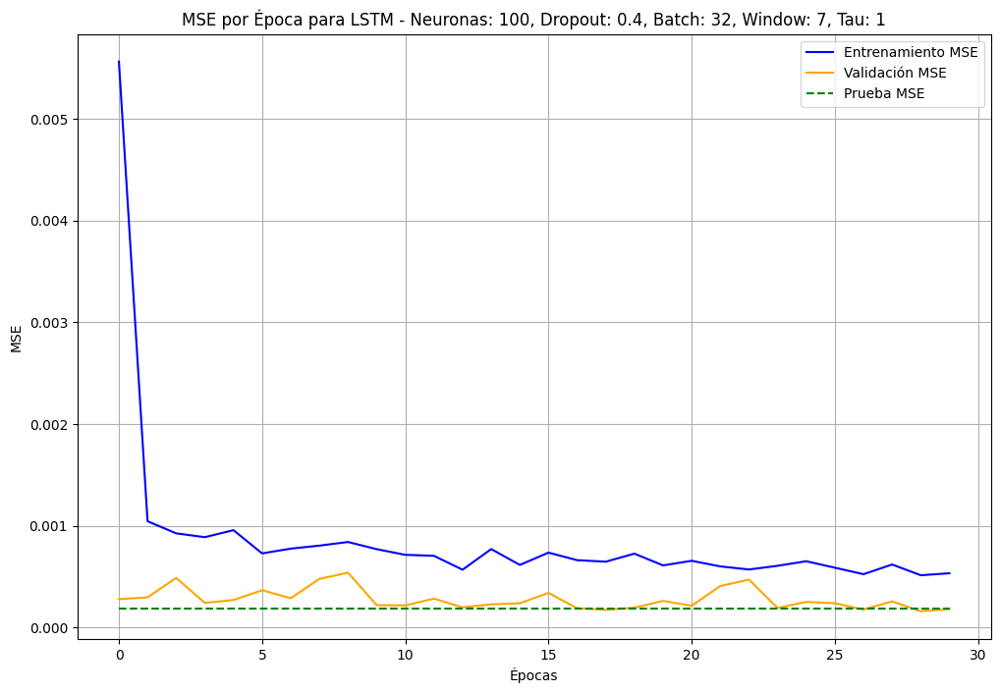

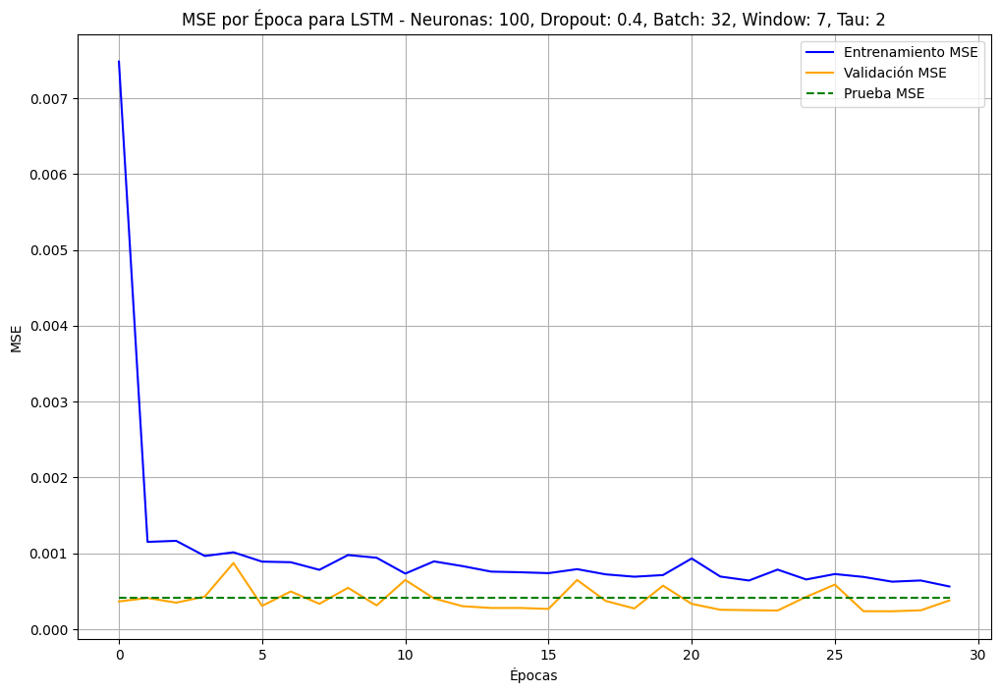

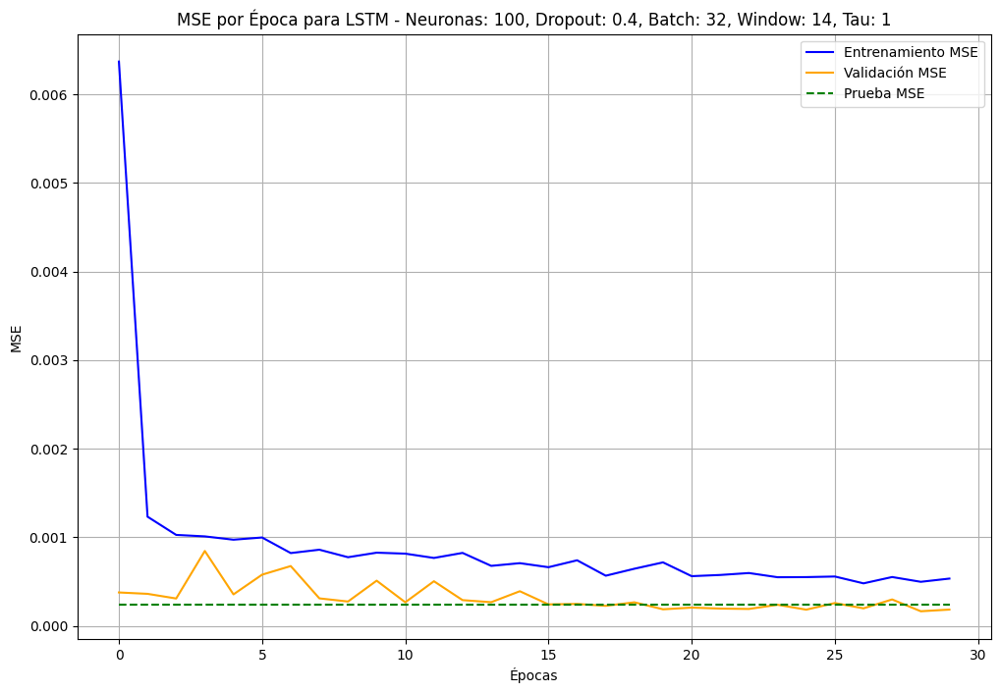

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\LSTM_100neurons_0.4dropout_batch32_window14_tau2_history.joblib


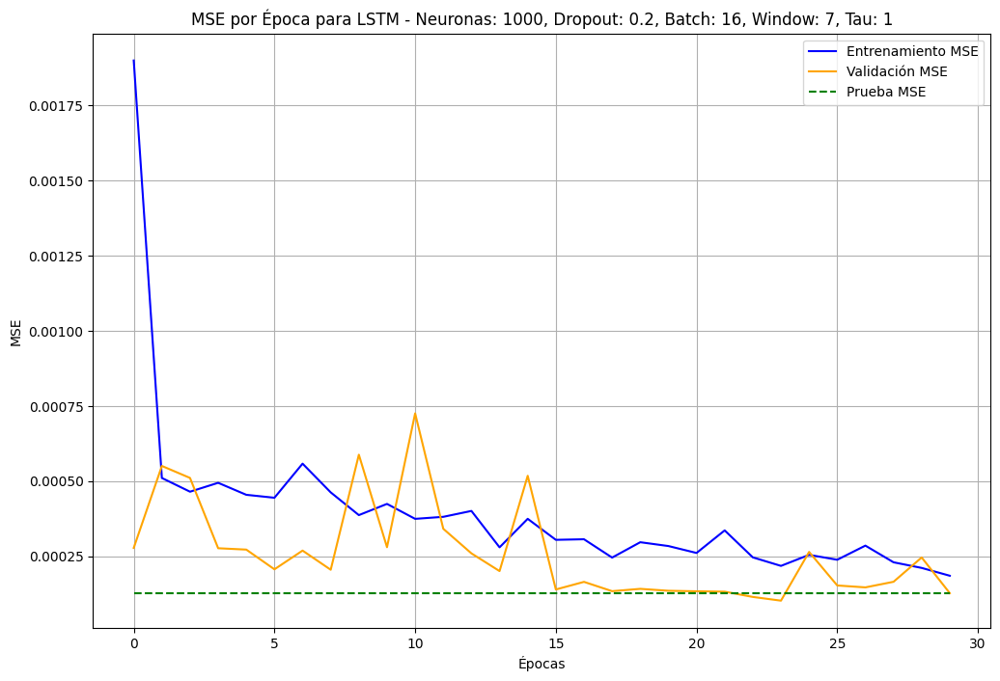

No se encontró el archivo de historial: modelos_precios/models_window_7_tau_2\LSTM_1000neurons_0.2dropout_batch16_window7_tau2_history.joblib


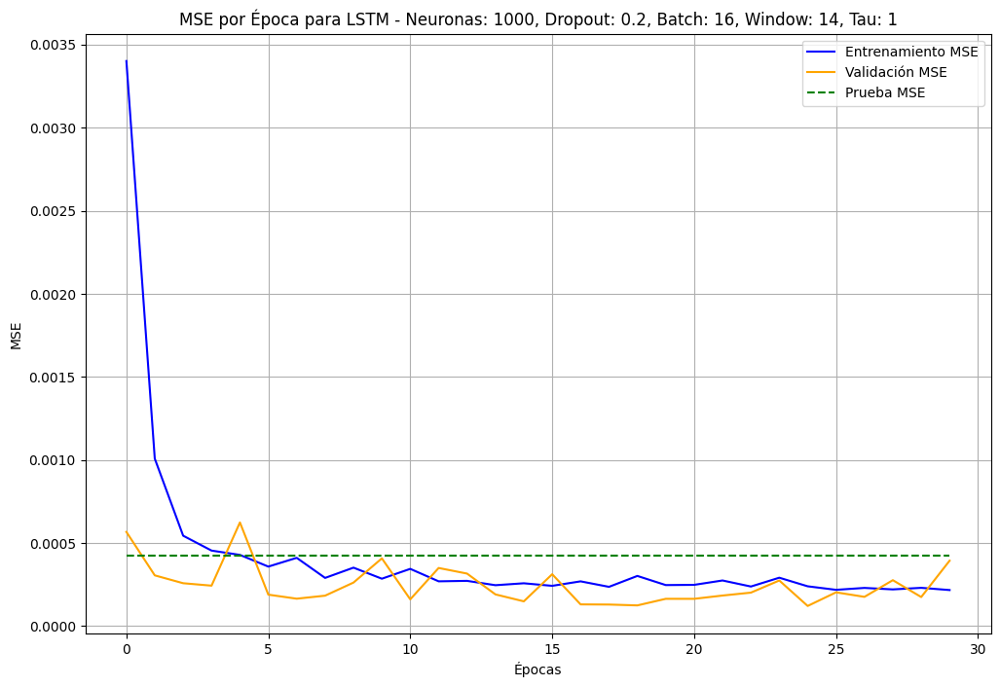

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\LSTM_1000neurons_0.2dropout_batch16_window14_tau2_history.joblib


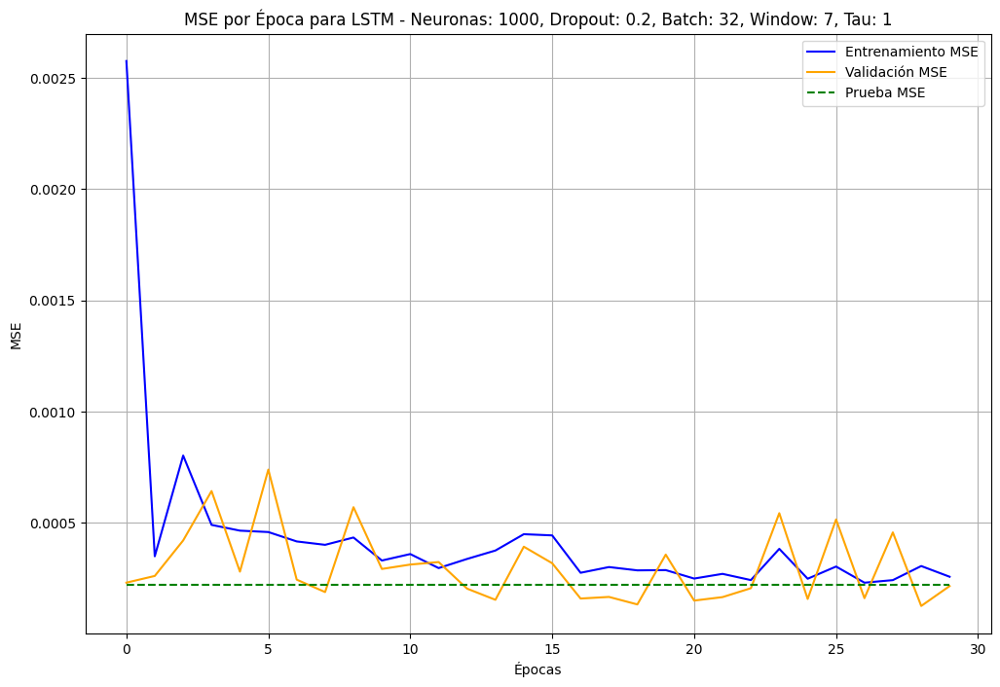

No se encontró el archivo de historial: modelos_precios/models_window_7_tau_2\LSTM_1000neurons_0.2dropout_batch32_window7_tau2_history.joblib


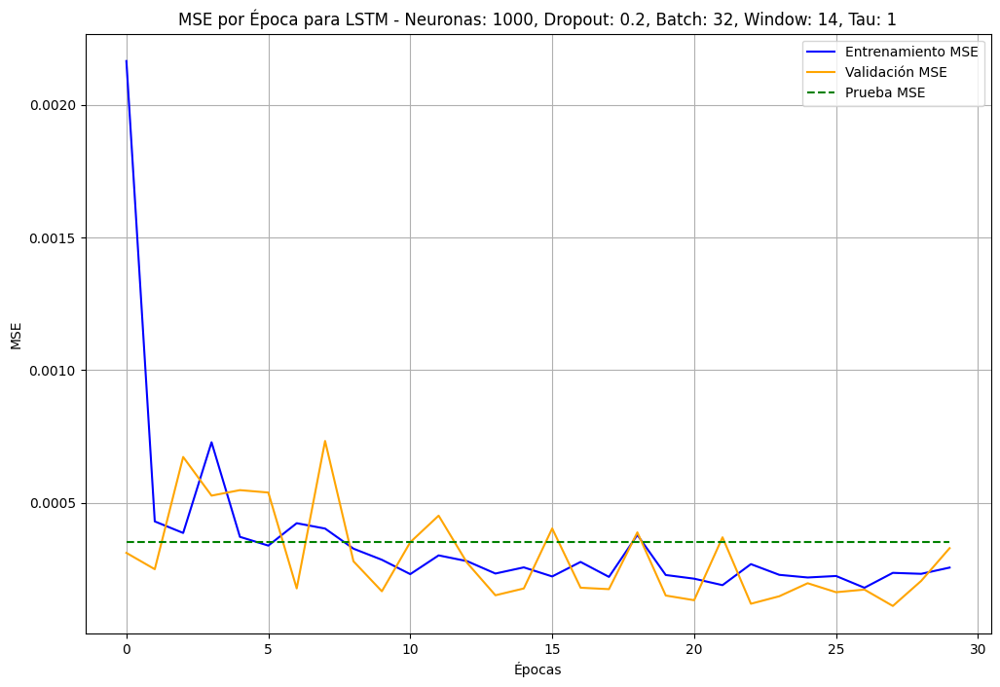

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\LSTM_1000neurons_0.2dropout_batch32_window14_tau2_history.joblib


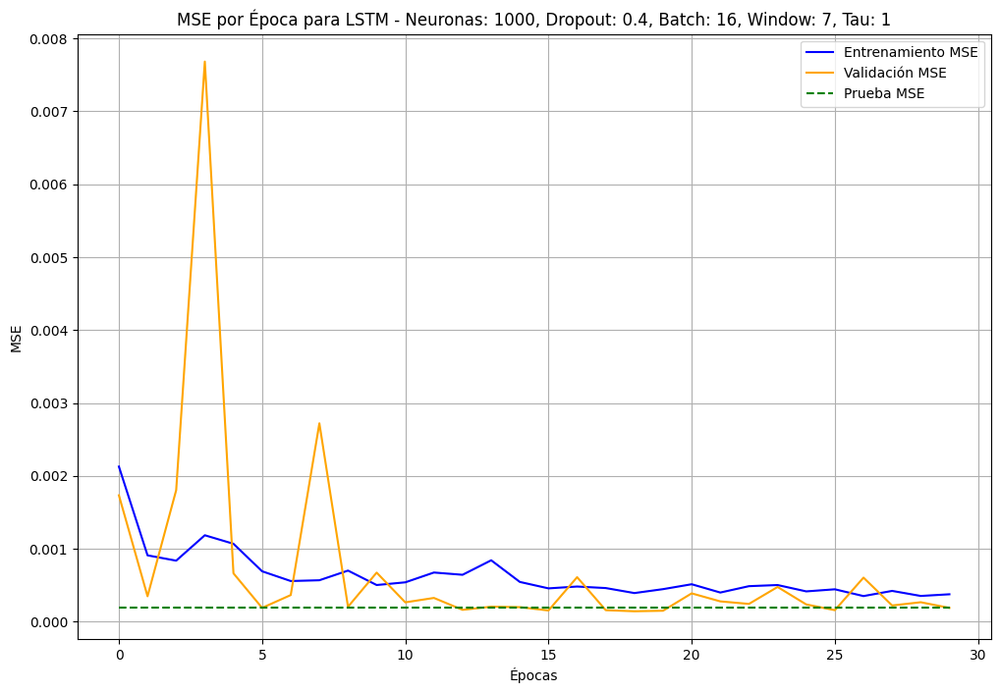

No se encontró el archivo de historial: modelos_precios/models_window_7_tau_2\LSTM_1000neurons_0.4dropout_batch16_window7_tau2_history.joblib


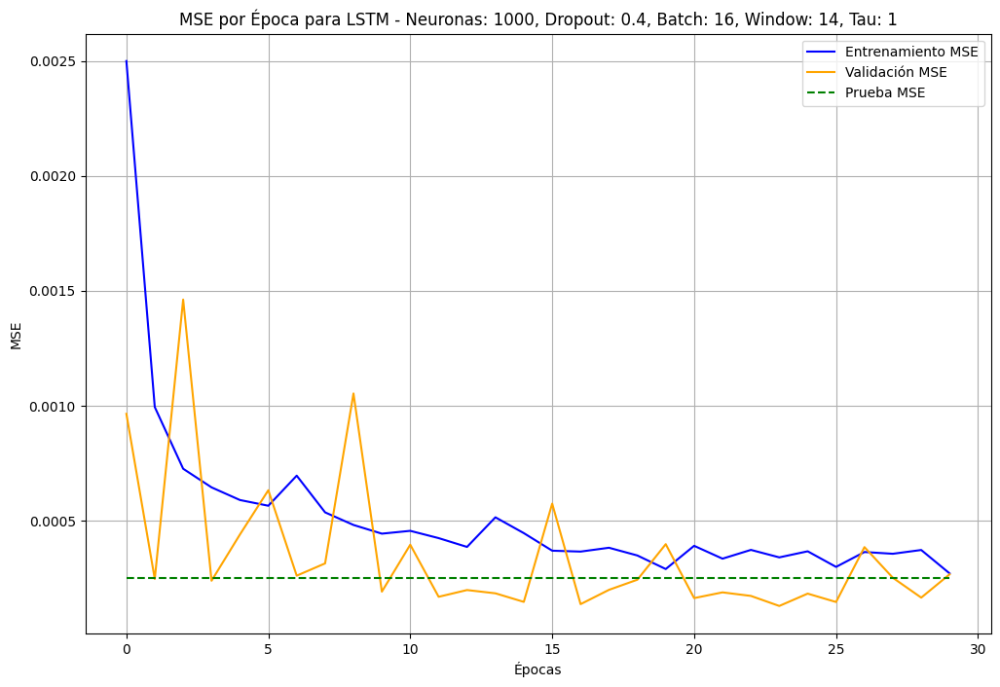

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\LSTM_1000neurons_0.4dropout_batch16_window14_tau2_history.joblib


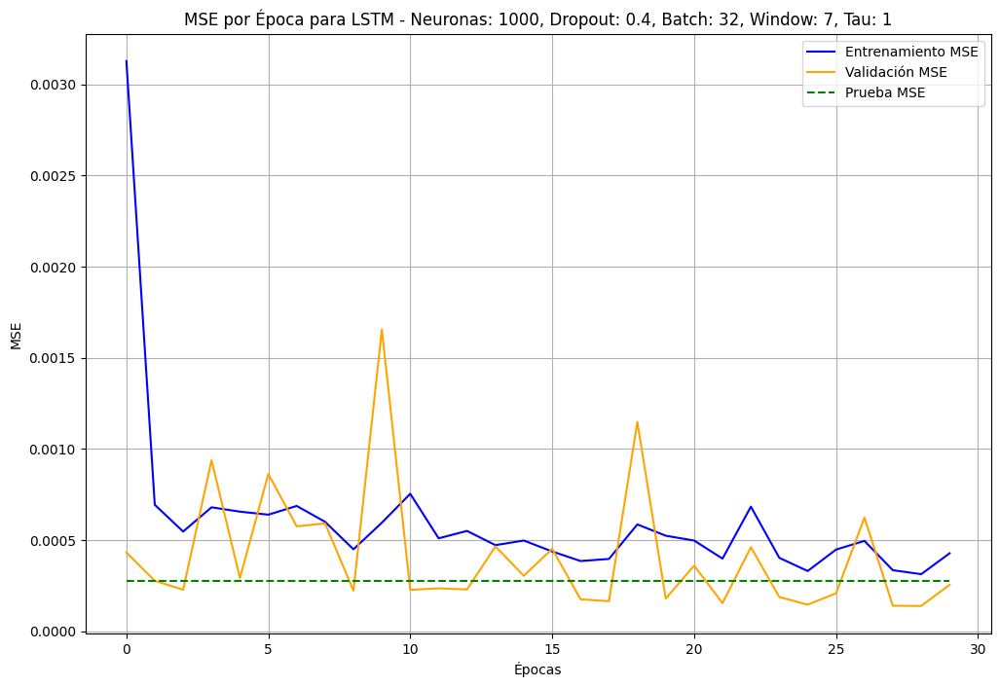

No se encontró el archivo de historial: modelos_precios/models_window_7_tau_2\LSTM_1000neurons_0.4dropout_batch32_window7_tau2_history.joblib


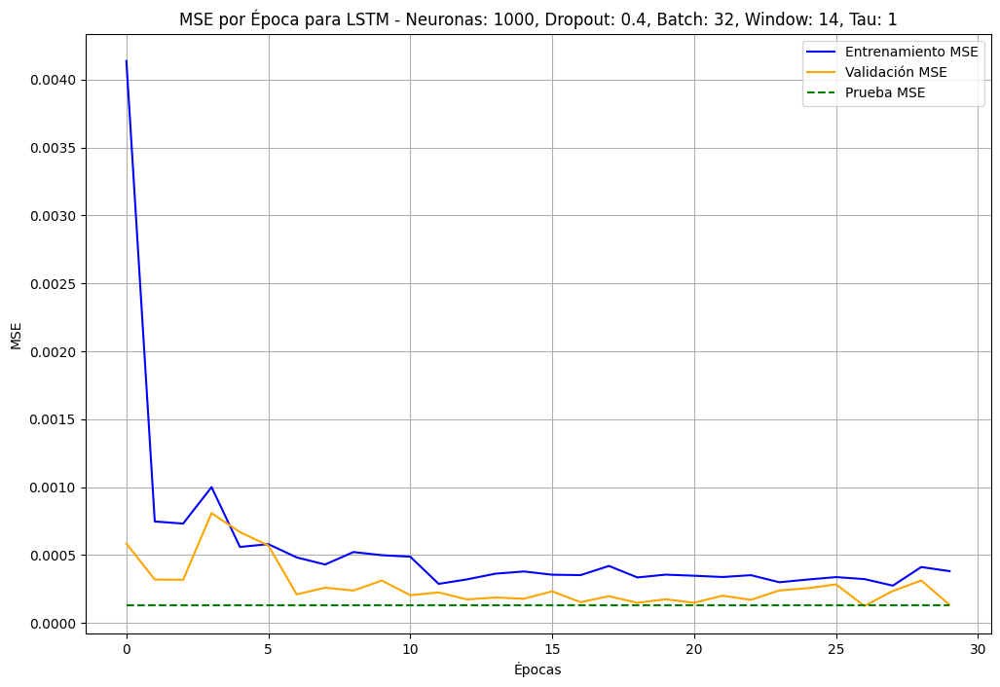

No se encontró el archivo de historial: modelos_precios/models_window_14_tau_2\LSTM_1000neurons_0.4dropout_batch32_window14_tau2_history.joblib


In [451]:
import matplotlib.pyplot as plt
from joblib import load
from itertools import product
import os

# Parámetros de especificaciones para generar combinaciones
model_names = ['MLP', 'RNN', 'LSTM']
neurons = [10, 100,1000]
dropouts = [0.2, 0.4]
batch_sizes = [16, 32]
window_sizes = [7, 14]  # Asegúrate de incluir todos los tamaños de ventana que usaste
taus = range(1, 3)  # Rango de valores de tau

# Generar combinaciones de especificaciones
model_specs = [
    {'model_name': name, 'neurons': n, 'dropout': d, 'batch_size': b, 'window_size': w, 'tau': t}
    for name, n, d, b, w, t in product(model_names, neurons, dropouts, batch_sizes, window_sizes, taus)
]

# Función para cargar el historial
def load_history(filename):
    try:
        return load(filename)
    except FileNotFoundError:
        print(f"No se encontró el archivo de historial: {filename}")
        return None

# Función para graficar el historial con foco en el MSE
def plot_mse_history(history_data, spec):
    plt.figure(figsize=(12, 8))

    # Graficar MSE para entrenamiento, validación y prueba si están en el historial
    if 'mean_squared_error' in history_data:
        plt.plot(history_data['mean_squared_error'], label="Entrenamiento MSE", color='blue')
    if 'val_mean_squared_error' in history_data:
        plt.plot(history_data['val_mean_squared_error'], label="Validación MSE", color='orange')
    if 'test_mean_squared_error' in history_data:
        # `test_mean_squared_error` es un valor constante, así que se repetirá para cada época
        plt.plot([history_data['test_mean_squared_error'][0]] * len(history_data['mean_squared_error']), 
                 label="Prueba MSE", color='green', linestyle='--')

    # Configuración de título y etiquetas
    plt.title(f"MSE por Época para {spec['model_name']} - Neuronas: {spec['neurons']}, Dropout: {spec['dropout']}, Batch: {spec['batch_size']}, Window: {spec['window_size']}, Tau: {spec['tau']}")
    plt.xlabel("Épocas")
    plt.ylabel("MSE")
    plt.legend()
    plt.grid(True)
    plt.show()

# Cargar y graficar el historial para cada modelo
for spec in model_specs:
    # Crear el nombre del archivo de historial con el nuevo formato de subcarpeta
    model_dir = f"modelos_precios/models_window_{spec['window_size']}_tau_{spec['tau']}"
    base_filename = f"{spec['model_name']}_{spec['neurons']}neurons_{spec['dropout']}dropout_batch{spec['batch_size']}_window{spec['window_size']}_tau{spec['tau']}"
    history_filename = os.path.join(model_dir, f"{base_filename}_history.joblib")

    # Cargar el historial y graficar si existe
    history_data = load_history(history_filename)
    if history_data:
        plot_mse_history(history_data, spec)

En las primeras epocas de entrenamiento la variabilidad del error es alta, dado al proceso de parametrización natural de las redes neuronales sin embargo, a partir de la 5ta época se evidencia una estabilización de los errores, que parecen converger al error definitivo que tiene el modelo en el conjunto de test. Este ultimo es constante, dado a que no varía por las épocas porque los datos de test se prueban  al final del periodo de entrenamiento para calcular el rendimiento real del modelo. 

#### Item 9

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\89904320.py:45: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



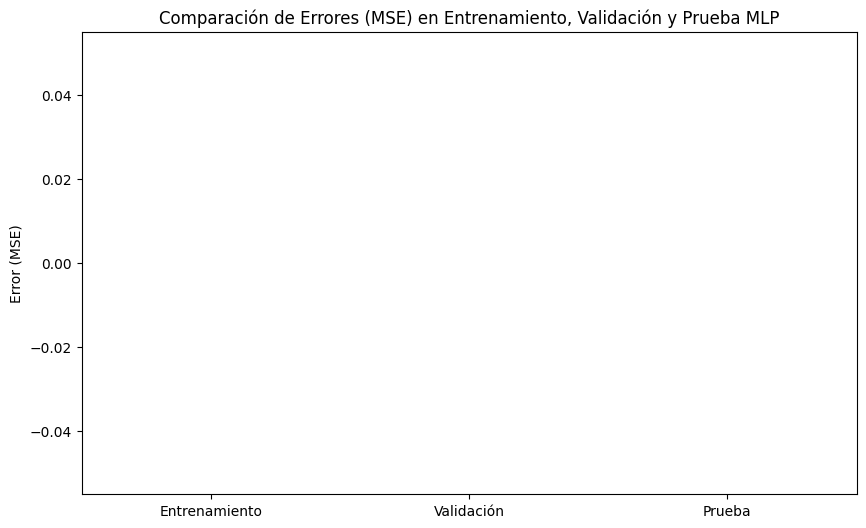

Estadístico de Kruskal-Wallis: nan, Valor p: nan
No hay diferencias significativas en las medianas de los errores entre los conjuntos.


C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\89904320.py:45: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



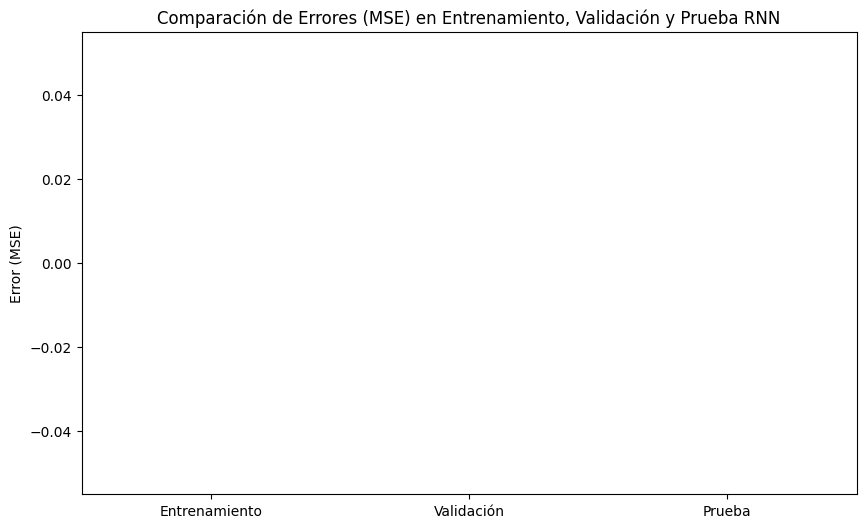

Estadístico de Kruskal-Wallis: nan, Valor p: nan
No hay diferencias significativas en las medianas de los errores entre los conjuntos.


C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\89904320.py:45: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



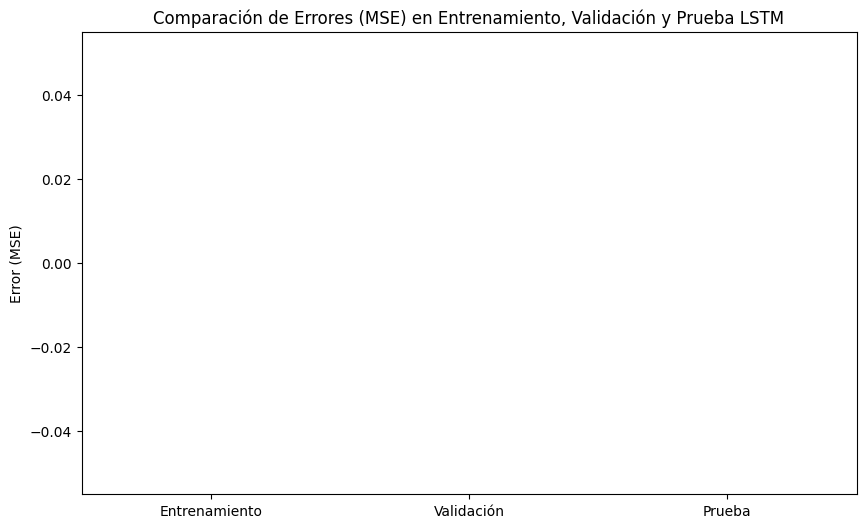

Estadístico de Kruskal-Wallis: nan, Valor p: nan
No hay diferencias significativas en las medianas de los errores entre los conjuntos.


In [452]:
import os
import matplotlib.pyplot as plt
from joblib import load
import numpy as np
import scipy.stats as stats

# Parámetros que coinciden con el nombre de archivo creado
model_names = ['MLP', 'RNN', 'LSTM']
neurons = [10, 100]
dropouts = [0.2, 0.4]
batch_sizes = [16, 32]
window_size = 7  # Ajustar según el análisis actual
tau = 2  # Ajustar según el análisis actual

# Diccionarios para almacenar los errores de cada conjunto
train_errors = []
val_errors = []
test_errors = []

# Cargar errores desde los archivos de historial
for model_name in model_names:
    for n in neurons:
        for d in dropouts:
            for b in batch_sizes:
                # Generar la ruta del archivo de historial
                model_dir = f'models_window_{window_size}_tau_{tau}'
                base_filename = f"{model_name}_{n}neurons_{d}dropout_batch{b}_window{window_size}_tau{tau}_history.joblib"
                history_path = os.path.join(model_dir, base_filename)
                
                # Cargar el historial si existe
                if os.path.exists(history_path):
                    history_data = load(history_path)
                    
                    # Extraer errores (MSE) de entrenamiento, validación y prueba si están disponibles
                    if 'mean_squared_error' in history_data:
                        train_errors.extend(history_data['mean_squared_error'])
                    if 'val_mean_squared_error' in history_data:
                        val_errors.extend(history_data['val_mean_squared_error'])
                    if 'test_mean_squared_error' in history_data:
                        # Error de prueba es constante, se extiende en el tamaño de épocas para la comparación
                        test_errors.extend([history_data['test_mean_squared_error'][0]] * len(history_data['mean_squared_error']))

    # Generar los boxplots
    plt.figure(figsize=(10, 6))
    plt.boxplot([train_errors, val_errors, test_errors], labels=['Entrenamiento', 'Validación', 'Prueba'])
    plt.title(f"Comparación de Errores (MSE) en Entrenamiento, Validación y Prueba {model_name}")
    plt.ylabel("Error (MSE)")
    plt.show()

    # Realizar la prueba de Kruskal-Wallis para comparar las medianas de los errores
    stat, p_value = stats.kruskal(train_errors, val_errors, test_errors)
    print(f"Estadístico de Kruskal-Wallis: {stat:.4f}, Valor p: {p_value:.4f}")

    # Interpretación de resultados
    if p_value < 0.05:
        print("Las medianas de los errores son significativamente diferentes entre los conjuntos.")
    else:
        print("No hay diferencias significativas en las medianas de los errores entre los conjuntos.")


Tiene sentido que las medianas de los errores en entrenamiento validación y test sean siginfiicativamente diferente, dado a que en las primeras épocas de entrenamiento el modelo en entrenamiento tiene mayor variabilidad, la cual se estabiliza en el proceso de validación dando como resultado un error esperado definitivo en el conjunto de prueba. 

#### Item 10. Desplegar serie original.

In [453]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def desplegar_predicciones_y_datos_originales(predictions_multivariate, 
                                              original_series, 
                                              window_size_train, window_size_val, window_size_test, 
                                              num_ventanas, original_length, 
                                              modelo='MLP', zoom_range=None,
                                              trainY_matrices=None, valY_matrices=None, testY_matrices=None):
    """
    Reconstruye y grafica la serie de predicciones desplegada a partir de ventanas de entrenamiento, validación y prueba,
    junto con la serie de tiempo original, el conjunto de validación, el conjunto de prueba y las predicciones restauradas.
    Permite hacer zoom en un rango específico si se proporciona `zoom_range`. Además, muestra los datos originales de 
    entrenamiento, validación y prueba.

    Parameters:
        predictions_multivariate (dict): Diccionario con las predicciones multivariadas para cada modelo y tau.
        original_series (pd.Series): Serie de tiempo original completa.
        window_size_train (int): Tamaño de cada ventana de entrenamiento.
        window_size_val (int): Tamaño de cada ventana de validación.
        window_size_test (int): Tamaño de cada ventana de prueba.
        num_ventanas (int): Número de ventanas (tau) a desplegar.
        original_length (int): Longitud total de la serie original.
        modelo (str): Nombre del modelo para extraer las predicciones (MLP, RNN, LSTM).
        zoom_range (tuple): Tupla opcional con índices de inicio y fin para el zoom (inicio, fin).
        trainY_matrices, valY_matrices, testY_matrices: Diccionarios con los valores originales de los conjuntos de entrenamiento,
                                                       validación y prueba.

    Returns:
        pd.Series: Serie de predicciones reconstruida desplegada.
    """
    # Inicializar la serie reconstruida con valores NaN
    reconstructed_predictions = np.full(original_length, np.nan)

    # Desplegar las predicciones en su posición correcta
    for tau in range(1, num_ventanas + 1):
        train_pred = predictions_multivariate[modelo][window_size_train/2][f'Train_Pred_tau_{tau}']
        val_pred = predictions_multivariate[modelo][window_size_val][f'Val_Pred_tau_{tau}']
        test_pred = predictions_multivariate[modelo][window_size_test][f'Test_Pred_tau_{tau}']
        
        for i in range(len(train_pred) // window_size_train):
            train_start = i * (window_size_train + window_size_val + window_size_test)
            val_start = train_start + window_size_train
            test_start = val_start + window_size_val

            reconstructed_predictions[train_start:train_start + window_size_train] = train_pred[i * window_size_train:(i + 1) * window_size_train]
            reconstructed_predictions[val_start:val_start + window_size_val] = val_pred[i * window_size_val:(i + 1) * window_size_val]
            reconstructed_predictions[test_start:test_start + window_size_test] = test_pred[i * window_size_test:(i + 1) * window_size_test]

    reconstructed_predictions = pd.Series(reconstructed_predictions, index=original_series.index)

    # Crear las secciones de entrenamiento, validación y prueba para los datos originales
    original_train_series = np.full(original_length, np.nan)
    original_val_series = np.full(original_length, np.nan)
    original_test_series = np.full(original_length, np.nan)

    # Insertar valores de los datos originales en las posiciones correspondientes
    for tau in range(1, num_ventanas + 1):
        for i in range(len(trainY_matrices[window_size_train][tau]) // window_size_train):
            train_start = i * (window_size_train + window_size_val + window_size_test)
            val_start = train_start + window_size_train
            test_start = val_start + window_size_val

            original_train_series[train_start:train_start + window_size_train] = trainY_matrices[window_size_train][tau][i * window_size_train:(i + 1) * window_size_train]
            original_val_series[val_start:val_start + window_size_val] = valY_matrices[window_size_val][tau][i * window_size_val:(i + 1) * window_size_val]
            original_test_series[test_start:test_start + window_size_test] = testY_matrices[window_size_test][tau][i * window_size_test:(i + 1) * window_size_test]

    # Convertir a Series de Pandas para facilitar la visualización
    original_train_series = pd.Series(original_train_series, index=original_series.index)
    original_val_series = pd.Series(original_val_series, index=original_series.index)
    original_test_series = pd.Series(original_test_series, index=original_series.index)

    # Gráfico completo con predicciones y datos originales
    plt.figure(figsize=(14, 8))
    plt.plot(original_series, label='Serie Original', color='black')
    plt.plot(reconstructed_predictions, label=f'Predicciones Restauradas - Modelo {modelo}', linestyle='--', color='blue')
    plt.plot(original_train_series, label='Datos Originales - Entrenamiento', color='cyan')
    plt.plot(original_val_series, label='Datos Originales - Validación', color='orange')
    plt.plot(original_test_series, label='Datos Originales - Prueba', color='green')
    
    plt.title(f"Serie Completa - Modelo {modelo} con Datos Originales")
    plt.xlabel("Índice de Tiempo")
    plt.ylabel("Valor de Predicción")
    plt.legend()
    plt.show()

    # Gráfico de zoom en el rango especificado
    if zoom_range is not None:
        zoom_start, zoom_end = zoom_range
        plt.figure(figsize=(14, 8))
        plt.plot(original_series[zoom_start:zoom_end], label='Serie Original (Zoom)', linestyle='--', color='grey')
        plt.plot(reconstructed_predictions[zoom_start:zoom_end], label=f'Predicciones Restauradas - Modelo {modelo} (Zoom)', linestyle='--', color='blue')
        plt.plot(original_train_series[zoom_start:zoom_end], label='Datos Originales - Entrenamiento (Zoom)', color='cyan')
        plt.plot(original_val_series[zoom_start:zoom_end], label='Datos Originales - Validación (Zoom)', color='orange')
        plt.plot(original_test_series[zoom_start:zoom_end], label='Datos Originales - Prueba (Zoom)', color='green')

        plt.title(f"Zoom en el Rango [{zoom_start}:{zoom_end}] - Modelo {modelo} con Datos Originales")
        plt.xlabel("Índice de Tiempo")
        plt.ylabel("Valor de Predicción")
        plt.legend()
        plt.show()

    return reconstructed_predictions




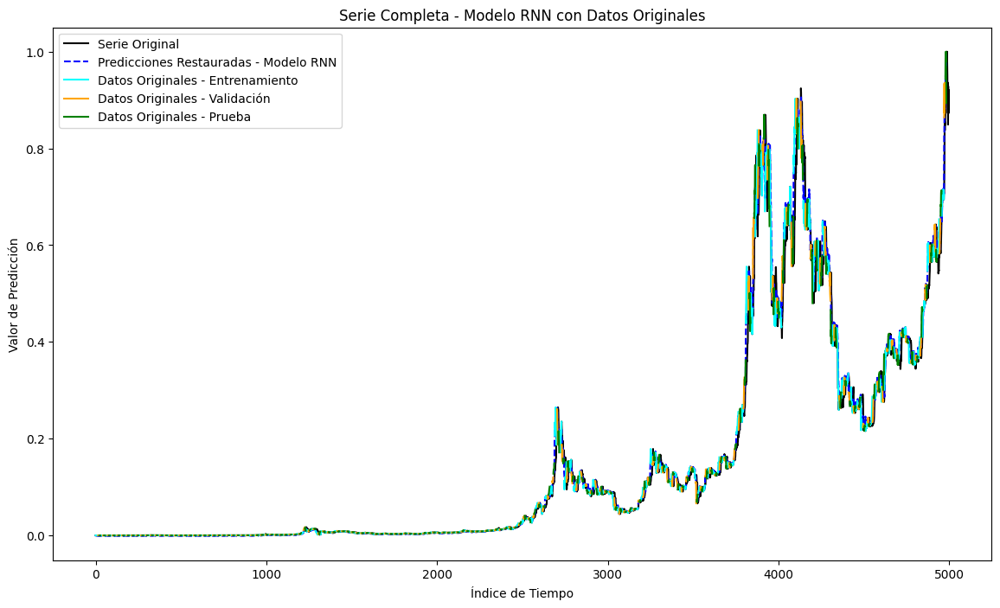

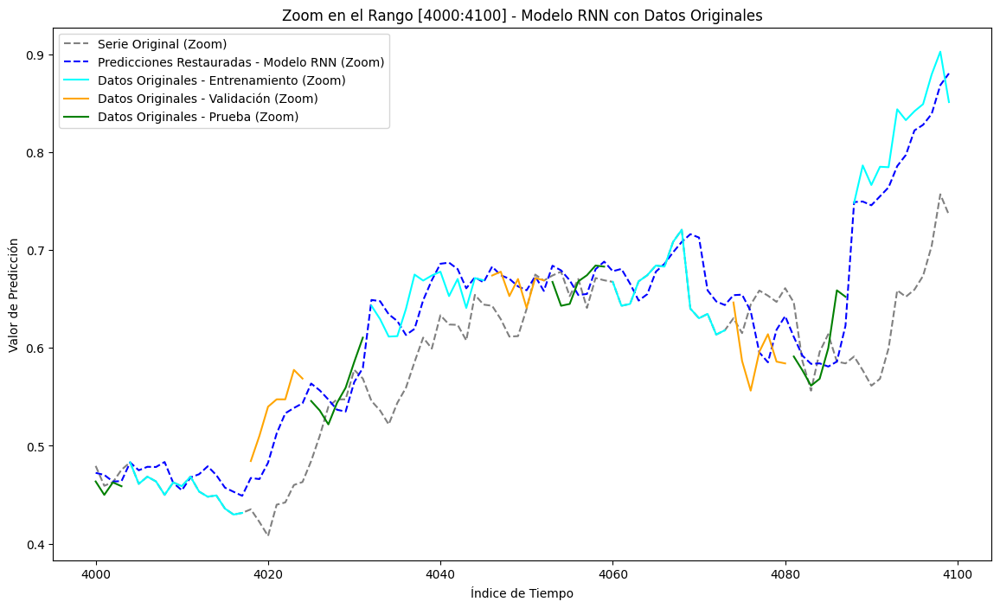

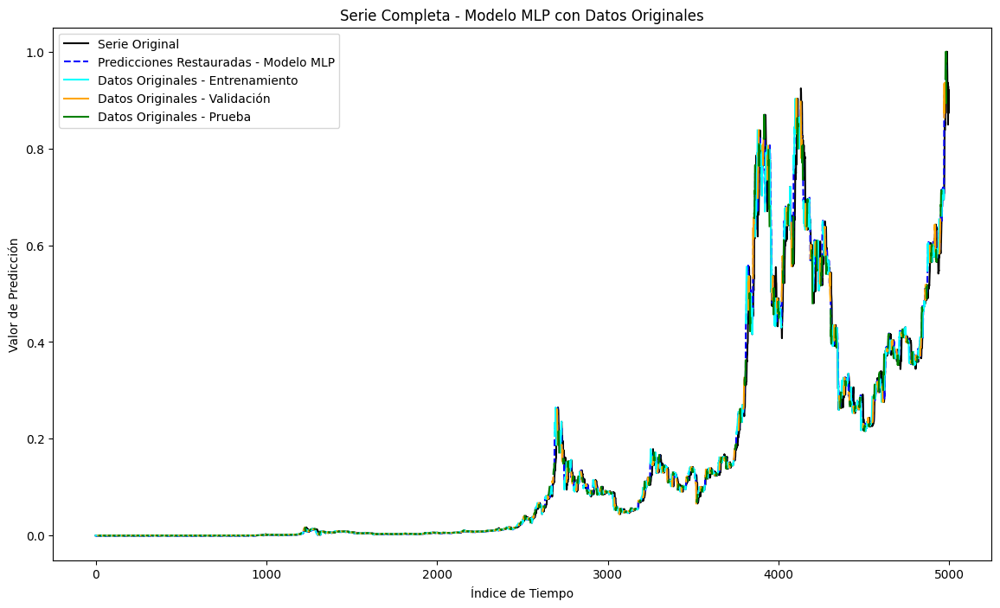

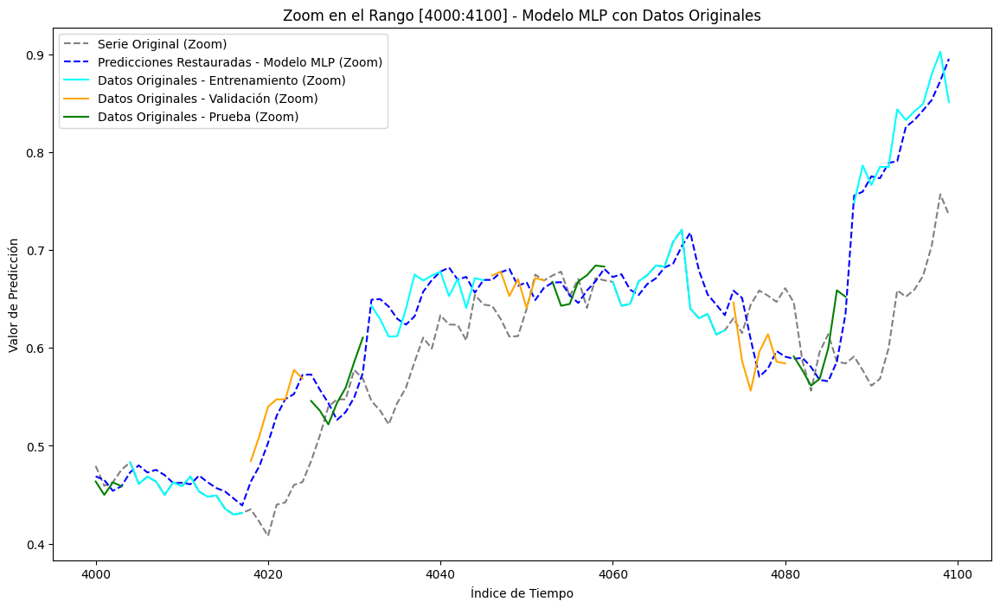

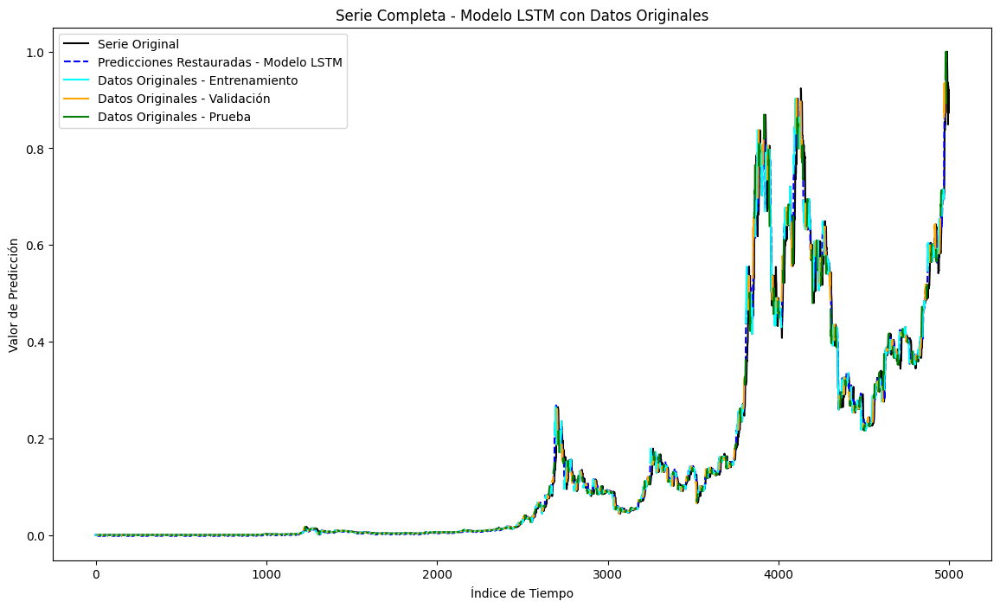

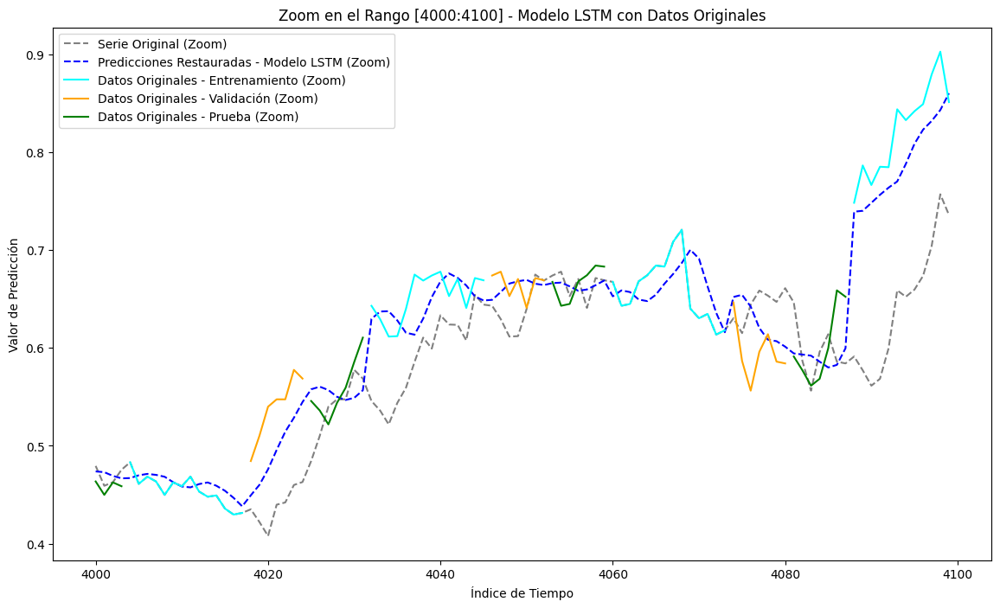

In [454]:

# Ejemplo de uso de la función para el modelo 'LSTM'
reconstructed_predictions = desplegar_predicciones_y_datos_originales(predictions_multivariate, 
                                                                  original_series=df_price_scaled, 
                                                                  window_size_train=14, 
                                                                  window_size_val=7, 
                                                                  window_size_test=7, 
                                                                  num_ventanas=1, 
                                                                  original_length=4999,
                                                                  modelo='RNN',
                                                                  zoom_range=(4000, 4100),trainY_matrices=trainY_matrices,valY_matrices=valY_matrices,testY_matrices=testY_matrices)  # Definir el rango de zoom aquí


# Ejemplo de uso de la función para el modelo 'LSTM'
reconstructed_predictions = desplegar_predicciones_y_datos_originales(predictions_multivariate, 
                                                                  original_series=df_price_scaled, 
                                                                  window_size_train=14, 
                                                                  window_size_val=7, 
                                                                  window_size_test=7, 
                                                                  num_ventanas=1, 
                                                                  original_length=4999,
                                                                  modelo='MLP',
                                                                  zoom_range=(4000 , 4100),trainY_matrices=trainY_matrices,valY_matrices=valY_matrices,testY_matrices=testY_matrices)  # Definir el rango de zoom aquí


# Ejemplo de uso de la función para el modelo 'LSTM'
reconstructed_predictions = desplegar_predicciones_y_datos_originales(predictions_multivariate, 
                                                                  original_series=df_price_scaled, 
                                                                  window_size_train=14, 
                                                                  window_size_val=7, 
                                                                  window_size_test=7, 
                                                                  num_ventanas=1, 
                                                                  original_length=4999,
                                                                  modelo='LSTM',
                                                                  zoom_range=(4000, 4100),trainY_matrices=trainY_matrices,valY_matrices=valY_matrices,testY_matrices=testY_matrices)  # Definir el rango de zoom aquí

Siguiendo el proceso inverso del plegado inicial se despliega la serie y se vuelve a colocar en los valores iniciales. Se hace zoom, en un segmento de la serie en particular para ver la diferencia en la forma de predicción entre modelos. 

Se particulariza la ventana de tamaño 7 para los 3 modelos, con el fin de disminuir la cantidad de gráficas desplegadas. Se visualiza la forma en la que fueron segmentados los datos, para ser utilizados en el entrenamiento de tau periodos.  

## Parte 2. retorno acumulado

Usamos las formulas de retorno explicadas en el punto número 2.

In [456]:
# Leer el archivo y procesar los datos
df = pd.read_csv('bitcoin.txt', delimiter=',')#.sort_values('Date')

# Convertir 'Price' a numérico eliminando comas
df['Price'] = df['Price'].str.replace(',', '')
df['Price'] = pd.to_numeric(df['Price'])

# Convertir 'Date' a formato datetime y establecer como índice
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Ordenar el DataFrame por fecha
df = df.sort_values(by='Date', ascending=True)

In [458]:
#Cálculo retornos diario
j = 0
at = []
for j in range(0,len(df['Price'])-1):
    aj = (df['Price'][j+1] - df['Price'][j]) / (df['Price'][j])
    at.append(aj)
at = np.nan_to_num(at)

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\1064779507.py:5: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



In [459]:
#Retorno acumulado diario
def cum_return(at):
    #at_array = np.array(at)  # Convertir a array de numpy
    cum_ret = np.zeros(len(at))
    for j in range(0,len(at)):
        if j == 0:
            cum_ret[j] = at[j]
        else:
            cum_ret[j] = at[j] + cum_ret[j-1]
    return cum_ret

ret_acum = cum_return(at)
df_ret_acum = pd.DataFrame(ret_acum, columns=["RetornoAcumulado"])

# Crear el escalador
scaler = MinMaxScaler(feature_range=(0, 1))

# Escalar los datos
df_ret_acum_scaled = scaler.fit_transform(df_ret_acum.values.reshape(-1, 1)).flatten()

# Convertir a DataFrame si es necesario
df_ret_acum_scaled = pd.DataFrame(df_ret_acum_scaled, columns=["RetornoAcumulado"])

print(df_ret_acum_scaled)


      RetornoAcumulado
0             0.000000
1             0.000000
2             0.000000
3             0.000000
4             0.000000
...                ...
4993          0.997364
4994          0.995908
4995          0.994805
4996          0.994971
4997          0.997055

[4998 rows x 1 columns]


### Item 3, 6 y 7 Ciclo de iteración de modelos

In [471]:
window_sizes = [7]#14,21,28  # Se restringió intencionalmente el tamaño del número de ventanas, por restricciones computacionales
step_size = 1
predictions_dict = {}
error_dict = {}
history_MLP = {}
history_RNN = {}
history_LSTM = {}

# Diccionarios para almacenar matrices y predicciones multivariadas
trainX_matrices = {}
trainY_matrices = {}
valX_matrices = {}
valY_matrices = {}
testX_matrices = {}
testY_matrices = {}
predictions_multivariate_ret_acum = {'MLP': {}, 'RNN': {}, 'LSTM': {}}

# Inicialización de predictions_multivariate_ret_acum para todos los valores de tau de 1 a 28, 
# con el fin de garantizar todas las combinaciones de 
# dim(X(j)train) = (M(j)rows,N(j)cols) con M(j)rows,N(j)cols = 7, 14, 21, 28 #

for www in window_sizes:
    for model_name in ['MLP', 'RNN', 'LSTM']:
        predictions_multivariate_ret_acum[model_name][www] = {}  # Usar www directamente como el valor individual extraído de la lista
        for tau in range(1, 29):  # Inicializa para el rango completo de tau
            predictions_multivariate_ret_acum[model_name][www][f'Train_Pred_tau_{tau}'] = []
            predictions_multivariate_ret_acum[model_name][www][f'Val_Pred_tau_{tau}'] = []
            predictions_multivariate_ret_acum[model_name][www][f'Test_Pred_tau_{tau}'] = []

for www in window_sizes:
    trainX_matrices[www] = {}
    trainY_matrices[www] = {}
    valX_matrices[www] = {}
    valY_matrices[www] = {}
    testX_matrices[www] = {}
    testY_matrices[www] = {}
    history_MLP[www] = {}
    history_RNN[www] = {}
    history_LSTM[www] = {}

    # Variables para almacenar el mejor modelo seleccionado
    best_model_MLP = None
    best_model_RNN = None
    best_model_LSTM = None
    
    # Punto 3 Item 6. En esta parte del códidgo se van creando las ventanas de tamaño www
    # para tau periodos, con el fin de encontrar el mejor modelo, se predicen los tau de uno en uno
    # posteriormente guardan las predicciones en en arreglo predictions_multivariate[model][www][iii]
    # y subsecuentemente se guardan también en una arreglo matricial del estilo "_matrices[www][iii]", 
    # los valores con los que se preparó el modelo de la ventana www para predecir el peridodo iii
    
    for iii in range(1, 7):  
        # Crear ventanas deslizantes y dividir datos en segmentos para cada tau
        result_dict = create_sliding_windows(data=df_ret_acum_scaled.values.flatten(), window_sizes=window_sizes, step_size=step_size, taus=[iii])
        train_data, val_data, test_data, df = segment_data_by_window(result_dict[f'Window_{www}'], train_size=2*www, val_size=www, test_size=www)
        
        # Asignar y transformar datos
        trainX = np.asarray(train_data.iloc[:, 0:www].values, dtype=float).reshape((len(train_data), www, 1))
        trainY = np.asarray(train_data.iloc[:, www].values, dtype=float).ravel()
        valX = np.asarray(val_data.iloc[:, 0:www].values, dtype=float).reshape((len(val_data), www, 1))
        valY = np.asarray(val_data.iloc[:, www].values, dtype=float).ravel()
        testX = np.asarray(test_data.iloc[:, 0:www].values, dtype=float).reshape((len(test_data), www, 1))
        testY = np.asarray(test_data.iloc[:, www].values, dtype=float).ravel()
        
        # Punto 3, item 7. A partir de aquí consideramos todas las variaciones durante la construccion del modelo
        # Seleccionamos el mejor modelo con las función select_best_model() anteriormente definida
        # por limitaciones computacionales se restringió el número de combinaciones de los parámetros solicitados en el parcial
        
        
        dropout_rates = [0.2]#, 0.4, 0.6]#, 0.8]  
        neurons_list = [10]#, 100, 1000]#, 10000]    
        batch_sizes = [16]#, 32, 64]#, 128]   
            
        for dropout_rate in dropout_rates:
            for neurons in neurons_list:
                for batch_size in batch_sizes:
                    print(f"Evaluando: Neuronas: {neurons}, Dropout: {dropout_rate}, Batchsize: {batch_size}")

                    # Crear y compilar modelos
                    model_MLP = create_mlp(neurons, dropout_rate, www)
                    model_RNN = create_RNN(neurons, input_shape=(www, 1), activation='tanh', dropout_rate=dropout_rate)
                    model_LSTM = create_lstm(neurons, dropout_rate, www)

                    # Compilar los modelos con las métricas especificadas
                    for model in [model_MLP, model_RNN, model_LSTM]:
                        model.compile(optimizer='adam', loss='mse', metrics=[
                            'mean_absolute_error',            # MAE
                            'mean_absolute_percentage_error', # MAPE
                            'mean_squared_error',             # MSE
                            root_mean_squared_error,          # RMSE
                            r_squared                        # R²
                        ])

                    # Seleccionar el mejor modelo y guardarlo con un nombre que incluye los parámetros
                    best_model_MLP = select_best_model(model_MLP, 'MLP', neurons, dropout_rate,
                                                    batch_size, epochs=30, X_train=trainX, y_train=trainY,
                                                    X_val=valX, y_val=valY, X_test=testX,y_test=testY,return_history=False,window_size=www,tau=iii,serie='ret_acum')
                    
                    best_model_RNN = select_best_model(model_RNN, 'RNN', neurons, dropout_rate,
                                                    batch_size, epochs=30, X_train=trainX, y_train=trainY,
                                                    X_val=valX, y_val=valY,X_test=testX,y_test=testY, return_history=False,window_size=www,tau=iii,serie='ret_acum')
                    
                    best_model_LSTM = select_best_model(model_LSTM, 'LSTM', neurons, dropout_rate,
                                                        batch_size, epochs=30, X_train=trainX, y_train=trainY,
                                                        X_val=valX, y_val=valY, X_test=testX,y_test=testY,return_history=False,window_size=www,tau=iii,serie='ret_acum')

        # Almacenar predicciones como listas en lugar de DataFrames
        for model_name, model in zip(['MLP', 'RNN', 'LSTM'], [best_model_MLP, best_model_RNN, best_model_LSTM]):
            predictions_multivariate_ret_acum[model_name][www][f'Train_Pred_tau_{iii}'] = model.predict(trainX).flatten().tolist()
            predictions_multivariate_ret_acum[model_name][www][f'Val_Pred_tau_{iii}'] = model.predict(valX).flatten().tolist()
            predictions_multivariate_ret_acum[model_name][www][f'Test_Pred_tau_{iii}'] = model.predict(testX).flatten().tolist()

        trainX_matrices[www][iii] = trainX
        trainY_matrices[www][iii] = trainY
        valX_matrices[www][iii] = valX
        valY_matrices[www][iii] = valY
        testX_matrices[www][iii] = testX
        testY_matrices[www][iii] = testY

Evaluando: Neuronas: 10, Dropout: 0.2, Batchsize: 16
Modelo previo con mejor val_mean_squared_error (9.613658039597794e-05) y más épocas (30). No se reemplazará.
El mejor modelo guardado está en 'modelos_ret_acum/models_window_7_tau_1\MLP_10neurons_0.2dropout_batch16_window7_tau1_best_model.keras'
Modelo previo con mejor val_mean_squared_error (8.797009650152177e-05) y más épocas (30). No se reemplazará.
El mejor modelo guardado está en 'modelos_ret_acum/models_window_7_tau_1\RNN_10neurons_0.2dropout_batch16_window7_tau1_best_model.keras'
Modelo previo con mejor val_mean_squared_error (6.201467476785183e-05) y más épocas (30). No se reemplazará.
El mejor modelo guardado está en 'modelos_ret_acum/models_window_7_tau_1\LSTM_10neurons_0.2dropout_batch16_window7_tau1_best_model.keras'
39/39 [==============================] - 0s 4ms/step
Evaluando: Neuronas: 10, Dropout: 0.2, Batchsize: 16
Modelo previo con mejor val_mean_squared_error (6.276743079070002e-05) y más épocas (30). No se reempl

Este ciclo de iteración de modelos es el núcleo que compila, todas las demás funciones creadas anteriormente. La lógica de funcionamiento es la siguientes:

Para cada ventana en `window_size`, itera sobre los `tau` periodos requeridos. Barajando el dataframe, en ventanas de tamaño www a través de `create_sliding_windows(...)` con tau periodos, y luego crea un pliego con `segment_data_by_window(...)` que segmenta el data frame en train, val y test, que se usan para la función `select_best_model(...)`. Esta última se encuentra incluida en un ciclo de entrenamiento que varía los parámetros de los modelos(`neurons`,`dropout_rate` y`batch_size`), con el fin de utilizar la mejor combinación de parámetros para predecir el tau periodo. 

Una vez se encuentra el mejor modelo, se utiliza para construir lista de `predictions_multivariate_ret_acum[Model][www][...iii]` que alamacena la información de las predicciones, para posteriormente ser comparadas con los pliegos que quedan almacenados en matrices de forma `..._matrices[www][iii]`

Las épocas de entrenamiento se fijaron a discreción 30 periodos al ver que los modelos convergian a una minimo de error, como se visualizará mas adelante.

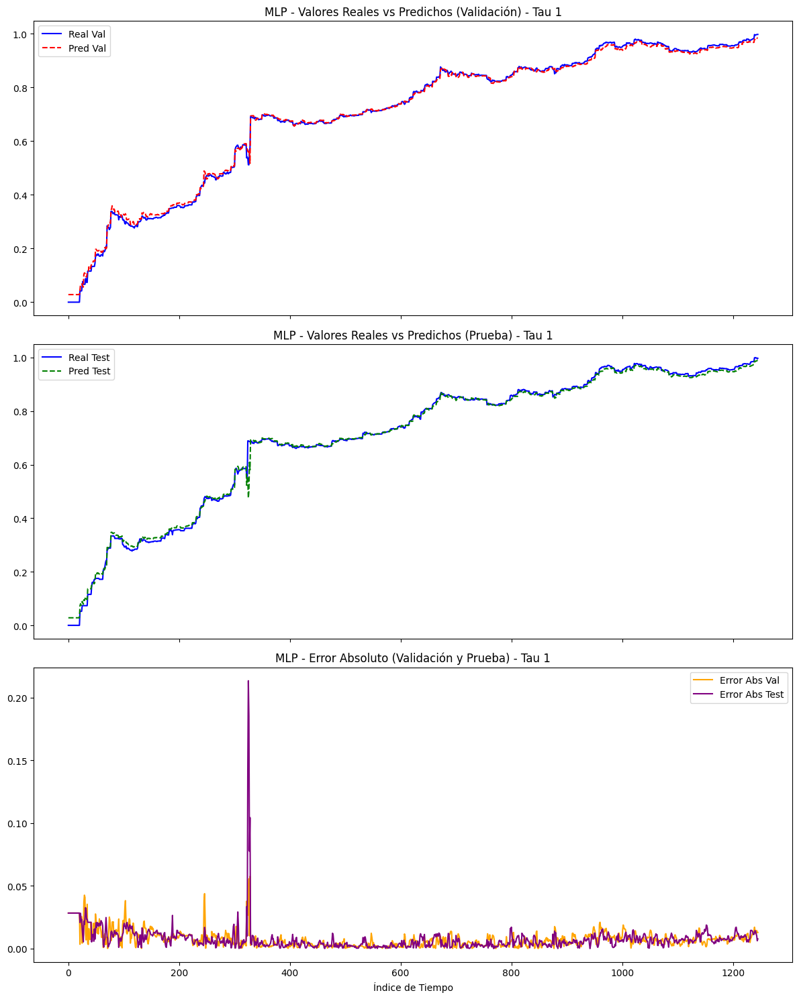

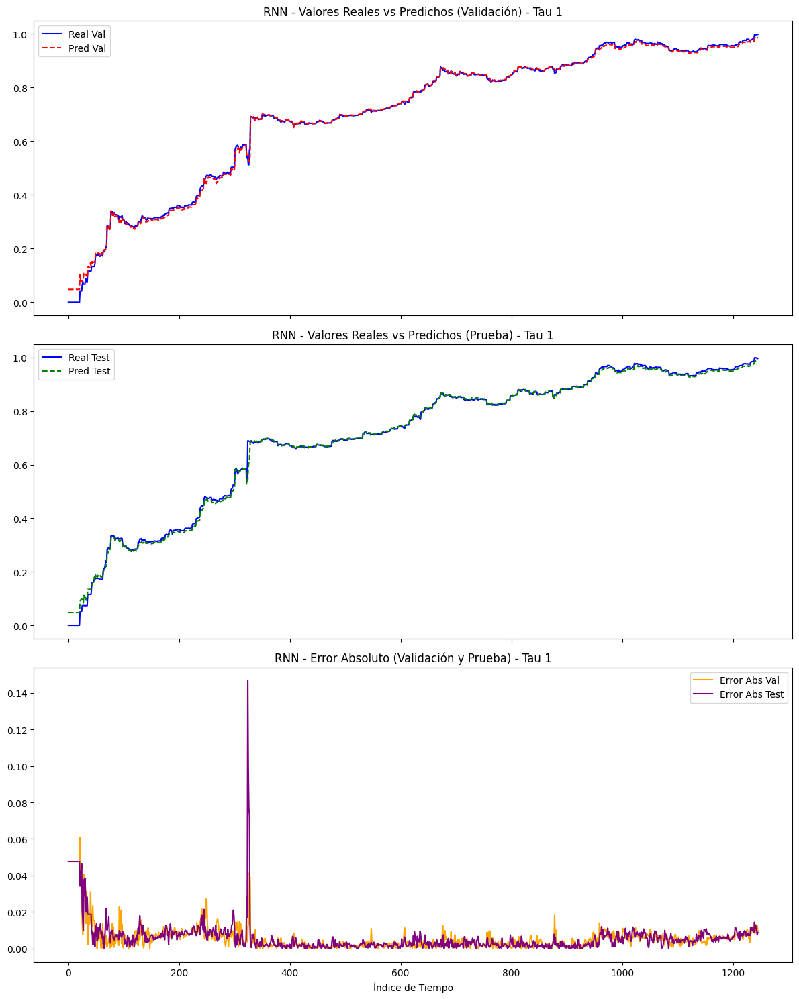

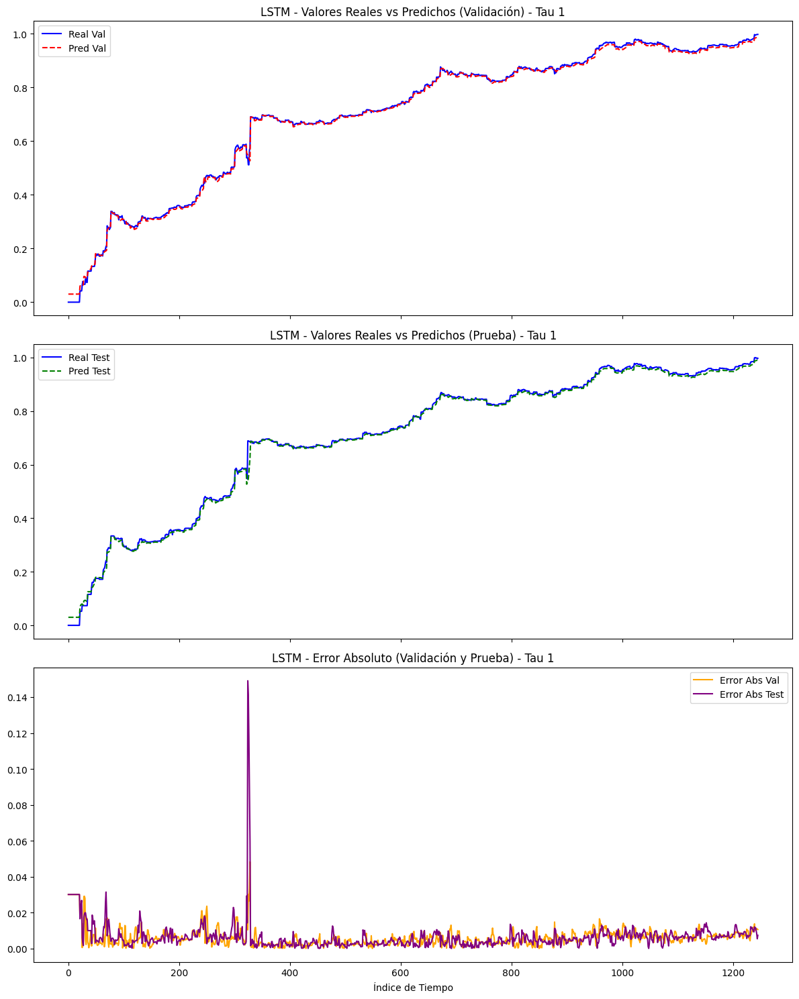

In [472]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def graficar_valores_y_errores(predictions_multivariate_ret_acum, trainY_matrices, valY_matrices, testY_matrices, window_size, modelo):
    """
    Genera gráficos para comparar los valores reales y predichos, junto con el error absoluto,
    para los conjuntos de validación y prueba.
    """
    for tau in range(1, 2):  # Cambia el rango de tau si tienes más ventanas
        # Obtener valores reales y predichos
        real_train = trainY_matrices[window_size][tau]
        real_val = valY_matrices[window_size][tau]
        real_test = testY_matrices[window_size][tau]
        
        pred_train = predictions_multivariate_ret_acum[modelo][window_size][f'Train_Pred_tau_{tau}']
        pred_val = predictions_multivariate_ret_acum[modelo][window_size][f'Val_Pred_tau_{tau}']
        pred_test = predictions_multivariate_ret_acum[modelo][window_size][f'Test_Pred_tau_{tau}']
        
        # Calcular el error absoluto
        error_abs_val = np.abs(np.array(real_val) - np.array(pred_val))
        error_abs_test = np.abs(np.array(real_test) - np.array(pred_test))
        
        # Configurar la gráfica
        fig, axes = plt.subplots(3, 1, figsize=(12, 15), sharex=True)
        
        # Gráfica 1: Valores Reales vs Predichos - Validación
        axes[0].plot(real_val, label='Real Val', color='blue')
        axes[0].plot(pred_val, label='Pred Val', color='red', linestyle='--')
        axes[0].set_title(f'{modelo} - Valores Reales vs Predichos (Validación) - Tau {tau}')
        axes[0].legend()
        
        # Gráfica 2: Valores Reales vs Predichos - Prueba
        axes[1].plot(real_test, label='Real Test', color='blue')
        axes[1].plot(pred_test, label='Pred Test', color='green', linestyle='--')
        axes[1].set_title(f'{modelo} - Valores Reales vs Predichos (Prueba) - Tau {tau}')
        axes[1].legend()

        # Gráfica 3: Error Absoluto para Validación y Prueba
        axes[2].plot(error_abs_val, label='Error Abs Val', color='orange')
        axes[2].plot(error_abs_test, label='Error Abs Test', color='purple')
        axes[2].set_title(f'{modelo} - Error Absoluto (Validación y Prueba) - Tau {tau}')
        axes[2].legend()
        
        plt.xlabel("Índice de Tiempo")
        plt.tight_layout()
        plt.show()

# Ejemplo de uso
# Para visualizar las gráficas para cada modelo y ventana
for modelo in ['MLP', 'RNN', 'LSTM']:
    graficar_valores_y_errores(predictions_multivariate_ret_acum, trainY_matrices, valY_matrices, testY_matrices, window_size=7, modelo=modelo)


Se realiza comparación de los errores absolutos en los conjuntos de validación y prueba evidenciando un comportamiento significativamente parecido en los respectivos pliegos. En cada uno de los modelos probados. 

#### item 4

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\1389143047.py:28: RuntimeWarning:

divide by zero encountered in divide

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\1389143047.py:47: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



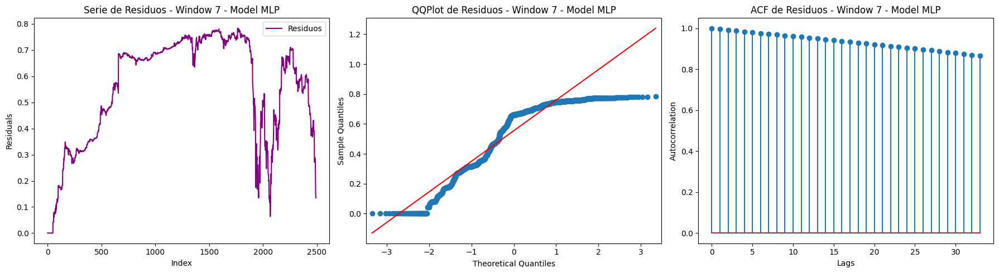

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\1389143047.py:28: RuntimeWarning:

divide by zero encountered in divide



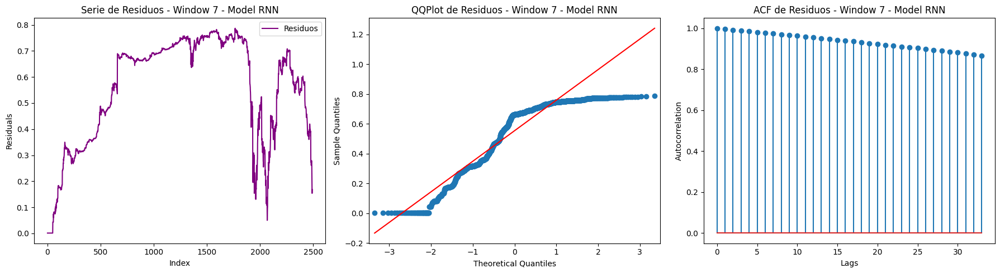

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\1389143047.py:28: RuntimeWarning:

divide by zero encountered in divide



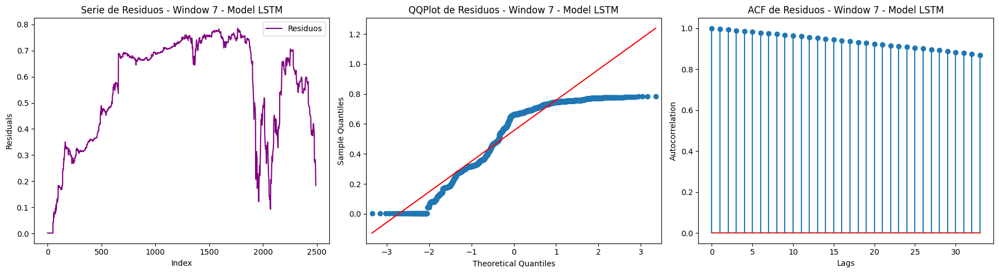

,Model,MAPE,MAE,RMSE,MSE,R2,LJung-Box (p-value),Jarque-Bera (p-value)
0,MLP,inf,0.554892,0.591329,0.349669,-4.289397,0.0,3.026033e-74
1,RNN,inf,0.554000,0.590679,0.348902,-4.277781,0.0,9.139201e-73
2,LSTM,inf,0.555065,0.591312,0.349650,-4.289098,0.0,5.948714e-73


In [473]:
results_table = pd.DataFrame(columns=[ # Crear tabla para almacenar métricas y resultados de pruebas, incluyendo columna de modelo
    'Model', 'MAPE', 'MAE', 'RMSE', 'MSE', 'R2', 'LJung-Box (p-value)', 'Jarque-Bera (p-value)'
])

iii = 2
window_sizes = [7]
# Iterar a través de cada modelo, ventana y rango de tau
for model_name in ['MLP', 'RNN', 'LSTM']:
    for window in window_sizes:
        # Acumular valores reales y predichos de tau 1 a n en una sola lista
        combined_real_values = []
        combined_pred_values = []

        for tau in range(1, iii):  # Ajusta el rango de tau según tus necesidades
            # Acumular valores reales y predichos
            combined_real_values.extend(trainY_matrices[window][tau])
            combined_pred_values.extend(predictions_multivariate[model_name][window][f'Train_Pred_tau_{tau}'])

        # Convertir las listas acumuladas en arreglos numpy
        combined_real_values = np.array(combined_real_values)
        combined_pred_values = np.array(combined_pred_values)
        residuals = combined_real_values - combined_pred_values

        # Calcular métricas
        mae = mean_absolute_error(combined_real_values, combined_pred_values)
        mse = mean_squared_error(combined_real_values, combined_pred_values)
        rmse = np.sqrt(mse)
        mape = np.mean(np.abs(residuals / combined_real_values)) * 100
        r2 = r2_score(combined_real_values, combined_pred_values)

        # Pruebas de independencia (Ljung-Box) y normalidad (Jarque-Bera)
        lb_test = q_stat(acf(residuals, fft=True, nlags=10)[1:], len(residuals))[1][-1]
        jb_test = jarque_bera(residuals)[1]

        # Agregar los resultados a la tabla, incluyendo el nombre del modelo
        row = pd.DataFrame({
            'Model': [model_name],
            'MAPE': [mape],
            'MAE': [mae],
            'RMSE': [rmse],
            'MSE': [mse],
            'R2': [r2],
            'LJung-Box (p-value)': [lb_test],
            'Jarque-Bera (p-value)': [jb_test]
        })

        results_table = pd.concat([results_table, row], ignore_index=True)

        # Crear subplots para los gráficos en una misma figura
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        
        # Gráfico de la serie de residuos
        axes[0].plot(residuals, label='Residuos', color='purple')
        axes[0].set_title(f'Serie de Residuos - Window {window} - Model {model_name}')
        axes[0].set_xlabel('Index')
        axes[0].set_ylabel('Residuals')
        axes[0].legend()

        # QQ Plot de los residuos
        qqplot(residuals, line='s', ax=axes[1])
        axes[1].set_title(f'QQPlot de Residuos - Window {window} - Model {model_name}')

        # ACF de los residuos
        acf_values = acf(residuals, fft=True)
        axes[2].stem(acf_values)
        axes[2].set_title(f'ACF de Residuos - Window {window} - Model {model_name}')
        axes[2].set_xlabel('Lags')
        axes[2].set_ylabel('Autocorrelation')

        plt.tight_layout()
        plt.show()

# Mostrar la tabla completa con los resultados para cada modelo
display(results_table)


Se crea una tabla donde se resume para el residual en el conjunto de entrenamiento, los  scores obtenidos y agregue además las respectivas pruebas de hipóteis para independencia y normalidad. con una tabla de Pandas se construyen las columnas: MAPE, MAE, RMSE, MSE, R2, LJung-Box test (p-value), Jarque-Bera (p-value) y se agregan las figuras para Serie de residuos, QQPlot, ACF de residuos: 

Evidendiando lo siguiente: 

Todos los modelos en el conjunto de entrenamiento en este caso validado para una ventana de tamaño `www=7`, tienen un R2 muy cercano a 1, lo cual indica un posible sobre ajuste del modelo, que podría regularse si se usan dropout mayores en el proceso de entrenamiento. Las pruebas de independencia y normalidad de los residuos con un P_value=0.05, demuestran que los residuos no siguen una distribución normal y que existe una autocorrelación significativa entre los residuos de un periodo y otro. 

Esto ultimo también se evidencia en las gráficas de residuos QQ plot, que muestra que los datos no estár organizados con tendencia central, como se esperaría de la una distribución normal. y el ACF, muestra que hay Lags, de hasta 35 periodos en los que puede haber una correlación significativa. Adicionalmente, se podría sospechar que cada 7, 14,21,28 y 35, periodos de tiempo hay una estacionalidad marcada, esto podría deberse a la forma en la que está plegada la serie. 

Nota: el MAPE se descarta como métrica fiable de entrenamiento para series temporales que contienen valores reales de cero, dado que su forma de calaculo utiliza como denominador los valores reales. 

#### Item 5

In [474]:
def calculate_scores(test_values, predictions):
    # Calcular métricas de error
    mae = mean_absolute_error(test_values, predictions)
    mse = mean_squared_error(test_values, predictions)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((test_values - predictions) / test_values)) * 100
    r2 = r2_score(test_values, predictions)
    
    # Prueba de Ljung-Box para independencia
    residuals = test_values - predictions
    lb_test = q_stat(acf(residuals, fft=True, nlags=40), len(residuals))[1][-1]  # Valor p

    return {
        "MAPE": mape,
        "MAE": mae,
        "RMSE": rmse,
        "MSE": mse,
        "R2": r2,
        "LJung-Box (p-value)": lb_test
    }

# Crear una lista para almacenar los resultados de cada modelo
results = []

# Modelos a evaluar
modelos = ['MLP', 'RNN', 'LSTM']
www = 7  # Tamaño de ventana usado en los datos
iii=2 #Tau periodo a revisar

# Concatenar los valores reales del conjunto de test en una sola serie
test_values = np.concatenate([testY_matrices[www][tau] for tau in range(1, iii)])

# Calcular y almacenar resultados para cada modelo
for model_name in modelos:
    # Concatenar las predicciones del conjunto de test en una sola serie
    predictions = np.concatenate([predictions_multivariate_ret_acum[model_name][www][f'Test_Pred_tau_{tau}'] for tau in range(1, iii)])
    
    # Calcular los puntajes y la prueba de Ljung-Box
    scores = calculate_scores(test_values, predictions)
    scores["Model"] = model_name

    # Agregar los resultados a la lista
    results.append(scores)

# Convertir la lista de resultados a un DataFrame
results_df = pd.DataFrame(results)

# Mostrar la tabla de resultados
results_df


C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\3323645876.py:6: RuntimeWarning:

divide by zero encountered in divide

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\3323645876.py:6: RuntimeWarning:

divide by zero encountered in divide

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\3323645876.py:6: RuntimeWarning:

divide by zero encountered in divide



,MAPE,MAE,RMSE,MSE,R2,LJung-Box (p-value),Model
0,inf,0.007445,0.013173,0.000174,0.997317,0.0,MLP
1,inf,0.005977,0.010885,0.000118,0.998168,0.0,RNN
2,inf,0.006419,0.010691,0.000114,0.998233,0.0,LSTM


Nota: el MAPE se descarta como métrica fiable de entrenamiento para series temporales que contienen valores reales de cero, dado que su forma de calaculo utiliza como denominador los valores reales. Por eso encontramos valores infinitos. 

Se crea una tabla donde se resume para el residual en el conjunto de entrenamiento, los  scores obtenidos y agregue además las respectivas pruebas de hipóteis para independencia y normalidad. con una tabla de Pandas se construyen las columnas: MAPE, MAE, RMSE, MSE, R2, LJung-Box test (p-value). 

Evidendiando lo siguiente: 

Todos los modelos en el conjunto de test en este caso validado para una ventana de tamaño `www=7`, tienen un R2 muy cercano a 1, lo cual nos indica una excelente capacidad de predecir patrones, que tiene las redes neuronales y la ventaja de utilizar pliegos que sigan de cerca el comportamiento de la serie. El modelo con mejor ajuste en esta etapa fue el RNN, con un MSE ligeramente por debajo de los demás modelos. 



#### Item 8 

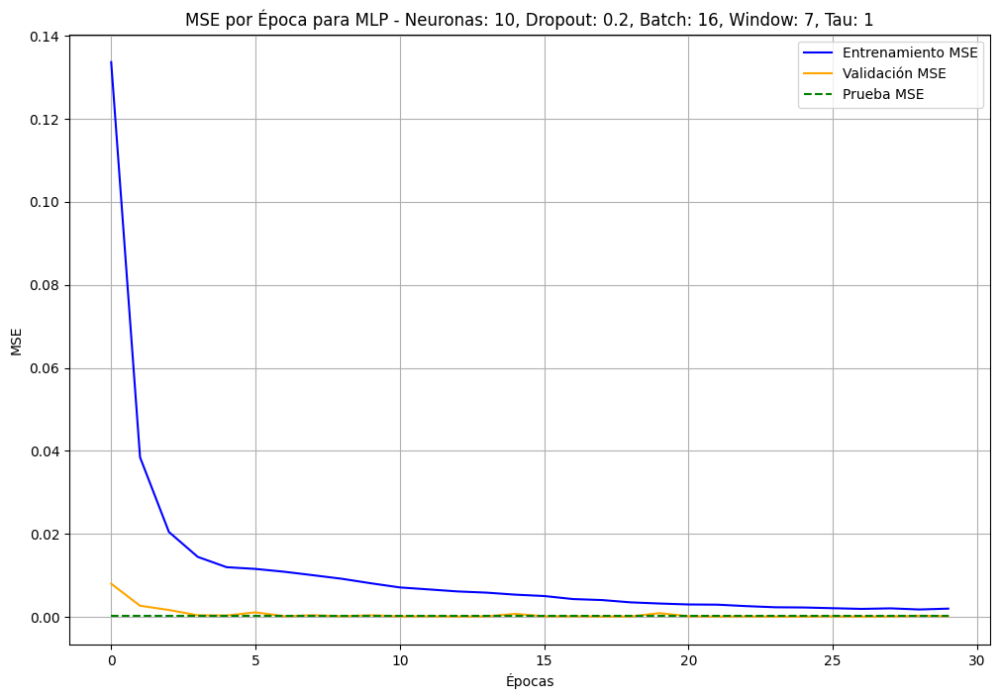

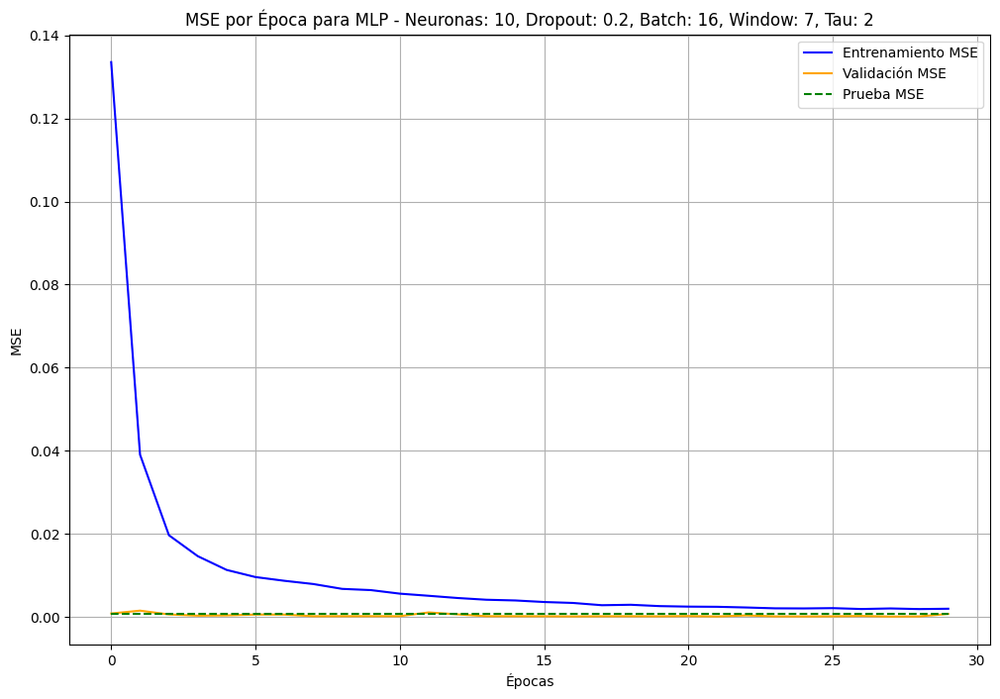

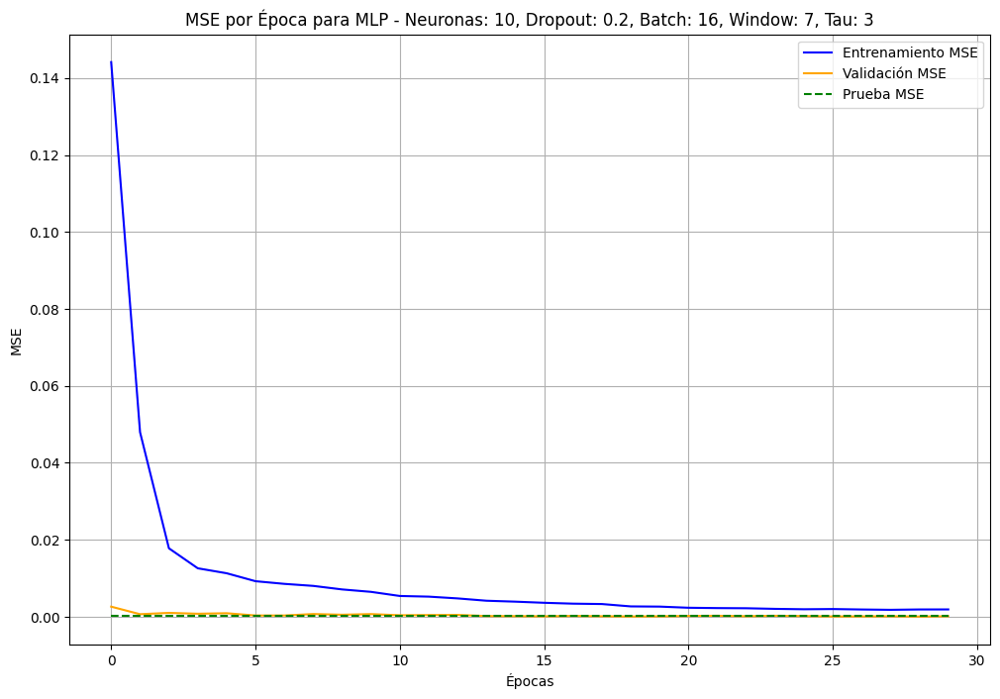

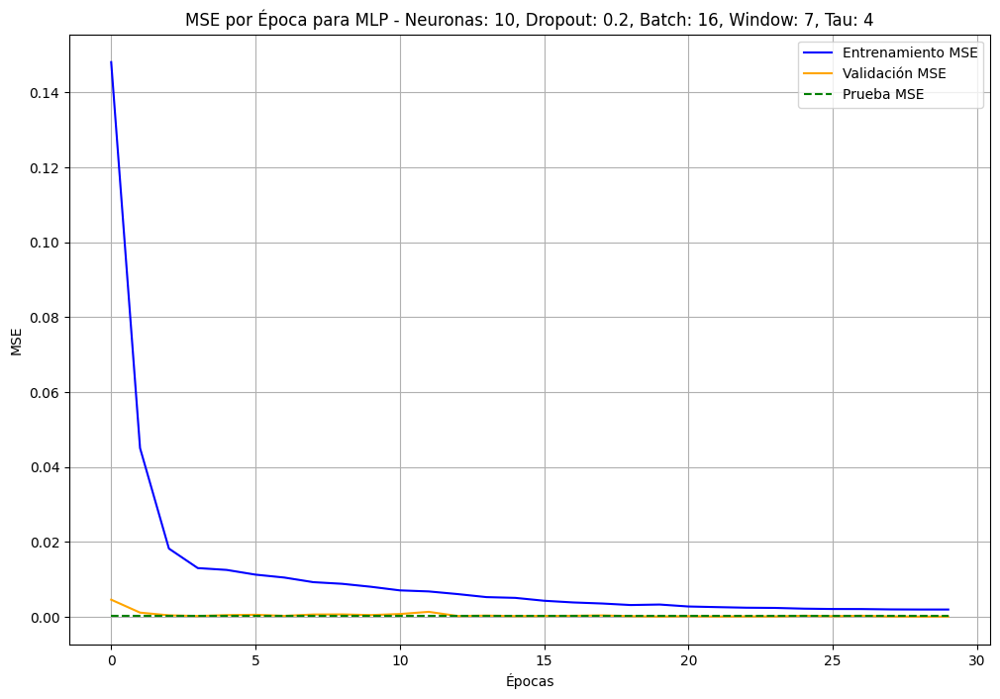

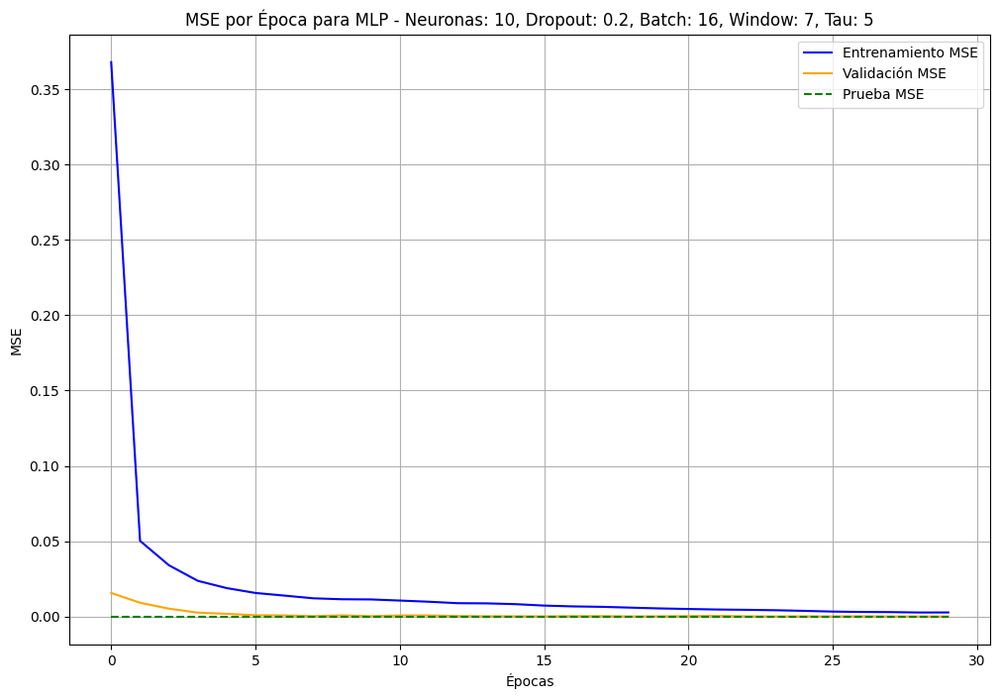

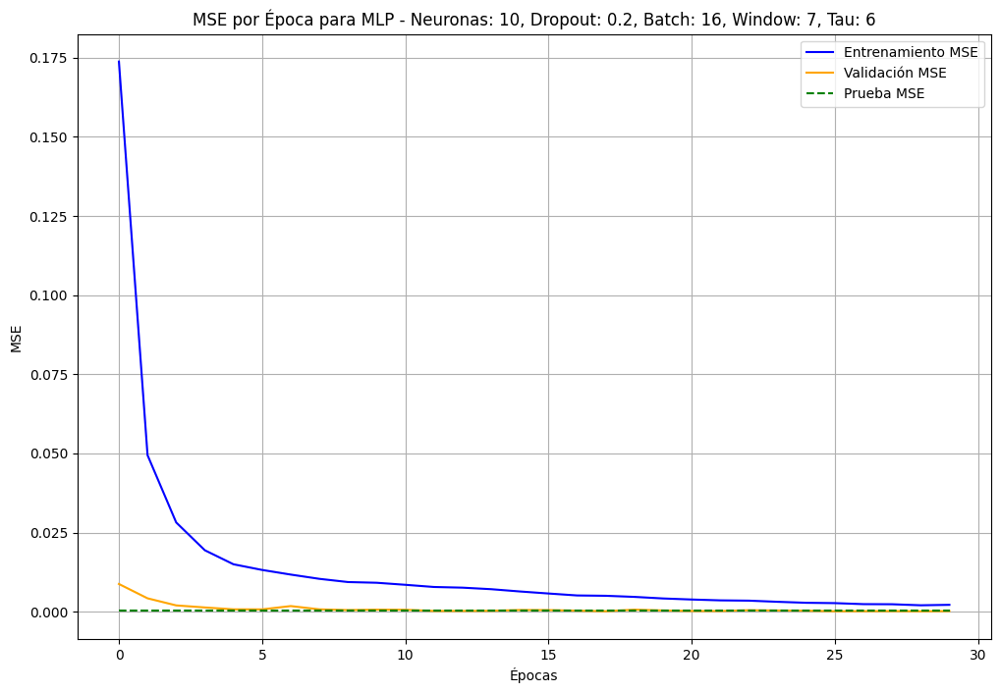

No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_1\MLP_10neurons_0.2dropout_batch16_window14_tau1_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_2\MLP_10neurons_0.2dropout_batch16_window14_tau2_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_3\MLP_10neurons_0.2dropout_batch16_window14_tau3_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_4\MLP_10neurons_0.2dropout_batch16_window14_tau4_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_5\MLP_10neurons_0.2dropout_batch16_window14_tau5_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_6\MLP_10neurons_0.2dropout_batch16_window14_tau6_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_7_tau_1\MLP_10neurons_0.2dropout_batch32_window7_tau1_history.joblib
No se en

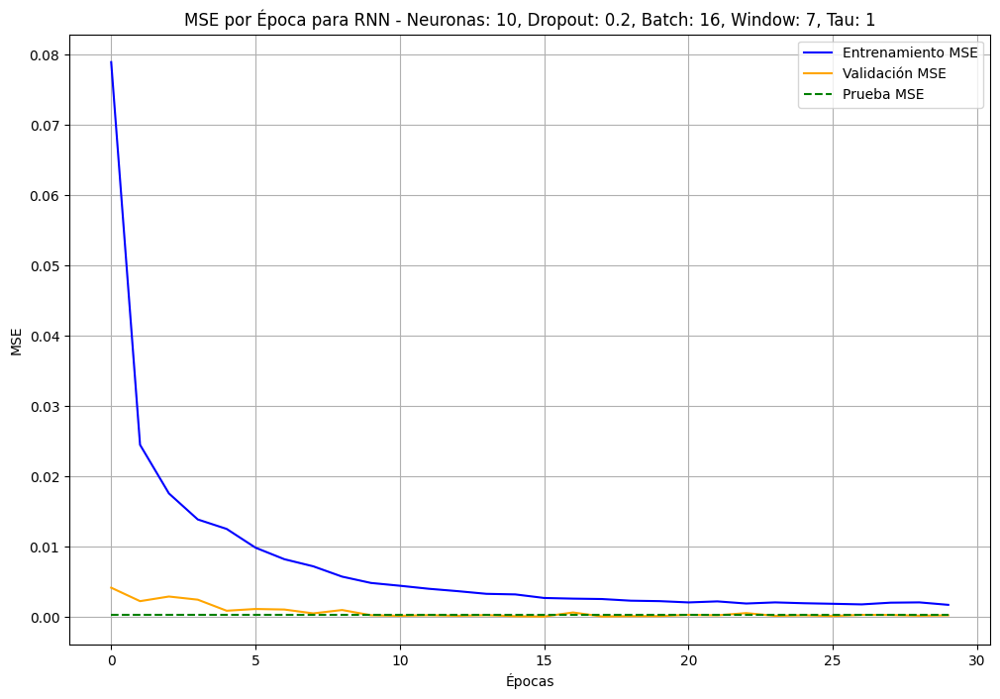

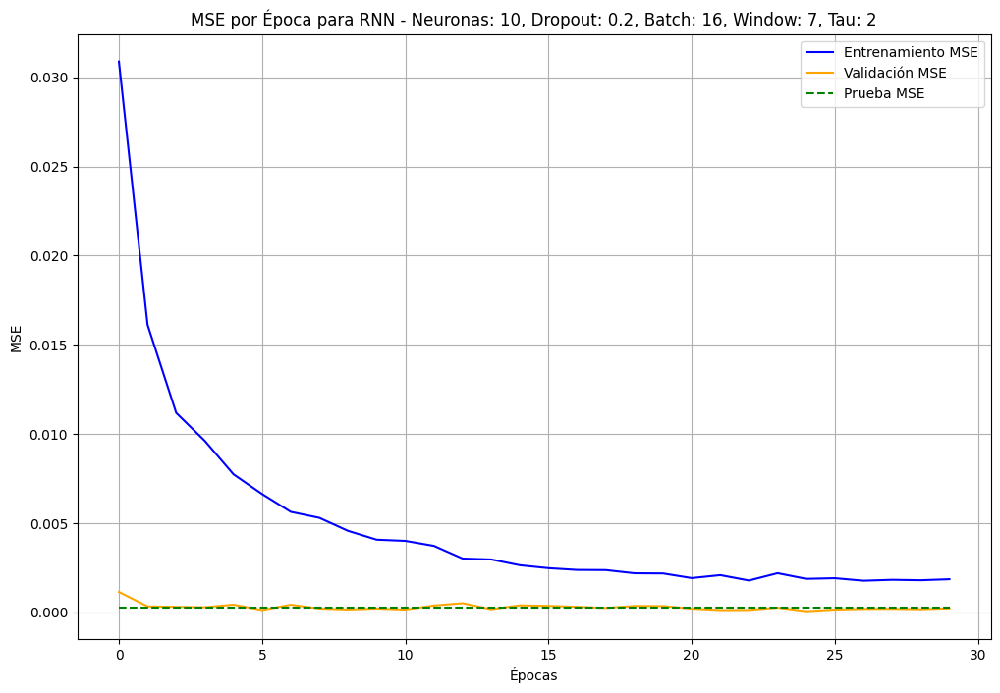

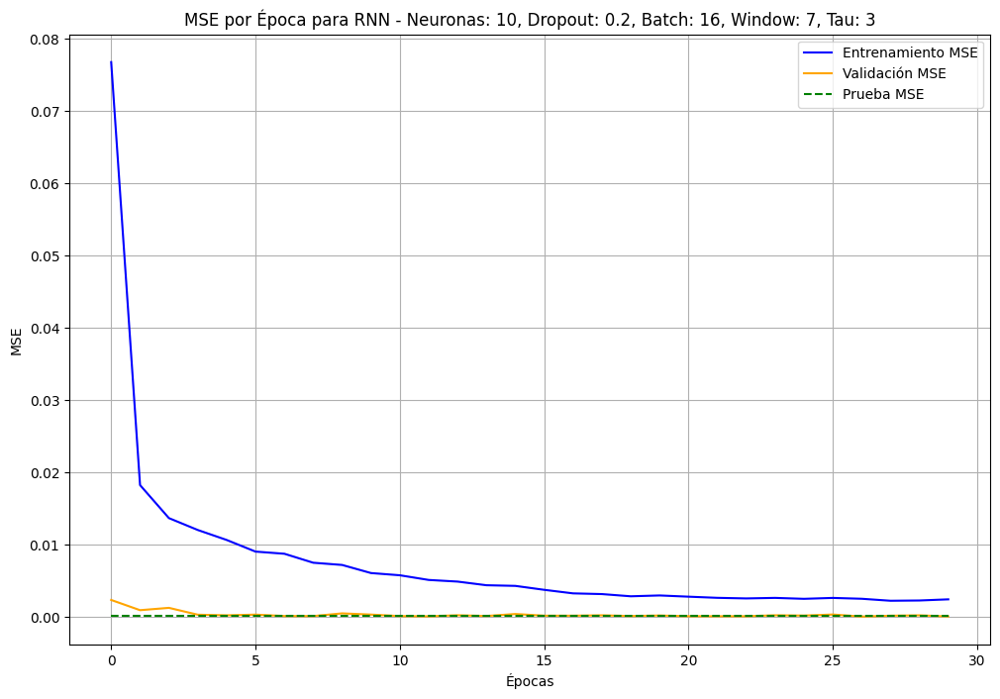

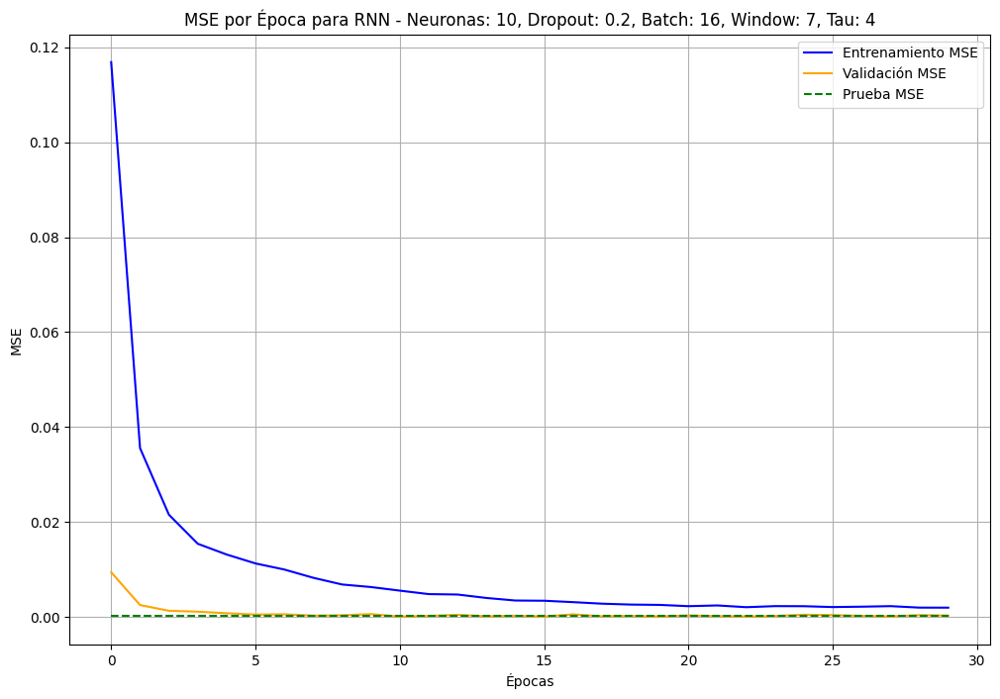

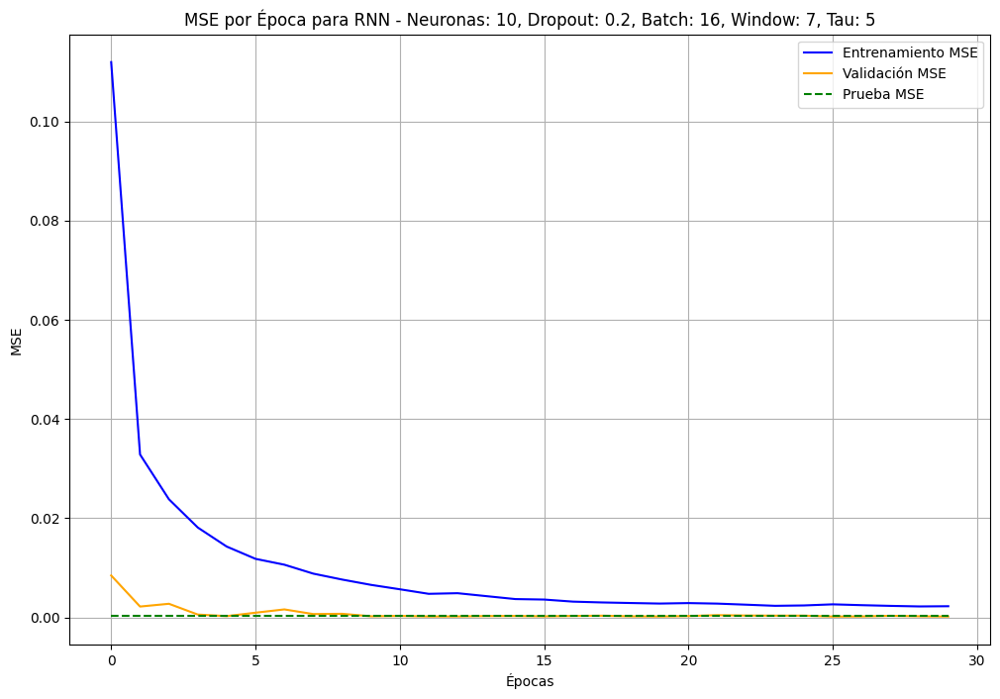

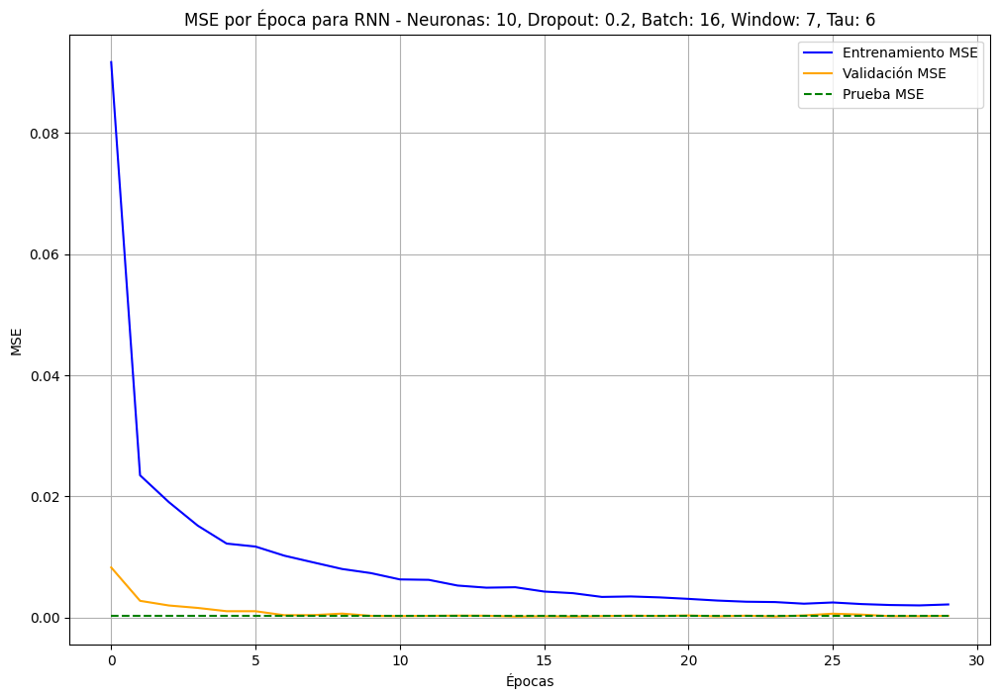

No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_1\RNN_10neurons_0.2dropout_batch16_window14_tau1_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_2\RNN_10neurons_0.2dropout_batch16_window14_tau2_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_3\RNN_10neurons_0.2dropout_batch16_window14_tau3_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_4\RNN_10neurons_0.2dropout_batch16_window14_tau4_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_5\RNN_10neurons_0.2dropout_batch16_window14_tau5_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_6\RNN_10neurons_0.2dropout_batch16_window14_tau6_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_7_tau_1\RNN_10neurons_0.2dropout_batch32_window7_tau1_history.joblib
No se en

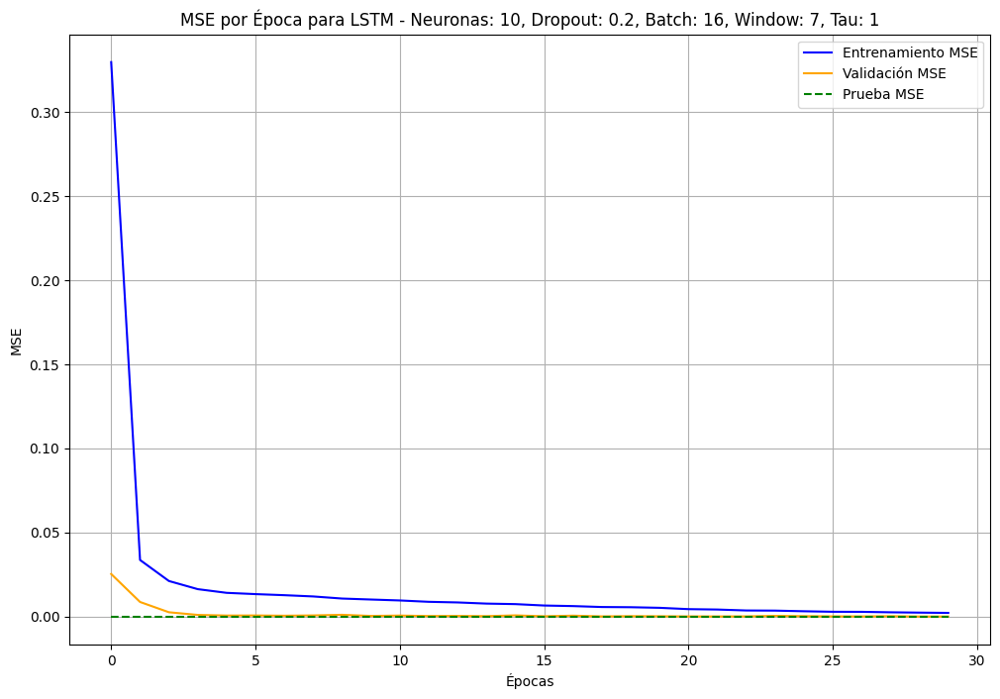

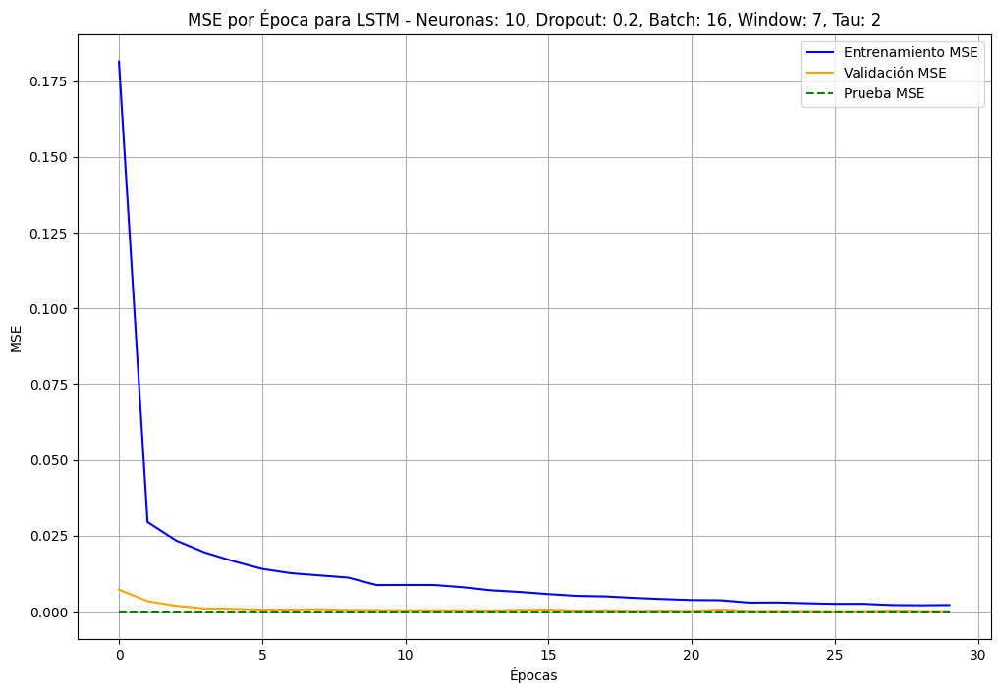

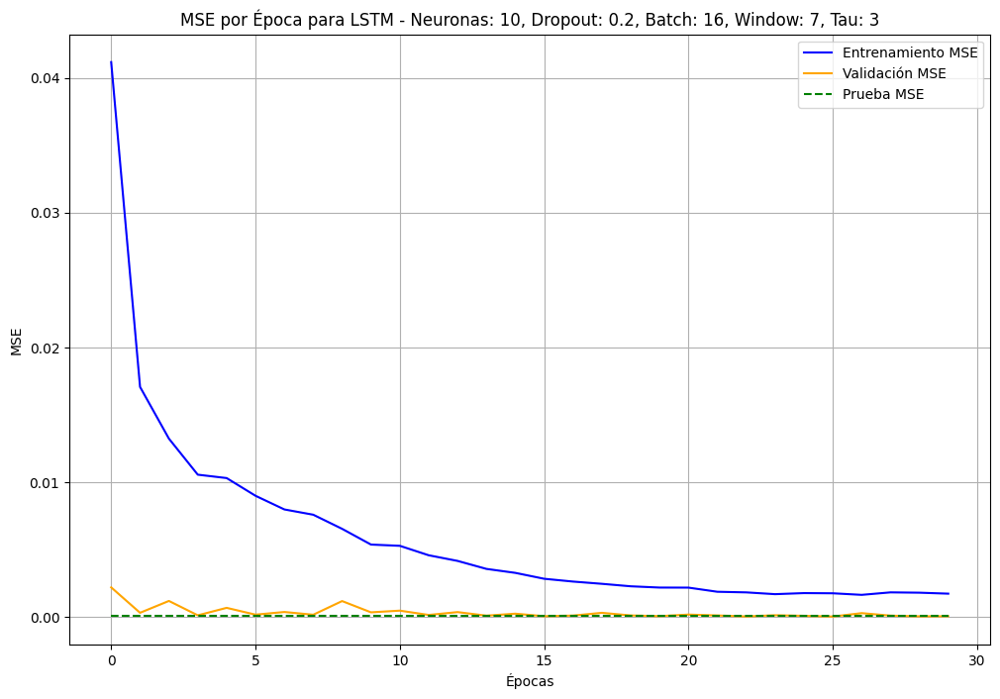

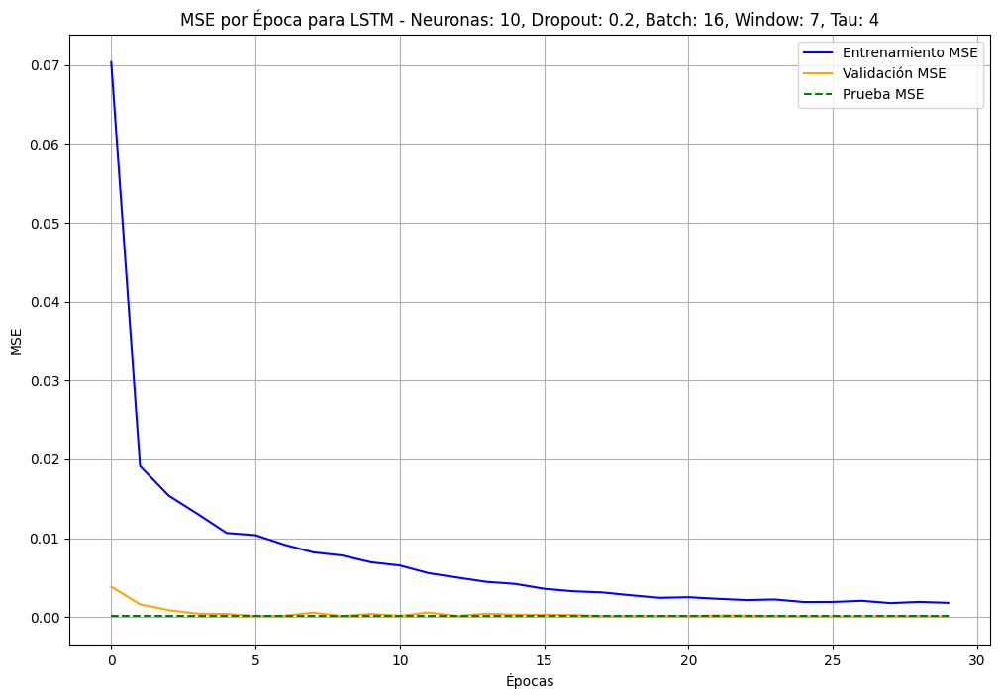

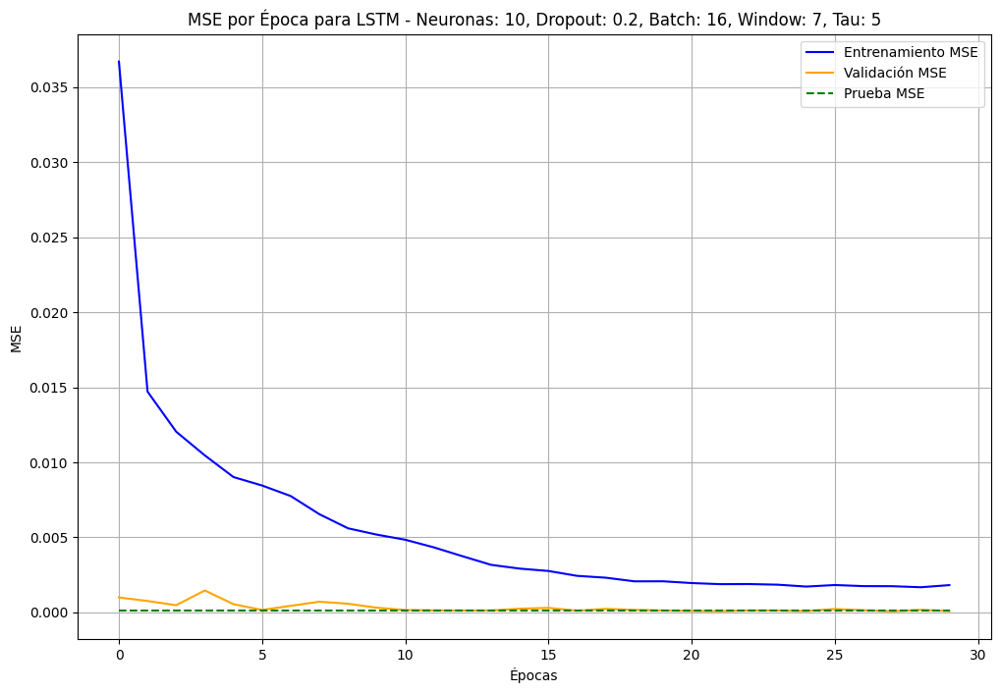

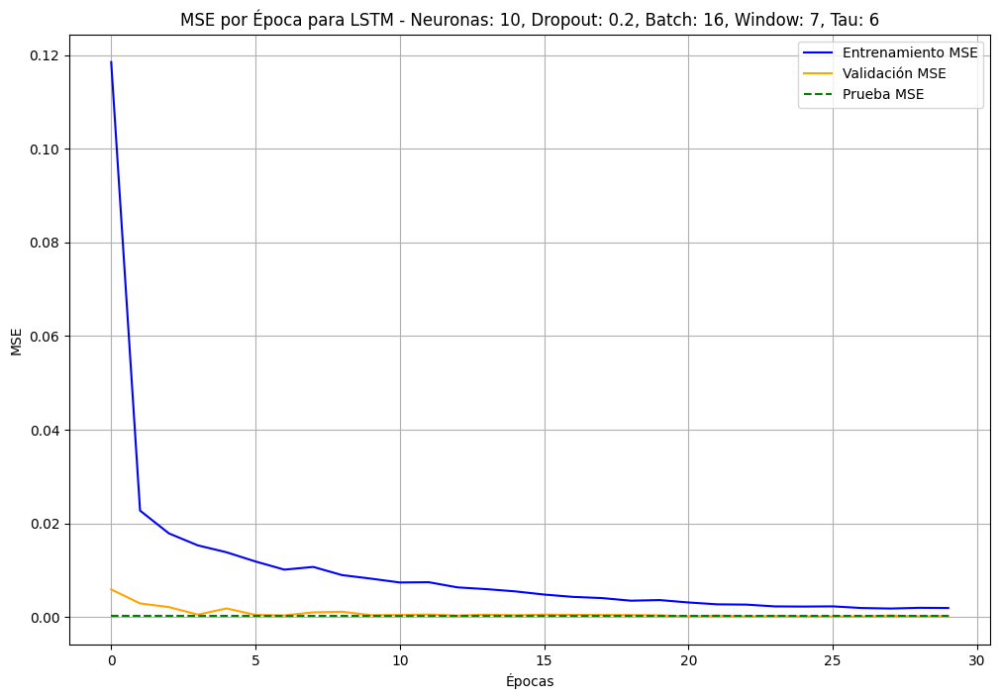

No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_1\LSTM_10neurons_0.2dropout_batch16_window14_tau1_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_2\LSTM_10neurons_0.2dropout_batch16_window14_tau2_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_3\LSTM_10neurons_0.2dropout_batch16_window14_tau3_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_4\LSTM_10neurons_0.2dropout_batch16_window14_tau4_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_5\LSTM_10neurons_0.2dropout_batch16_window14_tau5_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_14_tau_6\LSTM_10neurons_0.2dropout_batch16_window14_tau6_history.joblib
No se encontró el archivo de historial: modelos_ret_acum/models_window_7_tau_1\LSTM_10neurons_0.2dropout_batch32_window7_tau1_history.joblib
N

In [475]:
import matplotlib.pyplot as plt
from joblib import load
from itertools import product
import os

# Parámetros de especificaciones para generar combinaciones
model_names = ['MLP', 'RNN', 'LSTM']
neurons = [10, 100]
dropouts = [0.2, 0.4]
batch_sizes = [16, 32]
window_sizes = [7, 14]  # Asegúrate de incluir todos los tamaños de ventana que usaste
taus = range(1, 7)  # Rango de valores de tau

# Generar combinaciones de especificaciones
model_specs = [
    {'model_name': name, 'neurons': n, 'dropout': d, 'batch_size': b, 'window_size': w, 'tau': t}
    for name, n, d, b, w, t in product(model_names, neurons, dropouts, batch_sizes, window_sizes, taus)
]

# Función para cargar el historial
def load_history(filename):
    try:
        return load(filename)
    except FileNotFoundError:
        print(f"No se encontró el archivo de historial: {filename}")
        return None

# Función para graficar el historial con foco en el MSE
def plot_mse_history(history_data, spec):
    plt.figure(figsize=(12, 8))

    # Graficar MSE para entrenamiento, validación y prueba si están en el historial
    if 'mean_squared_error' in history_data:
        plt.plot(history_data['mean_squared_error'], label="Entrenamiento MSE", color='blue')
    if 'val_mean_squared_error' in history_data:
        plt.plot(history_data['val_mean_squared_error'], label="Validación MSE", color='orange')
    if 'test_mean_squared_error' in history_data:
        # `test_mean_squared_error` es un valor constante, así que se repetirá para cada época
        plt.plot([history_data['test_mean_squared_error'][0]] * len(history_data['mean_squared_error']), 
                 label="Prueba MSE", color='green', linestyle='--')

    # Configuración de título y etiquetas
    plt.title(f"MSE por Época para {spec['model_name']} - Neuronas: {spec['neurons']}, Dropout: {spec['dropout']}, Batch: {spec['batch_size']}, Window: {spec['window_size']}, Tau: {spec['tau']}")
    plt.xlabel("Épocas")
    plt.ylabel("MSE")
    plt.legend()
    plt.grid(True)
    plt.show()

# Cargar y graficar el historial para cada modelo
for spec in model_specs:
    # Crear el nombre del archivo de historial con el nuevo formato de subcarpeta
    model_dir = f"modelos_ret_acum/models_window_{spec['window_size']}_tau_{spec['tau']}"
    base_filename = f"{spec['model_name']}_{spec['neurons']}neurons_{spec['dropout']}dropout_batch{spec['batch_size']}_window{spec['window_size']}_tau{spec['tau']}"
    history_filename = os.path.join(model_dir, f"{base_filename}_history.joblib")

    # Cargar el historial y graficar si existe
    history_data = load_history(history_filename)
    if history_data:
        plot_mse_history(history_data, spec)

En las primeras epocas de entrenamiento la variabilidad del error es alta, dado al proceso de parametrización natural de las redes neuronales sin embargo, a partir de la 5ta época se evidencia una estabilización de los errores, que parecen converger al error definitivo que tiene el modelo en el conjunto de test. Este ultimo es constante, dado a que no varía por las épocas porque los datos de test se prueban  al final del periodo de entrenamiento para calcular el rendimiento real del modelo. 

#### Item 9

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\4265328427.py:45: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



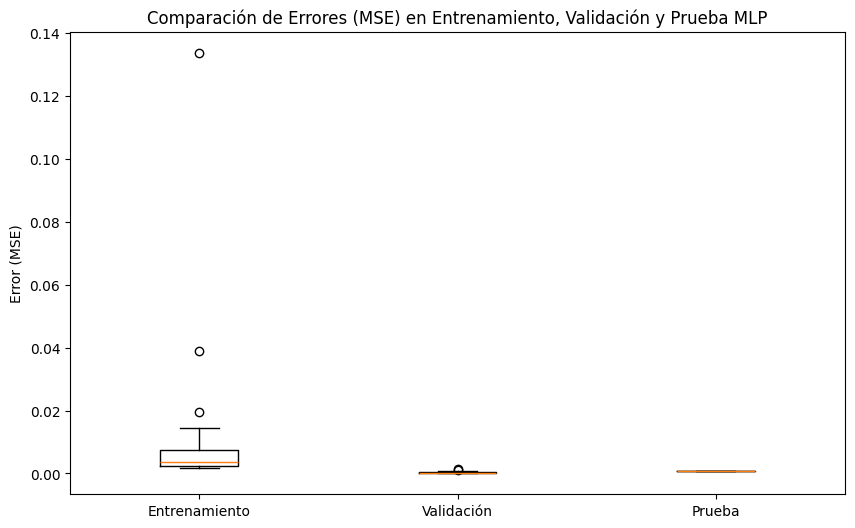

Estadístico de Kruskal-Wallis: 74.7664, Valor p: 0.0000
Las medianas de los errores son significativamente diferentes entre los conjuntos.


C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\4265328427.py:45: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



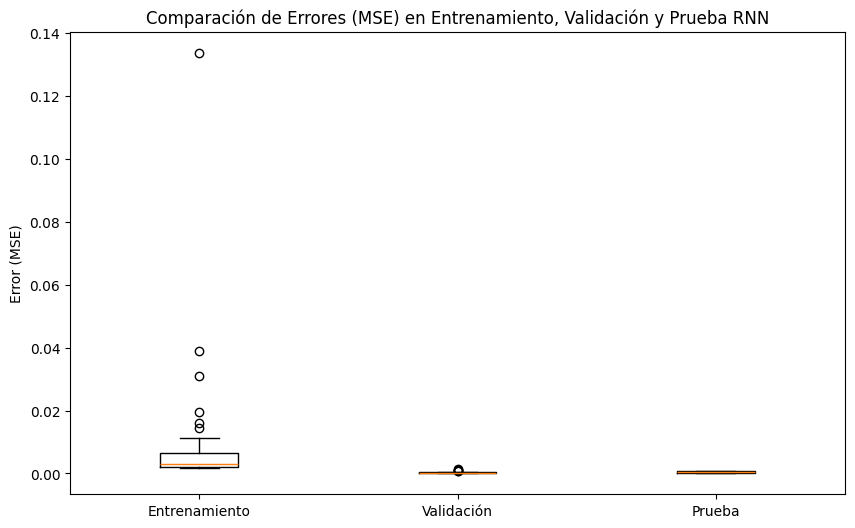

Estadístico de Kruskal-Wallis: 132.5966, Valor p: 0.0000
Las medianas de los errores son significativamente diferentes entre los conjuntos.


C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\4265328427.py:45: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



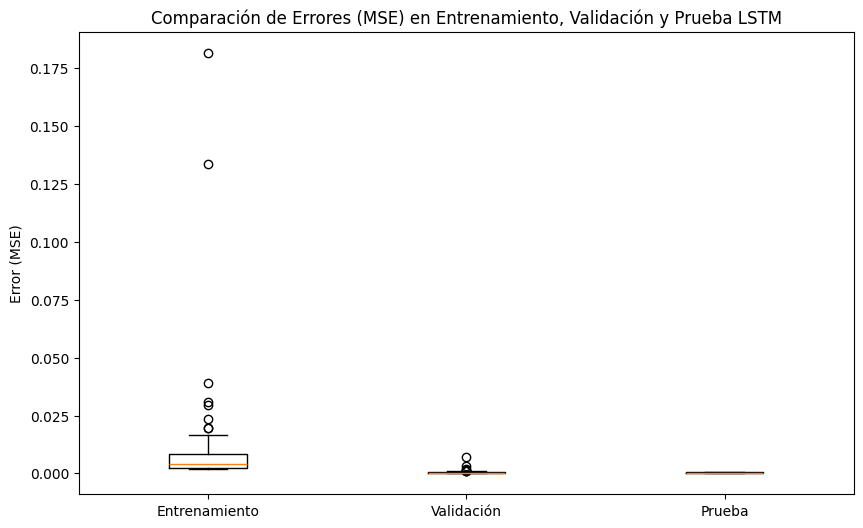

Estadístico de Kruskal-Wallis: 175.3397, Valor p: 0.0000
Las medianas de los errores son significativamente diferentes entre los conjuntos.


In [476]:
import os
import matplotlib.pyplot as plt
from joblib import load
import numpy as np
import scipy.stats as stats

# Parámetros que coinciden con el nombre de archivo creado
model_names = ['MLP', 'RNN', 'LSTM']
neurons = [10, 100]
dropouts = [0.2, 0.4]
batch_sizes = [16, 32]
window_size = 7  # Ajustar según el análisis actual
tau = 2  # Ajustar según el análisis actual

# Diccionarios para almacenar los errores de cada conjunto
train_errors = []
val_errors = []
test_errors = []

# Cargar errores desde los archivos de historial
for model_name in model_names:
    for n in neurons:
        for d in dropouts:
            for b in batch_sizes:
                # Generar la ruta del archivo de historial
                model_dir = f'modelos_ret_acum/models_window_{window_size}_tau_{tau}'
                base_filename = f"{model_name}_{n}neurons_{d}dropout_batch{b}_window{window_size}_tau{tau}_history.joblib"
                history_path = os.path.join(model_dir, base_filename)
                
                # Cargar el historial si existe
                if os.path.exists(history_path):
                    history_data = load(history_path)
                    
                    # Extraer errores (MSE) de entrenamiento, validación y prueba si están disponibles
                    if 'mean_squared_error' in history_data:
                        train_errors.extend(history_data['mean_squared_error'])
                    if 'val_mean_squared_error' in history_data:
                        val_errors.extend(history_data['val_mean_squared_error'])
                    if 'test_mean_squared_error' in history_data:
                        # Error de prueba es constante, se extiende en el tamaño de épocas para la comparación
                        test_errors.extend([history_data['test_mean_squared_error'][0]] * len(history_data['mean_squared_error']))

    # Generar los boxplots
    plt.figure(figsize=(10, 6))
    plt.boxplot([train_errors, val_errors, test_errors], labels=['Entrenamiento', 'Validación', 'Prueba'])
    plt.title(f"Comparación de Errores (MSE) en Entrenamiento, Validación y Prueba {model_name}")
    plt.ylabel("Error (MSE)")
    plt.show()

    # Realizar la prueba de Kruskal-Wallis para comparar las medianas de los errores
    stat, p_value = stats.kruskal(train_errors, val_errors, test_errors)
    print(f"Estadístico de Kruskal-Wallis: {stat:.4f}, Valor p: {p_value:.4f}")

    # Interpretación de resultados
    if p_value < 0.05:
        print("Las medianas de los errores son significativamente diferentes entre los conjuntos.")
    else:
        print("No hay diferencias significativas en las medianas de los errores entre los conjuntos.")


Tiene sentido que las medianas de los errores en entrenamiento validación y test sean siginfiicativamente diferente, dado a que en las primeras épocas de entrenamiento el modelo en entrenamiento tiene mayor variabilidad, la cual se estabiliza en el proceso de validación dando como resultado un error esperado definitivo en el conjunto de prueba. 

#### Item 10. Desplegar serie original.

In [481]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def desplegar_predicciones_y_datos_originales(predictions_multivariate_ret_acum, 
                                              original_series, 
                                              window_size_train, window_size_val, window_size_test, 
                                              num_ventanas, original_length, 
                                              modelo='MLP', zoom_range=None,
                                              trainY_matrices=None, valY_matrices=None, testY_matrices=None):

    # Inicializar la serie reconstruida con valores NaN
    reconstructed_predictions = np.full(original_length, np.nan)

    # Desplegar las predicciones en su posición correcta
    for tau in range(1, num_ventanas + 1):
        train_pred = predictions_multivariate_ret_acum[modelo][window_size_train/2][f'Train_Pred_tau_{tau}']
        val_pred = predictions_multivariate_ret_acum[modelo][window_size_val][f'Val_Pred_tau_{tau}']
        test_pred = predictions_multivariate_ret_acum[modelo][window_size_test][f'Test_Pred_tau_{tau}']
        
        for i in range(len(train_pred) // window_size_train):
            train_start = i * (window_size_train + window_size_val + window_size_test)
            val_start = train_start + window_size_train
            test_start = val_start + window_size_val

            reconstructed_predictions[train_start:train_start + window_size_train] = train_pred[i * window_size_train:(i + 1) * window_size_train]
            reconstructed_predictions[val_start:val_start + window_size_val] = val_pred[i * window_size_val:(i + 1) * window_size_val]
            reconstructed_predictions[test_start:test_start + window_size_test] = test_pred[i * window_size_test:(i + 1) * window_size_test]

    reconstructed_predictions = pd.Series(reconstructed_predictions, index=original_series.index)

    # Crear las secciones de entrenamiento, validación y prueba para los datos originales
    original_train_series = np.full(original_length, np.nan)
    original_val_series = np.full(original_length, np.nan)
    original_test_series = np.full(original_length, np.nan)

    # Insertar valores de los datos originales en las posiciones correspondientes
    for tau in range(1, num_ventanas + 1):
        for i in range(len(trainY_matrices[window_size_train/2][tau]) // window_size_train):
            train_start = i * (window_size_train + window_size_val + window_size_test)
            val_start = train_start + window_size_train
            test_start = val_start + window_size_val

            original_train_series[train_start:train_start + window_size_train] = trainY_matrices[window_size_train/2][tau][i * window_size_train:(i + 1) * window_size_train]
            original_val_series[val_start:val_start + window_size_val] = valY_matrices[window_size_val][tau][i * window_size_val:(i + 1) * window_size_val]
            original_test_series[test_start:test_start + window_size_test] = testY_matrices[window_size_test][tau][i * window_size_test:(i + 1) * window_size_test]

    # Convertir a Series de Pandas para facilitar la visualización
    original_train_series = pd.Series(original_train_series, index=original_series.index)
    original_val_series = pd.Series(original_val_series, index=original_series.index)
    original_test_series = pd.Series(original_test_series, index=original_series.index)

    # Gráfico completo con predicciones y datos originales
    plt.figure(figsize=(14, 8))
    plt.plot(original_series, label='Serie Original', color='black')
    plt.plot(reconstructed_predictions, label=f'Predicciones Restauradas - Modelo {modelo}', linestyle='--', color='blue')
    plt.plot(original_train_series, label='Datos Originales - Entrenamiento', color='cyan')
    plt.plot(original_val_series, label='Datos Originales - Validación', color='orange')
    plt.plot(original_test_series, label='Datos Originales - Prueba', color='green')
    
    plt.title(f"Serie Completa - Modelo {modelo} con Datos Originales")
    plt.xlabel("Índice de Tiempo")
    plt.ylabel("Valor de Predicción")
    plt.legend()
    plt.show()

    # Gráfico de zoom en el rango especificado
    if zoom_range is not None:
        zoom_start, zoom_end = zoom_range
        plt.figure(figsize=(14, 8))
        plt.plot(original_series[zoom_start:zoom_end], label='Serie Original (Zoom)', linestyle='--', color='grey')
        plt.plot(reconstructed_predictions[zoom_start:zoom_end], label=f'Predicciones Restauradas - Modelo {modelo} (Zoom)', linestyle='--', color='blue')
        plt.plot(original_train_series[zoom_start:zoom_end], label='Datos Originales - Entrenamiento (Zoom)', color='cyan')
        plt.plot(original_val_series[zoom_start:zoom_end], label='Datos Originales - Validación (Zoom)', color='orange')
        plt.plot(original_test_series[zoom_start:zoom_end], label='Datos Originales - Prueba (Zoom)', color='green')

        plt.title(f"Zoom en el Rango [{zoom_start}:{zoom_end}] - Modelo {modelo} con Datos Originales")
        plt.xlabel("Índice de Tiempo")
        plt.ylabel("Valor de Predicción")
        plt.legend()
        plt.show()

    return reconstructed_predictions




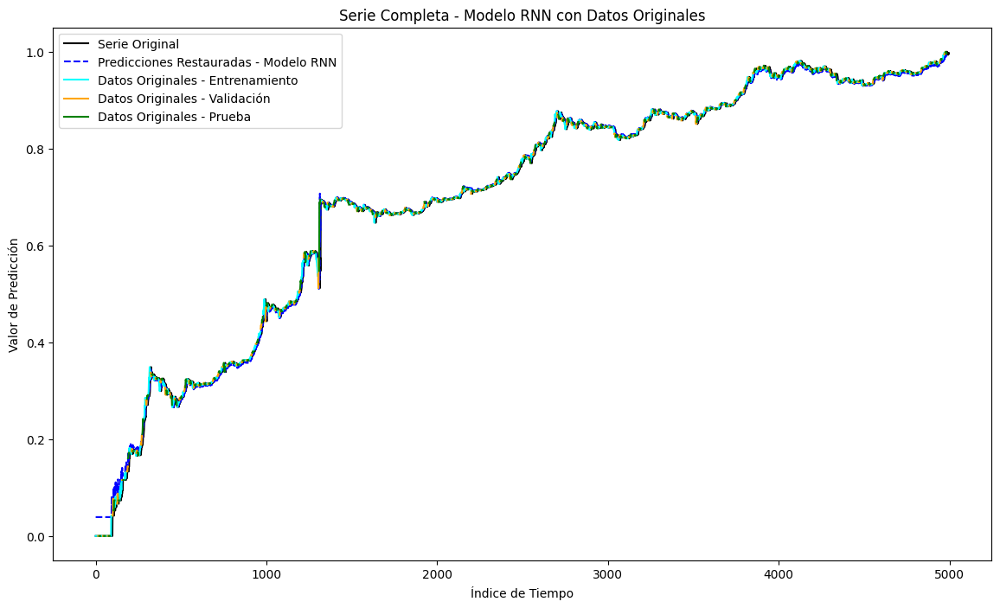

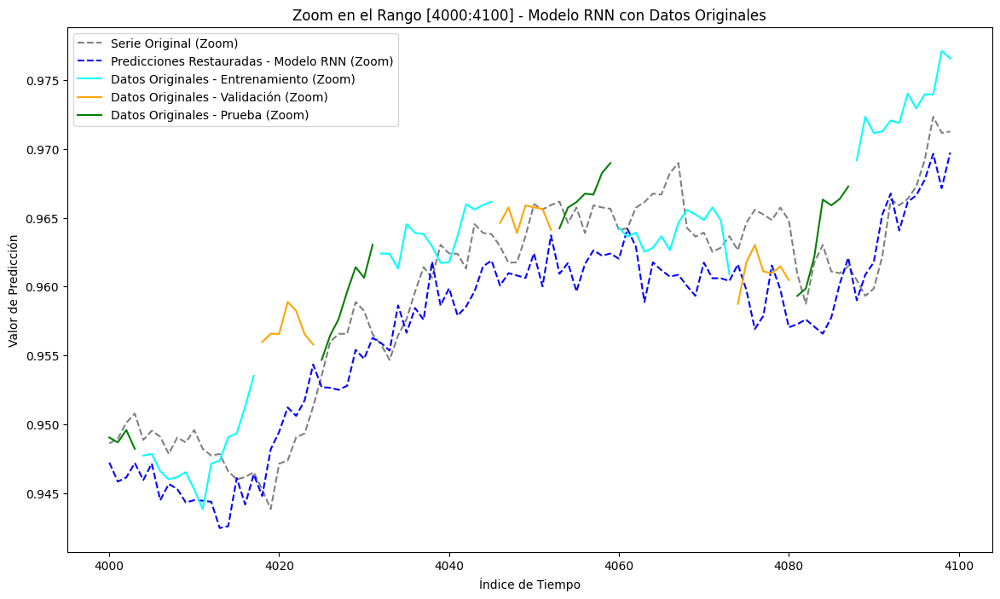

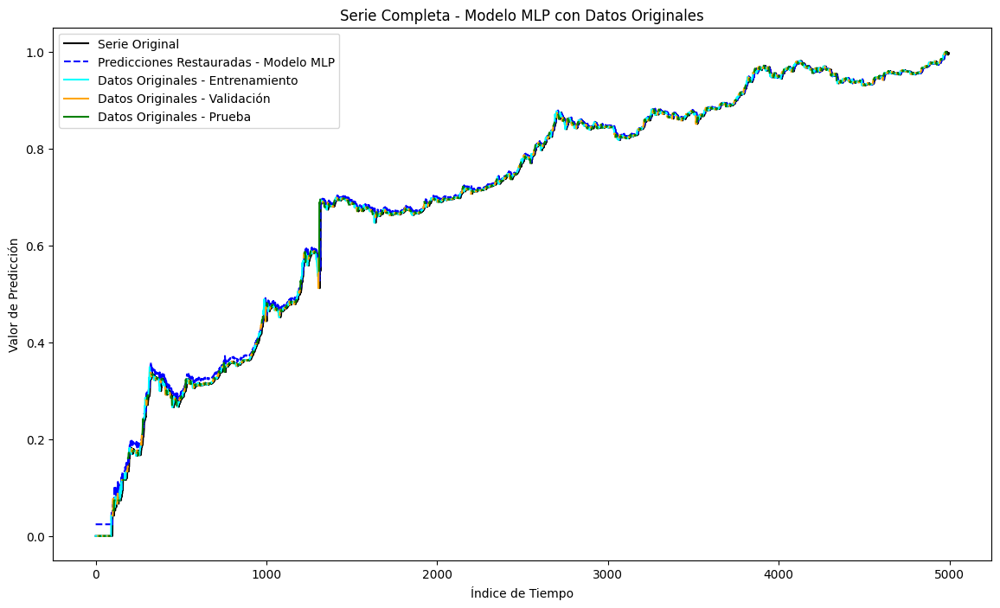

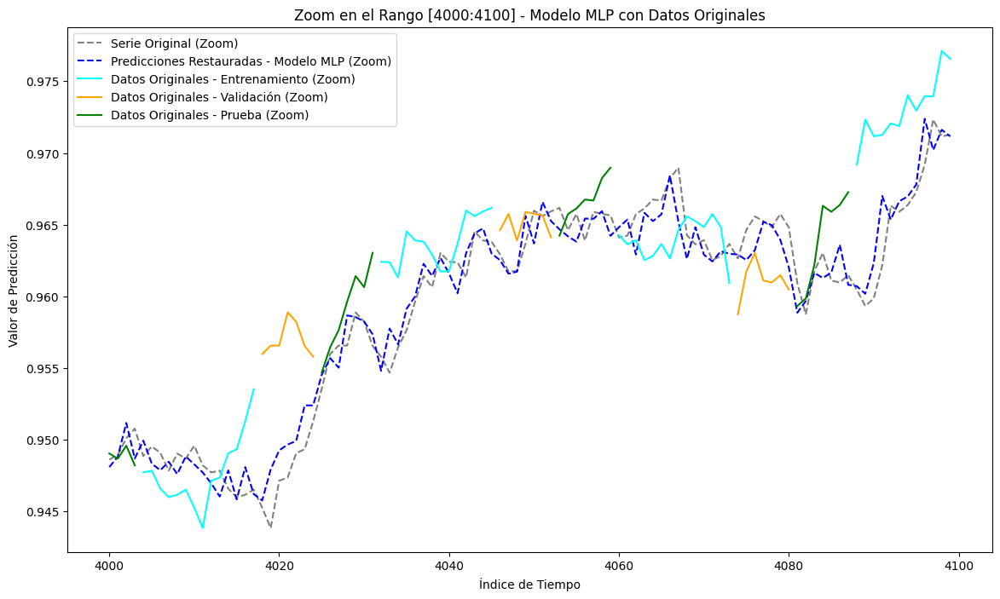

In [482]:
reconstructed_predictions = desplegar_predicciones_y_datos_originales(predictions_multivariate_ret_acum, 
                                                                  original_series=df_ret_acum_scaled, 
                                                                  window_size_train=14, 
                                                                  window_size_val=7, 
                                                                  window_size_test=7, 
                                                                  num_ventanas=2, 
                                                                  original_length=4998,
                                                                  modelo='RNN',
                                                                  zoom_range=(4000, 4100),trainY_matrices=trainY_matrices,valY_matrices=valY_matrices,testY_matrices=testY_matrices)  # Definir el rango de zoom aquí


reconstructed_predictions = desplegar_predicciones_y_datos_originales(predictions_multivariate_ret_acum, 
                                                                  original_series=df_ret_acum_scaled, 
                                                                  window_size_train=14, 
                                                                  window_size_val=7, 
                                                                  window_size_test=7, 
                                                                  num_ventanas=2, 
                                                                  original_length=4998,
                                                                  modelo='MLP',
                                                                  zoom_range=(4000 , 4100),trainY_matrices=trainY_matrices,valY_matrices=valY_matrices,testY_matrices=testY_matrices)  # Definir el rango de zoom aquí



Siguiendo el proceso inverso del plegado inicial se despliega la serie y se vuelve a colocar en los valores iniciales. Se hace zoom, en un segmento de la serie en particular para ver la diferencia en la forma de predicción entre modelos. 

Se particulariza la ventana de tamaño 7 para los 3 modelos, con el fin de disminuir la cantidad de gráficas desplegadas. Se visualiza la forma en la que fueron segmentados los datos, para ser utilizados en el entrenamiento de tau periodos.  

Repetimos el procesos de los Item del 3 al 10, para la serie de tiempo `retorno acumulado`y `volatibilidad`

## Parte 3 volatilidad

In [483]:
#Volatilidad
w=7

def volatility(w, at):
    vols = []

    for t in range(0, len(at)-w+1):
        sqr = []
        r_list = at[t:w+t]
        miu = (1/w)*(sum(r_list))
        
        for r in r_list:
            dif = r - miu
            sqr.append(dif)
        vol = ((1/(w-1))*(sum(sqr)))**(1/2)
        vols.append(vol)
    vols = np.nan_to_num(vols)
    vols = pd.Series(vols)
    return vols

volatility=volatility(w,at)
df_volatility = pd.DataFrame(volatility, columns=["RetornoAcumulado"])

# Crear el escalador
scaler = MinMaxScaler(feature_range=(0, 1))

# Escalar los datos
df_volatility_scaled = scaler.fit_transform(df_volatility.values.reshape(-1, 1)).flatten()

# Convertir a DataFrame si es necesario
df_volatility_scaled = pd.DataFrame(df_volatility_scaled, columns=["RetornoAcumulado"])

print(df_volatility_scaled)
print(len(df_volatility_scaled))

      RetornoAcumulado
0             0.000000
1             0.000000
2             0.000000
3             0.000000
4             0.000000
...                ...
4987          0.125000
4988          0.176777
4989          0.000000
4990          0.044194
4991          0.000000

[4992 rows x 1 columns]
4992


C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\1697862817.py:15: RuntimeWarning:

invalid value encountered in double_scalars



### Item 3, 6 y 7 Ciclo de iteración de modelos

In [484]:
window_sizes = [7]#14,21,28  # Se restringió intencionalmente el tamaño del número de ventanas, por restricciones computacionales
step_size = 1
predictions_dict = {}
error_dict = {}
history_MLP = {}
history_RNN = {}
history_LSTM = {}

# Diccionarios para almacenar matrices y predicciones multivariadas
trainX_matrices = {}
trainY_matrices = {}
valX_matrices = {}
valY_matrices = {}
testX_matrices = {}
testY_matrices = {}
predictions_multivariate_volatility_scaled = {'MLP': {}, 'RNN': {}, 'LSTM': {}}

# Inicialización de predictions_multivariate_volatility_scaled para todos los valores de tau de 1 a 28, 
# con el fin de garantizar todas las combinaciones de 
# dim(X(j)train) = (M(j)rows,N(j)cols) con M(j)rows,N(j)cols = 7, 14, 21, 28 #

for www in window_sizes:
    for model_name in ['MLP', 'RNN', 'LSTM']:
        predictions_multivariate_volatility_scaled[model_name][www] = {}  # Usar www directamente como el valor individual extraído de la lista
        for tau in range(1, 29):  # Inicializa para el rango completo de tau
            predictions_multivariate_volatility_scaled[model_name][www][f'Train_Pred_tau_{tau}'] = []
            predictions_multivariate_volatility_scaled[model_name][www][f'Val_Pred_tau_{tau}'] = []
            predictions_multivariate_volatility_scaled[model_name][www][f'Test_Pred_tau_{tau}'] = []

for www in window_sizes:
    trainX_matrices[www] = {}
    trainY_matrices[www] = {}
    valX_matrices[www] = {}
    valY_matrices[www] = {}
    testX_matrices[www] = {}
    testY_matrices[www] = {}
    history_MLP[www] = {}
    history_RNN[www] = {}
    history_LSTM[www] = {}

    # Variables para almacenar el mejor modelo seleccionado
    best_model_MLP = None
    best_model_RNN = None
    best_model_LSTM = None
    
    # Punto 3 Item 6. En esta parte del códidgo se van creando las ventanas de tamaño www
    # para tau periodos, con el fin de encontrar el mejor modelo, se predicen los tau de uno en uno
    # posteriormente guardan las predicciones en en arreglo predictions_multivariate[model][www][iii]
    # y subsecuentemente se guardan también en una arreglo matricial del estilo "_matrices[www][iii]", 
    # los valores con los que se preparó el modelo de la ventana www para predecir el peridodo iii
    
    for iii in range(1, 7):  
        # Crear ventanas deslizantes y dividir datos en segmentos para cada tau
        result_dict = create_sliding_windows(data=df_volatility_scaled.values.flatten(), window_sizes=window_sizes, step_size=step_size, taus=[iii])
        train_data, val_data, test_data, df = segment_data_by_window(result_dict[f'Window_{www}'], train_size=2*www, val_size=www, test_size=www)
        
        # Asignar y transformar datos
        trainX = np.asarray(train_data.iloc[:, 0:www].values, dtype=float).reshape((len(train_data), www, 1))
        trainY = np.asarray(train_data.iloc[:, www].values, dtype=float).ravel()
        valX = np.asarray(val_data.iloc[:, 0:www].values, dtype=float).reshape((len(val_data), www, 1))
        valY = np.asarray(val_data.iloc[:, www].values, dtype=float).ravel()
        testX = np.asarray(test_data.iloc[:, 0:www].values, dtype=float).reshape((len(test_data), www, 1))
        testY = np.asarray(test_data.iloc[:, www].values, dtype=float).ravel()
        
        # Punto 3, item 7. A partir de aquí consideramos todas las variaciones durante la construccion del modelo
        # Seleccionamos el mejor modelo con las función select_best_model() anteriormente definida
        # por limitaciones computacionales se restringió el número de combinaciones de los parámetros solicitados en el parcial
        
        
        dropout_rates = [0.2]#, 0.4, 0.6]#, 0.8]  
        neurons_list = [10]#, 100, 1000]#, 10000]    
        batch_sizes = [16]#, 32, 64]#, 128]   
            
        for dropout_rate in dropout_rates:
            for neurons in neurons_list:
                for batch_size in batch_sizes:
                    print(f"Evaluando: Neuronas: {neurons}, Dropout: {dropout_rate}, Batchsize: {batch_size}")

                    # Crear y compilar modelos
                    model_MLP = create_mlp(neurons, dropout_rate, www)
                    model_RNN = create_RNN(neurons, input_shape=(www, 1), activation='tanh', dropout_rate=dropout_rate)
                    model_LSTM = create_lstm(neurons, dropout_rate, www)

                    # Compilar los modelos con las métricas especificadas
                    for model in [model_MLP, model_RNN, model_LSTM]:
                        model.compile(optimizer='adam', loss='mse', metrics=[
                            'mean_absolute_error',            # MAE
                            'mean_absolute_percentage_error', # MAPE
                            'mean_squared_error',             # MSE
                            root_mean_squared_error,          # RMSE
                            r_squared                        # R²
                        ])

                    # Seleccionar el mejor modelo y guardarlo con un nombre que incluye los parámetros
                    best_model_MLP = select_best_model(model_MLP, 'MLP', neurons, dropout_rate,
                                                    batch_size, epochs=30, X_train=trainX, y_train=trainY,
                                                    X_val=valX, y_val=valY, X_test=testX,y_test=testY,return_history=False,window_size=www,tau=iii,serie='volatility')
                    
                    best_model_RNN = select_best_model(model_RNN, 'RNN', neurons, dropout_rate,
                                                    batch_size, epochs=30, X_train=trainX, y_train=trainY,
                                                    X_val=valX, y_val=valY,X_test=testX,y_test=testY, return_history=False,window_size=www,tau=iii,serie='volatility')
                    
                    best_model_LSTM = select_best_model(model_LSTM, 'LSTM', neurons, dropout_rate,
                                                        batch_size, epochs=30, X_train=trainX, y_train=trainY,
                                                        X_val=valX, y_val=valY, X_test=testX,y_test=testY,return_history=False,window_size=www,tau=iii,serie='volatility')

        # Almacenar predicciones como listas en lugar de DataFrames
        for model_name, model in zip(['MLP', 'RNN', 'LSTM'], [best_model_MLP, best_model_RNN, best_model_LSTM]):
            predictions_multivariate_volatility_scaled[model_name][www][f'Train_Pred_tau_{iii}'] = model.predict(trainX).flatten().tolist()
            predictions_multivariate_volatility_scaled[model_name][www][f'Val_Pred_tau_{iii}'] = model.predict(valX).flatten().tolist()
            predictions_multivariate_volatility_scaled[model_name][www][f'Test_Pred_tau_{iii}'] = model.predict(testX).flatten().tolist()

        trainX_matrices[www][iii] = trainX
        trainY_matrices[www][iii] = trainY
        valX_matrices[www][iii] = valX
        valY_matrices[www][iii] = valY
        testX_matrices[www][iii] = testX
        testY_matrices[www][iii] = testY

Evaluando: Neuronas: 10, Dropout: 0.2, Batchsize: 16


Epoch 1/30

Epoch 1: val_mean_squared_error improved from inf to 0.00931, saving model to modelos_volatility/models_window_7_tau_1\MLP_10neurons_0.2dropout_batch16_window7_tau1_best_model.keras
39/39 [==============================] - 0s 3ms/step
Epoch 1: Validation R2 Score = -0.2801
156/156 - 4s - loss: 0.0115 - mean_absolute_error: 0.0805 - mean_absolute_percentage_error: 40732920.0000 - mean_squared_error: 0.0115 - root_mean_squared_error: 0.1037 - r_squared: -1.7697e+00 - val_loss: 0.0093 - val_mean_absolute_error: 0.0652 - val_mean_absolute_percentage_error: 28072554.0000 - val_mean_squared_error: 0.0093 - val_root_mean_squared_error: 0.0808 - val_r_squared: -4.6014e+03 - 4s/epoch - 26ms/step
Epoch 2/30

Epoch 2: val_mean_squared_error improved from 0.00931 to 0.00704, saving model to modelos_volatility/models_window_7_tau_1\MLP_10neurons_0.2dropout_batch16_window7_tau1_best_model.keras
39/39 [==============================] - 0s 3ms/step
Epoch 2: Validation R2 Score = 0.0315
15

Este ciclo de iteración de modelos es el núcleo que compila, todas las demás funciones creadas anteriormente. La lógica de funcionamiento es la siguientes:

Para cada ventana en `window_size`, itera sobre los `tau` periodos requeridos. Barajando el dataframe, en ventanas de tamaño www a través de `create_sliding_windows(...)` con tau periodos, y luego crea un pliego con `segment_data_by_window(...)` que segmenta el data frame en train, val y test, que se usan para la función `select_best_model(...)`. Esta última se encuentra incluida en un ciclo de entrenamiento que varía los parámetros de los modelos(`neurons`,`dropout_rate` y`batch_size`), con el fin de utilizar la mejor combinación de parámetros para predecir el tau periodo. 

Una vez se encuentra el mejor modelo, se utiliza para construir lista de `predictions_multivariate_ret_acum[Model][www][...iii]` que alamacena la información de las predicciones, para posteriormente ser comparadas con los pliegos que quedan almacenados en matrices de forma `..._matrices[www][iii]`

Las épocas de entrenamiento se fijaron a discreción 30 periodos al ver que los modelos convergian a una minimo de error, como se visualizará mas adelante.

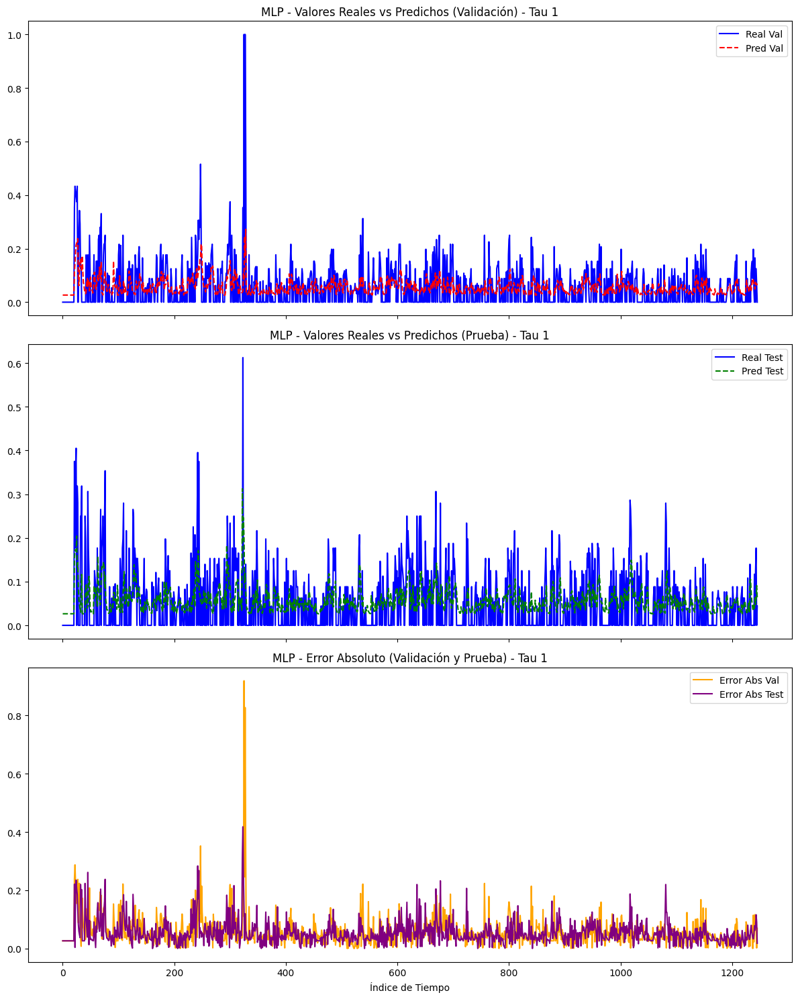

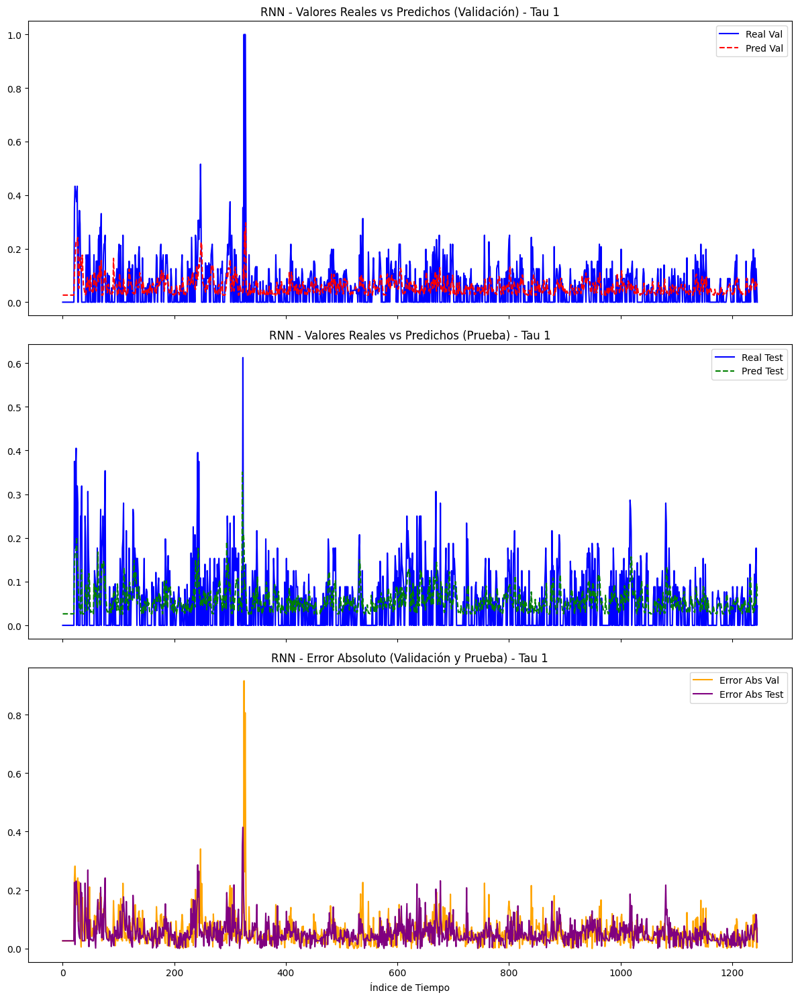

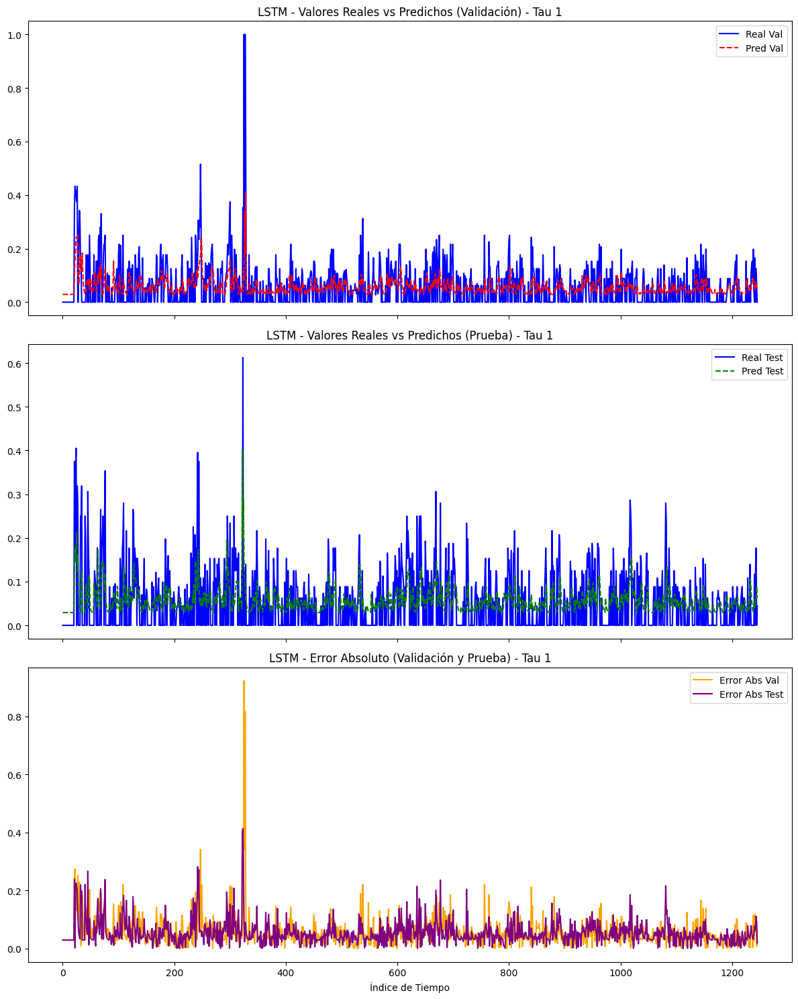

In [485]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def graficar_valores_y_errores(predictions_multivariate_volatility_scaled, trainY_matrices, valY_matrices, testY_matrices, window_size, modelo):
    """
    Genera gráficos para comparar los valores reales y predichos, junto con el error absoluto,
    para los conjuntos de validación y prueba.
    """
    for tau in range(1, 2):  # Cambia el rango de tau si tienes más ventanas
        # Obtener valores reales y predichos
        real_train = trainY_matrices[window_size][tau]
        real_val = valY_matrices[window_size][tau]
        real_test = testY_matrices[window_size][tau]
        
        pred_train = predictions_multivariate_volatility_scaled[modelo][window_size][f'Train_Pred_tau_{tau}']
        pred_val = predictions_multivariate_volatility_scaled[modelo][window_size][f'Val_Pred_tau_{tau}']
        pred_test = predictions_multivariate_volatility_scaled[modelo][window_size][f'Test_Pred_tau_{tau}']
        
        # Calcular el error absoluto
        error_abs_val = np.abs(np.array(real_val) - np.array(pred_val))
        error_abs_test = np.abs(np.array(real_test) - np.array(pred_test))
        
        # Configurar la gráfica
        fig, axes = plt.subplots(3, 1, figsize=(12, 15), sharex=True)
        
        # Gráfica 1: Valores Reales vs Predichos - Validación
        axes[0].plot(real_val, label='Real Val', color='blue')
        axes[0].plot(pred_val, label='Pred Val', color='red', linestyle='--')
        axes[0].set_title(f'{modelo} - Valores Reales vs Predichos (Validación) - Tau {tau}')
        axes[0].legend()
        
        # Gráfica 2: Valores Reales vs Predichos - Prueba
        axes[1].plot(real_test, label='Real Test', color='blue')
        axes[1].plot(pred_test, label='Pred Test', color='green', linestyle='--')
        axes[1].set_title(f'{modelo} - Valores Reales vs Predichos (Prueba) - Tau {tau}')
        axes[1].legend()

        # Gráfica 3: Error Absoluto para Validación y Prueba
        axes[2].plot(error_abs_val, label='Error Abs Val', color='orange')
        axes[2].plot(error_abs_test, label='Error Abs Test', color='purple')
        axes[2].set_title(f'{modelo} - Error Absoluto (Validación y Prueba) - Tau {tau}')
        axes[2].legend()
        
        plt.xlabel("Índice de Tiempo")
        plt.tight_layout()
        plt.show()

# Ejemplo de uso
# Para visualizar las gráficas para cada modelo y ventana
for modelo in ['MLP', 'RNN', 'LSTM']:
    graficar_valores_y_errores(predictions_multivariate_volatility_scaled, trainY_matrices, valY_matrices, testY_matrices, window_size=7, modelo=modelo)


Se realiza comparación de los errores absolutos en los conjuntos de validación y prueba evidenciando un comportamiento significativamente parecido en los respectivos pliegos. En cada uno de los modelos probados. 

#### item 4

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\259735883.py:28: RuntimeWarning:

divide by zero encountered in divide

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\259735883.py:47: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



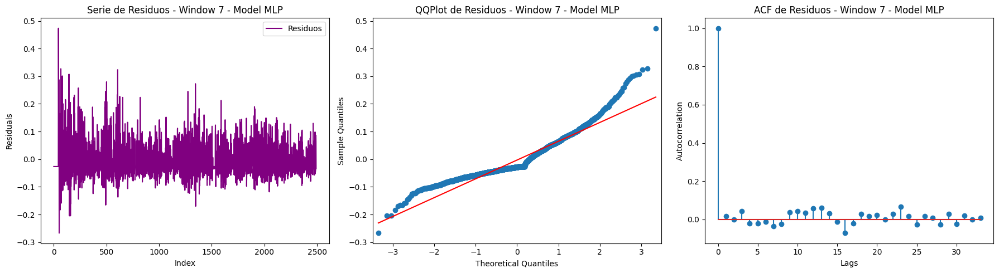

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\259735883.py:28: RuntimeWarning:

divide by zero encountered in divide



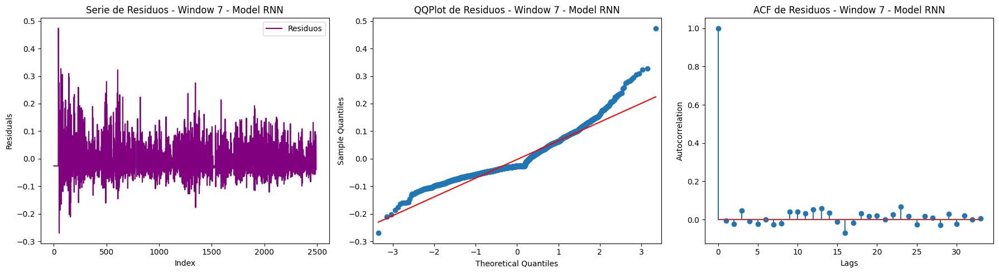

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\259735883.py:28: RuntimeWarning:

divide by zero encountered in divide



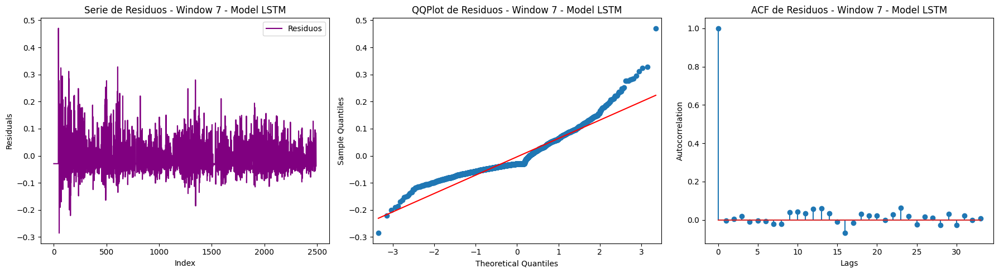

,Model,MAPE,MAE,RMSE,MSE,R2,LJung-Box (p-value),Jarque-Bera (p-value)
0,MLP,inf,0.054368,0.067976,0.004621,0.136803,0.023299,1.947832e-309
1,RNN,inf,0.054181,0.067948,0.004617,0.137522,0.037465,6.715824e-295
2,LSTM,inf,0.054524,0.067832,0.004601,0.140466,0.287858,8.053323e-301


In [486]:
results_table = pd.DataFrame(columns=[ # Crear tabla para almacenar métricas y resultados de pruebas, incluyendo columna de modelo
    'Model', 'MAPE', 'MAE', 'RMSE', 'MSE', 'R2', 'LJung-Box (p-value)', 'Jarque-Bera (p-value)'
])

iii = 2
window_sizes = [7]
# Iterar a través de cada modelo, ventana y rango de tau
for model_name in ['MLP', 'RNN', 'LSTM']:
    for window in window_sizes:
        # Acumular valores reales y predichos de tau 1 a n en una sola lista
        combined_real_values = []
        combined_pred_values = []

        for tau in range(1, iii):  # Ajusta el rango de tau según tus necesidades
            # Acumular valores reales y predichos
            combined_real_values.extend(trainY_matrices[window][tau])
            combined_pred_values.extend(predictions_multivariate_volatility_scaled[model_name][window][f'Train_Pred_tau_{tau}'])

        # Convertir las listas acumuladas en arreglos numpy
        combined_real_values = np.array(combined_real_values)
        combined_pred_values = np.array(combined_pred_values)
        residuals = combined_real_values - combined_pred_values

        # Calcular métricas
        mae = mean_absolute_error(combined_real_values, combined_pred_values)
        mse = mean_squared_error(combined_real_values, combined_pred_values)
        rmse = np.sqrt(mse)
        mape = np.mean(np.abs(residuals / combined_real_values)) * 100
        r2 = r2_score(combined_real_values, combined_pred_values)

        # Pruebas de independencia (Ljung-Box) y normalidad (Jarque-Bera)
        lb_test = q_stat(acf(residuals, fft=True, nlags=10)[1:], len(residuals))[1][-1]
        jb_test = jarque_bera(residuals)[1]

        # Agregar los resultados a la tabla, incluyendo el nombre del modelo
        row = pd.DataFrame({
            'Model': [model_name],
            'MAPE': [mape],
            'MAE': [mae],
            'RMSE': [rmse],
            'MSE': [mse],
            'R2': [r2],
            'LJung-Box (p-value)': [lb_test],
            'Jarque-Bera (p-value)': [jb_test]
        })

        results_table = pd.concat([results_table, row], ignore_index=True)

        # Crear subplots para los gráficos en una misma figura
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        
        # Gráfico de la serie de residuos
        axes[0].plot(residuals, label='Residuos', color='purple')
        axes[0].set_title(f'Serie de Residuos - Window {window} - Model {model_name}')
        axes[0].set_xlabel('Index')
        axes[0].set_ylabel('Residuals')
        axes[0].legend()

        # QQ Plot de los residuos
        qqplot(residuals, line='s', ax=axes[1])
        axes[1].set_title(f'QQPlot de Residuos - Window {window} - Model {model_name}')

        # ACF de los residuos
        acf_values = acf(residuals, fft=True)
        axes[2].stem(acf_values)
        axes[2].set_title(f'ACF de Residuos - Window {window} - Model {model_name}')
        axes[2].set_xlabel('Lags')
        axes[2].set_ylabel('Autocorrelation')

        plt.tight_layout()
        plt.show()

# Mostrar la tabla completa con los resultados para cada modelo
display(results_table)


Se crea una tabla donde se resume para el residual en el conjunto de entrenamiento, los  scores obtenidos y agregue además las respectivas pruebas de hipóteis para independencia y normalidad. con una tabla de Pandas se construyen las columnas: MAPE, MAE, RMSE, MSE, R2, LJung-Box test (p-value), Jarque-Bera (p-value) y se agregan las figuras para Serie de residuos, QQPlot, ACF de residuos: 

Evidendiando lo siguiente: 

Todos los modelos en el conjunto de entrenamiento en este caso validado para una ventana de tamaño `www=7`, tienen un R2 muy cercano a 1, lo cual indica un posible sobre ajuste del modelo, que podría regularse si se usan dropout mayores en el proceso de entrenamiento. Las pruebas de independencia y normalidad de los residuos con un P_value=0.05, demuestran que los residuos no siguen una distribución normal y que existe una autocorrelación significativa entre los residuos de un periodo y otro. 

Esto ultimo también se evidencia en las gráficas de residuos QQ plot, que muestra que los datos no estár organizados con tendencia central, como se esperaría de la una distribución normal. y el ACF, muestra que hay Lags, de hasta 35 periodos en los que puede haber una correlación significativa. Adicionalmente, se podría sospechar que cada 7, 14,21,28 y 35, periodos de tiempo hay una estacionalidad marcada, esto podría deberse a la forma en la que está plegada la serie. 

Nota: el MAPE se descarta como métrica fiable de entrenamiento para series temporales que contienen valores reales de cero, dado que su forma de calaculo utiliza como denominador los valores reales. 

#### Item 5

In [487]:
def calculate_scores(test_values, predictions):
    # Calcular métricas de error
    mae = mean_absolute_error(test_values, predictions)
    mse = mean_squared_error(test_values, predictions)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((test_values - predictions) / test_values)) * 100
    r2 = r2_score(test_values, predictions)
    
    # Prueba de Ljung-Box para independencia
    residuals = test_values - predictions
    lb_test = q_stat(acf(residuals, fft=True, nlags=40), len(residuals))[1][-1]  # Valor p

    return {
        "MAPE": mape,
        "MAE": mae,
        "RMSE": rmse,
        "MSE": mse,
        "R2": r2,
        "LJung-Box (p-value)": lb_test
    }

# Crear una lista para almacenar los resultados de cada modelo
results = []

# Modelos a evaluar
modelos = ['MLP', 'RNN', 'LSTM']
www = 7  # Tamaño de ventana usado en los datos
iii=2 #Tau periodo a revisar

# Concatenar los valores reales del conjunto de test en una sola serie
test_values = np.concatenate([testY_matrices[www][tau] for tau in range(1, iii)])

# Calcular y almacenar resultados para cada modelo
for model_name in modelos:
    # Concatenar las predicciones del conjunto de test en una sola serie
    predictions = np.concatenate([predictions_multivariate_volatility_scaled[model_name][www][f'Test_Pred_tau_{tau}'] for tau in range(1, iii)])
    
    # Calcular los puntajes y la prueba de Ljung-Box
    scores = calculate_scores(test_values, predictions)
    scores["Model"] = model_name

    # Agregar los resultados a la lista
    results.append(scores)

# Convertir la lista de resultados a un DataFrame
results_df = pd.DataFrame(results)

# Mostrar la tabla de resultados
results_df


C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\2555122796.py:6: RuntimeWarning:

divide by zero encountered in divide

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\2555122796.py:6: RuntimeWarning:

divide by zero encountered in divide

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\2555122796.py:6: RuntimeWarning:

divide by zero encountered in divide



,MAPE,MAE,RMSE,MSE,R2,LJung-Box (p-value),Model
0,inf,0.053799,0.067538,0.004561,0.120616,1.301341e-248,MLP
1,inf,0.053604,0.067615,0.004572,0.118609,3.927012e-249,RNN
2,inf,0.053887,0.067992,0.004623,0.108743,1.135766e-248,LSTM


Nota: el MAPE se descarta como métrica fiable de entrenamiento para series temporales que contienen valores reales de cero, dado que su forma de calaculo utiliza como denominador los valores reales. Por eso encontramos valores infinitos. 

Se crea una tabla donde se resume para el residual en el conjunto de entrenamiento, los  scores obtenidos y agregue además las respectivas pruebas de hipóteis para independencia y normalidad. con una tabla de Pandas se construyen las columnas: MAPE, MAE, RMSE, MSE, R2, LJung-Box test (p-value). 

Evidendiando lo siguiente: 

Todos los modelos en el conjunto de test en este caso validado para una ventana de tamaño `www=7`, tienen un R2 muy cercano a 1, lo cual nos indica una excelente capacidad de predecir patrones, que tiene las redes neuronales y la ventaja de utilizar pliegos que sigan de cerca el comportamiento de la serie. El modelo con mejor ajuste en esta etapa fue el RNN, con un MSE ligeramente por debajo de los demás modelos. 



#### Item 8 

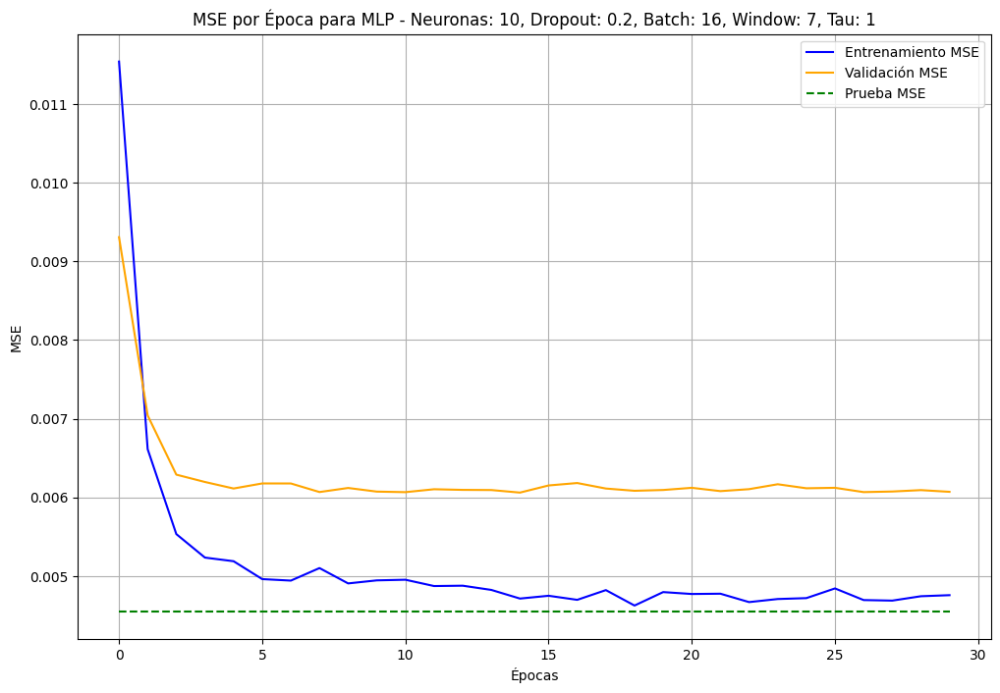

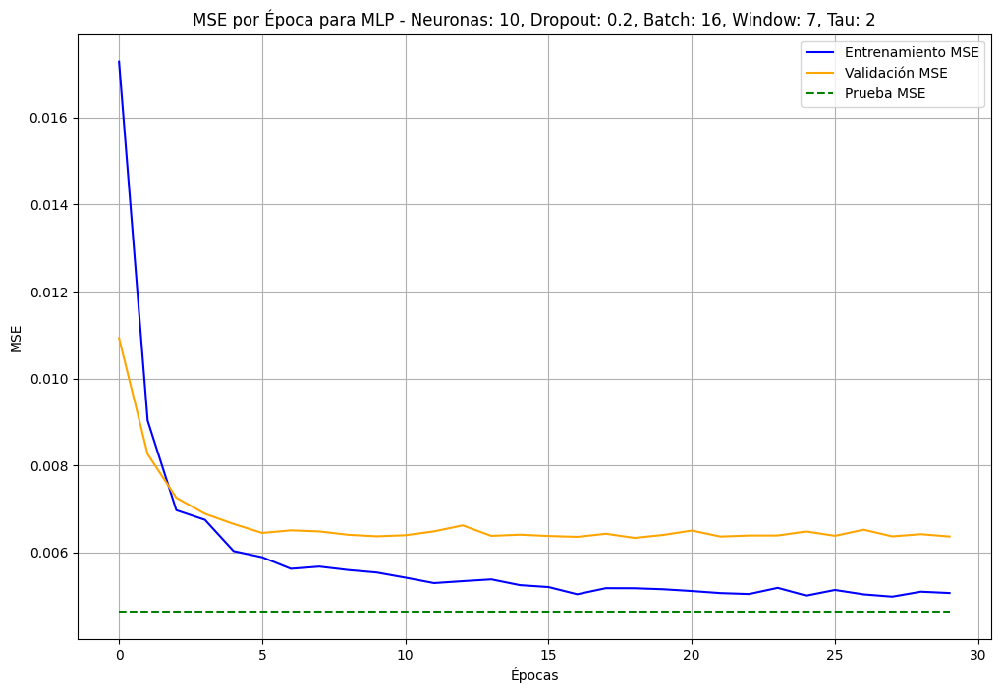

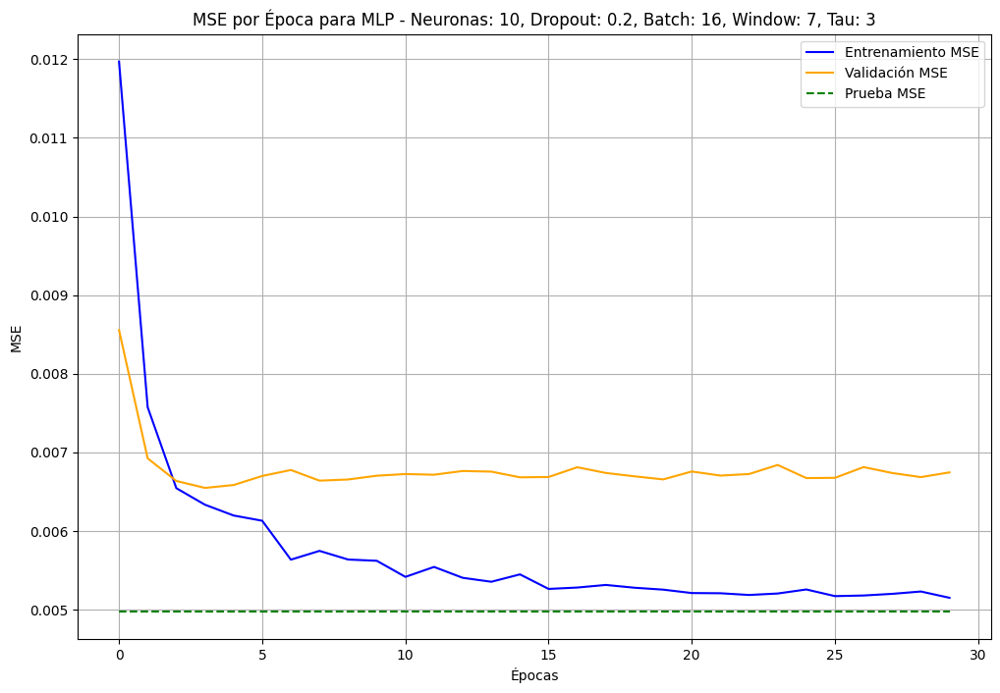

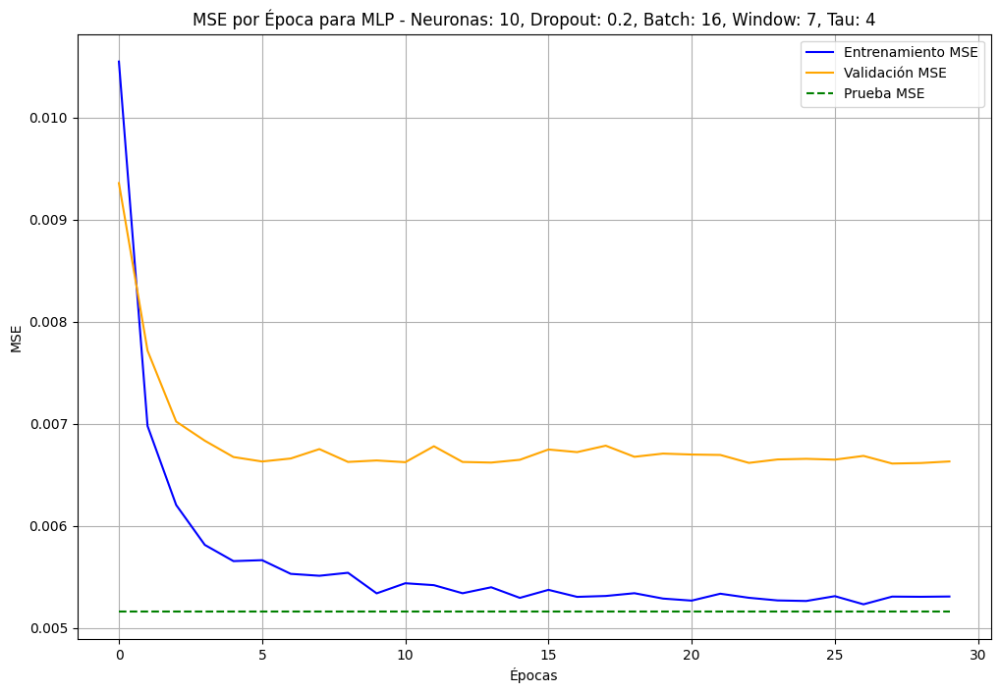

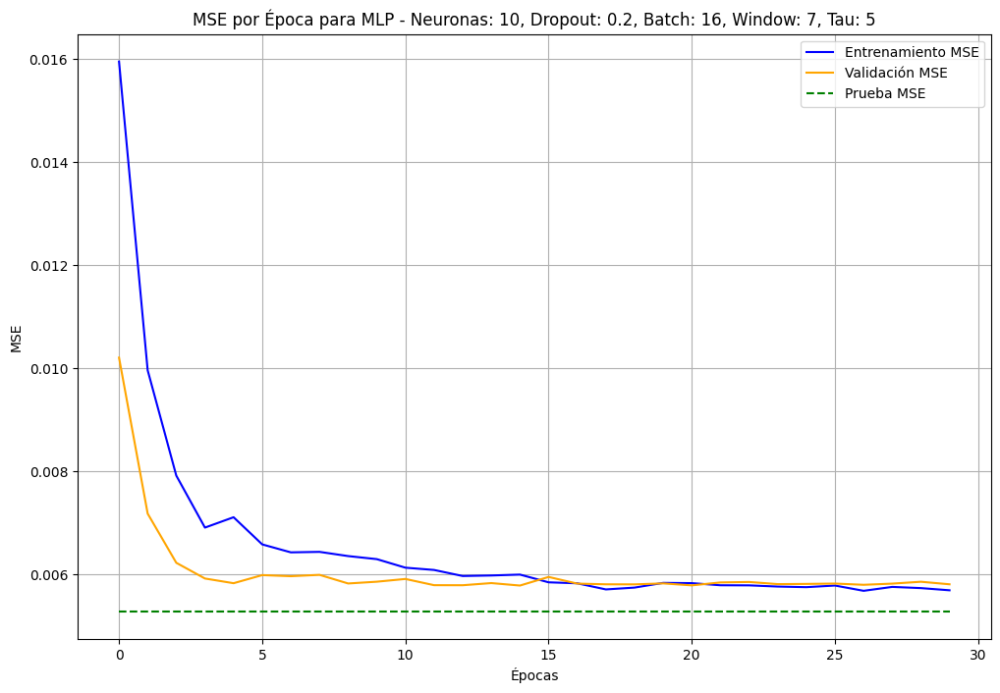

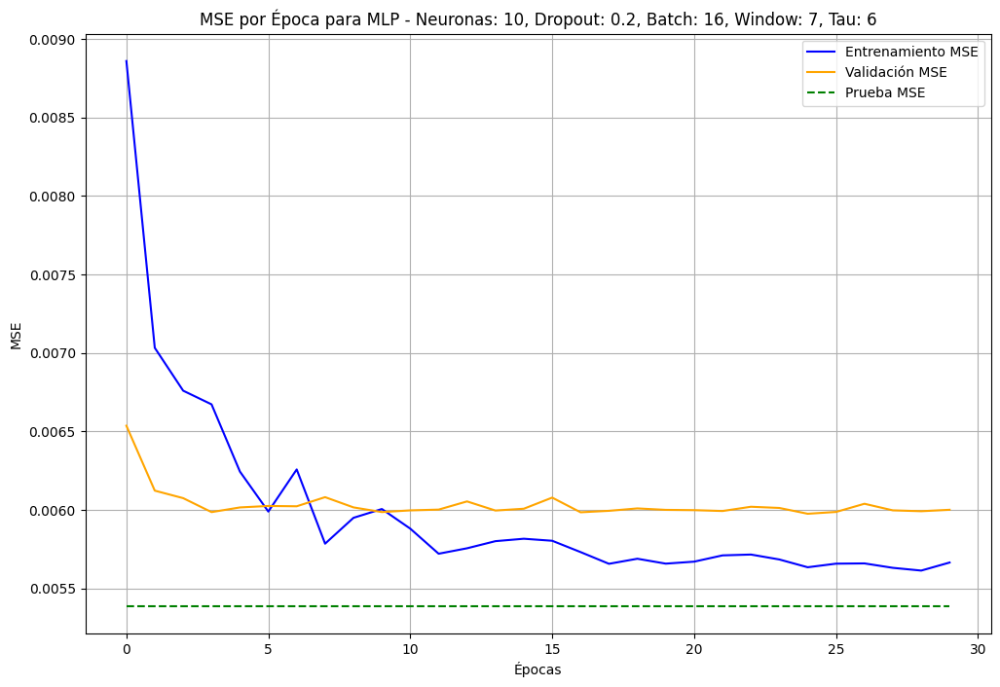

No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_1\MLP_10neurons_0.2dropout_batch16_window14_tau1_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_2\MLP_10neurons_0.2dropout_batch16_window14_tau2_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_3\MLP_10neurons_0.2dropout_batch16_window14_tau3_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_4\MLP_10neurons_0.2dropout_batch16_window14_tau4_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_5\MLP_10neurons_0.2dropout_batch16_window14_tau5_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_6\MLP_10neurons_0.2dropout_batch16_window14_tau6_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_7_tau_1\MLP_10neurons_0.2dropout_batch32_window7_tau1_history.j

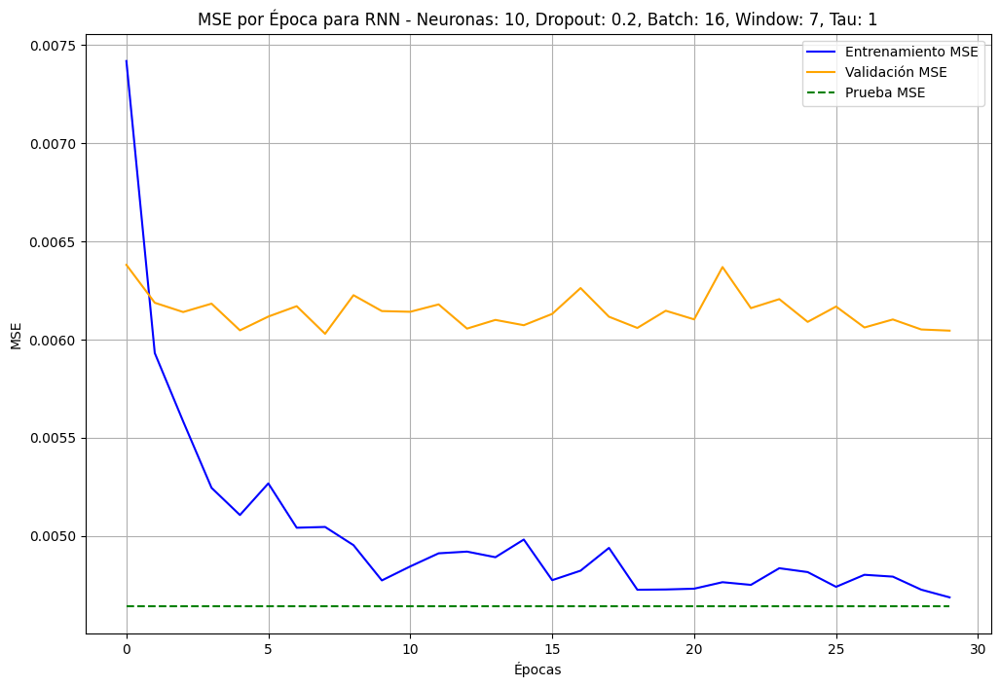

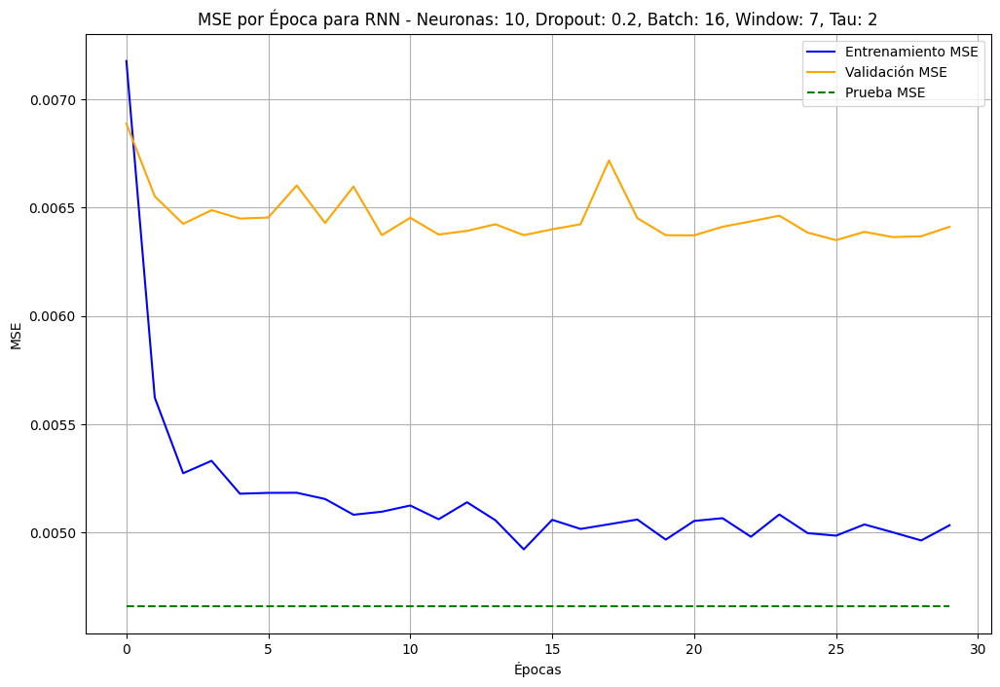

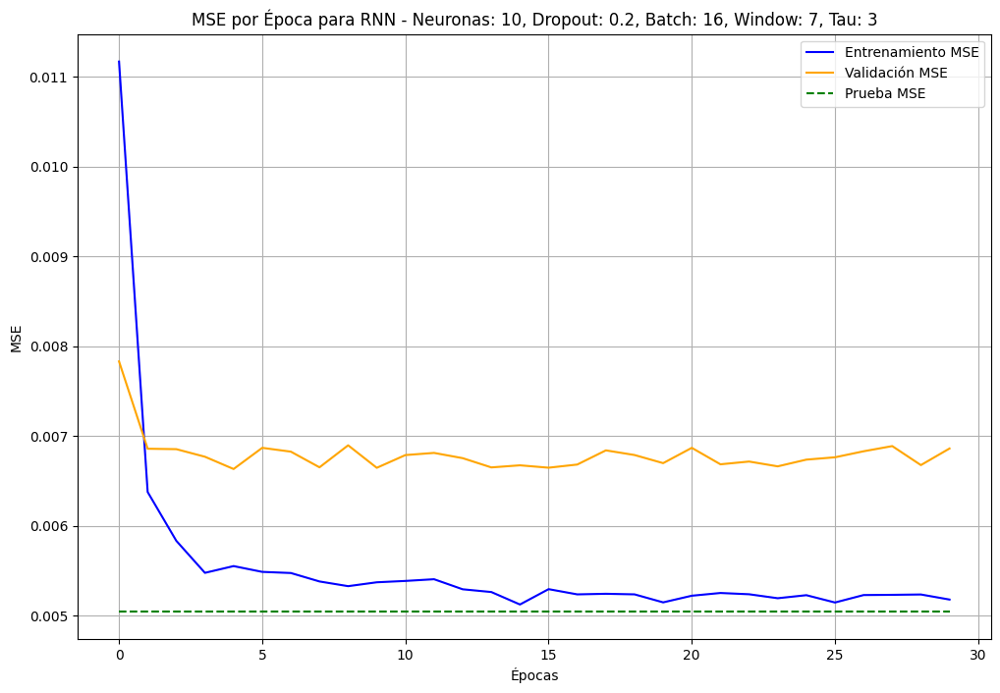

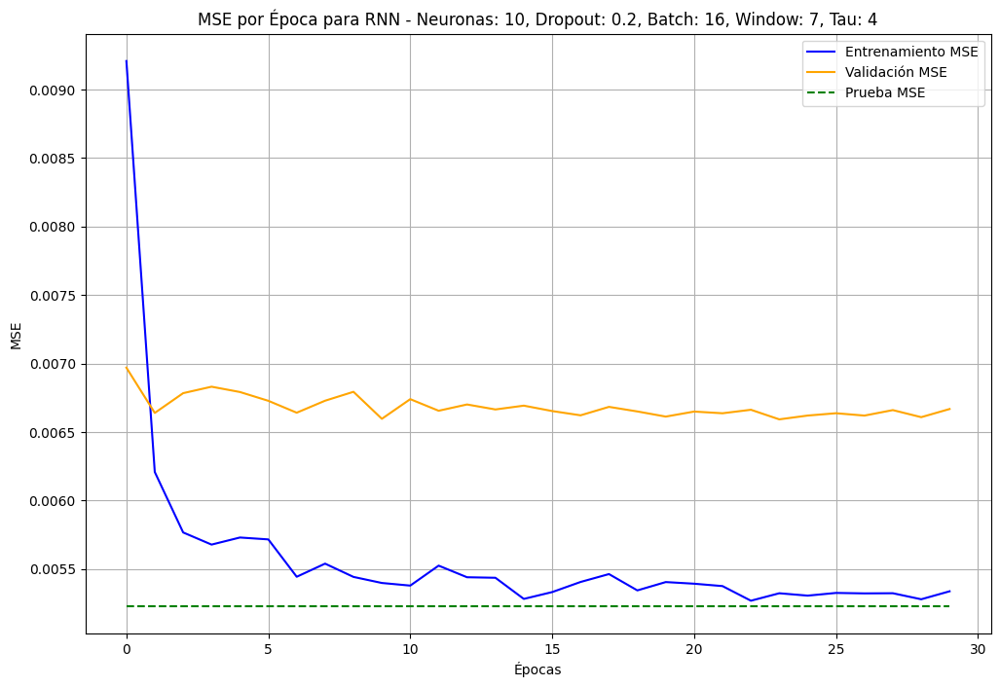

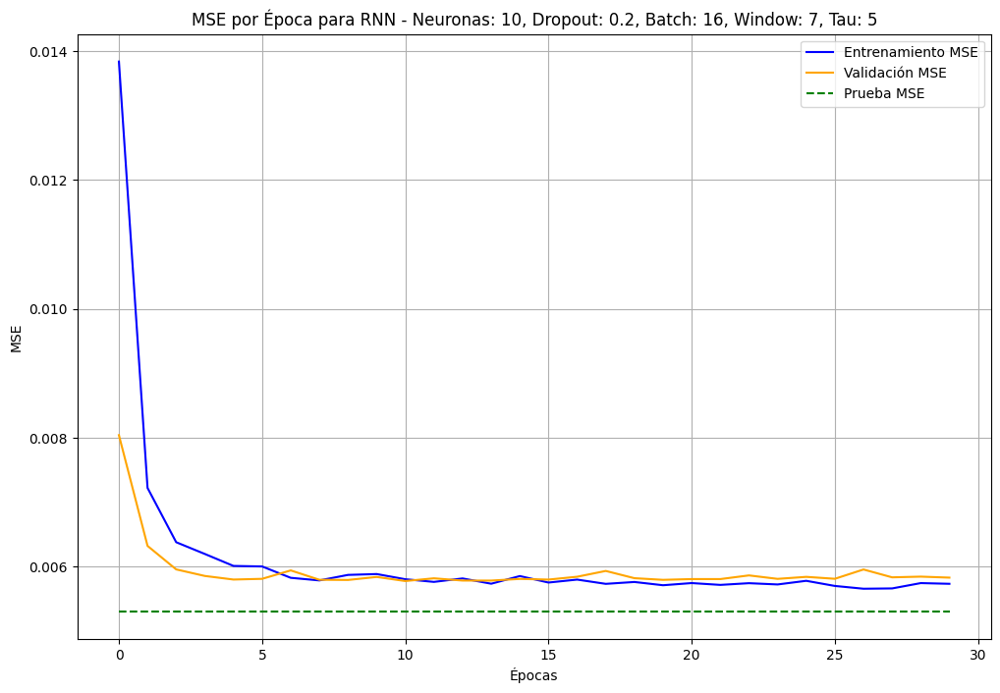

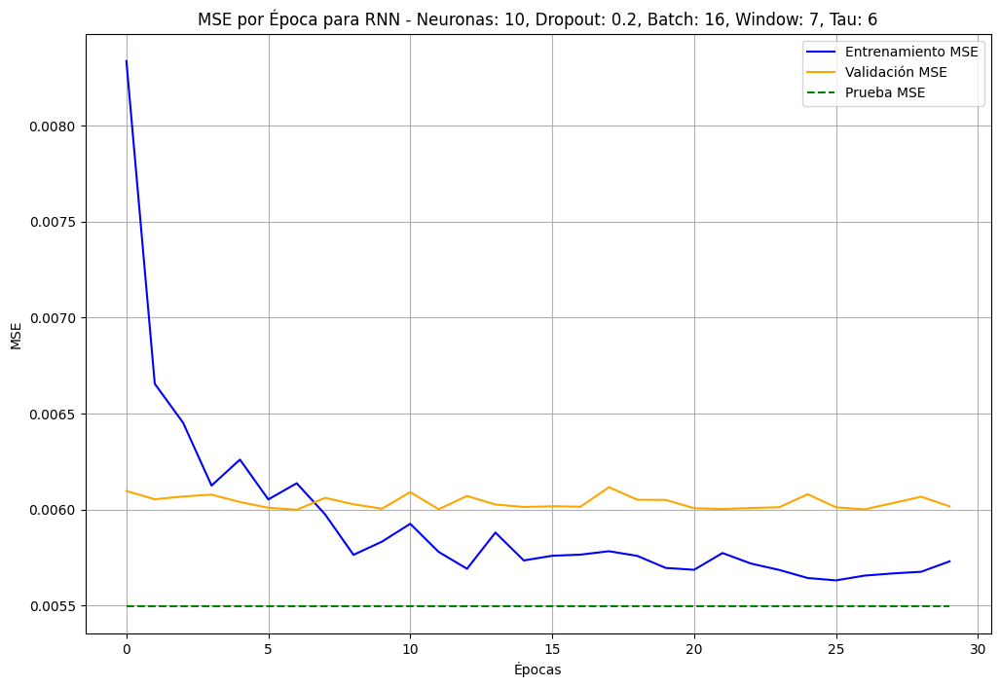

No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_1\RNN_10neurons_0.2dropout_batch16_window14_tau1_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_2\RNN_10neurons_0.2dropout_batch16_window14_tau2_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_3\RNN_10neurons_0.2dropout_batch16_window14_tau3_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_4\RNN_10neurons_0.2dropout_batch16_window14_tau4_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_5\RNN_10neurons_0.2dropout_batch16_window14_tau5_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_6\RNN_10neurons_0.2dropout_batch16_window14_tau6_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_7_tau_1\RNN_10neurons_0.2dropout_batch32_window7_tau1_history.j

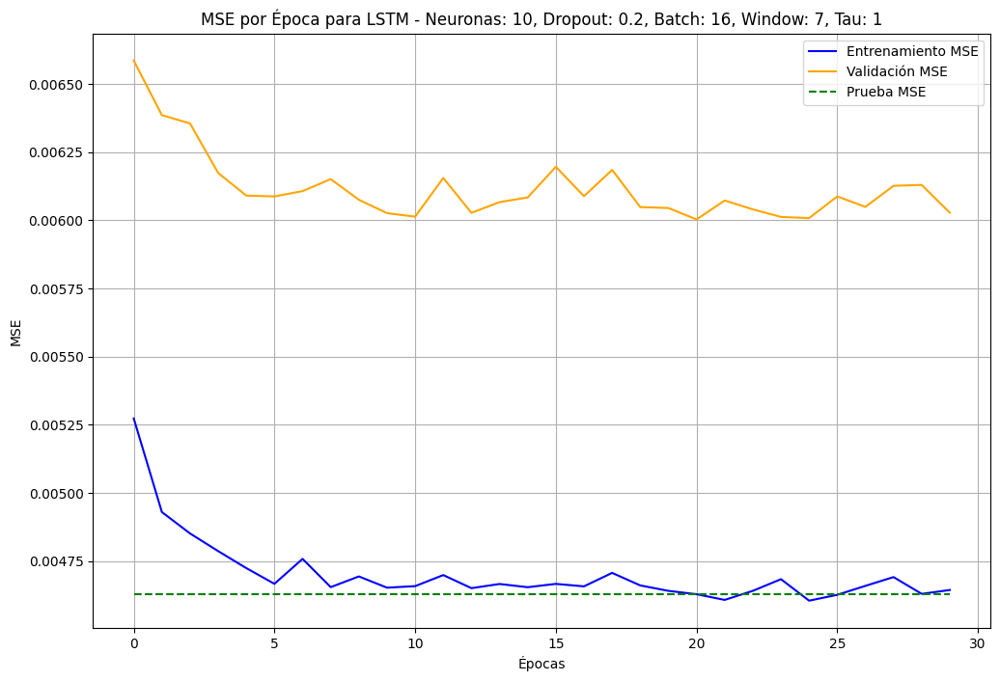

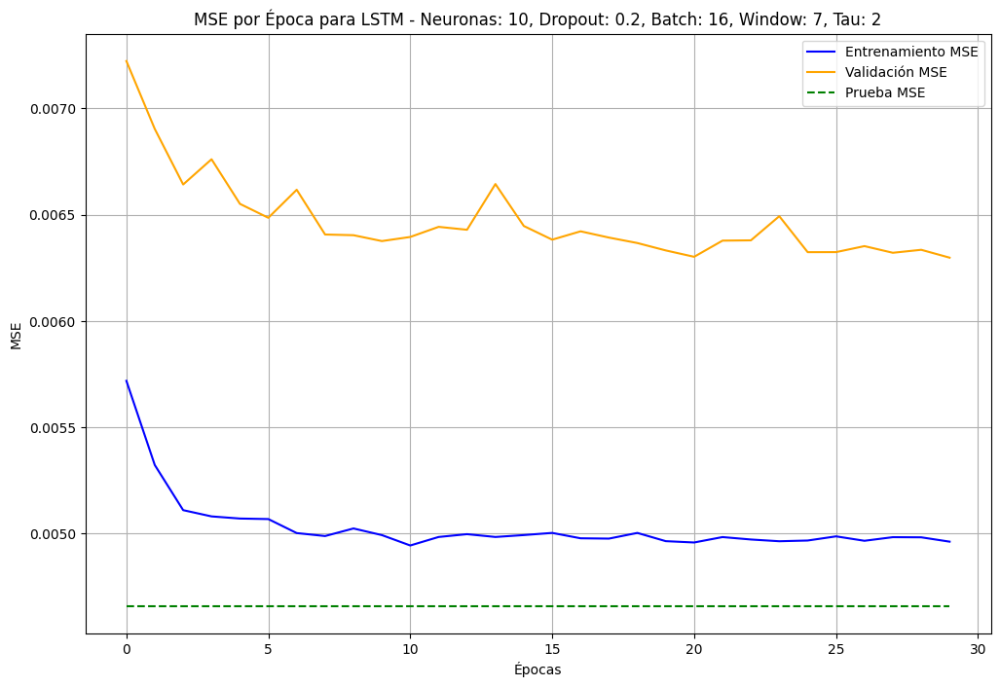

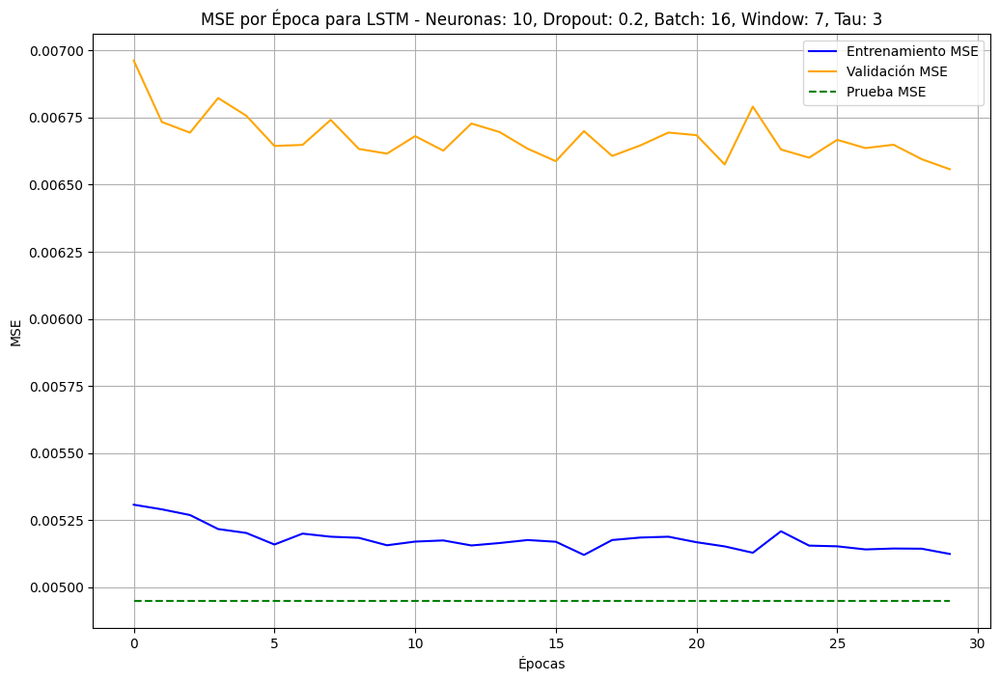

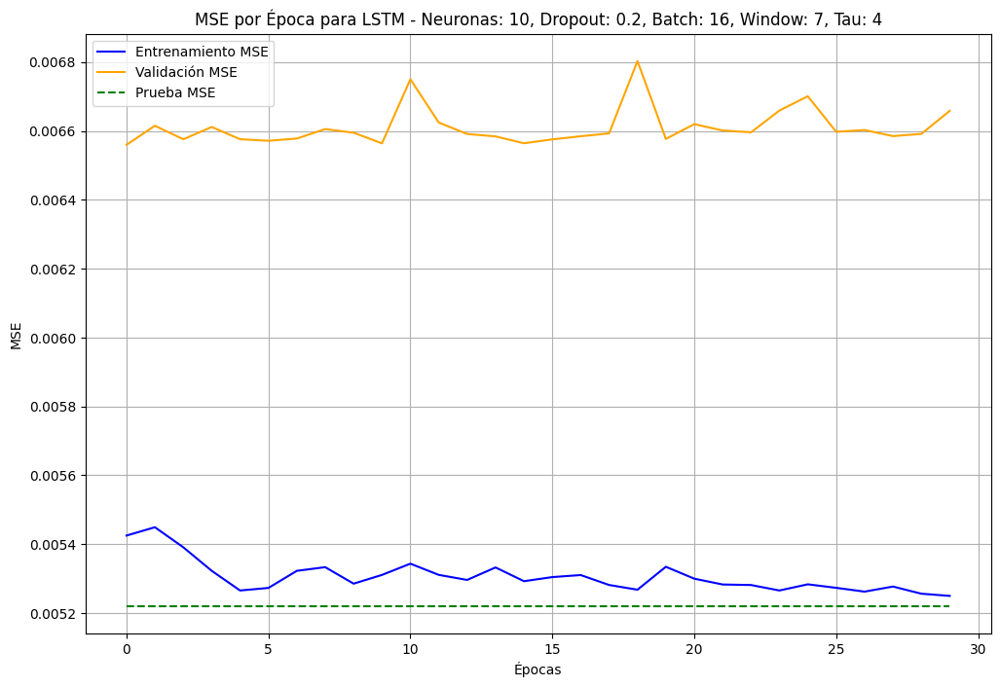

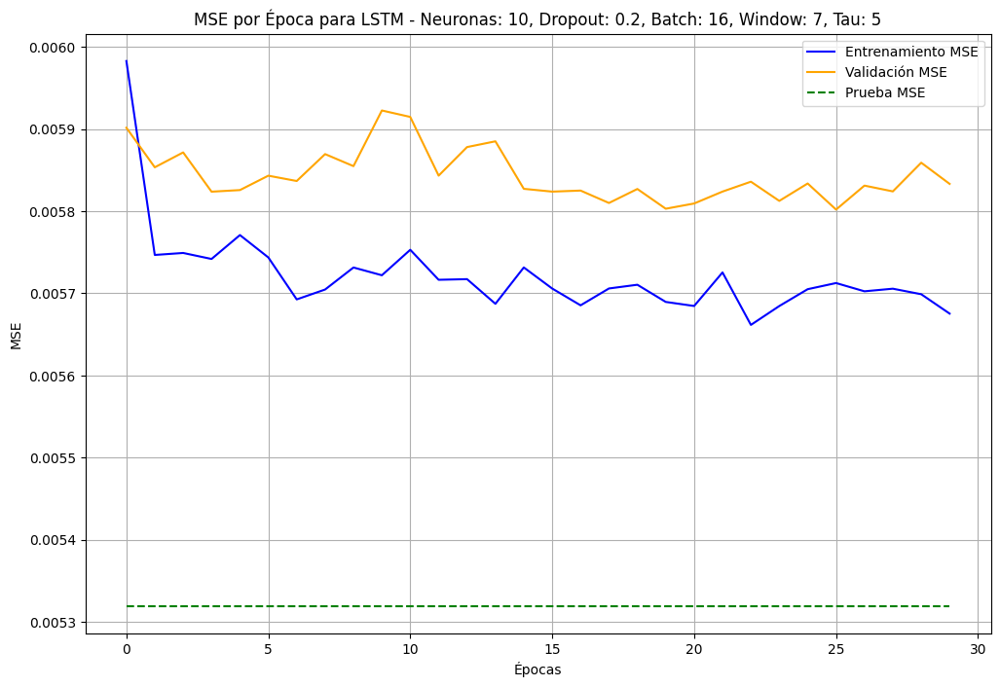

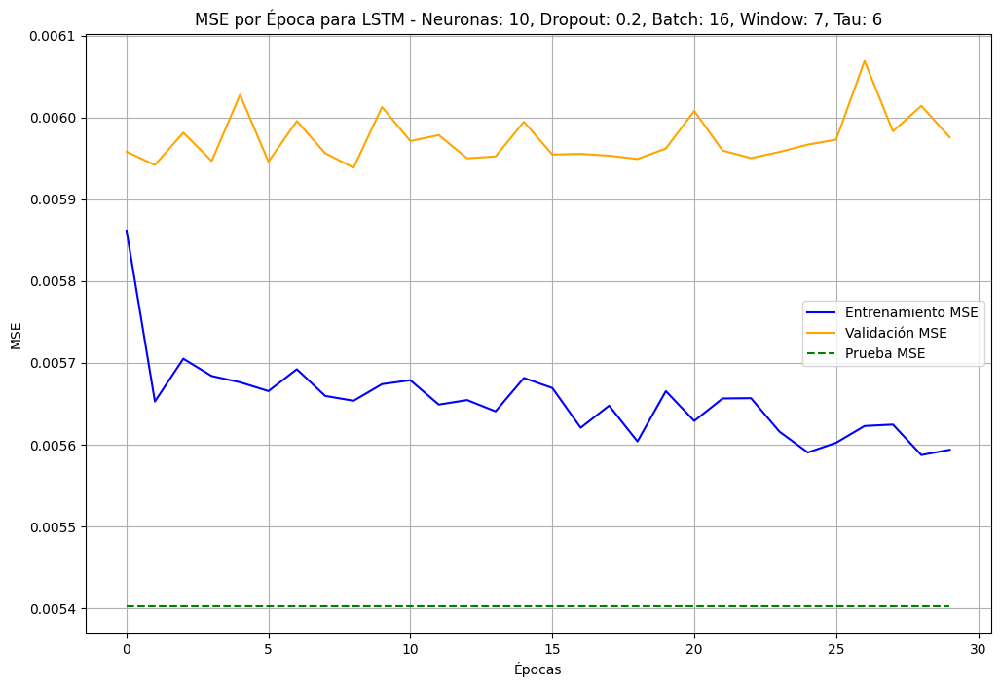

No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_1\LSTM_10neurons_0.2dropout_batch16_window14_tau1_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_2\LSTM_10neurons_0.2dropout_batch16_window14_tau2_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_3\LSTM_10neurons_0.2dropout_batch16_window14_tau3_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_4\LSTM_10neurons_0.2dropout_batch16_window14_tau4_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_5\LSTM_10neurons_0.2dropout_batch16_window14_tau5_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_14_tau_6\LSTM_10neurons_0.2dropout_batch16_window14_tau6_history.joblib
No se encontró el archivo de historial: modelos_volatility/models_window_7_tau_1\LSTM_10neurons_0.2dropout_batch32_window7_tau1_hi

In [488]:
import matplotlib.pyplot as plt
from joblib import load
from itertools import product
import os

# Parámetros de especificaciones para generar combinaciones
model_names = ['MLP', 'RNN', 'LSTM']
neurons = [10, 100]
dropouts = [0.2, 0.4]
batch_sizes = [16, 32]
window_sizes = [7, 14]  # Asegúrate de incluir todos los tamaños de ventana que usaste
taus = range(1, 7)  # Rango de valores de tau

# Generar combinaciones de especificaciones
model_specs = [
    {'model_name': name, 'neurons': n, 'dropout': d, 'batch_size': b, 'window_size': w, 'tau': t}
    for name, n, d, b, w, t in product(model_names, neurons, dropouts, batch_sizes, window_sizes, taus)
]

# Función para cargar el historial
def load_history(filename):
    try:
        return load(filename)
    except FileNotFoundError:
        print(f"No se encontró el archivo de historial: {filename}")
        return None

# Función para graficar el historial con foco en el MSE
def plot_mse_history(history_data, spec):
    plt.figure(figsize=(12, 8))

    # Graficar MSE para entrenamiento, validación y prueba si están en el historial
    if 'mean_squared_error' in history_data:
        plt.plot(history_data['mean_squared_error'], label="Entrenamiento MSE", color='blue')
    if 'val_mean_squared_error' in history_data:
        plt.plot(history_data['val_mean_squared_error'], label="Validación MSE", color='orange')
    if 'test_mean_squared_error' in history_data:
        # `test_mean_squared_error` es un valor constante, así que se repetirá para cada época
        plt.plot([history_data['test_mean_squared_error'][0]] * len(history_data['mean_squared_error']), 
                 label="Prueba MSE", color='green', linestyle='--')

    # Configuración de título y etiquetas
    plt.title(f"MSE por Época para {spec['model_name']} - Neuronas: {spec['neurons']}, Dropout: {spec['dropout']}, Batch: {spec['batch_size']}, Window: {spec['window_size']}, Tau: {spec['tau']}")
    plt.xlabel("Épocas")
    plt.ylabel("MSE")
    plt.legend()
    plt.grid(True)
    plt.show()

# Cargar y graficar el historial para cada modelo
for spec in model_specs:
    # Crear el nombre del archivo de historial con el nuevo formato de subcarpeta
    model_dir = f"modelos_volatility/models_window_{spec['window_size']}_tau_{spec['tau']}"
    base_filename = f"{spec['model_name']}_{spec['neurons']}neurons_{spec['dropout']}dropout_batch{spec['batch_size']}_window{spec['window_size']}_tau{spec['tau']}"
    history_filename = os.path.join(model_dir, f"{base_filename}_history.joblib")

    # Cargar el historial y graficar si existe
    history_data = load_history(history_filename)
    if history_data:
        plot_mse_history(history_data, spec)

En las primeras epocas de entrenamiento la variabilidad del error es alta, dado al proceso de parametrización natural de las redes neuronales sin embargo, a partir de la 5ta época se evidencia una estabilización de los errores, que parecen converger al error definitivo que tiene el modelo en el conjunto de test. Este ultimo es constante, dado a que no varía por las épocas porque los datos de test se prueban  al final del periodo de entrenamiento para calcular el rendimiento real del modelo. 

#### Item 9

C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\3863866602.py:45: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



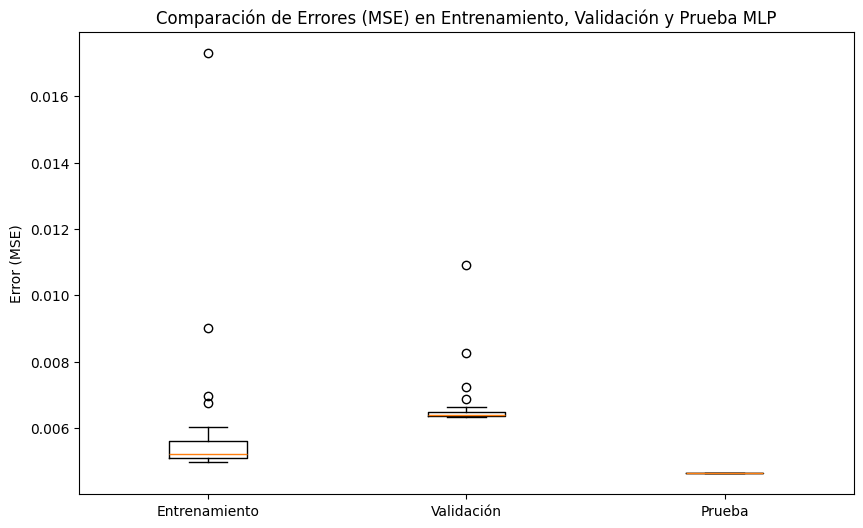

Estadístico de Kruskal-Wallis: 73.2088, Valor p: 0.0000
Las medianas de los errores son significativamente diferentes entre los conjuntos.


C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\3863866602.py:45: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



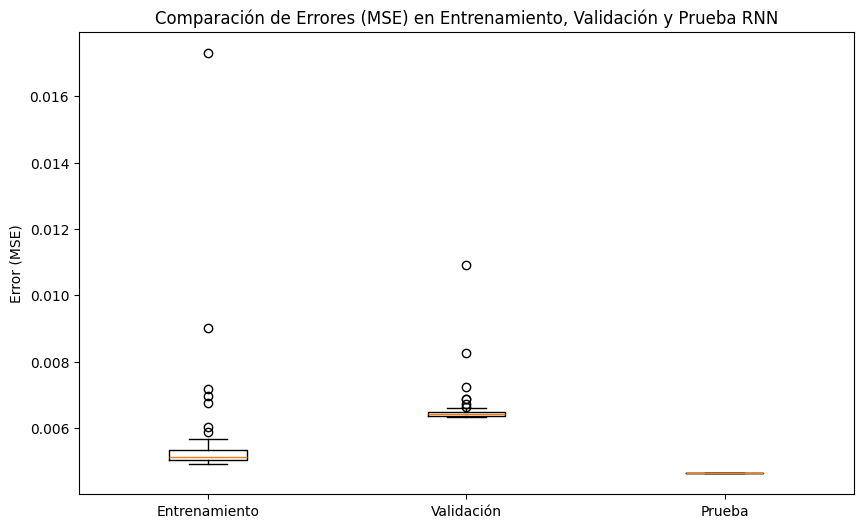

Estadístico de Kruskal-Wallis: 148.7812, Valor p: 0.0000
Las medianas de los errores son significativamente diferentes entre los conjuntos.


C:\Users\FBA\AppData\Local\Temp\ipykernel_21428\3863866602.py:45: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



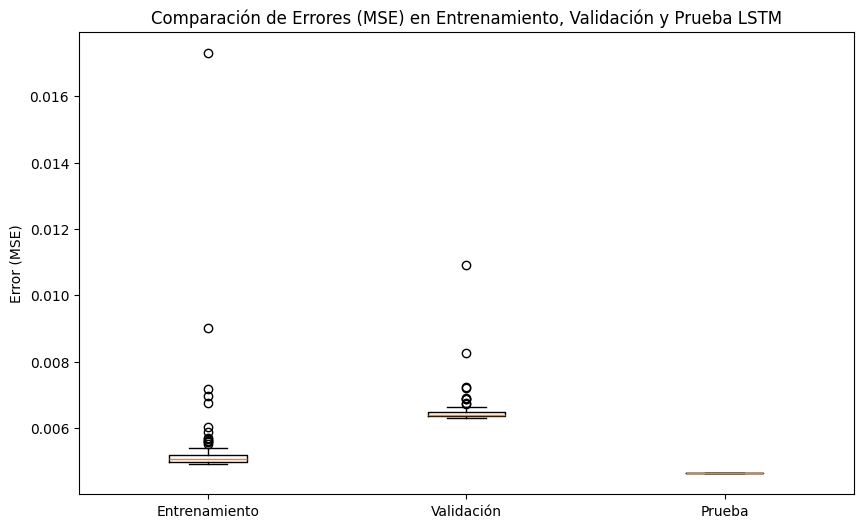

Estadístico de Kruskal-Wallis: 227.9524, Valor p: 0.0000
Las medianas de los errores son significativamente diferentes entre los conjuntos.


In [489]:
import os
import matplotlib.pyplot as plt
from joblib import load
import numpy as np
import scipy.stats as stats

# Parámetros que coinciden con el nombre de archivo creado
model_names = ['MLP', 'RNN', 'LSTM']
neurons = [10, 100]
dropouts = [0.2, 0.4]
batch_sizes = [16, 32]
window_size = 7  # Ajustar según el análisis actual
tau = 2  # Ajustar según el análisis actual

# Diccionarios para almacenar los errores de cada conjunto
train_errors = []
val_errors = []
test_errors = []

# Cargar errores desde los archivos de historial
for model_name in model_names:
    for n in neurons:
        for d in dropouts:
            for b in batch_sizes:
                # Generar la ruta del archivo de historial
                model_dir = f'modelos_volatility/models_window_{window_size}_tau_{tau}'
                base_filename = f"{model_name}_{n}neurons_{d}dropout_batch{b}_window{window_size}_tau{tau}_history.joblib"
                history_path = os.path.join(model_dir, base_filename)
                
                # Cargar el historial si existe
                if os.path.exists(history_path):
                    history_data = load(history_path)
                    
                    # Extraer errores (MSE) de entrenamiento, validación y prueba si están disponibles
                    if 'mean_squared_error' in history_data:
                        train_errors.extend(history_data['mean_squared_error'])
                    if 'val_mean_squared_error' in history_data:
                        val_errors.extend(history_data['val_mean_squared_error'])
                    if 'test_mean_squared_error' in history_data:
                        # Error de prueba es constante, se extiende en el tamaño de épocas para la comparación
                        test_errors.extend([history_data['test_mean_squared_error'][0]] * len(history_data['mean_squared_error']))

    # Generar los boxplots
    plt.figure(figsize=(10, 6))
    plt.boxplot([train_errors, val_errors, test_errors], labels=['Entrenamiento', 'Validación', 'Prueba'])
    plt.title(f"Comparación de Errores (MSE) en Entrenamiento, Validación y Prueba {model_name}")
    plt.ylabel("Error (MSE)")
    plt.show()

    # Realizar la prueba de Kruskal-Wallis para comparar las medianas de los errores
    stat, p_value = stats.kruskal(train_errors, val_errors, test_errors)
    print(f"Estadístico de Kruskal-Wallis: {stat:.4f}, Valor p: {p_value:.4f}")

    # Interpretación de resultados
    if p_value < 0.05:
        print("Las medianas de los errores son significativamente diferentes entre los conjuntos.")
    else:
        print("No hay diferencias significativas en las medianas de los errores entre los conjuntos.")


Tiene sentido que las medianas de los errores en entrenamiento validación y test sean siginfiicativamente diferente, dado a que en las primeras épocas de entrenamiento el modelo en entrenamiento tiene mayor variabilidad, la cual se estabiliza en el proceso de validación dando como resultado un error esperado definitivo en el conjunto de prueba. 

#### Item 10. Desplegar serie original.

In [497]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def desplegar_predicciones_y_datos_originales(predictions_multivariate_volatility_scaled, 
                                              original_series, 
                                              window_size_train, window_size_val, window_size_test, 
                                              num_ventanas, original_length, 
                                              modelo='MLP', zoom_range=None,
                                              trainY_matrices=None, valY_matrices=None, testY_matrices=None):

    # Inicializar la serie reconstruida con valores NaN
    reconstructed_predictions = np.full(original_length, np.nan)

    # Desplegar las predicciones en su posición correcta
    for tau in range(1, num_ventanas + 1):
        train_pred = predictions_multivariate_volatility_scaled[modelo][window_size_train/2][f'Train_Pred_tau_{tau}']
        val_pred = predictions_multivariate_volatility_scaled[modelo][window_size_val][f'Val_Pred_tau_{tau}']
        test_pred = predictions_multivariate_volatility_scaled[modelo][window_size_test][f'Test_Pred_tau_{tau}']
        
        for i in range(len(train_pred) // window_size_train):
            train_start = i * (window_size_train + window_size_val + window_size_test)
            val_start = train_start + window_size_train
            test_start = val_start + window_size_val

            reconstructed_predictions[train_start:train_start + window_size_train] = train_pred[i * window_size_train:(i + 1) * window_size_train]
            reconstructed_predictions[val_start:val_start + window_size_val] = val_pred[i * window_size_val:(i + 1) * window_size_val]
            reconstructed_predictions[test_start:test_start + window_size_test] = test_pred[i * window_size_test:(i + 1) * window_size_test]

    reconstructed_predictions = pd.Series(reconstructed_predictions, index=original_series.index)

    # Crear las secciones de entrenamiento, validación y prueba para los datos originales
    original_train_series = np.full(original_length, np.nan)
    original_val_series = np.full(original_length, np.nan)
    original_test_series = np.full(original_length, np.nan)

    # Insertar valores de los datos originales en las posiciones correspondientes
    for tau in range(1, num_ventanas + 1):
        for i in range(len(trainY_matrices[window_size_train/2][tau]) // window_size_train):
            train_start = i * (window_size_train + window_size_val + window_size_test)
            val_start = train_start + window_size_train
            test_start = val_start + window_size_val

            original_train_series[train_start:train_start + window_size_train] = trainY_matrices[window_size_train/2][tau][i * window_size_train:(i + 1) * window_size_train]
            original_val_series[val_start:val_start + window_size_val] = valY_matrices[window_size_val][tau][i * window_size_val:(i + 1) * window_size_val]
            original_test_series[test_start:test_start + window_size_test] = testY_matrices[window_size_test][tau][i * window_size_test:(i + 1) * window_size_test]

    # Convertir a Series de Pandas para facilitar la visualización
    original_train_series = pd.Series(original_train_series, index=original_series.index)
    original_val_series = pd.Series(original_val_series, index=original_series.index)
    original_test_series = pd.Series(original_test_series, index=original_series.index)

    # Gráfico completo con predicciones y datos originales
    plt.figure(figsize=(14, 8))
    plt.plot(original_series, label='Serie Original', color='black')
    plt.plot(reconstructed_predictions, label=f'Predicciones Restauradas - Modelo {modelo}', linestyle='--', color='blue')
    plt.plot(original_train_series, label='Datos Originales - Entrenamiento', color='cyan')
    plt.plot(original_val_series, label='Datos Originales - Validación', color='orange')
    plt.plot(original_test_series, label='Datos Originales - Prueba', color='green')
    
    plt.title(f"Serie Completa - Modelo {modelo} con Datos Originales")
    plt.xlabel("Índice de Tiempo")
    plt.ylabel("Valor de Predicción")
    plt.legend()
    plt.show()

    # Gráfico de zoom en el rango especificado
    if zoom_range is not None:
        zoom_start, zoom_end = zoom_range
        plt.figure(figsize=(14, 8))
        plt.plot(original_series[zoom_start:zoom_end], label='Serie Original (Zoom)', linestyle='--', color='grey')
        plt.plot(reconstructed_predictions[zoom_start:zoom_end], label=f'Predicciones Restauradas - Modelo {modelo} (Zoom)', linestyle='--', color='blue')
        plt.plot(original_train_series[zoom_start:zoom_end], label='Datos Originales - Entrenamiento (Zoom)', color='cyan')
        plt.plot(original_val_series[zoom_start:zoom_end], label='Datos Originales - Validación (Zoom)', color='orange')
        plt.plot(original_test_series[zoom_start:zoom_end], label='Datos Originales - Prueba (Zoom)', color='green')

        plt.title(f"Zoom en el Rango [{zoom_start}:{zoom_end}] - Modelo {modelo} con Datos Originales")
        plt.xlabel("Índice de Tiempo")
        plt.ylabel("Valor de Predicción")
        plt.legend()
        plt.show()

    return reconstructed_predictions




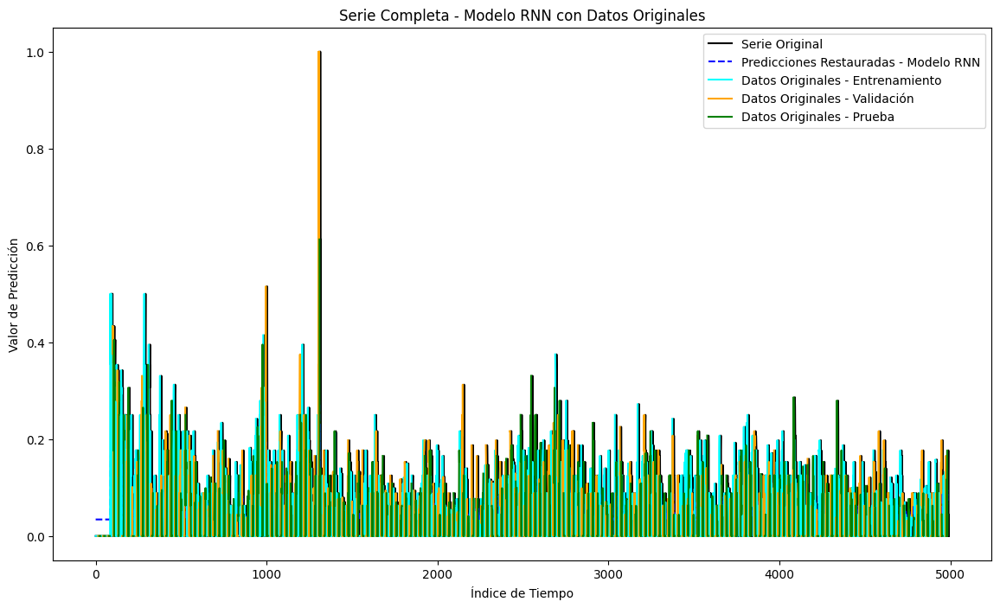

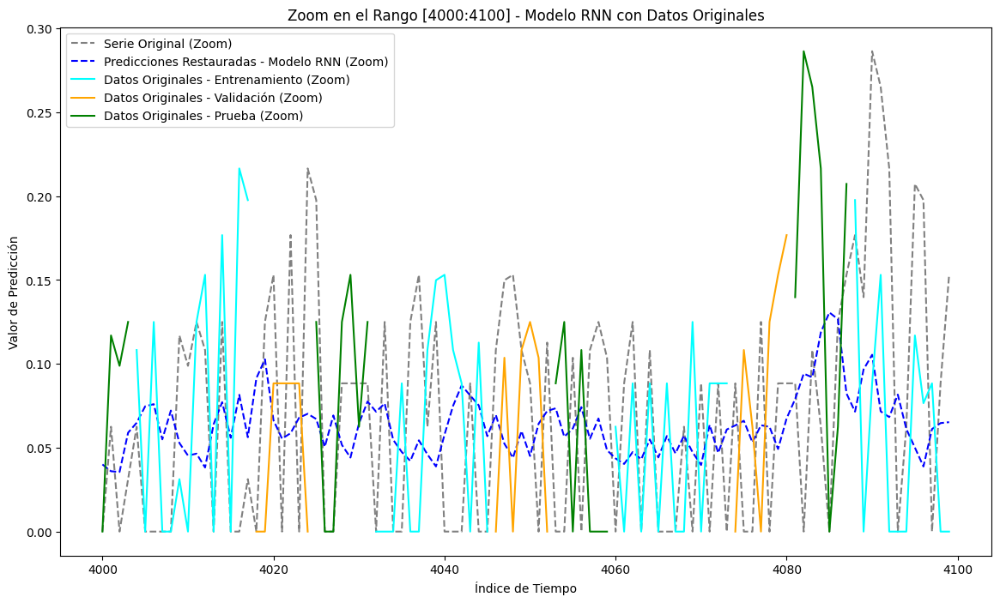

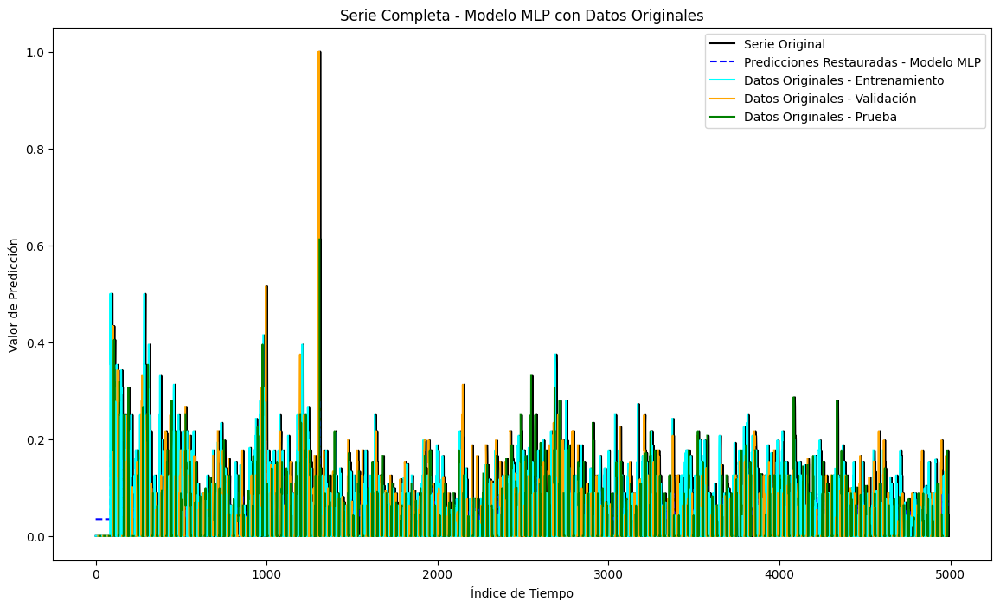

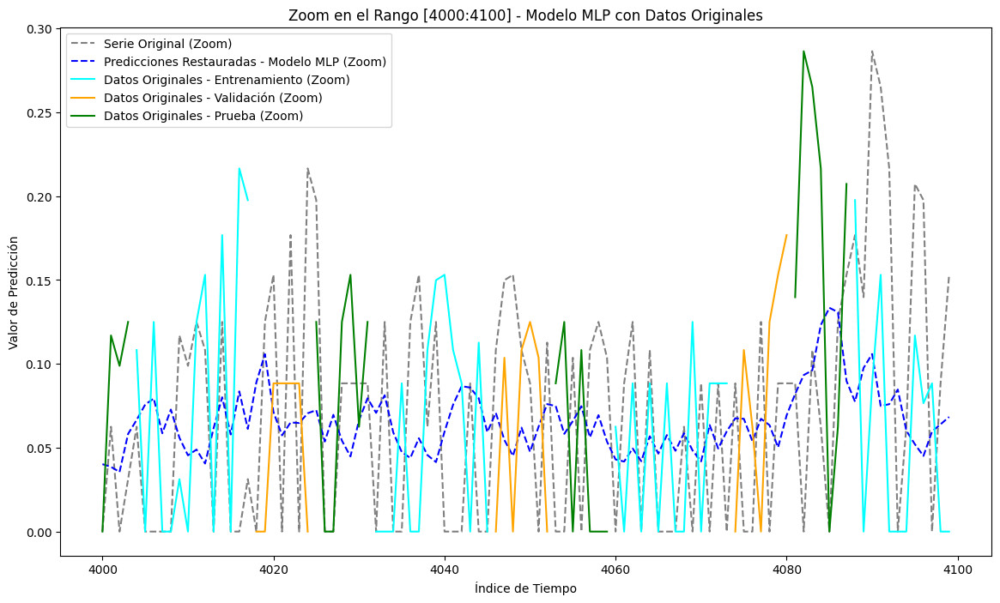

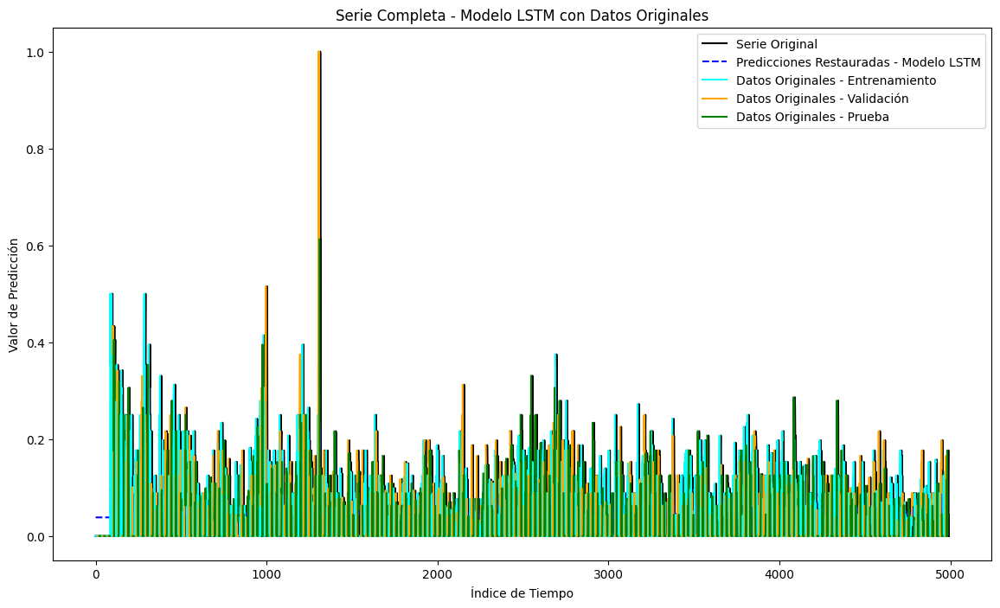

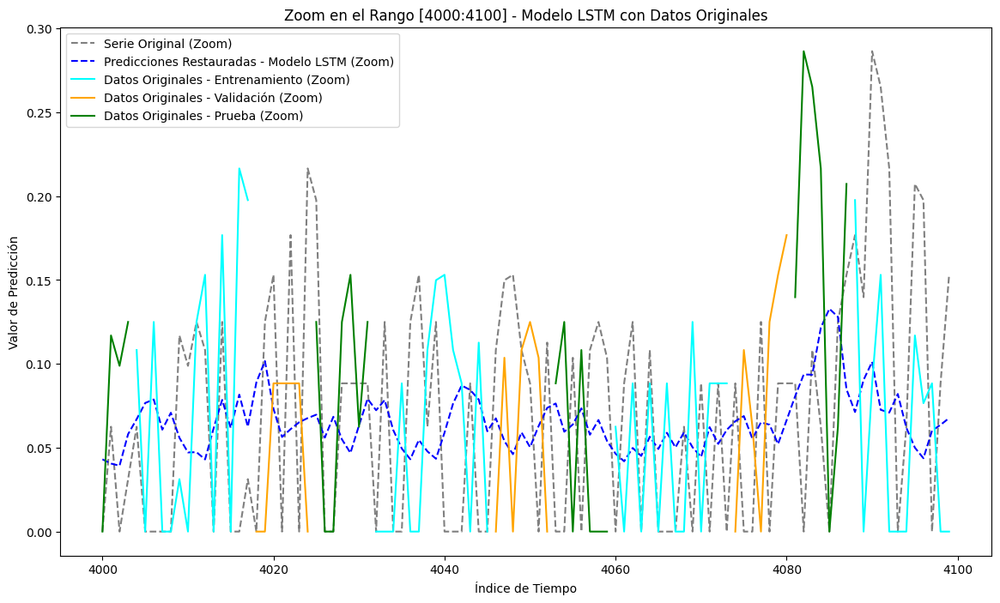

In [499]:
reconstructed_predictions = desplegar_predicciones_y_datos_originales(predictions_multivariate_volatility_scaled, 
                                                                  original_series=df_volatility_scaled, 
                                                                  window_size_train=14, 
                                                                  window_size_val=7, 
                                                                  window_size_test=7, 
                                                                  num_ventanas=2, 
                                                                  original_length=4992,
                                                                  modelo='RNN',
                                                                  zoom_range=(4000, 4100),trainY_matrices=trainY_matrices,valY_matrices=valY_matrices,testY_matrices=testY_matrices)  # Definir el rango de zoom aquí


reconstructed_predictions = desplegar_predicciones_y_datos_originales(predictions_multivariate_volatility_scaled, 
                                                                  original_series=df_volatility_scaled, 
                                                                  window_size_train=14, 
                                                                  window_size_val=7, 
                                                                  window_size_test=7, 
                                                                  num_ventanas=2, 
                                                                  original_length=4992,
                                                                  modelo='MLP',
                                                                  zoom_range=(4000 , 4100),trainY_matrices=trainY_matrices,valY_matrices=valY_matrices,testY_matrices=testY_matrices)  # Definir el rango de zoom aquí


reconstructed_predictions = desplegar_predicciones_y_datos_originales(predictions_multivariate_volatility_scaled, 
                                                                  original_series=df_volatility_scaled, 
                                                                  window_size_train=14, 
                                                                  window_size_val=7, 
                                                                  window_size_test=7, 
                                                                  num_ventanas=2, 
                                                                  original_length=4992,
                                                                  modelo='LSTM',
                                                                  zoom_range=(4000 , 4100),trainY_matrices=trainY_matrices,valY_matrices=valY_matrices,testY_matrices=testY_matrices)  # Definir el rango de zoom aquí



Siguiendo el proceso inverso del plegado inicial se despliega la serie y se vuelve a colocar en los valores iniciales. Se hace zoom, en un segmento de la serie en particular para ver la diferencia en la forma de predicción entre modelos. 

Se particulariza la ventana de tamaño 7 para los 3 modelos, con el fin de disminuir la cantidad de gráficas desplegadas. Se visualiza la forma en la que fueron segmentados los datos, para ser utilizados en el entrenamiento de tau periodos.  